In [1]:
! pip install -U backtrader

Requirement already up-to-date: backtrader in c:\users\meowe\anaconda3\envs\tensorflow\lib\site-packages (1.9.74.123)


In [ ]:
! pip install -U chainerrl

In [230]:
# Agent
import chainer
import chainerrl

In [231]:
# Strategy

from datetime import datetime
import backtrader
import random

# Integrate Model
import sys
import warnings
import numpy
import pandas
warnings.filterwarnings('ignore')
# Build Instance and draw single plot
#為了將GUI圖形顯示在 Jupyter notebook 
%matplotlib inline
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import Axes3D
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot

In [232]:
obs_size = 1500
n_actions = 3

# Instance of Value function Q from "chainerrl.q_functions.FCStateQFunctionWithDiscreteAction"
I_Am_Q_Function = chainerrl.q_functions.FCStateQFunctionWithDiscreteAction(obs_size, n_actions,n_hidden_layers=7, n_hidden_channels=512)

In [233]:
# Instance of training optimizer from chainer.optimizers
optimizer = chainer.optimizers.Adam(eps=1e-2)
# set the oprimizer 
optimizer.setup(I_Am_Q_Function)

In [234]:
# Set the discount factor that discounts future rewards.
gamma = 0.95

# Use epsilon-greedy for exploration
def Im_RandomInterger_Function(Interger_Range_Start=0 ,Interger_Range_End=2):
    
    return random.randint(Interger_Range_Start, Interger_Range_End)
    

explorer = chainerrl.explorers.ConstantEpsilonGreedy(epsilon=0.3, random_action_func=Im_RandomInterger_Function)

# DQN uses Experience Replay.
# Specify a replay buffer and its capacity.
replay_buffer = chainerrl.replay_buffer.ReplayBuffer(capacity=10 ** 6)

# Since observations from CartPole-v0 is numpy.float64 while
# Chainer only accepts numpy.float32 by default, specify
# a converter as a feature extractor function phi.
phi = lambda x: x.astype(numpy.float32, copy=False)

# Now create an agent that will interact with the environment.
I_am_DQN_Agent = chainerrl.agents.DoubleDQN(
    I_Am_Q_Function, optimizer, replay_buffer, gamma, explorer,
    replay_start_size=500, update_interval=1,
    target_update_interval=100, phi=phi)

In [235]:
def Function_For_Build_Customize_Object(Parameter1, Parameter2):
    
    class Customize_Object(backtrader.Strategy):
        
        
        def __init__(self):
    
            self.data_open = self.datas[0].open
            self.data_high = self.datas[0].high
            self.data_low = self.datas[0].low
            self.data_close = self.datas[0].close
            self.data_volume = self.datas[0].volume
        
            self.FeatureData_PeriodRange_Start = 0
            self.FeatureData_PeriodRange_End = -300
            
            self.Position_Value = 10000
            self.Observation_State = None
            self.Step_Reward = 0        
            self.Empirical_Reward = 0                
    
    
            
        def next(self):
            
            def Function_Make_FeatureDataSet(From_Period, To_Period) :
                
                Im_Feature_DataSet = []
                
                for TimeSequence in range( From_Period, To_Period, -1) :
                    
                    Im_Feature_DataSet.append(self.data_open[TimeSequence])
                    Im_Feature_DataSet.append(self.data_high[TimeSequence])
                    Im_Feature_DataSet.append(self.data_low[TimeSequence])
                    Im_Feature_DataSet.append(self.data_close[TimeSequence])
                    Im_Feature_DataSet.append(self.data_volume[TimeSequence])
    
                return Im_Feature_DataSet            
            
################################################################################################            
#                                      Space for Customize Strategy   
################################################################################################           


            Im_Current_Feature_DataSet = numpy.reshape(
                Function_Make_FeatureDataSet(0, self.FeatureData_PeriodRange_End - self.FeatureData_PeriodRange_Start),
                (1,1, 5*( self.FeatureData_PeriodRange_Start - self.FeatureData_PeriodRange_End) ))
            self.Observation_State = Im_Current_Feature_DataSet
            Im_Current_PositionDifference = self.broker.getvalue() - self.Position_Value
            self.Step_Reward = Im_Current_PositionDifference
            self.Empirical_Reward = self.Empirical_Reward + self.Step_Reward
            self.Position_Value = self.broker.getvalue()
            
            Action_Select = I_am_DQN_Agent.act_and_train(self.Observation_State , self.Step_Reward)
            
            
            print("============================================{}============================================".format(self.data.datetime.datetime()))
            if Action_Select == 0 :
                self.buy()
                print("Buying")                
            if Action_Select == 1 :
                self.sell()
                print("Selling")
            if Action_Select == 2 : 
                print("Holding")
            
        
            Pandas_Data = pandas.DataFrame({"Open Price": self.data_open[0],
                                    "High Price": self.data_high[0],
                                    "Low Price": self.data_low[0],
                                    "Close Price": self.data_close[0],
                                    "Volumns": self.data_volume[0],
                                    "Position": self.Position_Value,
                                    "Action": Action_Select,
                                    "Current Reward": Im_Current_PositionDifference,
                                    "Total Reward": self.Empirical_Reward},index=[0])
            
            Pannel_Data = Pandas_Data.sort_values(["Action","Current Reward","Total Reward","Position","Open Price","High Price","Low Price","Close Price","Volumns"])
            
            print(Pannel_Data) 
            
#            if (self.Trading_DateTime_End <= self.data.datetime.datetime()) :
#            
#                print("************************************************************************"*20)
#                print("Total Reward : ", self.Empirical_Reward, 'Sstatistics:', I_am_DQN_Agent.get_statistics())
#                I_am_DQN_Agent.stop_episode_and_train(self.Observation_State,  self.Step_Reward, True)     
#                print("************************************************************************"*20)            
        
################################################################################################            
#                                      Space for Customize Strategy   
################################################################################################            

    return Customize_Object
            

In [236]:
class Trading_Picture_Generator:


    # General
    Trading_Object_Name = ""
    Trading_Level_Multiplier = 1000
    
    Trading_DateTime_Start = datetime(2018,1,1)
    Trading_DateTime_End = datetime(2019,9,22)

    I_Am_Trading_Cerebro_Object = backtrader.Cerebro()
    
    # Parameter Performance Batch
    Parameter_Performance_Batch = []
    
    # Parameter for Customization Strategy
    Customization_Parameter1 = 10 
    Customization_Parameter2 = 20


    def __init__(
        self, 
        Trading_Object_Name_Input, 
        Trading_Level_Multiplier_Input, 
        Trading_DateTime_Start_Input, 
        Trading_DateTime_End_Input):

        self.Trading_Object_Name = Trading_Object_Name_Input
        self.Trading_Level_Multiplier = Trading_Level_Multiplier_Input

        self.Trading_DateTime_Start = Trading_DateTime_Start_Input
        self.Trading_DateTime_End = Trading_DateTime_End_Input


    def Function_RunTrading_Customize(self, Customization_Parameter1, Customization_Parameter2): 

        Cerebro_Object = backtrader.Cerebro()
        Cerebro_Object.broker.setcommission(mult=self.Trading_Level_Multiplier)
        Customize_StrategyObject = Function_For_Build_Customize_Object(Customization_Parameter1, Customization_Parameter2)
        Cerebro_Object.addstrategy(Customize_StrategyObject)

        Im_Data = backtrader.feeds.YahooFinanceData(
            dataname = self.Trading_Object_Name, 
            fromdate=self.Trading_DateTime_Start, 
            todate=self.Trading_DateTime_End)    

        Cerebro_Object.adddata(Im_Data)
        Cerebro_Object.broker.setcash(10000.0)
        Cerebro_Object.run()        
        
        self.Customization_Parameter1 = Customization_Parameter1
        self.Customization_Parameter2 = Customization_Parameter2                                            
        self.Trading_Cerebro_Object = Cerebro_Object


    def Function_Plotting_Customize(self) : 

    #    cerebro.plot()
        figure = matplotlib.pyplot.figure(figsize=(24.0, 15.0))
        figure = self.Trading_Cerebro_Object.plot()[0][0]
        figure.savefig('Trading_Plot/Customize/TradingCustomizeStratey_Object[{}]_Position[{}%]_Multiplier[{}].jpg'.format(
            self.Trading_Object_Name,
            self.Trading_Cerebro_Object.broker.getvalue()/100,
            self.Trading_Level_Multiplier))
        matplotlib.pyplot.close(figure)
        matplotlib.pyplot.close("all")
        
        
    def Function_Batch_MovingAverage(self, Trading_Object_Name_List, Trading_Level_Multiplier_List, Customization_Parameter1_Interval, Customization_Parameter2_Interval):

        try:

            for Specific_Trading_Object_Counter in range(len(Trading_Object_Name_List)):
                for Customization_Parameter1 in range(Customization_Parameter1_Interval[0],Customization_Parameter1_Interval[1]):
                    for Customization_Parameter2 in range(Customization_Parameter2_Interval[0] ,Customization_Parameter2_Interval[1]):

                        self.Trading_Object_Name = Trading_Object_Name_List[Specific_Trading_Object_Counter]
                        self.Trading_Level_Multiplier = Trading_Level_Multiplier_List[Specific_Trading_Object_Counter]
                        self.Function_RunTrading_Customize(Customization_Parameter1 , Customization_Parameter2)
                        self.Parameter_Performance_Batch.append([
                            self.Trading_Object_Name,
                            self.Trading_Cerebro_Object.broker.getvalue()/100,
                            self.Customization_Parameter1,
                            self.Customization_Parameter2])                                            
                        self.Function_Plotting_Customize()
                        
                    self.Function_Plotting_StrategyCombination()

        except:
            
            print(sys.exc_info())
            
            
    def Function_Plotting_StrategyCombination(self) :
        
        X_axsis = numpy.array([])
        Y_axsis = numpy.array([])
        Z_axsis = numpy.array([])
        for data in self.Parameter_Performance_Batch :
            Z_axsis = numpy.append( Z_axsis, data[1])
            Y_axsis = numpy.append( Y_axsis, data[2])
            X_axsis = numpy.append( X_axsis, data[3])
            
        print(X_axsis)        
        print(Y_axsis)
        print(Z_axsis)
        print(self.Parameter_Performance_Batch)        
        ParameterPerformance_Figure = matplotlib.pyplot.figure(figsize=(20,20))
        ax = ParameterPerformance_Figure.add_subplot(111,projection='3d')
        ax.scatter3D(X_axsis, Y_axsis, Z_axsis, c=Z_axsis, s=500, cmap='viridis')

        ParameterPerformance_Figure.savefig('Trading_Plot/Customize/TradingCustomizeStratey_Object[{}]_Parameter1[{}%]_Parameter2[{}].jpg'.format(
            self.Trading_Object_Name,
            self.Customization_Parameter1,
            self.Customization_Parameter2))        
        
        matplotlib.pyplot.show()
        matplotlib.pyplot.close(ParameterPerformance_Figure)
        matplotlib.pyplot.close("all")


In [237]:
# Customize
I_Am_Trading_Instance = Trading_Picture_Generator("TSM", 1000, datetime(2010,1,1), datetime(2020,1,1))

In [208]:
I_Am_Trading_Instance.Function_RunTrading_Customize("I_AM_Input1","I_AM_Input2")
I_Am_Trading_Instance.Function_Plotting_Customize()

============================================2017-01-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        26.15             0.0       26.33      25.93        26.1   

   Position  Total Reward    Volumns  
0   10000.0           0.0  7039303.0  
============================================2017-01-04 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        26.14             0.0       26.28      26.05       26.22   

   Position  Total Reward    Volumns  
0   10000.0           0.0  4922568.0  
============================================2017-01-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.59            0.24       26.68      26.34       26.35   

   Position

============================================2017-02-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        27.95           -4.93       28.08      27.76       28.08   

     Position  Total Reward    Volumns  
0  10181.1324      181.1324  5838082.0  
============================================2017-02-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        28.33            6.31       28.37       28.1        28.1   

     Position  Total Reward    Volumns  
0  10187.4424      187.4424  5130375.0  
============================================2017-02-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        28.84            9.21       28.99      28.22        28.3   

     

============================================2017-03-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        29.27            9.02       29.53      29.09        29.2   

     Position  Total Reward    Volumns  
0  10225.1224      225.1224  6612929.0  
============================================2017-03-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        29.59           13.12       29.67      29.25       29.31   

     Position  Total Reward    Volumns  
0  10238.2424      238.2424  6345718.0  
============================================2017-03-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        29.75            6.55       29.83      29.56       29.76   

    

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        30.27           27.58       30.33      29.95       29.95   

       Position  Total Reward    Volumns  
0  13548.388526   3548.388526  6713134.0  
============================================2017-05-03 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        30.59      1896.04494       30.59      30.19       30.23   

       Position  Total Reward    Volumns  
0  15444.433466   5444.433466  7465675.0  
============================================2017-05-04 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        30.46           -7.58        30.5      30.31        30.5   

       Position  Total Reward    Volumns  
0  15436.853466   5436.853466  6385845.0  
=================================

KeyboardInterrupt: 

============================================2010-01-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.19             0.0        8.26       8.11        8.12   

   Position  Total Reward     Volumns  
0   10000.0           0.0  11452747.0  
============================================2010-01-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.15            0.05        8.24        8.1         8.2   

   Position  Total Reward     Volumns  
0  10000.05          0.05  20335395.0  
============================================2010-01-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.12            0.03        8.21       8.04        8.17   

   Pos

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.11           -0.48        7.14       7.01        7.11   

       Position  Total Reward    Volumns  
0  11789.690136   1789.690136  7302885.0  
============================================2010-02-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.08       186.38058        7.13       7.01         7.1   

       Position  Total Reward     Volumns  
0  11976.070716   1976.070716  11394324.0  
============================================2010-02-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.07            0.18        7.13       7.06        7.09   

       Position  Total Reward     Volumns  
0  11976.250716   1976.250716  11914312.0  
===========================

============================================2010-03-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.37           -2.08        7.46       7.32        7.32   

       Position  Total Reward     Volumns  
0  12590.490413   2590.490413  27541669.0  
============================================2010-03-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.32            1.57        7.46        7.3        7.39   

       Position  Total Reward     Volumns  
0  12592.060413   2592.060413  18036192.0  
============================================2010-03-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.45           -4.06        7.45       7.35       

============================================2010-04-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.42            3.25         7.6       7.35        7.59   

       Position  Total Reward     Volumns  
0  11685.386786   1685.386786  27917087.0  
============================================2010-04-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.47           -2.27        7.49       7.39        7.45   

       Position  Total Reward     Volumns  
0  11683.116786   1683.116786  18420666.0  
============================================2010-04-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.49           -0.92        7.53       7.39       

============================================2010-06-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         6.96      408.188644        7.06       6.85        6.88   

      Position  Total Reward     Volumns  
0  12121.87543    2121.87543  30292263.0  
============================================2010-06-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.13          -10.81        7.13       6.93        7.03   

      Position  Total Reward     Volumns  
0  12111.06543    2111.06543  19603228.0  
============================================2010-06-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.01            7.82        7.17       6.96        7.1

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.41            -5.1        7.44       7.29        7.35   

       Position  Total Reward     Volumns  
0  13029.654171   3029.654171  18221077.0  
============================================2010-07-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.46            -4.3        7.48       7.35        7.41   

       Position  Total Reward    Volumns  
0  13025.354171   3025.354171  7056231.0  
============================================2010-07-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1          7.4            5.18        7.47        7.4        7.42   

       Position  Total Reward     Volumns  
0  13030.534171   3030.534171  10961749.0  
===========================

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.13      110.739077        7.27        7.1        7.17   

       Position  Total Reward     Volumns  
0  11735.787657   1735.787657  19381256.0  
============================================2010-08-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.18           -4.84        7.24       7.07        7.09   

       Position  Total Reward     Volumns  
0  11730.947657   1730.947657  10144055.0  
============================================2010-08-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.26           -7.71        7.29       7.15        7.23   

       Position  Total Reward     Volumns  
0  11723.237657   1723.237657  16782387.0  
=========================

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.33          -25.42        7.35       7.14        7.21   

       Position  Total Reward     Volumns  
0  12721.266323   2721.266323  40489236.0  
============================================2010-09-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.27            6.71        7.33       7.26        7.32   

       Position  Total Reward     Volumns  
0  12727.976323   2727.976323  17453887.0  
============================================2010-09-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.41          -15.82        7.42       7.24        7.27   

       Position  Total Reward     Volumns  
0  12712.156323   2712.156323  16752714.0  
=========================

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1          7.9          -10.31        7.99       7.87        7.99   

       Position  Total Reward     Volumns  
0  12159.948736   2159.948736  19208381.0  
============================================2010-10-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.01          -14.53        8.04       7.86        7.89   

       Position  Total Reward     Volumns  
0  12145.418736   2145.418736  17902955.0  
============================================2010-11-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2          8.0            1.33        8.08       7.97        8.01   

       Position  Total Reward    Volumns  
0  12146.748736   2146.748736  8528269.0  
===========================

============================================2010-12-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.48      -903.24364        8.51       8.24        8.24   

      Position  Total Reward     Volumns  
0  7333.666022  -2666.333978  37959112.0  
============================================2010-12-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.79          -43.36        8.82       8.48        8.52   

      Position  Total Reward     Volumns  
0  7290.306022  -2709.693978  31009056.0  
============================================2010-12-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.73            8.46        8.81       8.69        8.7

0  847.996889  -9152.003111  32583326.0  
============================================2011-01-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1          9.6    -1946.978927        9.62       9.46        9.48   

      Position  Total Reward     Volumns  
0 -1098.982038 -11098.982038  28032312.0  
============================================2011-01-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.71          -16.69        9.75       9.59        9.63   

      Position  Total Reward     Volumns  
0 -1115.672038 -11115.672038  22179410.0  
============================================2011-01-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.86     -235

============================================2011-02-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.43           28.69        9.52       9.36        9.49   

      Position  Total Reward     Volumns  
0 -3403.815249 -13403.815249  35870432.0  
============================================2011-02-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.51          -12.08        9.54       9.29        9.37   

      Position  Total Reward     Volumns  
0 -3415.895249 -13415.895249  15508681.0  
============================================2011-02-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.47            6.04        9.52       9.45        9.5

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.77          -21.14        8.85       8.73        8.73   

      Position  Total Reward     Volumns  
0 -3304.155249 -13304.155249  20697981.0  
============================================2011-03-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.68           13.59        8.77       8.67        8.76   

      Position  Total Reward     Volumns  
0 -3290.565249 -13290.565249  14769531.0  
============================================2011-03-23 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.84          -24.16        8.86       8.61        8.73   

      Position  Total Reward     Volumns  
0 -3314.725249 -13314.725249  24284830.0  
===============================

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.76          -80.03        9.81       9.29        9.43   

      Position  Total Reward     Volumns  
0 -3453.645249 -13453.645249  60538847.0  
============================================2011-04-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.85          -13.59         9.9       9.67        9.68   

      Position  Total Reward     Volumns  
0 -3467.235249 -13467.235249  43039924.0  
============================================2011-04-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.92          -10.57        9.92       9.79        9.83   

      Position  Total Reward     Volumns  
0 -3477.805249 -13477.805249  20924353.0  
===============================

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.02            6.04       10.12       9.98       10.04   

      Position  Total Reward     Volumns  
0 -3492.905249 -13492.905249  12566918.0  
============================================2011-06-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.05           -4.53       10.14       9.98       10.01   

      Position  Total Reward     Volumns  
0 -3497.435249 -13497.435249  14417242.0  
============================================2011-06-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         10.2          -22.65       10.32      10.12       10.13   

      Position  Total Reward     Volumns  
0 -3520.085249 -13520.085249  20040090.0  
===============================

============================================2011-07-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.66           16.61        9.68       9.45        9.68   

      Position  Total Reward     Volumns  
0 -3438.545249 -13438.545249  18245974.0  
============================================2011-07-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.47           28.69        9.62       9.45        9.55   

      Position  Total Reward     Volumns  
0 -3409.855249 -13409.855249  13374747.0  
============================================2011-07-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.37            15.1        9.44       9.28        9.4

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.47           49.83        8.72       8.46        8.67   

      Position  Total Reward     Volumns  
0 -3258.855249 -13258.855249  25323245.0  
============================================2011-08-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.82          -52.85        8.95       8.58        8.58   

      Position  Total Reward     Volumns  
0 -3311.705249 -13311.705249  22221013.0  
============================================2011-08-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.77            7.55        8.84       8.68        8.74   

      Position  Total Reward     Volumns  
0 -3304.155249 -13304.155249  11805079.0  
===============================

Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.05           16.61        9.13       8.89        9.06   

      Position  Total Reward     Volumns  
0 -3346.435249 -13346.435249  24622469.0  
============================================2011-09-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.27          -33.22        9.34       9.19        9.19   

      Position  Total Reward     Volumns  
0 -3379.655249 -13379.655249  20789806.0  
============================================2011-09-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1          9.5          -34.73        9.58       9.39        9.45   

      Position  Total Reward     Volumns  
0 -3414.385249 -13414.385249  20433213.0  
=======================

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.27           12.08        9.41       9.23        9.28   

      Position  Total Reward     Volumns  
0 -3379.655249 -13379.655249  11193908.0  
============================================2011-10-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.04           34.73        9.22       8.91         9.2   

      Position  Total Reward     Volumns  
0 -3344.925249 -13344.925249  17467733.0  
============================================2011-10-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.32          -42.28        9.34       9.16        9.16   

      Position  Total Reward    Volumns  
0 -3387.205249 -13387.205249  9443855.0  
=================================

============================================2011-11-30 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.89           -60.4        9.92       9.71        9.78   

      Position  Total Reward     Volumns  
0 -3473.275249 -13473.275249  24799716.0  
============================================2011-12-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.11          -33.22       10.16       9.91        9.91   

      Position  Total Reward     Volumns  
0 -3506.495249 -13506.495249  14681078.0  
============================================2011-12-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.04           10.57       10.23      10.02       10.14

Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.06           13.59       10.11       9.98       10.07   

      Position  Total Reward    Volumns  
0 -3498.945249 -13498.945249  9648405.0  
============================================2012-01-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.15          -13.59       10.17      10.06        10.1   

      Position  Total Reward     Volumns  
0 -3512.535249 -13512.535249  13461870.0  
============================================2012-01-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.07           12.08       10.16      10.02       10.16   

      Position  Total Reward     Volumns  
0 -3500.455249 -13500.455249  10156781.0  
===========================

============================================2012-02-08 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.86           -15.1       10.92      10.73       10.75   

      Position  Total Reward    Volumns  
0 -3619.745249 -13619.745249  9094576.0  
============================================2012-02-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.93          -10.57       10.96      10.77       10.87   

      Position  Total Reward     Volumns  
0 -3630.315249 -13630.315249  11887894.0  
============================================2012-02-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         10.6           49.83       10.79      10.56       10.78 

============================================2012-03-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        11.38          -54.36       11.38      11.14       11.18   

      Position  Total Reward    Volumns  
0 -3698.265249 -13698.265249  8952591.0  
============================================2012-03-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.34            6.04       11.57      11.33       11.43   

      Position  Total Reward    Volumns  
0 -3692.225249 -13692.225249  8676982.0  
============================================2012-03-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.44           -15.1        11.5      11.33       11.43   

Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        11.56             0.0       11.74      11.51       11.68   

      Position  Total Reward    Volumns  
0 -3725.445249 -13725.445249  8287341.0  
============================================2012-04-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.64          -12.08       11.68      11.49        11.6   

      Position  Total Reward     Volumns  
0 -3737.525249 -13737.525249  14477443.0  
============================================2012-04-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         11.7           -9.06       11.76      11.47       11.61   

      Position  Total Reward    Volumns  
0 -3746.585249 -13746.585249  7874190.0  
===========================

============================================2012-05-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.25           25.67       11.43      11.23       11.35   

      Position  Total Reward     Volumns  
0 -3678.635249 -13678.635249  14729149.0  
============================================2012-05-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.93           48.32       11.35      10.93       11.21   

      Position  Total Reward     Volumns  
0 -3630.315249 -13630.315249  16553655.0  
============================================2012-05-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.04          -16.61       11.09      10.98       11.0

============================================2012-06-20 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.82           -3.02       10.87      10.72       10.77   

      Position  Total Reward    Volumns  
0 -3613.705249 -13613.705249  7307820.0  
============================================2012-06-21 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         10.4           63.42       10.75      10.36       10.71   

      Position  Total Reward     Volumns  
0 -3550.285249 -13550.285249  16767087.0  
============================================2012-06-22 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.59          -28.69       10.63      10.47        10.5   


0 -3509.515249 -13509.515249  31110243.0  
============================================2012-07-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.24          -16.61       10.24       10.0       10.04   

      Position  Total Reward     Volumns  
0 -3526.125249 -13526.125249  23033806.0  
============================================2012-07-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.32          -12.08       10.43      10.19        10.2   

      Position  Total Reward     Volumns  
0 -3538.205249 -13538.205249  25117960.0  
============================================2012-07-26 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.59       

0 -3699.775249 -13699.775249  9720302.0  
============================================2012-08-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         11.4           -1.51       11.48      11.33       11.46   

      Position  Total Reward    Volumns  
0 -3701.285249 -13701.285249  8683334.0  
============================================2012-08-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.35            7.55       11.42      11.31       11.36   

      Position  Total Reward    Volumns  
0 -3693.735249 -13693.735249  7233062.0  
============================================2012-08-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.38           -4.5

============================================2012-09-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        12.54          -25.67       12.55      12.35       12.37   

      Position  Total Reward     Volumns  
0 -3873.425249 -13873.425249  23072653.0  
============================================2012-10-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        12.61          -10.57       12.64      12.45       12.47   

      Position  Total Reward     Volumns  
0 -3883.995249 -13883.995249  24481807.0  
============================================2012-10-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        12.69          -12.08       12.73      12.58       12.67

============================================2012-11-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        12.59          -13.59        12.6       12.5       12.56   

      Position  Total Reward     Volumns  
0 -3880.975249 -13880.975249  16504751.0  
============================================2012-11-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.84          -37.75       12.91      12.59        12.6   

      Position  Total Reward     Volumns  
0 -3918.725249 -13918.725249  11060468.0  
============================================2012-11-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.82            3.02       12.87      12.66       12.7

============================================2012-12-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.38           18.12       13.54      13.35       13.45   

      Position  Total Reward     Volumns  
0 -4000.265249 -14000.265249  10106739.0  
============================================2012-12-11 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.63          -37.75       13.69      13.57       13.59   

      Position  Total Reward     Volumns  
0 -4038.015249 -14038.015249  13324853.0  
============================================2012-12-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.53            15.1       13.67       13.5       13.67 

============================================2013-01-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.18            15.1       14.22      14.09       14.18   

      Position  Total Reward     Volumns  
0 -4121.065249 -14121.065249  15216167.0  
============================================2013-01-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.11           10.57       14.15      14.07       14.08   

      Position  Total Reward     Volumns  
0 -4110.495249 -14110.495249  11321414.0  
============================================2013-01-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.48          -55.87       14.55      14.26       14.3

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        15.18          -73.99       15.19      14.76        14.8   

      Position  Total Reward     Volumns  
0 -4272.065249 -14272.065249  13986109.0  
============================================2013-02-20 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.98            30.2       15.26      14.95       15.22   

      Position  Total Reward     Volumns  
0 -4241.865249 -14241.865249  11666356.0  
============================================2013-02-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.82           24.16       14.99      14.77       14.94   

      Position  Total Reward    Volumns  
0 -4217.705249 -14217.705249  8889162.0  
==================================

============================================2013-03-22 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.53          -21.14       13.55      13.38       13.41   

      Position  Total Reward    Volumns  
0 -4022.915249 -14022.915249  7387815.0  
============================================2013-03-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.44           13.59       13.65      13.42        13.6   

      Position  Total Reward     Volumns  
0 -4009.325249 -14009.325249  10762319.0  
============================================2013-03-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.53          -13.59       13.57      13.44       13.47  

============================================2013-04-25 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.82           -30.2       14.82      14.64       14.67   

      Position  Total Reward     Volumns  
0 -4217.705249 -14217.705249  19228090.0  
============================================2013-04-26 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.69           19.63       14.91      14.66       14.83   

      Position  Total Reward    Volumns  
0 -4198.075249 -14198.075249  8864064.0  
============================================2013-04-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.93          -36.24       14.95      14.76       14.78   

============================================2013-05-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        15.26          -24.16        15.3      15.08       15.08   

      Position  Total Reward     Volumns  
0 -4284.145249 -14284.145249  16512949.0  
============================================2013-05-30 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        15.04           33.22       15.22      15.03       15.21   

      Position  Total Reward     Volumns  
0 -4250.925249 -14250.925249  10328838.0  
============================================2013-05-31 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         14.8           36.24        15.0      14.77        15.0

============================================2013-07-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.67           -6.04       14.95      14.65       14.79   

      Position  Total Reward     Volumns  
0 -4195.055249 -14195.055249  15736421.0  
============================================2013-07-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.77           -15.1        14.8      14.61       14.69   

      Position  Total Reward    Volumns  
0 -4210.155249 -14210.155249  8156827.0  
============================================2013-07-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.84          -10.57       15.11       14.8       15.06   

============================================2013-08-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.71           -3.02       13.74      13.54       13.64   

      Position  Total Reward    Volumns  
0 -4050.095249 -14050.095249  8959037.0  
============================================2013-08-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.52           28.69        13.7       13.5       13.58   

      Position  Total Reward     Volumns  
0 -4021.405249 -14021.405249  16528132.0  
============================================2013-08-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.18           51.34       13.37      13.13       13.37 

============================================2013-09-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.86           21.14       14.09      13.85       14.04   

      Position  Total Reward    Volumns  
0 -4072.745249 -14072.745249  7776703.0  
============================================2013-09-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         14.1          -36.24       14.13      13.93       13.94   

      Position  Total Reward     Volumns  
0 -4108.985249 -14108.985249  11822478.0  
============================================2013-09-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.25          -22.65        14.3      14.13        14.3  

============================================2013-10-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         14.4          -49.83        14.4       14.2       14.21   

      Position  Total Reward     Volumns  
0 -4154.285249 -14154.285249  13123340.0  
============================================2013-10-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.74          -51.34       14.77      14.53       14.59   

      Position  Total Reward     Volumns  
0 -4205.625249 -14205.625249  14465183.0  
============================================2013-10-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.68            9.06        14.7      14.55        14.

============================================2013-11-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.52          -10.57       14.52      14.35       14.39   

      Position  Total Reward     Volumns  
0 -4172.405249 -14172.405249  10517322.0  
============================================2013-11-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.35           25.67       14.47      14.15       14.26   

      Position  Total Reward     Volumns  
0 -4146.735249 -14146.735249  15800403.0  
============================================2013-11-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.26           13.59       14.38      14.25       14.3

============================================2013-12-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.94           -3.02       14.05      13.94       13.94   

      Position  Total Reward    Volumns  
0 -4084.825249 -14084.825249  8809589.0  
============================================2013-12-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.92            3.02        14.1      13.91       14.09   

      Position  Total Reward     Volumns  
0 -4081.805249 -14081.805249  30139081.0  
============================================2013-12-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.85           10.57        13.9      13.59       13.86 

============================================2014-01-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.42            9.06       14.53      14.36       14.48   

      Position  Total Reward     Volumns  
0 -4157.305249 -14157.305249  10271803.0  
============================================2014-01-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.64          -33.22       14.65      14.44       14.48   

      Position  Total Reward     Volumns  
0 -4190.525249 -14190.525249  15792304.0  
============================================2014-01-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.43           31.71       14.62      14.35       14.51

============================================2014-02-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.42            6.04        14.5      14.38       14.43   

      Position  Total Reward    Volumns  
0 -4157.305249 -14157.305249  6747500.0  
============================================2014-02-25 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.36            9.06       14.44      14.34       14.38   

      Position  Total Reward    Volumns  
0 -4148.245249 -14148.245249  7294126.0  
============================================2014-02-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.53          -25.67       14.56      14.36       14.38   


============================================2014-03-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        15.83          -40.77       15.89      15.48       15.48   

      Position  Total Reward     Volumns  
0 -4370.215249 -14370.215249  17450590.0  
============================================2014-03-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.01          -27.18       16.22      15.85       15.85   

      Position  Total Reward     Volumns  
0 -4397.395249 -14397.395249  13799295.0  
============================================2014-03-31 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.32          -46.81       16.33      16.08       16.09

============================================2014-04-30 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        16.38             0.0       16.38      16.14       16.27   

      Position  Total Reward     Volumns  
0 -4453.265249 -14453.265249  15908865.0  
============================================2014-05-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        16.11           40.77       16.39       16.1       16.37   

      Position  Total Reward     Volumns  
0 -4412.495249 -14412.495249  12609106.0  
============================================2014-05-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        15.99           18.12       16.14      15.99        16.1  

============================================2014-06-03 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.31          -70.97       17.36      16.81       16.87   

      Position  Total Reward     Volumns  
0 -4593.695249 -14593.695249  24682385.0  
============================================2014-06-04 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         17.2           16.61       17.33      17.18       17.29   

      Position  Total Reward     Volumns  
0 -4577.085249 -14577.085249  13360395.0  
============================================2014-06-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.28          -12.08       17.29      17.16       17.21 

============================================2014-07-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.48            4.53       18.65      18.44        18.6   

      Position  Total Reward     Volumns  
0 -4770.365249 -14770.365249  15203345.0  
============================================2014-07-08 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.39           13.59       18.48       18.3       18.43   

      Position  Total Reward     Volumns  
0 -4756.775249 -14756.775249  12661377.0  
============================================2014-07-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.27           18.12       18.33       18.2        18.

============================================2014-08-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.59           16.61       16.86      16.56       16.75   

      Position  Total Reward     Volumns  
0 -4484.975249 -14484.975249  10385301.0  
============================================2014-08-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.49            15.1       16.69      16.43       16.64   

      Position  Total Reward     Volumns  
0 -4469.875249 -14469.875249  23742242.0  
============================================2014-08-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.71          -33.22       16.81      16.67       16.6

============================================2014-09-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.41           16.61       17.45      17.28       17.36   

      Position  Total Reward    Volumns  
0 -4608.795249 -14608.795249  8867861.0  
============================================2014-09-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.95           69.46        17.3       16.9       17.28   

      Position  Total Reward     Volumns  
0 -4539.335249 -14539.335249  18165607.0  
============================================2014-09-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.86           13.59       17.06      16.86       17.06 

============================================2014-10-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.78          -58.89       16.98      16.54       16.57   

      Position  Total Reward     Volumns  
0 -4513.665249 -14513.665249  25558633.0  
============================================2014-10-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.72            9.06       16.87      16.21       16.43   

      Position  Total Reward     Volumns  
0 -4504.605249 -14504.605249  24915121.0  
============================================2014-10-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.26          -81.54       17.57      16.82       16.8

============================================2014-11-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.26            60.4        18.5      18.15       18.47   

      Position  Total Reward     Volumns  
0 -4737.145249 -14737.145249  19573956.0  
============================================2014-11-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.37          -16.61       18.42      18.08       18.13   

      Position  Total Reward     Volumns  
0 -4753.755249 -14753.755249  16018100.0  
============================================2014-11-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.77           -60.4       18.86      18.53       18.6

0 -4722.045249 -14722.045249  12967257.0  
============================================2014-12-19 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         18.5          -51.34       18.79      18.32       18.74   

      Position  Total Reward     Volumns  
0 -4773.385249 -14773.385249  14051092.0  
============================================2014-12-22 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        18.64          -21.14       18.81      18.51       18.56   

      Position  Total Reward    Volumns  
0 -4794.525249 -14794.525249  5658240.0  
============================================2014-12-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.51          

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.13          -21.14       20.16      19.91       19.96   

      Position  Total Reward     Volumns  
0 -5019.515249 -15019.515249  16911474.0  
============================================2015-01-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.16           -4.53       20.21      19.96       20.11   

      Position  Total Reward     Volumns  
0 -5024.045249 -15024.045249  17684235.0  
============================================2015-01-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.94           33.22       20.41      19.87       20.36   

      Position  Total Reward     Volumns  
0 -4990.825249 -14990.825249  20117611.0  
===============================

============================================2015-02-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.44           18.12       20.65      20.39       20.62   

      Position  Total Reward     Volumns  
0 -5066.325249 -15066.325249  10250287.0  
============================================2015-03-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.52          -12.08       20.52      20.33       20.33   

      Position  Total Reward    Volumns  
0 -5078.405249 -15078.405249  8498342.0  
============================================2015-03-03 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.41           16.61       20.61      20.33       20.59   

============================================2015-04-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.36            30.2       19.56      19.28       19.52   

      Position  Total Reward     Volumns  
0 -4903.245249 -14903.245249  15979456.0  
============================================2015-04-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.74          -57.38       19.86      19.65       19.68   

      Position  Total Reward     Volumns  
0 -4960.625249 -14960.625249  14933784.0  
============================================2015-04-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.61           19.63       19.78      19.32       19.3

============================================2015-05-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.24            3.02       20.37      20.14       20.16   

      Position  Total Reward     Volumns  
0 -5036.125249 -15036.125249  15881286.0  
============================================2015-05-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.37          -19.63       20.42      20.21       20.31   

      Position  Total Reward    Volumns  
0 -5055.755249 -15055.755249  9963697.0  
============================================2015-05-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.31            9.06       20.34      20.19       20.29  

============================================2015-06-08 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.87           27.18        19.1      18.83       19.06   

      Position  Total Reward     Volumns  
0 -4829.255249 -14829.255249  10988246.0  
============================================2015-06-09 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.02          -22.65       19.25      18.92       19.06   

      Position  Total Reward     Volumns  
0 -4851.905249 -14851.905249  16856866.0  
============================================2015-06-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.44          -63.42       19.45      19.16       19.21

============================================2015-07-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         19.4           -45.3       19.49       19.2        19.2   

      Position  Total Reward     Volumns  
0 -4909.285249 -14909.285249  10520298.0  
============================================2015-07-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.65          -37.75       19.67      19.39        19.5   

      Position  Total Reward     Volumns  
0 -4947.035249 -14947.035249  13380671.0  
============================================2015-07-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         19.6            7.55       19.68       19.5       19.5

============================================2015-08-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.84            9.06       17.86      17.35       17.65   

      Position  Total Reward     Volumns  
0 -4673.725249 -14673.725249  24381806.0  
============================================2015-08-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.65           28.69       17.78      17.54       17.66   

      Position  Total Reward    Volumns  
0 -4645.035249 -14645.035249  9160032.0  
============================================2015-08-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.52           19.63       17.53      17.38       17.51  

============================================2015-09-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.53           -45.3       17.67      17.23       17.33   

      Position  Total Reward     Volumns  
0 -4626.915249 -14626.915249  13344137.0  
============================================2015-09-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.77          -36.24       17.84      17.59        17.8   

      Position  Total Reward     Volumns  
0 -4663.155249 -14663.155249  13345650.0  
============================================2015-09-17 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.76            1.51       18.07      17.68       17.69  

============================================2015-10-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.05          -27.18        19.1       18.9       18.92   

      Position  Total Reward     Volumns  
0 -4856.435249 -14856.435249  11167272.0  
============================================2015-10-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.11           -9.06       19.17      18.88       18.98   

      Position  Total Reward     Volumns  
0 -4865.495249 -14865.495249  10401978.0  
============================================2015-10-20 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.18          -10.57       19.27      19.06       19.08  

============================================2015-11-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.36             0.0       19.39      19.04       19.24   

      Position  Total Reward    Volumns  
0 -4903.245249 -14903.245249  9319419.0  
============================================2015-11-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.49          -19.63       19.72      19.42       19.72   

      Position  Total Reward    Volumns  
0 -4922.875249 -14922.875249  8277815.0  
============================================2015-11-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.62          -19.63       19.67      19.52       19.61   

============================================2015-12-22 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.82          -13.59       19.85      19.73       19.75   

      Position  Total Reward    Volumns  
0 -4972.705249 -14972.705249  5298076.0  
============================================2015-12-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.84           -3.02       19.95      19.74       19.94   

      Position  Total Reward    Volumns  
0 -4975.725249 -14975.725249  7181645.0  
============================================2015-12-24 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         19.9           -9.06       20.01      19.84        19.9   



============================================2016-01-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        18.63          -10.57       18.91      18.57       18.67   

      Position  Total Reward    Volumns  
0 -4793.015249 -14793.015249  7484016.0  
============================================2016-01-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        18.59            6.04        18.8      18.46       18.72   

      Position  Total Reward    Volumns  
0 -4786.975249 -14786.975249  8340523.0  
============================================2016-01-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.21          -93.62       19.25       18.8        18.8   

 

============================================2016-03-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        21.13         -134.39       21.21      20.62       20.76   

      Position  Total Reward     Volumns  
0 -5170.515249 -15170.515249  11469877.0  
============================================2016-03-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        21.16           -4.53       21.23      20.96       21.02   

      Position  Total Reward    Volumns  
0 -5175.045249 -15175.045249  6795856.0  
============================================2016-03-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        21.11            7.55       21.38      21.02       21.17 

============================================2016-04-04 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        22.22           34.73       22.46      22.18       22.46   

      Position  Total Reward    Volumns  
0 -5335.105249 -15335.105249  5005826.0  
============================================2016-04-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        21.93           43.79       22.03      21.69       21.93   

      Position  Total Reward     Volumns  
0 -5291.315249 -15291.315249  10020029.0  
============================================2016-04-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        22.02          -13.59       22.12      21.51       21.62   


============================================2016-05-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         20.2          -10.57       20.36      20.11       20.16   

      Position  Total Reward    Volumns  
0 -5030.085249 -15030.085249  8421264.0  
============================================2016-05-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.12           12.08       20.29      20.06        20.2   

      Position  Total Reward    Volumns  
0 -5018.005249 -15018.005249  6251379.0  
============================================2016-05-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.09            4.53       20.19      19.94       20.11   

============================================2016-06-08 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        22.63          -34.73       22.85       22.6       22.79   

      Position  Total Reward    Volumns  
0 -5397.015249 -15397.015249  7182459.0  
============================================2016-06-09 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        22.55           12.08       22.56      22.27       22.27   

      Position  Total Reward    Volumns  
0 -5384.935249 -15384.935249  6701387.0  
============================================2016-06-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        22.23           48.32       22.32      21.95       22.26   


============================================2016-07-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        24.06           31.71       24.35      23.95       24.27   

      Position  Total Reward    Volumns  
0 -5612.945249 -15612.945249  9570640.0  
============================================2016-07-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        23.99           10.57        24.1      23.87       24.02   

      Position  Total Reward     Volumns  
0 -5602.375249 -15602.375249  11828713.0  
============================================2016-07-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        24.19           -30.2       24.29      23.77       24.09 

============================================2016-08-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.09          -13.59       26.11      25.93       26.02   

      Position  Total Reward    Volumns  
0 -5919.475249 -15919.475249  3902591.0  
============================================2016-08-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.22          -19.63       26.27      26.15       26.21   

      Position  Total Reward    Volumns  
0 -5939.105249 -15939.105249  3572163.0  
============================================2016-08-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        25.94           42.28       26.05      25.86       26.02   

============================================2016-09-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.03           -75.5       26.11      25.53       25.53   

      Position  Total Reward    Volumns  
0 -5910.415249 -15910.415249  7067099.0  
============================================2016-09-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        25.79           36.24       26.07      25.67       25.99   

      Position  Total Reward    Volumns  
0 -5874.175249 -15874.175249  8215079.0  
============================================2016-09-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         26.7         -137.41       26.87      26.65       26.68   


============================================2016-10-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        27.53          -39.26       27.64      27.38       27.58   

      Position  Total Reward    Volumns  
0 -6136.915249 -16136.915249  6150689.0  
============================================2016-10-19 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        27.64          -16.61       27.69      27.35       27.61   

      Position  Total Reward    Volumns  
0 -6153.525249 -16153.525249  7546713.0  
============================================2016-10-20 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        27.71          -10.57       27.79      27.48        27.6   


   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.29             0.0       26.38      26.04       26.26   

      Position  Total Reward    Volumns  
0 -5949.675249 -15949.675249  5757381.0  
============================================2016-11-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        26.45          -24.16       26.53      26.28       26.41   

      Position  Total Reward    Volumns  
0 -5973.835249 -15973.835249  5018178.0  
============================================2016-11-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        26.68          -34.73        26.9      26.56       26.74   

      Position  Total Reward     Volumns  
0 -6008.565249 -16008.565249  10017637.0  
===================================

============================================2016-12-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        25.64           54.36       25.87      25.43       25.86   

      Position  Total Reward    Volumns  
0 -5851.525249 -15851.525249  8356980.0  
============================================2016-12-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        25.92          -42.28       25.99       25.6       25.68   

      Position  Total Reward    Volumns  
0 -5893.805249 -15893.805249  5440067.0  
============================================2016-12-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        25.96           -6.04       26.08      25.87       25.87   


============================================2017-01-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.88          -18.12       27.97      27.66       27.81   

      Position  Total Reward    Volumns  
0 -6189.765249 -16189.765249  6705175.0  
============================================2017-01-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.83            7.55       27.84       27.6       27.72   

      Position  Total Reward    Volumns  
0 -6182.215249 -16182.215249  8129670.0  
============================================2017-01-31 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.58           37.75        27.8      27.42       27.69   

============================================2017-03-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        27.54           95.13       27.87      27.47       27.83   

      Position  Total Reward    Volumns  
0 -6138.425249 -16138.425249  9595747.0  
============================================2017-03-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        27.52            3.02       27.59      27.25       27.54   

      Position  Total Reward    Volumns  
0 -6135.405249 -16135.405249  6860414.0  
============================================2017-03-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        27.52             0.0        27.6       27.4       27.48   

============================================2017-04-04 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        29.32            3.02        29.4      29.24       29.26   

      Position  Total Reward    Volumns  
0 -6407.205249 -16407.205249  4210602.0  
============================================2017-04-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        29.35           -4.53       29.74      29.33        29.5   

      Position  Total Reward    Volumns  
0 -6411.735249 -16411.735249  5730817.0  
============================================2017-04-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        29.32            4.53       29.39       29.2       29.33   



============================================2017-05-08 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        31.21           -75.5       31.32       30.9       30.96   

      Position  Total Reward    Volumns  
0 -6692.595249 -16692.595249  7741629.0  
============================================2017-05-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        31.59          -57.38       31.64      31.34       31.34   

      Position  Total Reward    Volumns  
0 -6749.975249 -16749.975249  8179884.0  
============================================2017-05-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        31.59             0.0       31.79       31.3       31.47   



============================================2017-06-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        31.93          140.43       32.74       31.4       32.64   

      Position  Total Reward     Volumns  
0 -6801.315249 -16801.315249  13495200.0  
============================================2017-06-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        31.44           73.99       31.93      31.24       31.93   

      Position  Total Reward     Volumns  
0 -6727.325249 -16727.325249  12393288.0  
============================================2017-06-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        31.73          -43.79       31.75      31.45       31.64

============================================2017-07-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         33.3          -63.42       33.31      32.67       32.67   

      Position  Total Reward     Volumns  
0 -7008.185249 -17008.185249  10793872.0  
============================================2017-07-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         33.4           -15.1       33.49      33.15       33.28   

      Position  Total Reward    Volumns  
0 -7023.285249 -17023.285249  7811741.0  
============================================2017-07-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        33.08           48.32       33.22      32.83       33.19  

============================================2017-08-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        33.55          -51.34       33.62      33.25       33.34   

      Position  Total Reward    Volumns  
0 -7045.935249 -17045.935249  4146956.0  
============================================2017-08-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        33.48           10.57       33.57      33.29       33.35   

      Position  Total Reward    Volumns  
0 -7035.365249 -17035.365249  3508260.0  
============================================2017-08-17 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        32.97           77.01       33.48      32.95       33.44   

 

============================================2017-09-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        35.07          -57.38       35.12      34.85       34.89   

      Position  Total Reward    Volumns  
0 -7275.455249 -17275.455249  6707811.0  
============================================2017-09-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        35.28          -31.71        35.4      35.13       35.17   

      Position  Total Reward    Volumns  
0 -7307.165249 -17307.165249  7120075.0  
============================================2017-09-20 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        34.84           66.44       35.37      34.49       35.34   



============================================2017-10-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        37.84           58.89       38.04      37.31       37.79   

      Position  Total Reward    Volumns  
0 -7693.725249 -17693.725249  6198615.0  
============================================2017-10-20 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        37.88           -6.04       37.88      37.61       37.79   

      Position  Total Reward    Volumns  
0 -7699.765249 -17699.765249  5700489.0  
============================================2017-10-23 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        37.96          -12.08       38.21      37.87       38.11   



============================================2017-11-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.23          -51.34       39.49       39.2       39.26   

      Position  Total Reward    Volumns  
0 -7903.615249 -17903.615249  3982071.0  
============================================2017-11-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.07           24.16       39.37      38.96       39.24   

      Position  Total Reward    Volumns  
0 -7879.455249 -17879.455249  3005251.0  
============================================2017-11-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         39.6          -80.03       39.63      39.25       39.31   

============================================2017-12-26 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        35.88           95.13       36.21      35.75       36.21   

      Position  Total Reward    Volumns  
0 -7397.765249 -17397.765249  3106091.0  
============================================2017-12-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         36.0          -18.12       36.03      35.82       35.93   

      Position  Total Reward    Volumns  
0 -7415.885249 -17415.885249  3357271.0  
============================================2017-12-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.61          -92.11       36.75       36.3        36.4   

 

============================================2018-01-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        41.35           70.97       41.48       40.9       41.06   

      Position  Total Reward     Volumns  
0 -8223.735249 -18223.735249  11098564.0  
============================================2018-01-31 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        41.74          -58.89       42.19      41.57       41.85   

      Position  Total Reward    Volumns  
0 -8282.625249 -18282.625249  6874649.0  
============================================2018-02-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        41.87          -19.63       42.31      41.73       41.76 

============================================2018-03-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        40.07          -67.95       40.31      39.49       39.66   

      Position  Total Reward    Volumns  
0 -8030.455249 -18030.455249  6488111.0  
============================================2018-03-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        40.11           -6.04        40.9      40.01       40.85   

      Position  Total Reward    Volumns  
0 -8036.495249 -18036.495249  9369834.0  
============================================2018-03-07 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        40.72          -92.11       40.79      39.78        39.9   

 

============================================2018-04-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        39.08          125.33       39.77      38.93        39.5   

      Position  Total Reward    Volumns  
0 -7880.965249 -17880.965249  5571860.0  
============================================2018-04-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.68           -90.6       40.57      39.53        39.7   

      Position  Total Reward    Volumns  
0 -7971.565249 -17971.565249  7268786.0  
============================================2018-04-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        40.15          -70.97       40.74      39.64       40.42   


============================================2018-05-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.25          -24.16       36.35      36.08       36.27   

      Position  Total Reward    Volumns  
0 -7453.635249 -17453.635249  6362413.0  
============================================2018-05-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.64          -58.89       36.73      36.33       36.45   

      Position  Total Reward    Volumns  
0 -7512.525249 -17512.525249  8638114.0  
============================================2018-05-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.77          -19.63       37.02      36.52       36.89   

============================================2018-06-12 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.11           -60.4       36.26      35.91       36.05   

      Position  Total Reward    Volumns  
0 -7432.495249 -17432.495249  7145258.0  
============================================2018-06-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        35.97           21.14       36.75      35.97        36.6   

      Position  Total Reward     Volumns  
0 -7411.355249 -17411.355249  10438595.0  
============================================2018-06-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        35.56           61.91       35.99      35.56       35.96   


============================================2018-07-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        36.09           -3.02       36.18      35.95       36.17   

      Position  Total Reward    Volumns  
0 -7429.475249 -17429.475249  5653867.0  
============================================2018-07-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.33          -36.24        36.4      35.67       35.81   

      Position  Total Reward    Volumns  
0 -7465.715249 -17465.715249  6532754.0  
============================================2018-07-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        36.68          -52.85       36.74      36.17       36.33   

============================================2018-08-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        38.59            6.04        38.9      38.55       38.63   

      Position  Total Reward    Volumns  
0 -7806.975249 -17806.975249  5805496.0  
============================================2018-08-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        38.32           40.77       38.41       38.0       38.38   

      Position  Total Reward    Volumns  
0 -7766.205249 -17766.205249  8269691.0  
============================================2018-08-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        38.29            4.53       38.43       38.1       38.22   

============================================2018-09-19 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        42.04          -66.44       42.39      41.77       42.21   

      Position  Total Reward    Volumns  
0 -8327.925249 -18327.925249  6694751.0  
============================================2018-09-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        42.18          -21.14       42.43      41.92       42.26   

      Position  Total Reward    Volumns  
0 -8349.065249 -18349.065249  4951008.0  
============================================2018-09-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        42.08            15.1       42.41      42.04       42.26   

============================================2018-10-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        36.98          -39.26       37.46       36.8       37.42   

      Position  Total Reward    Volumns  
0 -7563.865249 -17563.865249  8550855.0  
============================================2018-10-23 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        36.29          104.19       36.46      35.58       35.73   

      Position  Total Reward     Volumns  
0 -7459.675249 -17459.675249  12932517.0  
============================================2018-10-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        34.84          218.95       35.87      34.79       35.87 

============================================2018-11-23 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        34.34            30.2       34.57      34.14       34.22   

      Position  Total Reward    Volumns  
0 -7165.225249 -17165.225249  2429952.0  
============================================2018-11-26 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        35.18         -126.84       35.23      34.83       35.06   

      Position  Total Reward    Volumns  
0 -7292.065249 -17292.065249  7411119.0  
============================================2018-11-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        35.14            6.04       35.16      34.75       34.75   

============================================2018-12-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        35.47          -52.85       35.98      35.35       35.46   

      Position  Total Reward    Volumns  
0 -7335.855249 -17335.855249  7716577.0  
============================================2018-12-31 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        35.25           33.22        35.9      35.11       35.74   

      Position  Total Reward    Volumns  
0 -7302.635249 -17302.635249  4817598.0  
============================================2019-01-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        34.88           55.87       35.09      34.38       34.57   



============================================2019-02-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        35.88            7.55       36.16      35.75       36.05   

      Position  Total Reward    Volumns  
0 -7397.765249 -17397.765249  6741978.0  
============================================2019-02-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.23          -52.85        36.3       35.7       35.81   

      Position  Total Reward    Volumns  
0 -7450.615249 -17450.615249  7627358.0  
============================================2019-02-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        36.53           -45.3       36.55      36.17       36.21   

============================================2019-03-07 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.89           22.65       37.13      36.64       37.02   

      Position  Total Reward    Volumns  
0 -7550.275249 -17550.275249  4430879.0  
============================================2019-03-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.48           61.91       36.65      36.23       36.24   

      Position  Total Reward    Volumns  
0 -7488.365249 -17488.365249  5305159.0  
============================================2019-03-11 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         36.9          -63.42       36.95      36.48       36.51   



============================================2019-04-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        40.31           25.67       40.39      40.14       40.34   

      Position  Total Reward    Volumns  
0 -8066.695249 -18066.695249  5288091.0  
============================================2019-04-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        40.46          -22.65       40.59      40.28       40.36   

      Position  Total Reward    Volumns  
0 -8089.345249 -18089.345249  4230766.0  
============================================2019-04-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         40.2           39.26        40.3      40.06       40.19   

============================================2019-05-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        39.14          265.76       39.64       38.9       39.51   

      Position  Total Reward     Volumns  
0 -7890.025249 -17890.025249  11567012.0  
============================================2019-05-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        40.08         -141.94       40.18      39.54       39.72   

      Position  Total Reward    Volumns  
0 -8031.965249 -18031.965249  7443057.0  
============================================2019-05-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        40.08             0.0       40.42      39.59       39.68   


============================================2019-06-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        36.14          231.03       36.96      36.13       36.89   

      Position  Total Reward     Volumns  
0 -7437.025249 -17437.025249  11813619.0  
============================================2019-06-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        35.96           27.18       36.34      35.96       36.21   

      Position  Total Reward    Volumns  
0 -7409.845249 -17409.845249  6807322.0  
============================================2019-06-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        37.44         -223.48       37.64       36.5       36.55 

============================================2019-07-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        42.59         -232.54       42.63      41.72       41.93   

      Position  Total Reward     Volumns  
0 -8410.975249 -18410.975249  11421825.0  
============================================2019-07-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        43.22          -95.13        43.4      42.47       42.48   

      Position  Total Reward     Volumns  
0 -8506.105249 -18506.105249  11601133.0  
============================================2019-07-22 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        43.98         -114.76       44.25      43.51       43.58 

============================================2019-08-20 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        41.35          -22.65       41.63      41.14       41.41   

      Position  Total Reward    Volumns  
0 -8223.735249 -18223.735249  7647309.0  
============================================2019-08-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        41.98          -95.13       42.04       41.7       41.82   

      Position  Total Reward    Volumns  
0 -8318.865249 -18318.865249  3970154.0  
============================================2019-08-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        41.54           66.44        41.9      41.15        41.8   


============================================2019-09-23 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        43.76          -28.69       43.98      43.55       43.87   

      Position  Total Reward    Volumns  
0 -8587.645249 -18587.645249  4377367.0  
============================================2019-09-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        43.81           -7.55       44.24      43.75       44.09   

      Position  Total Reward    Volumns  
0 -8595.195249 -18595.195249  7645238.0  
============================================2019-09-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         44.7         -134.39       44.79      43.69       43.89   

============================================2019-10-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         50.6         -117.78        50.7      49.88       50.14   

      Position  Total Reward    Volumns  
0 -9620.485249 -19620.485249  7055547.0  
============================================2019-10-25 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        50.78          -27.18       50.87      50.34       50.45   

      Position  Total Reward    Volumns  
0 -9647.665249 -19647.665249  6347535.0  
============================================2019-10-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        50.95          -25.67       51.12       50.7       51.04   


   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        53.26           19.63       53.42      53.01       53.13   

       Position  Total Reward    Volumns  
0 -10022.145249 -20022.145249  5712429.0  
============================================2019-11-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        53.52          -39.26       53.68      53.17       53.66   

       Position  Total Reward    Volumns  
0 -10061.405249 -20061.405249  2805563.0  
============================================2019-11-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        52.72           120.8       52.79      52.43       52.69   

      Position  Total Reward    Volumns  
0 -9940.605249 -19940.605249  3415394.0  
==================================

============================================2019-12-31 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         58.1          -37.75       58.13      57.46       57.68   

       Position  Total Reward    Volumns  
0 -10752.985249 -20752.985249  2950200.0  


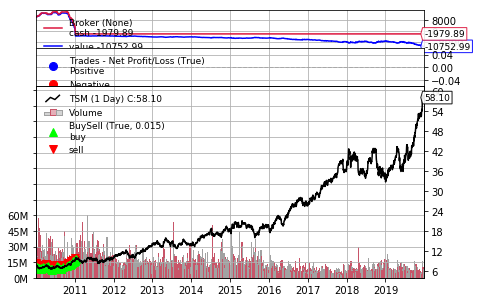

<Figure size 1728x1080 with 0 Axes>

============================================2010-01-04 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.19             0.0        8.26       8.11        8.12   

   Position  Total Reward     Volumns  
0   10000.0           0.0  11452747.0  
============================================2010-01-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.15           -0.05        8.24        8.1         8.2   

   Position  Total Reward     Volumns  
0   9999.95         -0.05  20335395.0  
============================================2010-01-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.12          -29.95        8.21       8.04        8.17   

   Posi

============================================2010-02-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         6.76            0.24        6.86       6.65        6.79   

       Position  Total Reward     Volumns  
0  11023.177143   1023.177143  47714116.0  
============================================2010-02-08 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.79           -0.02        6.89       6.67        6.86   

       Position  Total Reward     Volumns  
0  11023.157143   1023.157143  35608415.0  
============================================2010-02-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.79             0.0        6.94       6.75       

============================================2010-03-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.42           -0.76        7.42       7.28        7.32   

       Position  Total Reward     Volumns  
0  11230.565893   1230.565893  26509329.0  
============================================2010-03-12 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0          7.3            0.93        7.42       7.25        7.39   

       Position  Total Reward     Volumns  
0  11231.495893   1231.495893  17864324.0  
============================================2010-03-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.17      -86.776987        7.25       7.12        7

============================================2010-04-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.95     -221.657639        7.95       7.65        7.66   

       Position  Total Reward     Volumns  
0  10058.430557     58.430557  43351356.0  
============================================2010-04-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.87     -469.367639        7.95       7.83        7.91   

      Position  Total Reward     Volumns  
0  9589.062918   -410.937082  12976352.0  
============================================2010-04-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.67     -329.287639        7.78       7.56        7.77

============================================2010-05-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.05           -0.14        7.08       6.83        7.02   

   Position  Total Reward     Volumns  
0   9386.76       -613.24  18263933.0  
============================================2010-05-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.88            0.34        7.12       6.82        7.07   

   Position  Total Reward     Volumns  
0    9387.1        -612.9  22479429.0  
============================================2010-05-19 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.94           -0.12        7.01       6.83        6.89   

   Pos

============================================2010-06-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.21           -0.36        7.32        7.2        7.24   

     Position  Total Reward     Volumns  
0  11104.1875     1104.1875  12565711.0  
============================================2010-06-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.32            0.66        7.41       7.27        7.31   

     Position  Total Reward     Volumns  
0  11104.8475     1104.8475  21336474.0  
============================================2010-06-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.13           -1.14        7.37       7.12        7.31   

============================================2010-07-22 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.63             1.2        7.64       7.48        7.48   

       Position  Total Reward     Volumns  
0  13085.980625   3085.980625  18061674.0  
============================================2010-07-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.68            0.35        7.71       7.57        7.63   

       Position  Total Reward     Volumns  
0  13086.330625   3086.330625  12678809.0  
============================================2010-07-26 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.77            0.71        7.77        7.6        7.

============================================2010-08-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.01           -0.82         7.1       6.95        7.06   

       Position  Total Reward     Volumns  
0  10512.001846    512.001846  24294498.0  
============================================2010-08-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.96     -434.350231        7.01       6.85        6.96   

       Position  Total Reward     Volumns  
0  10077.651615     77.651615  16366668.0  
============================================2010-08-26 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.93           -0.21        6.98       6.91       

============================================2010-09-27 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.27           -0.06        7.33       7.26        7.32   

   Position  Total Reward     Volumns  
0   8770.18      -1229.82  17453887.0  
============================================2010-09-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.41            0.14        7.42       7.24        7.27   

   Position  Total Reward     Volumns  
0   8770.32      -1229.68  16752714.0  
============================================2010-09-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.55            0.27        7.61       7.41        7.42   

   Posit

============================================2010-10-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0          7.9             0.8        7.99       7.87        7.99   

      Position  Total Reward     Volumns  
0  9090.585455   -909.414545  19208381.0  
============================================2010-10-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.01            1.22        8.04       7.86        7.89   

      Position  Total Reward     Volumns  
0  9091.805455   -908.194545  17902955.0  
============================================2010-11-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0          8.0           -0.11        8.08       7.97        8.01 

============================================2010-12-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.16      199.983125        8.18       8.01        8.05   

      Position  Total Reward     Volumns  
0  11578.76875    1578.76875  30860540.0  
============================================2010-12-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.48            3.44        8.51       8.24        8.24   

      Position  Total Reward     Volumns  
0  11582.20875    1582.20875  37959112.0  
============================================2010-12-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.79            3.68        8.82       8.48        8.52 

============================================2011-01-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.28      942.797398        9.28       9.14        9.26   

       Position  Total Reward     Volumns  
0  15047.136425   5047.136425  13217317.0  
============================================2011-01-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.08      859.747398        9.22       8.99        9.18   

       Position  Total Reward     Volumns  
0  15906.883824   5906.883824  13309198.0  
============================================2011-01-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.45      866.987398        9.49       9.15       

============================================2011-02-07 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.04            0.51       10.09       9.98       10.01   

       Position  Total Reward     Volumns  
0  23896.907646  13896.907646  21726123.0  
============================================2011-02-08 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.86           -3.13        9.99       9.81        9.93   

       Position  Total Reward     Volumns  
0  23893.777646  13893.777646  16100136.0  
============================================2011-02-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.62           -4.32        9.86       9.62        

============================================2011-03-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.97            1.54        9.01       8.84        8.85   

       Position  Total Reward     Volumns  
0  24250.872817  14250.872817  18441599.0  
============================================2011-03-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.93     -356.334219        8.96       8.83        8.84   

       Position  Total Reward     Volumns  
0  23894.538598  13894.538598  11710157.0  
============================================2011-03-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.75     -569.054219        8.76       8.53       

============================================2011-04-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.01      -33.024205        9.09       8.98        9.07   

       Position  Total Reward     Volumns  
0  22354.333537  12354.333537  15808968.0  
============================================2011-04-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.04     -153.084205        9.07       8.94        8.95   

       Position  Total Reward     Volumns  
0  22201.249332  12201.249332  16098503.0  
============================================2011-04-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.97           -1.86        9.04       8.91        9

============================================2011-05-17 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.84           -2.09        9.99       9.76        9.89   

       Position  Total Reward     Volumns  
0  25862.164693  15862.164693  28710478.0  
============================================2011-05-18 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.94            3.53        10.0        9.9        9.91   

       Position  Total Reward     Volumns  
0  25865.694693  15865.694693  15014010.0  
============================================2011-05-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.88           -2.22        9.95       9.81        9

============================================2011-06-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.48            5.38        9.51       9.36        9.42   

       Position  Total Reward     Volumns  
0  29263.806148  19263.806148  14616393.0  
============================================2011-06-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.75           10.53        9.76       9.56        9.58   

       Position  Total Reward     Volumns  
0  29274.336148  19274.336148  18227473.0  
============================================2011-06-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.49          -10.14        9.66       9.48       

============================================2011-07-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.94           11.52        9.94       9.65        9.65   

       Position  Total Reward     Volumns  
0  29975.669908  19975.669908  21472037.0  
============================================2011-07-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.76           -6.48        9.81       9.65        9.74   

       Position  Total Reward     Volumns  
0  29969.189908  19969.189908  31896980.0  
============================================2011-07-26 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.88            4.32        9.99        9.8       

============================================2011-08-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.99           -2.35        9.03       8.83        9.03   

      Position  Total Reward     Volumns  
0  26282.05322   16282.05322  18879743.0  
============================================2011-08-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.69     -385.254506        9.03       8.66        8.95   

       Position  Total Reward     Volumns  
0  25896.798714  15896.798714  23504619.0  
============================================2011-08-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.04     -583.854506        9.08       8.73        8

============================================2011-09-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1          9.2     -227.188505        9.31       8.99         9.0   

       Position  Total Reward     Volumns  
0  24869.920667  14869.920667  23777356.0  
============================================2011-09-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.01     -105.168505        9.19       9.01        9.14   

       Position  Total Reward     Volumns  
0  24764.752162  14764.752162  15135379.0  
============================================2011-09-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.04      -87.968505        9.18        8.9       

============================================2011-10-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.75           -5.12        9.85       9.73        9.83   

      Position  Total Reward     Volumns  
0  23730.94554   13730.94554  17085149.0  
============================================2011-10-31 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.66           -2.89        9.76       9.61        9.67   

      Position  Total Reward     Volumns  
0  23728.05554   13728.05554  11655390.0  
============================================2011-11-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.53           -4.21        9.61       9.36        9.45  

============================================2011-12-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.11      594.294746       10.16       9.91        9.91   

       Position  Total Reward     Volumns  
0  27825.757607  17825.757607  14681078.0  
============================================2011-12-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.04            -2.2       10.23      10.02       10.14   

       Position  Total Reward     Volumns  
0  27823.557607  17823.557607  11352871.0  
============================================2011-12-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.12            2.48       10.18      10.04       10

============================================2012-01-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.15             3.2       10.17      10.06        10.1   

       Position  Total Reward     Volumns  
0  29880.129515  19880.129515  13461870.0  
============================================2012-01-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.07           -2.88       10.16      10.02       10.16   

       Position  Total Reward     Volumns  
0  29877.249515  19877.249515  10156781.0  
============================================2012-01-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.24            6.12       10.25      10.05       

============================================2012-02-08 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.86            4.41       10.92      10.73       10.75   

       Position  Total Reward    Volumns  
0  31049.389527  21049.389527  9094576.0  
============================================2012-02-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.93            3.08       10.96      10.77       10.87   

       Position  Total Reward     Volumns  
0  31052.469527  21052.469527  11887894.0  
============================================2012-02-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         10.6          -14.52       10.79      10.56       10

============================================2012-03-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        11.38            14.4       11.38      11.14       11.18   

       Position  Total Reward    Volumns  
0  42186.515121  32186.515121  8952591.0  
============================================2012-03-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.34            -1.6       11.57      11.33       11.43   

       Position  Total Reward    Volumns  
0  42184.915121  32184.915121  8676982.0  
============================================2012-03-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        11.44     1549.277122        11.5      11.33       11.4

============================================2012-04-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.56           -0.12       11.74      11.51       11.68   

       Position  Total Reward    Volumns  
0  57116.839215  47116.839215  8287341.0  
============================================2012-04-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.64            3.08       11.68      11.49        11.6   

       Position  Total Reward     Volumns  
0  57119.919215  47119.919215  14477443.0  
============================================2012-04-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         11.7      1360.74361       11.76      11.47       11.

============================================2012-05-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        11.25           -5.27       11.43      11.23       11.35   

       Position  Total Reward     Volumns  
0  70833.416047  60833.416047  14729149.0  
============================================2012-05-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.93           -9.92       11.35      10.93       11.21   

       Position  Total Reward     Volumns  
0  70823.496047  60823.496047  16553655.0  
============================================2012-05-21 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.04            3.41       11.09      10.98       1

============================================2012-06-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.82            0.64       10.87      10.72       10.77   

      Position  Total Reward    Volumns  
0  71366.70698   61366.70698  7307820.0  
============================================2012-06-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         10.4          -13.44       10.75      10.36       10.71   

      Position  Total Reward     Volumns  
0  71353.26698   61353.26698  16767087.0  
============================================2012-06-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.59            6.08       10.63      10.47        10.5 

============================================2012-07-24 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.24             3.5       10.24       10.0       10.04   

       Position  Total Reward     Volumns  
0  73905.898833  63905.898833  23033806.0  
============================================2012-07-25 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.32             2.6       10.43      10.19        10.2   

       Position  Total Reward     Volumns  
0  73908.498833  63908.498833  25117960.0  
============================================2012-07-26 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.59            8.83       10.65       10.4        10

============================================2012-08-24 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.39            0.83       11.45      11.24       11.37   

       Position  Total Reward    Volumns  
0  82684.271625  72684.271625  9720302.0  
============================================2012-08-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         11.4            0.22       11.48      11.33       11.46   

       Position  Total Reward    Volumns  
0  82684.491625  72684.491625  8683334.0  
============================================2012-08-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        11.35           -1.46       11.42      11.31       11.36 

============================================2012-09-27 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.37           14.75       12.38      12.02       12.02   

       Position  Total Reward     Volumns  
0  89392.599723  79392.599723  27847227.0  
============================================2012-09-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.54            5.27       12.55      12.35       12.37   

       Position  Total Reward     Volumns  
0  89397.869723  79397.869723  23072653.0  
============================================2012-10-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.61            2.17       12.64      12.45       

============================================2012-11-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        12.77            4.57       12.85      12.57       12.68   

        Position  Total Reward    Volumns  
0  100664.086352  90664.086352  9961700.0  
============================================2012-11-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         12.5           -8.15       12.82      12.49       12.82   

        Position  Total Reward    Volumns  
0  100655.936352  90655.936352  8799994.0  
============================================2012-11-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.59     1472.745455        12.6       12.5       1

============================================2012-12-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.45            5.79       13.57      13.38       13.44   

        Position  Total Reward     Volumns  
0  108470.836657  98470.836657  14938702.0  
============================================2012-12-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.52            2.45       13.52      13.43       13.46   

        Position  Total Reward    Volumns  
0  108473.286657  98473.286657  9163224.0  
============================================2012-12-07 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         13.5           -0.89       13.75      13.48       

============================================2013-01-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.91     2008.628974       14.22       13.8       14.08   

        Position   Total Reward     Volumns  
0  118283.470019  108283.470019  16367279.0  
============================================2013-01-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.41     2067.628974       14.45      14.03       14.12   

        Position   Total Reward     Volumns  
0  120351.098993  110351.098993  19892119.0  
============================================2013-01-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.39     2267.388974       14.43      14.2

============================================2013-02-12 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.67            0.64       14.69      14.54       14.59   

        Position   Total Reward    Volumns  
0  142319.748731  132319.748731  6140095.0  
============================================2013-02-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         14.6           -2.11       14.71      14.55       14.68   

        Position   Total Reward    Volumns  
0  142317.638731  132317.638731  8181874.0  
============================================2013-02-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.72            3.71       14.73      14.57      

============================================2013-03-18 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.67          -10.73       13.84      13.64       13.84   

        Position   Total Reward     Volumns  
0  156362.570169  146362.570169  17370827.0  
============================================2013-03-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.54           -4.53       13.67      13.48       13.65   

        Position   Total Reward     Volumns  
0  156358.040169  146358.040169  15476234.0  
============================================2013-03-20 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.68            4.99       13.74      13.56  

============================================2013-04-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.91     1760.760445       15.05      14.71       14.76   

        Position   Total Reward     Volumns  
0  161222.003546  151222.003546  26635833.0  
============================================2013-04-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.67     1735.900445       14.88      14.55       14.77   

        Position   Total Reward     Volumns  
0  162957.903991  152957.903991  25698752.0  
============================================2013-04-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.49     1508.480445       14.68      14.38

============================================2013-05-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.98          -10.53       15.28      14.93       15.22   

        Position   Total Reward     Volumns  
0  173145.459629  163145.459629  15804021.0  
============================================2013-05-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.87     1302.090266       14.94      14.59       14.71   

        Position   Total Reward     Volumns  
0  174447.549895  164447.549895  13909802.0  
============================================2013-05-24 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.95            3.12       14.96      14.79 

============================================2013-06-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         13.9           20.64       13.93      13.59       13.63   

       Position  Total Reward     Volumns  
0  178751.28774  168751.28774  14628318.0  
============================================2013-06-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.99            3.87       14.04      13.87       13.92   

       Position  Total Reward     Volumns  
0  178755.15774  168755.15774  11587531.0  
============================================2013-06-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.22      592.098192       14.37      14.13       

============================================2013-07-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.61       26.243815       13.74      13.59       13.73   

        Position   Total Reward    Volumns  
0  184626.891231  174626.891231  7341855.0  
============================================2013-07-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.83            8.58       13.96      13.77       13.87   

        Position   Total Reward     Volumns  
0  184635.471231  174635.471231  10552660.0  
============================================2013-07-31 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.84      202.803815       13.94      13.83 

============================================2013-08-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.59     -188.989726       13.65      13.41       13.41   

        Position   Total Reward     Volumns  
0  181831.608497  171831.608497  12224810.0  
============================================2013-08-30 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         13.5           -3.78       13.94      13.46       13.68   

        Position   Total Reward     Volumns  
0  181827.828497  171827.828497  14098312.0  
============================================2013-09-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.77           11.34       14.04      13.7

============================================2013-10-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.24             1.5       14.25      14.02       14.18   

        Position   Total Reward    Volumns  
0  187374.075922  177374.075922  9279528.0  
============================================2013-10-03 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.43            6.98       14.55      14.28       14.48   

        Position   Total Reward     Volumns  
0  187381.055922  177381.055922  13062358.0  
============================================2013-10-04 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.41           -0.69       14.47       14.3    

============================================2013-11-04 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.95            -3.9       15.12      14.88       15.08   

        Position   Total Reward    Volumns  
0  194538.490602  184538.490602  9949713.0  
============================================2013-11-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.74           -8.19       14.81       14.7       14.78   

        Position   Total Reward     Volumns  
0  194530.300602  184530.300602  11491436.0  
============================================2013-11-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.89      796.974344       14.92      14.69 

============================================2013-12-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.36      265.009027       14.38      14.26       14.28   

        Position   Total Reward    Volumns  
0  197854.838908  187854.838908  8435723.0  
============================================2013-12-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.32      406.069027       14.44      14.24       14.43   

        Position   Total Reward     Volumns  
0  198260.907935  188260.907935  11165790.0  
============================================2013-12-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.16      181.589027       14.25      14.12 

============================================2014-01-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.77            4.78       13.86      13.71       13.72   

        Position   Total Reward     Volumns  
0  198314.424684  188314.424684  13678557.0  
============================================2014-01-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.78            0.36       13.97      13.77       13.86   

        Position   Total Reward     Volumns  
0  198314.784684  188314.784684  12621007.0  
============================================2014-01-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.16            17.1       14.17      13.89 

============================================2014-02-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.22       62.749177       14.28      14.06       14.06   

       Position  Total Reward    Volumns  
0  200782.89456  190782.89456  8054740.0  
============================================2014-02-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.58      364.929177       14.64      14.34       14.35   

        Position   Total Reward     Volumns  
0  201147.823738  191147.823738  13828128.0  
============================================2014-02-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         14.5           -3.38       14.62      14.41      

============================================2014-03-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        15.39     1444.091044       15.57       15.3       15.55   

        Position   Total Reward     Volumns  
0  212493.042405  202493.042405  13002236.0  
============================================2014-03-20 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        15.36           -0.84       15.36      15.05       15.12   

        Position   Total Reward     Volumns  
0  212492.202405  202492.202405  16103344.0  
============================================2014-03-21 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         15.1           -9.83       15.36      15.01  

============================================2014-04-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.76     2068.567955       16.77      16.59       16.61   

        Position   Total Reward     Volumns  
0  220923.009986  210923.009986  13731562.0  
============================================2014-04-23 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.63     2052.977955       16.67      16.54        16.6   

        Position   Total Reward     Volumns  
0  222975.987941  212975.987941  11081862.0  
============================================2014-04-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.76            5.59       16.79      16.5

============================================2014-05-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        16.84     2171.234067       16.89      16.75       16.89   

        Position   Total Reward    Volumns  
0  244352.213601  234352.213601  8809466.0  
============================================2014-05-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.03            6.89       17.08      16.87       16.98   

        Position   Total Reward    Volumns  
0  244359.103601  234359.103601  9227381.0  
============================================2014-05-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         17.0           -1.18       17.13      16.96     

Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.13           -0.45       17.24      17.04       17.16   

        Position   Total Reward    Volumns  
0  250655.599448  240655.599448  6352282.0  
============================================2014-06-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.34      2014.96885       17.36      17.21       17.26   

        Position   Total Reward    Volumns  
0  252670.568298  242670.568298  7136211.0  
============================================2014-06-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.43      2149.62885       17.48      17.34        17.4   

        Position   Total Reward    Volumns  
0  254820.197148  244820.197148  7964679.0  
===========

============================================2014-07-30 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.26            4.93       17.31      17.17       17.28   

        Position   Total Reward     Volumns  
0  279307.416799  269307.416799  11950027.0  
============================================2014-07-31 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        16.66          -20.55        16.9       16.6       16.81   

        Position   Total Reward     Volumns  
0  279286.866799  269286.866799  19600602.0  
============================================2014-08-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        16.83            6.09       16.91      16.69  

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.45            1.13       17.46      17.34       17.46   

        Position   Total Reward    Volumns  
0  287100.273531  277100.273531  6388038.0  
============================================2014-09-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.56            4.34       17.71      17.49       17.51   

        Position   Total Reward    Volumns  
0  287104.613531  277104.613531  9741313.0  
============================================2014-09-03 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.79            9.26       17.81      17.64       17.73   

        Position   Total Reward     Volumns  
0  287113.873531  277113.873531  11821494.0  
===================

============================================2014-10-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.91            6.88       17.01      16.61       16.75   

        Position   Total Reward     Volumns  
0  287076.243531  277076.243531  27527321.0  
============================================2014-10-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.36           19.35       17.41      17.11       17.17   

        Position   Total Reward     Volumns  
0  287095.593531  277095.593531  23461053.0  
============================================2014-10-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.35           -0.43       17.42      17.2

============================================2014-11-04 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.29            1.76       18.33      18.13       18.32   

        Position   Total Reward     Volumns  
0  293331.924916  283331.924916  10658451.0  
============================================2014-11-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.36            3.08       18.48       18.2       18.38   

        Position   Total Reward     Volumns  
0  293335.004916  283335.004916  10794546.0  
============================================2014-11-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.16            -8.8       18.38       18.

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.95     2405.669309        19.0      18.79       18.96   

        Position   Total Reward    Volumns  
0  322615.296932  312615.296932  9216859.0  
============================================2014-12-08 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.75     2420.469309       19.08      18.66       18.98   

        Position   Total Reward     Volumns  
0  325035.766241  315035.766241  11286116.0  
============================================2014-12-09 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        18.81            2.28       18.83      18.39       18.56   

        Position   Total Reward     Volumns  
0  325038.046241  315038.046241  11529144.0  
================

============================================2015-01-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.66     1146.384283       18.03      17.51       18.01   

        Position   Total Reward     Volumns  
0  345066.034386  335066.034386  21117441.0  
============================================2015-01-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.32      693.014283       17.57      17.24       17.55   

        Position   Total Reward     Volumns  
0  345759.048669  335759.048669  29637502.0  
============================================2015-01-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.54      671.614283       17.75      17.4

============================================2015-02-12 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.39            5.15        20.4      20.12       20.34   

        Position   Total Reward     Volumns  
0  361004.179172  351004.179172  12164730.0  
============================================2015-02-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         20.7           11.18        20.8      20.33       20.37   

        Position   Total Reward     Volumns  
0  361015.359172  351015.359172  13966482.0  
============================================2015-02-17 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.64      2840.80669       20.74      20.56 

============================================2015-03-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.59           14.03       20.75      20.12       20.42   

        Position   Total Reward     Volumns  
0  372892.541703  362892.541703  17463895.0  
============================================2015-03-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.55      2404.53996       20.96      20.52       20.75   

        Position   Total Reward     Volumns  
0  375297.081664  365297.081664  14041132.0  
============================================2015-03-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.64            3.76       20.75      20.56

============================================2015-04-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.44      872.335061       19.47       19.3       19.41   

        Position   Total Reward     Volumns  
0  380240.687188  370240.687188  15831360.0  
============================================2015-04-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.86      978.885061       19.86      19.49        19.5   

        Position   Total Reward     Volumns  
0  381219.572249  371219.572249  19058264.0  
============================================2015-04-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.25     1336.725061       20.35      19.7

============================================2015-05-22 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.16           -1.71       20.48      20.16       20.31   

        Position   Total Reward     Volumns  
0  399712.046244  389712.046244  10290491.0  
============================================2015-05-26 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.21            2.07       20.31      20.12       20.14   

        Position   Total Reward     Volumns  
0  399714.116244  389714.116244  13095309.0  
============================================2015-05-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         20.5           12.25       20.58      20.08  

============================================2015-06-25 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.06            6.93       20.27       20.0       20.03   

        Position   Total Reward     Volumns  
0  403962.496128  393962.496128  10044706.0  
============================================2015-06-26 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.69          -17.63       20.03      19.53       19.93   

        Position   Total Reward     Volumns  
0  403944.866128  393944.866128  17768845.0  
============================================2015-06-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.24           -21.6       19.72      19.22

============================================2015-07-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         19.0     -299.759213       19.14      18.69       18.76   

        Position   Total Reward     Volumns  
0  403602.464567  393602.464567  14868561.0  
============================================2015-07-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.51           23.35       19.58      19.07       19.11   

        Position   Total Reward     Volumns  
0  403625.814567  393625.814567  20244120.0  
============================================2015-07-31 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         19.0      287.140988       19.43      18.94

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.19            2.62       17.26       16.8       16.87   

        Position   Total Reward     Volumns  
0  398433.541083  388433.541083  12775230.0  
============================================2015-08-31 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.09           -4.94       17.35      16.98       17.33   

        Position   Total Reward     Volumns  
0  398428.601083  388428.601083  10565436.0  
============================================2015-09-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.68          -19.68       16.98      16.55       16.63   

        Position   Total Reward     Volumns  
0  398408.921083  388408.921083  16503859.0  
=============

============================================2015-10-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.93     -584.744163       18.05      17.71       18.01   

        Position   Total Reward     Volumns  
0  388271.794863  378271.794863  16879060.0  
============================================2015-10-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.84           -3.78       17.85      17.37       17.37   

        Position   Total Reward     Volumns  
0  388268.014863  378268.014863  17766625.0  
============================================2015-10-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.39            23.1       18.43      17.8

============================================2015-11-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.57      520.247421       19.73       19.0       19.12   

        Position   Total Reward     Volumns  
0  392119.540249  382119.540249  14945694.0  
============================================2015-11-04 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.24     1262.507421       20.34      19.81       19.86   

       Position  Total Reward     Volumns  
0  393382.04767  383382.04767  16720603.0  
============================================2015-11-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.75          -16.88       19.97      19.73    

============================================2015-12-07 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.98           -2.82        20.2      19.92       20.16   

       Position  Total Reward    Volumns  
0  394137.61288  384137.61288  5391266.0  
============================================2015-12-08 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.84           -6.23       19.96      19.67       19.77   

       Position  Total Reward    Volumns  
0  394131.38288  384131.38288  7136272.0  
============================================2015-12-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.54          -13.99       19.78      19.47       19.73 

============================================2016-01-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.99             3.9       18.27      17.79        18.2   

        Position   Total Reward     Volumns  
0  400616.610646  390616.610646  11367961.0  
============================================2016-01-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.84           -5.85       18.26      17.63       18.25   

        Position   Total Reward     Volumns  
0  400610.760646  390610.760646  13529819.0  
============================================2016-01-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         17.6           -9.36       18.11      17.5

============================================2016-02-12 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.12            8.15       19.18      18.84       19.16   

        Position   Total Reward    Volumns  
0  395339.399446  385339.399446  8524226.0  
============================================2016-02-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.06           38.22       20.36      19.42       19.44   

        Position   Total Reward     Volumns  
0  395377.619446  385377.619446  16106087.0  
============================================2016-02-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.32     1064.848306       20.41       20.0  

============================================2016-03-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        22.15           -0.33       22.22      22.02       22.12   

        Position   Total Reward    Volumns  
0  411984.151804  401984.151804  7288447.0  
============================================2016-03-18 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        22.38            8.51       22.56      22.18       22.24   

        Position   Total Reward    Volumns  
0  411992.661804  401992.661804  8386711.0  
============================================2016-03-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        22.29           -3.28       22.37      22.13    

============================================2016-04-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        21.59           -1.24        21.7      21.26       21.43   

        Position   Total Reward     Volumns  
0  433316.629864  423316.629864  10925980.0  
============================================2016-04-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        21.63            1.24       21.79      21.49       21.75   

        Position   Total Reward    Volumns  
0  433317.869864  423317.869864  7032146.0  
============================================2016-04-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        21.55           -2.48       21.75      21.45 

============================================2016-05-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.86     1441.599268       21.28      20.81       21.17   

        Position   Total Reward    Volumns  
0  436296.940483  426296.940483  7957758.0  
============================================2016-05-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        21.03     1167.199268       21.12      20.85        20.9   

        Position   Total Reward    Volumns  
0  437464.139752  427464.139752  8811240.0  
============================================2016-05-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        21.16     1415.819268       21.25      21.08   

============================================2016-06-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        22.07     2094.028651       22.52      21.93        22.0   

        Position   Total Reward     Volumns  
0  471890.336193  461890.336193  11087113.0  
============================================2016-06-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        22.22     2088.288651       22.27      21.73       21.98   

        Position   Total Reward     Volumns  
0  473978.624844  463978.624844  11560831.0  
============================================2016-06-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        22.54            3.56       22.63      22.38 

============================================2016-07-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        25.11            0.32       25.33      24.98       25.24   

        Position   Total Reward    Volumns  
0  507547.830852  497547.830852  5319912.0  
============================================2016-07-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        24.78           -2.64       25.07      24.68       25.07   

        Position   Total Reward    Volumns  
0  507545.190852  497545.190852  8256887.0  
============================================2016-08-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        25.53             6.0       25.65      25.29   

============================================2016-08-30 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        25.53     1283.263842        25.6      25.45       25.51   

        Position   Total Reward    Volumns  
0  529919.248475  519919.248475  5606290.0  
============================================2016-08-31 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        25.64            0.33       25.86      25.58       25.66   

        Position   Total Reward    Volumns  
0  529919.578475  519919.578475  5239659.0  
============================================2016-09-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        25.84            0.84        25.9      25.54     

============================================2016-10-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.41            1.32       27.49      27.27       27.34   

        Position   Total Reward    Volumns  
0  533676.925559  523676.925559  4705908.0  
============================================2016-10-04 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        27.11     1264.552222       27.59      27.09        27.5   

        Position   Total Reward    Volumns  
0  534941.477781  524941.477781  5721738.0  
============================================2016-10-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        27.24             1.3        27.4      27.21   

============================================2016-11-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.02           -0.54       27.21      26.93       27.08   

        Position   Total Reward    Volumns  
0  544213.943334  534213.943334  5481875.0  
============================================2016-11-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.98      -47.523889       27.17      26.78       26.95   

        Position   Total Reward    Volumns  
0  544166.419445  534166.419445  4967515.0  
============================================2016-11-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.97      416.676111        28.0      27.37   

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        26.33            2.82       26.42      26.05       26.15   

        Position   Total Reward    Volumns  
0  547083.315208  537083.315208  4860249.0  
============================================2016-12-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         26.7            2.59       26.71       26.1        26.3   

        Position   Total Reward    Volumns  
0  547085.905208  537085.905208  4384334.0  
============================================2016-12-08 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         26.8             0.7       27.01      26.64       27.01   

        Position   Total Reward    Volumns  
0  547086.605208  537086.605208  4589451.0  
===================

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        26.83            0.48       27.03      26.68        26.8   

        Position   Total Reward    Volumns  
0  548566.096275  538566.096275  8498319.0  
============================================2017-01-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        26.92            1.44       26.94      26.52       26.57   

        Position   Total Reward    Volumns  
0  548567.536275  538567.536275  8369757.0  
============================================2017-01-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        26.13          -12.64       26.64      25.86       26.16   

        Position   Total Reward     Volumns  
0  548554.896275  538554.896275  14607200.0  
=================

============================================2017-02-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        28.27           14.59       28.37       27.6        27.6   

        Position   Total Reward     Volumns  
0  559215.345684  549215.345684  11436975.0  
============================================2017-02-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        27.95           -5.57       28.08      27.76       28.08   

        Position   Total Reward    Volumns  
0  559209.775684  549209.775684  5838082.0  
============================================2017-02-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        28.33            6.84       28.37       28.1   

============================================2017-03-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        29.08     2045.548266       29.23      28.94       29.08   

        Position   Total Reward    Volumns  
0  569455.176002  559455.176002  6949074.0  
============================================2017-03-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        29.31     2226.208266       29.54      29.18       29.26   

        Position   Total Reward    Volumns  
0  571681.384269  561681.384269  5746285.0  
============================================2017-03-21 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        28.98     2618.468266       29.91      28.94    

============================================2017-04-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        28.36      350.548815       28.43      28.23       28.34   

        Position   Total Reward    Volumns  
0  584908.374225  574908.374225  4749845.0  
============================================2017-04-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        28.62      641.328815       28.67      28.51       28.63   

       Position  Total Reward    Volumns  
0  585549.70304  575549.70304  5077919.0  
============================================2017-04-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        29.17     1083.708815       29.26      28.99       

============================================2017-05-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        31.58     2416.202163       31.66      31.49       31.57   

        Position   Total Reward    Volumns  
0  609908.989183  599908.989183  7411987.0  
============================================2017-05-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        31.69            0.64       31.75      31.53        31.6   

        Position   Total Reward    Volumns  
0  609909.629183  599909.629183  8756676.0  
============================================2017-05-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        31.73     2258.595136       31.93      31.66    

============================================2017-06-26 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        33.28        -1240.58       33.64      33.09       33.57   

   Position  Total Reward     Volumns  
0  622698.1      612698.1  10992840.0  
============================================2017-06-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        32.33          -638.1       32.97      32.22       32.97   

   Position  Total Reward    Volumns  
0  622060.0      612060.0  8771845.0  
============================================2017-06-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        32.57          -160.0        32.6      32.01       32.49   

   Position

============================================2017-07-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        33.04             2.9       33.23      32.89       33.21   

     Position  Total Reward    Volumns  
0  621657.744    611657.744  3992817.0  
============================================2017-07-31 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        33.13            -0.9       33.53      33.03       33.19   

     Position  Total Reward    Volumns  
0  621656.844    611656.844  8420694.0  
============================================2017-08-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        33.02         95.3056       33.16       32.9       33.12   

   

============================================2017-08-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        34.02           -0.44       34.16       33.9       33.98   

      Position  Total Reward    Volumns  
0  621928.3551   611928.3551  3081559.0  
============================================2017-08-31 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        34.06           -0.46       34.07      33.81       34.04   

      Position  Total Reward    Volumns  
0  621927.8951   611927.8951  4655175.0  
============================================2017-09-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        34.29           -2.96       34.31       34.0       34.09   

============================================2017-10-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        35.41           -6.79       35.44      35.24       35.34   

        Position   Total Reward    Volumns  
0  619300.248446  609300.248446  4045680.0  
============================================2017-10-04 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        35.26            3.75       35.32      35.13       35.24   

        Position   Total Reward    Volumns  
0  619303.998446  609303.998446  2949457.0  
============================================2017-10-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        35.43    -1425.439938       35.79      35.37    

============================================2017-11-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        38.87    -3856.185148        38.9      38.31        38.6   

        Position   Total Reward    Volumns  
0  578388.082365  568388.082365  6665804.0  
============================================2017-11-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.09           -3.74       39.13      38.77       38.87   

        Position   Total Reward    Volumns  
0  578384.342365  568384.342365  6133485.0  
============================================2017-11-07 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        39.16           -1.07       39.35      38.93    

============================================2017-12-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        35.94           -5.27       35.96      35.57        35.7   

        Position   Total Reward     Volumns  
0  563567.490404  553567.490404  12250039.0  
============================================2017-12-08 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        35.93            0.52       36.44      35.88       36.28   

        Position   Total Reward    Volumns  
0  563568.010404  553568.010404  5505103.0  
============================================2017-12-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        36.27           -6.12       36.46      36.09 

============================================2018-01-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         37.8            5.67       38.14      37.73       37.97   

        Position   Total Reward    Volumns  
0  557262.095424  547262.095424  6189170.0  
============================================2018-01-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.95           -3.59       38.05      37.55       37.81   

        Position   Total Reward    Volumns  
0  557258.505424  547258.505424  5457776.0  
============================================2018-01-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         38.9           -23.0       39.02      38.52   

============================================2018-02-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        39.66    -1189.108811        39.7      38.62       38.85   

       Position  Total Reward    Volumns  
0  534354.72028  524354.72028  7446478.0  
============================================2018-02-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        40.09          -10.75        40.3      39.38       40.09   

       Position  Total Reward    Volumns  
0  534343.97028  524343.97028  6639318.0  
============================================2018-02-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        40.06            0.75        40.5       39.9       39.9

============================================2018-03-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         41.3            -6.0       41.37      41.01       41.18   

        Position   Total Reward    Volumns  
0  519006.718833  509006.718833  6951610.0  
============================================2018-03-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        41.18            3.36       41.32      40.77       41.06   

        Position   Total Reward    Volumns  
0  519010.078833  509010.078833  7637848.0  
============================================2018-03-22 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        40.25           28.28       40.88      40.25    

============================================2018-04-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         35.7            6.49        36.0       35.5       35.89   

        Position   Total Reward     Volumns  
0  512930.650635  502930.650635  12133783.0  
============================================2018-04-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         35.7            0.27       36.12      35.28       35.97   

        Position   Total Reward     Volumns  
0  512930.920635  502930.920635  14115538.0  
============================================2018-04-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        35.16           19.98       35.46      35.0

============================================2018-05-24 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.18     2559.207535       36.34      35.73       36.27   

        Position   Total Reward    Volumns  
0  533501.766415  523501.766415  8608699.0  
============================================2018-05-25 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.21     2797.107535       36.38      35.86       36.02   

       Position  Total Reward    Volumns  
0  536298.87395  526298.87395  5864830.0  
============================================2018-05-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        35.16     3388.487535       35.52      35.04       35

============================================2018-06-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        33.91     3577.846416       34.68      33.91       34.62   

        Position   Total Reward    Volumns  
0  567026.106779  557026.106779  9213084.0  
============================================2018-06-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        34.32          -11.49       34.32      33.76        33.9   

        Position   Total Reward    Volumns  
0  567014.616779  557014.616779  7538558.0  
============================================2018-06-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        34.91          -16.52       35.11       34.8   

============================================2018-07-31 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.35           -4.18       39.71      39.24        39.4   

        Position   Total Reward    Volumns  
0  565524.583439  555524.583439  5139812.0  
============================================2018-08-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        39.83           -18.5       39.85      39.46       39.57   

        Position   Total Reward    Volumns  
0  565506.083439  555506.083439  6403429.0  
============================================2018-08-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        39.68    -1595.994447       39.77      39.15     

============================================2018-08-31 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        41.64           -5.08       41.65      41.02       41.18   

        Position   Total Reward    Volumns  
0  548013.708108  538013.708108  9197167.0  
============================================2018-09-04 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        42.12          -16.32       42.13      41.24       41.31   

        Position   Total Reward    Volumns  
0  547997.388108  537997.388108  8560489.0  
============================================2018-09-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        42.23           -3.74       42.56      42.04   

============================================2018-10-04 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        40.52           44.41       41.14      40.08       41.13   

        Position   Total Reward    Volumns  
0  517045.337989  507045.337989  8256916.0  
============================================2018-10-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        39.75    -1261.910903       40.18      39.32       39.99   

        Position   Total Reward    Volumns  
0  515783.427086  505783.427086  8295032.0  
============================================2018-10-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.12     -197.510903       39.32      38.58     

============================================2018-11-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        36.99            -6.0        37.1      36.69       36.77   

        Position   Total Reward    Volumns  
0  526659.631202  516659.631202  8982707.0  
============================================2018-11-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.42          -10.75       37.53      36.98       37.52   

        Position   Total Reward    Volumns  
0  526648.881202  516648.881202  6878529.0  
============================================2018-11-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.96           11.58        37.3      36.95   

============================================2018-12-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        35.05           -8.33       35.67      34.66       35.56   

        Position   Total Reward    Volumns  
0  535914.224346  525914.224346  9043128.0  
============================================2018-12-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         35.7          -22.75        36.0      35.59       35.92   

        Position   Total Reward    Volumns  
0  535891.474346  525891.474346  8801861.0  
============================================2018-12-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        35.65            1.75       35.96      35.51   

============================================2019-01-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        34.42     2548.711599        34.6      34.19       34.42   

        Position   Total Reward     Volumns  
0  564062.505644  554062.505644  10645295.0  
============================================2019-01-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        34.03           13.26       34.41      34.03       34.28   

        Position   Total Reward    Volumns  
0  564075.765644  554075.765644  9139049.0  
============================================2019-01-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        34.66          -22.73        34.9      33.26 

============================================2019-02-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.73          -14.63       36.92      36.38        36.5   

        Position   Total Reward    Volumns  
0  563974.165644  553974.165644  8488025.0  
============================================2019-02-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.24          -20.97       37.73      37.14       37.18   

        Position   Total Reward    Volumns  
0  563953.195644  553953.195644  7517196.0  
============================================2019-02-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.22            0.93       37.42      37.05   

============================================2019-03-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        38.61           25.52       39.17      38.52        39.0   

        Position   Total Reward    Volumns  
0  558297.862558  548297.862558  7077910.0  
============================================2019-03-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        38.12           21.64       38.64      37.98        38.2   

        Position   Total Reward    Volumns  
0  558319.502558  548319.502558  5133005.0  
============================================2019-03-26 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        38.58           -20.7        38.8      38.27   

============================================2019-04-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        42.48           37.39       43.01      42.43       42.91   

        Position   Total Reward     Volumns  
0  519979.122936  509979.122936  10628541.0  
============================================2019-04-26 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        41.96           22.36       42.02      41.37       41.68   

        Position   Total Reward     Volumns  
0  520001.482936  510001.482936  13346149.0  
============================================2019-04-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        41.86    -4450.950766       41.94      41.62

============================================2019-05-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        35.99           -2.06       36.05      35.51       35.77   

        Position   Total Reward     Volumns  
0  512675.727869  502675.727869  13658205.0  
============================================2019-05-30 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        36.33          -16.07       36.64      36.14       36.24   

        Position   Total Reward    Volumns  
0  512659.657869  502659.657869  7698356.0  
============================================2019-05-31 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.62          -13.92       37.21      36.53  

============================================2019-07-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         40.8           -87.2       41.31      40.57       40.96   

        Position   Total Reward     Volumns  
0  512056.422222  502056.422222  11242718.0  
============================================2019-07-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        40.23            22.8       40.73      40.17       40.61   

        Position   Total Reward    Volumns  
0  512079.222222  502079.222222  4508690.0  
============================================2019-07-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.77           18.42       39.81      39.45 

============================================2019-08-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        41.07            7.69        41.2      40.44       40.57   

       Position  Total Reward    Volumns  
0  489085.77684  479085.77684  9449221.0  
============================================2019-08-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.31           70.93       39.95      39.22       39.84   

       Position  Total Reward    Volumns  
0  489156.70684  479156.70684  6763034.0  
============================================2019-08-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        40.68          -56.25       40.93      40.32        40.6

============================================2019-09-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        43.62          -38.52       43.89      43.15       43.15   

        Position   Total Reward    Volumns  
0  463187.672276  453187.672276  7807551.0  
============================================2019-09-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         43.1           18.72       43.42      43.08       43.38   

        Position   Total Reward    Volumns  
0  463206.392276  453206.392276  4386682.0  
============================================2019-09-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        43.24           -5.04       43.46      42.93   

============================================2019-10-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        47.53            3.73       48.06      47.27       47.93   

        Position   Total Reward     Volumns  
0  433517.752696  423517.752696  13181143.0  
============================================2019-10-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        48.34          -31.25       48.72      47.84       47.87   

        Position   Total Reward     Volumns  
0  433486.502696  423486.502696  11110175.0  
============================================2019-10-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        48.59           -9.77       49.05      48.1

============================================2019-11-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        52.46            37.8       53.16      52.17       53.16   

        Position   Total Reward    Volumns  
0  416140.360478  406140.360478  6604216.0  
============================================2019-11-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        52.24            9.69       52.38       51.8       52.03   

        Position   Total Reward    Volumns  
0  416150.050478  406150.050478  4074768.0  
============================================2019-11-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        51.79           21.23       52.32      51.67   

============================================2019-12-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         58.2         -154.68       58.21      56.62       56.85   

        Position   Total Reward     Volumns  
0  406514.135196  396514.135196  15898998.0  
============================================2019-12-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        57.85           21.09       59.11      57.85       58.64   

        Position   Total Reward    Volumns  
0  406535.225196  396535.225196  9955968.0  
============================================2019-12-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        58.13          -16.76       58.29      57.89 

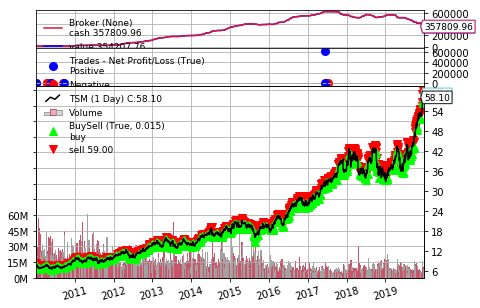

<Figure size 1728x1080 with 0 Axes>

============================================2010-01-04 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.19             0.0        8.26       8.11        8.12   

   Position  Total Reward     Volumns  
0   10000.0           0.0  11452747.0  
============================================2010-01-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.15             0.0        8.24        8.1         8.2   

   Position  Total Reward     Volumns  
0   10000.0           0.0  20335395.0  
============================================2010-01-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.12            0.05        8.21       8.04        8.17   

   Posi

============================================2010-02-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.76            0.27        6.86       6.65        6.79   

   Position  Total Reward     Volumns  
0   9971.02        -28.98  47714116.0  
============================================2010-02-08 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.79           -0.12        6.89       6.67        6.86   

   Position  Total Reward     Volumns  
0    9970.9         -29.1  35608415.0  
============================================2010-02-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.79             0.0        6.94       6.75        6.86   

   Pos

============================================2010-03-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.42           -0.87        7.42       7.28        7.32   

   Position  Total Reward     Volumns  
0  9689.198      -310.802  26509329.0  
============================================2010-03-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1          7.3            1.05        7.42       7.25        7.39   

   Position  Total Reward     Volumns  
0  9690.248      -309.752  17864324.0  
============================================2010-03-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.17            1.24        7.25       7.12        7.24   

   Pos

============================================2010-04-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.95     -405.823643        7.95       7.65        7.66   

      Position  Total Reward     Volumns  
0  8429.940071  -1570.059929  43351356.0  
============================================2010-04-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.87     -650.103643        7.95       7.83        7.91   

      Position  Total Reward     Volumns  
0  7779.836429  -2220.163571  12976352.0  
============================================2010-04-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.67             2.1        7.78       7.56        7.77 

============================================2010-05-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.05           -0.94        7.08       6.83        7.02   

      Position  Total Reward     Volumns  
0  5481.180982  -4518.819018  18263933.0  
============================================2010-05-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.88            2.57        7.12       6.82        7.07   

      Position  Total Reward     Volumns  
0  5483.750982  -4516.249018  22479429.0  
============================================2010-05-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         6.94            -0.9        7.01       6.83        6.89

============================================2010-06-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.21      -86.156965        7.32        7.2        7.24   

      Position  Total Reward     Volumns  
0  8563.243576  -1436.756424  12565711.0  
============================================2010-06-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.32           -1.33        7.41       7.27        7.31   

      Position  Total Reward     Volumns  
0  8561.913576  -1438.086424  21336474.0  
============================================2010-06-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.13            2.65        7.37       7.12        7.3

============================================2010-07-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.63     -233.286315        7.64       7.48        7.48   

      Position  Total Reward     Volumns  
0  8251.908411  -1748.091589  18061674.0  
============================================2010-07-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.68           -0.75        7.71       7.57        7.63   

      Position  Total Reward     Volumns  
0  8251.158411  -1748.841589  12678809.0  
============================================2010-07-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.77           -1.43        7.77        7.6        7.6

============================================2010-08-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.01      267.860956         7.1       6.95        7.06   

      Position  Total Reward     Volumns  
0  8670.914193  -1329.085807  24294498.0  
============================================2010-08-25 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         6.96            1.35        7.01       6.85        6.96   

      Position  Total Reward     Volumns  
0  8672.264193  -1327.735807  16366668.0  
============================================2010-08-26 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         6.93       362.51485        6.98       6.91        6.95 

============================================2010-09-27 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.27            2.33        7.33       7.26        7.32   

      Position  Total Reward     Volumns  
0  9403.128459   -596.871541  17453887.0  
============================================2010-09-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.41           -5.46        7.42       7.24        7.27   

      Position  Total Reward     Volumns  
0  9397.668459   -602.331541  16752714.0  
============================================2010-09-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.55           -5.46        7.61       7.41        7.4

============================================2010-10-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1          7.9     -635.125487        7.99       7.87        7.99   

      Position  Total Reward     Volumns  
0  8475.148864  -1524.851136  19208381.0  
============================================2010-10-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.01           -5.51        8.04       7.86        7.89   

      Position  Total Reward     Volumns  
0  8469.638864  -1530.361136  17902955.0  
============================================2010-11-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2          8.0             0.5        8.08       7.97        8.0

============================================2010-12-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.16           -14.3        8.18       8.01        8.05   

      Position  Total Reward     Volumns  
0  7352.293167  -2647.706833  30860540.0  
============================================2010-12-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.48          -17.84        8.51       8.24        8.24   

      Position  Total Reward     Volumns  
0  7334.453167  -2665.546833  37959112.0  
============================================2010-12-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.79          -17.63        8.82       8.48        8.5

============================================2011-01-04 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.28           -1.56        9.28       9.14        9.26   

     Position  Total Reward     Volumns  
0 -900.670743 -10900.670743  13217317.0  
============================================2011-01-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.08            10.4        9.22       8.99        9.18   

     Position  Total Reward     Volumns  
0 -890.270743 -10890.270743  13309198.0  
============================================2011-01-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.45          -19.24        9.49       9.15        9.18   

 

============================================2011-02-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.04           -1.56       10.09       9.98       10.01   

     Position  Total Reward     Volumns  
0 -940.190743 -10940.190743  21726123.0  
============================================2011-02-08 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.86            9.36        9.99       9.81        9.93   

     Position  Total Reward     Volumns  
0 -930.830743 -10930.830743  16100136.0  
============================================2011-02-09 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.62           12.48        9.86       9.62        9.74   



============================================2011-03-11 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.97           -3.64        9.01       8.84        8.85   

     Position  Total Reward     Volumns  
0 -884.550743 -10884.550743  18441599.0  
============================================2011-03-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.93            2.08        8.96       8.83        8.84   

     Position  Total Reward     Volumns  
0 -882.470743 -10882.470743  11710157.0  
============================================2011-03-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.75            9.36        8.76       8.53        8.63   



   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.01           -1.56        9.09       8.98        9.07   

     Position  Total Reward     Volumns  
0 -886.630743 -10886.630743  15808968.0  
============================================2011-04-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.04           -1.56        9.07       8.94        8.95   

     Position  Total Reward     Volumns  
0 -888.190743 -10888.190743  16098503.0  
============================================2011-04-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.97            3.64        9.04       8.91        9.01   

     Position  Total Reward    Volumns  
0 -884.550743 -10884.550743  8611851.0  
=======================================

============================================2011-05-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.84            3.12        9.99       9.76        9.89   

     Position  Total Reward     Volumns  
0 -929.790743 -10929.790743  28710478.0  
============================================2011-05-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.94            -5.2        10.0        9.9        9.91   

     Position  Total Reward     Volumns  
0 -934.990743 -10934.990743  15014010.0  
============================================2011-05-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.88            3.12        9.95       9.81        9.94   

============================================2011-06-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.48           -7.28        9.51       9.36        9.42   

     Position  Total Reward     Volumns  
0 -911.070743 -10911.070743  14616393.0  
============================================2011-06-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.75          -14.04        9.76       9.56        9.58   

     Position  Total Reward     Volumns  
0 -925.110743 -10925.110743  18227473.0  
============================================2011-06-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.49           13.52        9.66       9.48        9.66   

============================================2011-07-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.94          -16.64        9.94       9.65        9.65   

     Position  Total Reward     Volumns  
0 -934.990743 -10934.990743  21472037.0  
============================================2011-07-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.76            9.36        9.81       9.65        9.74   

     Position  Total Reward     Volumns  
0 -925.630743 -10925.630743  31896980.0  
============================================2011-07-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.88           -6.24        9.99        9.8        9.81   

============================================2011-08-24 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.99            3.64        9.03       8.83        9.03   

     Position  Total Reward     Volumns  
0 -885.590743 -10885.590743  18879743.0  
============================================2011-08-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.69            15.6        9.03       8.66        8.95   

     Position  Total Reward     Volumns  
0 -869.990743 -10869.990743  23504619.0  
============================================2011-08-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.04           -18.2        9.08       8.73        8.73   


============================================2011-09-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0          9.2           -18.2        9.31       8.99         9.0   

     Position  Total Reward     Volumns  
0 -896.510743 -10896.510743  23777356.0  
============================================2011-09-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.01            9.88        9.19       9.01        9.14   

     Position  Total Reward     Volumns  
0 -886.630743 -10886.630743  15135379.0  
============================================2011-09-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.04           -1.56        9.18        8.9        9.15   


============================================2011-10-31 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.66            4.68        9.76       9.61        9.67   

     Position  Total Reward     Volumns  
0 -920.430743 -10920.430743  11655390.0  
============================================2011-11-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.53            6.76        9.61       9.36        9.45   

     Position  Total Reward     Volumns  
0 -913.670743 -10913.670743  19289239.0  
============================================2011-11-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.74          -10.92        9.75       9.58        9.64   



============================================2011-12-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.04            3.64       10.23      10.02       10.14   

     Position  Total Reward     Volumns  
0 -940.190743 -10940.190743  11352871.0  
============================================2011-12-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.12           -4.16       10.18      10.04       10.16   

     Position  Total Reward     Volumns  
0 -944.350743 -10944.350743  20709862.0  
============================================2011-12-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.91           10.92       10.05       9.89        9.99   


============================================2012-01-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.07            4.16       10.16      10.02       10.16   

     Position  Total Reward     Volumns  
0 -941.750743 -10941.750743  10156781.0  
============================================2012-01-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.24           -8.84       10.25      10.05       10.07   

     Position  Total Reward    Volumns  
0 -950.590743 -10950.590743  9852827.0  
============================================2012-01-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.54           -15.6       10.58       10.3       10.36   



============================================2012-02-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.93           -3.64       10.96      10.77       10.87   

     Position  Total Reward     Volumns  
0 -986.470743 -10986.470743  11887894.0  
============================================2012-02-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         10.6           17.16       10.79      10.56       10.78   

     Position  Total Reward     Volumns  
0 -969.310743 -10969.310743  11711033.0  
============================================2012-02-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         10.8           -10.4       10.84      10.71       10.79   


============================================2012-03-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.34            2.08       11.57      11.33       11.43   

      Position  Total Reward    Volumns  
0 -1007.790743 -11007.790743  8676982.0  
============================================2012-03-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.44            -5.2        11.5      11.33       11.43   

      Position  Total Reward    Volumns  
0 -1012.990743 -11012.990743  9207694.0  
============================================2012-03-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.32            6.24       11.43       11.3        11.4   

============================================2012-04-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.64           -4.16       11.68      11.49        11.6   

      Position  Total Reward     Volumns  
0 -1023.390743 -11023.390743  14477443.0  
============================================2012-04-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         11.7           -3.12       11.76      11.47       11.61   

      Position  Total Reward    Volumns  
0 -1026.510743 -11026.510743  7874190.0  
============================================2012-04-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.68            1.04       11.83      11.59       11.75  

============================================2012-05-18 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.93           16.64       11.35      10.93       11.21   

     Position  Total Reward     Volumns  
0 -986.470743 -10986.470743  16553655.0  
============================================2012-05-21 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.04           -5.72       11.09      10.98       11.01   

     Position  Total Reward     Volumns  
0 -992.190743 -10992.190743  23845408.0  
============================================2012-05-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        11.02            1.04       11.12      10.96       11.02   



============================================2012-06-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         10.4           21.84       10.75      10.36       10.71   

     Position  Total Reward     Volumns  
0 -958.910743 -10958.910743  16767087.0  
============================================2012-06-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.59           -9.88       10.63      10.47        10.5   

     Position  Total Reward     Volumns  
0 -968.790743 -10968.790743  10599584.0  
============================================2012-06-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.24            18.2       10.48      10.22       10.43   

============================================2012-07-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.32           -4.16       10.43      10.19        10.2   

     Position  Total Reward     Volumns  
0 -954.750743 -10954.750743  25117960.0  
============================================2012-07-26 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.59          -14.04       10.65       10.4        10.4   

     Position  Total Reward     Volumns  
0 -968.790743 -10968.790743  24796482.0  
============================================2012-07-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.85          -13.52       10.91      10.68        10.7   


============================================2012-08-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         11.4           -0.52       11.48      11.33       11.46   

      Position  Total Reward    Volumns  
0 -1010.910743 -11010.910743  8683334.0  
============================================2012-08-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.35             2.6       11.42      11.31       11.36   

      Position  Total Reward    Volumns  
0 -1008.310743 -11008.310743  7233062.0  
============================================2012-08-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.38           -1.56       11.43      11.29       11.33   

============================================2012-09-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.54           -8.84       12.55      12.35       12.37   

      Position  Total Reward     Volumns  
0 -1070.190743 -11070.190743  23072653.0  
============================================2012-10-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        12.61           -3.64       12.64      12.45       12.47   

      Position  Total Reward     Volumns  
0 -1073.830743 -11073.830743  24481807.0  
============================================2012-10-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        12.69           -4.16       12.73      12.58       12.67

============================================2012-11-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         12.5           14.04       12.82      12.49       12.82   

      Position  Total Reward    Volumns  
0 -1068.110743 -11068.110743  8799994.0  
============================================2012-11-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.59           -4.68        12.6       12.5       12.56   

      Position  Total Reward     Volumns  
0 -1072.790743 -11072.790743  16504751.0  
============================================2012-11-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        12.84           -13.0       12.91      12.59        12.6  

============================================2012-12-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.52           -3.64       13.52      13.43       13.46   

      Position  Total Reward    Volumns  
0 -1121.150743 -11121.150743  9163224.0  
============================================2012-12-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         13.5            1.04       13.75      13.48       13.69   

      Position  Total Reward     Volumns  
0 -1120.110743 -11120.110743  16198655.0  
============================================2012-12-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.38            6.24       13.54      13.35       13.45  

============================================2013-01-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.41           -26.0       14.45      14.03       14.12   

      Position  Total Reward     Volumns  
0 -1167.430743 -11167.430743  19892119.0  
============================================2013-01-11 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.39            1.04       14.43      14.21       14.34   

      Position  Total Reward     Volumns  
0 -1166.390743 -11166.390743  15836559.0  
============================================2013-01-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.28            5.72       14.43      14.19        14.4  

============================================2013-02-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         14.6            3.64       14.71      14.55       14.68   

      Position  Total Reward    Volumns  
0 -1177.310743 -11177.310743  8181874.0  
============================================2013-02-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.72           -6.24       14.73      14.57       14.61   

      Position  Total Reward    Volumns  
0 -1183.550743 -11183.550743  6416932.0  
============================================2013-02-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.69            1.56       14.75      14.66       14.71   

============================================2013-03-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.54            6.76       13.67      13.48       13.65   

      Position  Total Reward     Volumns  
0 -1122.190743 -11122.190743  15476234.0  
============================================2013-03-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.68           -7.28       13.74      13.56       13.59   

      Position  Total Reward     Volumns  
0 -1129.470743 -11129.470743  13772457.0  
============================================2013-03-21 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.39           15.08       13.57      13.38       13.57 

============================================2013-04-22 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.67           12.48       14.88      14.55       14.77   

      Position  Total Reward     Volumns  
0 -1180.950743 -11180.950743  25698752.0  
============================================2013-04-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.49            9.36       14.68      14.38       14.54   

      Position  Total Reward     Volumns  
0 -1171.590743 -11171.590743  27321680.0  
============================================2013-04-24 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.62           -6.76       14.69      14.44       14.46  

============================================2013-05-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.87            5.72       14.94      14.59       14.71   

      Position  Total Reward     Volumns  
0 -1191.350743 -11191.350743  13909802.0  
============================================2013-05-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.95           -4.16       14.96      14.79       14.87   

      Position  Total Reward    Volumns  
0 -1195.510743 -11195.510743  6688975.0  
============================================2013-05-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         15.1            -7.8       15.24      15.06       15.15 

============================================2013-06-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.99           -4.68       14.04      13.87       13.92   

      Position  Total Reward     Volumns  
0 -1145.590743 -11145.590743  11587531.0  
============================================2013-06-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.22          -11.96       14.37      14.13       14.18   

      Position  Total Reward     Volumns  
0 -1157.550743 -11157.550743  15397279.0  
============================================2013-06-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.53          -16.12        14.6      14.43       14.5

============================================2013-07-30 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.83          -11.44       13.96      13.77       13.87   

      Position  Total Reward     Volumns  
0 -1137.270743 -11137.270743  10552660.0  
============================================2013-07-31 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.84           -0.52       13.94      13.83        13.9   

      Position  Total Reward     Volumns  
0 -1137.790743 -11137.790743  12941009.0  
============================================2013-08-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.06          -11.44       14.08      13.82       13.8

============================================2013-08-30 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         13.5            4.68       13.94      13.46       13.68   

      Position  Total Reward     Volumns  
0 -1120.110743 -11120.110743  14098312.0  
============================================2013-09-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.77          -14.04       14.04      13.71        13.9   

      Position  Total Reward     Volumns  
0 -1134.150743 -11134.150743  13720398.0  
============================================2013-09-04 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.74            1.56       13.85      13.65       13.85

============================================2013-10-03 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.43           -9.88       14.55      14.28       14.48   

      Position  Total Reward     Volumns  
0 -1168.470743 -11168.470743  13062358.0  
============================================2013-10-04 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.41            1.04       14.47       14.3       14.34   

      Position  Total Reward    Volumns  
0 -1167.430743 -11167.430743  5453017.0  
============================================2013-10-07 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.36             2.6       14.47      14.25       14.34   


============================================2013-11-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.74           10.92       14.81       14.7       14.78   

      Position  Total Reward     Volumns  
0 -1184.590743 -11184.590743  11491436.0  
============================================2013-11-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.89            -7.8       14.92      14.69       14.74   

      Position  Total Reward     Volumns  
0 -1192.390743 -11192.390743  12189105.0  
============================================2013-11-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.78            5.72       14.96      14.75       14.95 

============================================2013-12-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.32            2.08       14.44      14.24       14.43   

      Position  Total Reward     Volumns  
0 -1162.750743 -11162.750743  11165790.0  
============================================2013-12-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.16            8.32       14.25      14.12       14.21   

      Position  Total Reward     Volumns  
0 -1154.430743 -11154.430743  12113032.0  
============================================2013-12-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.25           -4.68       14.38      14.21       14.3

============================================2014-01-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.78           -0.52       13.97      13.77       13.86   

      Position  Total Reward     Volumns  
0 -1134.670743 -11134.670743  12621007.0  
============================================2014-01-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.16          -19.76       14.17      13.89        13.9   

      Position  Total Reward     Volumns  
0 -1154.430743 -11154.430743  16361385.0  
============================================2014-01-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.31            -7.8       14.43      14.21       14.2

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.58          -18.72       14.64      14.34       14.35   

      Position  Total Reward     Volumns  
0 -1176.270743 -11176.270743  13828128.0  
============================================2014-02-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         14.5            4.16       14.62      14.41        14.6   

      Position  Total Reward    Volumns  
0 -1172.110743 -11172.110743  7868360.0  
============================================2014-02-19 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.47            1.56       14.57      14.35       14.45   

      Position  Total Reward     Volumns  
0 -1170.550743 -11170.550743  10677936.0  
=================================

============================================2014-03-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        15.36            1.56       15.36      15.05       15.12   

      Position  Total Reward     Volumns  
0 -1216.830743 -11216.830743  16103344.0  
============================================2014-03-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         15.1           13.52       15.36      15.01       15.31   

      Position  Total Reward     Volumns  
0 -1203.310743 -11203.310743  15809848.0  
============================================2014-03-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        15.19           -4.68       15.22       15.0       15.1

============================================2014-04-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.63            6.76       16.67      16.54        16.6   

      Position  Total Reward     Volumns  
0 -1282.870743 -11282.870743  11081862.0  
============================================2014-04-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.76           -6.76       16.79      16.51       16.66   

      Position  Total Reward     Volumns  
0 -1289.630743 -11289.630743  14972791.0  
============================================2014-04-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.23           27.56       16.42      16.18       16.3

============================================2014-05-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.03           -9.88       17.08      16.87       16.98   

      Position  Total Reward    Volumns  
0 -1303.670743 -11303.670743  9227381.0  
============================================2014-05-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         17.0            1.56       17.13      16.96       17.07   

      Position  Total Reward    Volumns  
0 -1302.110743 -11302.110743  9522843.0  
============================================2014-05-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.87            6.76       16.99      16.82       16.99   


============================================2014-06-27 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.34          -10.92       17.36      17.21       17.26   

      Position  Total Reward    Volumns  
0 -1319.790743 -11319.790743  7136211.0  
============================================2014-06-30 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.43           -4.68       17.48      17.34        17.4   

      Position  Total Reward    Volumns  
0 -1324.470743 -11324.470743  7964679.0  
============================================2014-07-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.91          -24.96       17.91      17.66       17.66   

============================================2014-07-31 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.66            31.2        16.9       16.6       16.81   

      Position  Total Reward     Volumns  
0 -1284.430743 -11284.430743  19600602.0  
============================================2014-08-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        16.83           -8.84       16.91      16.69       16.69   

      Position  Total Reward     Volumns  
0 -1293.270743 -11293.270743  11801452.0  
============================================2014-08-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.09          -13.52       17.18      16.96       17.13

============================================2014-09-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.79          -11.96       17.81      17.64       17.73   

      Position  Total Reward     Volumns  
0 -1343.190743 -11343.190743  11821494.0  
============================================2014-09-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.66            6.76       17.81      17.65       17.76   

      Position  Total Reward    Volumns  
0 -1336.430743 -11336.430743  9670505.0  
============================================2014-09-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.65            0.52       17.66      17.48       17.61 

============================================2014-10-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.98           19.24       17.28      16.96       17.24   

      Position  Total Reward     Volumns  
0 -1301.070743 -11301.070743  11369407.0  
============================================2014-10-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.16           -9.36       17.21      16.76       16.81   

      Position  Total Reward     Volumns  
0 -1310.430743 -11310.430743  14719081.0  
============================================2014-10-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.06             5.2       17.31      17.01       17.3

============================================2014-11-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.18           -1.04       18.22      18.01       18.18   

      Position  Total Reward    Volumns  
0 -1363.470743 -11363.470743  9403717.0  
============================================2014-11-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.55          -19.24       18.61      18.41       18.41   

      Position  Total Reward    Volumns  
0 -1382.710743 -11382.710743  9401558.0  
============================================2014-11-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         18.5             2.6       18.66      18.41       18.63   

============================================2014-12-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.45            2.08       18.64      18.26       18.33   

      Position  Total Reward     Volumns  
0 -1377.510743 -11377.510743  13316731.0  
============================================2014-12-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.31            7.28       18.51      18.31       18.44   

      Position  Total Reward     Volumns  
0 -1370.230743 -11370.230743  13603563.0  
============================================2014-12-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.28            1.56       18.66      18.24       18.4

============================================2015-01-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.07          -79.04       19.27      18.26       18.82   

      Position  Total Reward     Volumns  
0 -1409.750743 -11409.750743  43624865.0  
============================================2015-01-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.83           12.48       18.91      18.57       18.64   

      Position  Total Reward     Volumns  
0 -1397.270743 -11397.270743  26885250.0  
============================================2015-01-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.24          -21.32       19.32      18.72       18.8

============================================2015-02-19 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.43            8.32       20.59      20.38       20.56   

      Position  Total Reward     Volumns  
0 -1480.470743 -11480.470743  11916543.0  
============================================2015-02-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.36            3.64       20.59      20.25       20.58   

      Position  Total Reward    Volumns  
0 -1476.830743 -11476.830743  8722526.0  
============================================2015-02-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.18            9.36       20.36      20.11       20.34 

============================================2015-03-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.41            13.0       20.58      20.37       20.51   

      Position  Total Reward     Volumns  
0 -1479.430743 -11479.430743  10886955.0  
============================================2015-03-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.31            57.2       20.37      19.23       20.36   

      Position  Total Reward     Volumns  
0 -1422.230743 -11422.230743  38811398.0  
============================================2015-03-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.33           -1.04       19.59      19.13       19.2

============================================2015-04-27 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        21.17          -21.32       21.47      20.64       20.74   

      Position  Total Reward     Volumns  
0 -1518.950743 -11518.950743  30897160.0  
============================================2015-04-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.84           17.16       21.07      20.66       21.02   

      Position  Total Reward     Volumns  
0 -1501.790743 -11501.790743  17326359.0  
============================================2015-04-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.66            9.36       20.75      20.49       20.7

============================================2015-05-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.23            7.28       20.36      19.95       20.04   

      Position  Total Reward     Volumns  
0 -1470.070743 -11470.070743  15805675.0  
============================================2015-06-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.11            6.24        20.2      19.94       20.15   

      Position  Total Reward     Volumns  
0 -1463.830743 -11463.830743  12470883.0  
============================================2015-06-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.72           20.28        20.0       19.7       19.9

============================================2015-07-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.71           -9.88       19.97      19.64       19.88   

      Position  Total Reward     Volumns  
0 -1443.030743 -11443.030743  14430070.0  
============================================2015-07-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         19.9           -9.88       20.05      19.73       19.77   

      Position  Total Reward    Volumns  
0 -1452.910743 -11452.910743  9173412.0  
============================================2015-07-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.72            9.36       19.99      19.66       19.77   

============================================2015-08-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.44           11.96       18.84      18.34       18.76   

      Position  Total Reward     Volumns  
0 -1376.990743 -11376.990743  16092824.0  
============================================2015-08-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        18.57           -6.76        18.8       18.5       18.52   

      Position  Total Reward    Volumns  
0 -1383.750743 -11383.750743  8733176.0  
============================================2015-08-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.29           14.56       18.52      18.06       18.41  

============================================2015-09-04 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        16.91           17.68       17.04      16.85       16.93   

      Position  Total Reward     Volumns  
0 -1297.430743 -11297.430743  10405584.0  
============================================2015-09-08 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.23          -16.64       17.24      17.04       17.16   

      Position  Total Reward     Volumns  
0 -1314.070743 -11314.070743  12088928.0  
============================================2015-09-09 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.09            7.28       17.76      17.04       17.57  

============================================2015-10-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.12          -14.04       19.14      18.63       18.72   

      Position  Total Reward     Volumns  
0 -1412.350743 -11412.350743  12033782.0  
============================================2015-10-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.87            13.0       19.28      18.83       19.18   

      Position  Total Reward     Volumns  
0 -1399.350743 -11399.350743  13552390.0  
============================================2015-10-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.99           -6.24       19.08      18.92       18.9

============================================2015-11-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.35           20.28       19.49      19.19       19.35   

      Position  Total Reward    Volumns  
0 -1424.310743 -11424.310743  8596125.0  
============================================2015-11-11 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.41           -3.12       19.51      19.15       19.27   

      Position  Total Reward    Volumns  
0 -1427.430743 -11427.430743  6113863.0  
============================================2015-11-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.12           15.08       19.49      19.12       19.29   



============================================2015-12-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         19.1           -2.08       19.26      18.97       19.19   

      Position  Total Reward    Volumns  
0 -1411.310743 -11411.310743  9189349.0  
============================================2015-12-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.61          -26.52       19.68      19.27       19.27   

      Position  Total Reward     Volumns  
0 -1437.830743 -11437.830743  10987524.0  
============================================2015-12-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.91           -15.6       19.97      19.67       19.86 

============================================2016-01-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        18.62          -24.96       18.74      18.25       18.59   

      Position  Total Reward     Volumns  
0 -1386.350743 -11386.350743  17226687.0  
============================================2016-01-20 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        18.13           25.48       18.23      17.83       17.91   

      Position  Total Reward     Volumns  
0 -1360.870743 -11360.870743  12582683.0  
============================================2016-01-21 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        18.33           -10.4       18.45      17.92       18.18  

============================================2016-02-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.59            -7.8       20.74       20.5       20.65   

      Position  Total Reward    Volumns  
0 -1488.790743 -11488.790743  8435108.0  
============================================2016-02-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.11           24.96       20.41      19.99       20.41   

      Position  Total Reward    Volumns  
0 -1463.830743 -11463.830743  6750716.0  
============================================2016-02-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.13           -1.04        20.2      19.62       19.84   

============================================2016-03-24 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        22.12            -2.6       22.13      21.87       21.94   

      Position  Total Reward    Volumns  
0 -1568.350743 -11568.350743  6455790.0  
============================================2016-03-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        22.03            4.68       22.14      21.95       22.11   

      Position  Total Reward    Volumns  
0 -1563.670743 -11563.670743  2556256.0  
============================================2016-03-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        22.32          -15.08       22.37      21.87       21.97   



============================================2016-04-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         21.7           -10.4       21.78      21.33        21.4   

      Position  Total Reward    Volumns  
0 -1546.510743 -11546.510743  8495490.0  
============================================2016-04-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.77           48.36       21.39      20.69       21.19   

      Position  Total Reward     Volumns  
0 -1498.150743 -11498.150743  14158994.0  
============================================2016-04-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.28           25.48       20.64      20.13       20.63  

Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        21.25            3.64       21.36      21.08       21.34   

      Position  Total Reward    Volumns  
0 -1523.110743 -11523.110743  9307205.0  
============================================2016-06-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         21.7           -23.4       21.71      21.25       21.25   

      Position  Total Reward    Volumns  
0 -1546.510743 -11546.510743  7128012.0  
============================================2016-06-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        21.64            3.12        21.7      21.55       21.67   

      Position  Total Reward    Volumns  
0 -1543.390743 -11543.390743  4872616.0  
==============================

============================================2016-07-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        23.67          -14.04       23.78      23.63       23.76   

      Position  Total Reward    Volumns  
0 -1648.950743 -11648.950743  6657090.0  
============================================2016-07-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        23.43           12.48       23.46       23.3       23.34   

      Position  Total Reward    Volumns  
0 -1636.470743 -11636.470743  6364660.0  
============================================2016-07-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        23.33             5.2       23.38      22.97       23.02   

============================================2016-08-04 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        25.34          -11.44       25.36      25.09       25.18   

      Position  Total Reward    Volumns  
0 -1735.790743 -11735.790743  3547505.0  
============================================2016-08-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        25.69           -18.2       25.74      25.54       25.56   

      Position  Total Reward    Volumns  
0 -1753.990743 -11753.990743  6246522.0  
============================================2016-08-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        25.95          -13.52        26.0      25.61       25.66   

============================================2016-09-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         26.6          -15.08       27.26      26.57       27.08   

      Position  Total Reward     Volumns  
0 -1801.310743 -11801.310743  16173708.0  
============================================2016-09-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.58            1.04       26.69      26.44       26.68   

      Position  Total Reward    Volumns  
0 -1800.270743 -11800.270743  7130427.0  
============================================2016-09-09 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        25.51           55.64       26.17      25.47       26.14  

============================================2016-10-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        27.91           -4.68       28.09       27.8       27.83   

      Position  Total Reward    Volumns  
0 -1869.430743 -11869.430743  8754434.0  
============================================2016-10-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        27.42           25.48       27.65      27.22       27.65   

      Position  Total Reward     Volumns  
0 -1843.950743 -11843.950743  11385192.0  
============================================2016-10-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        27.97           -28.6       28.02      27.39       27.57 

============================================2016-11-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        26.27           53.04       27.26       26.2       27.26   

      Position  Total Reward     Volumns  
0 -1784.150743 -11784.150743  11325450.0  
============================================2016-11-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         26.7          -22.36       26.84      25.66       25.93   

      Position  Total Reward    Volumns  
0 -1806.510743 -11806.510743  8414030.0  
============================================2016-11-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        25.74           49.92       26.41       25.7       26.12 

============================================2016-12-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        26.65           22.88       27.11      26.63        27.0   

      Position  Total Reward    Volumns  
0 -1803.910743 -11803.910743  6846628.0  
============================================2016-12-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        26.91          -13.52       27.02      26.79       26.91   

      Position  Total Reward    Volumns  
0 -1817.430743 -11817.430743  5686431.0  
============================================2016-12-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         26.3           31.72       26.84      26.22       26.81   



============================================2017-01-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.44           -6.76       26.49      26.22       26.31   

      Position  Total Reward    Volumns  
0 -1792.990743 -11792.990743  9519641.0  
============================================2017-01-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.83          -20.28        27.0      26.38       26.43   

      Position  Total Reward    Volumns  
0 -1813.270743 -11813.270743  8293651.0  
============================================2017-01-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.06          -11.96        27.2      26.95       27.04   

============================================2017-02-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        28.61           11.96       28.73      28.47       28.73   

      Position  Total Reward    Volumns  
0 -1905.830743 -11905.830743  5936270.0  
============================================2017-02-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        28.33           14.56       28.68      28.31       28.68   

      Position  Total Reward    Volumns  
0 -1891.270743 -11891.270743  5930665.0  
============================================2017-02-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        28.48            -7.8       28.48      28.08        28.2   

============================================2017-03-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        29.59          -16.64       29.67      29.25       29.31   

      Position  Total Reward    Volumns  
0 -1956.790743 -11956.790743  6345718.0  
============================================2017-03-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        29.75           -8.32       29.83      29.56       29.76   

      Position  Total Reward    Volumns  
0 -1965.110743 -11965.110743  5074108.0  
============================================2017-03-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        29.38           19.24       29.42      29.24        29.4   


============================================2017-04-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         29.5           -2.08       29.66      29.48       29.58   

      Position  Total Reward    Volumns  
0 -1952.110743 -11952.110743  5885047.0  
============================================2017-05-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         29.8           -15.6       29.81      29.57       29.58   

      Position  Total Reward    Volumns  
0 -1967.710743 -11967.710743  4500343.0  
============================================2017-05-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        30.27          -24.44       30.33      29.95       29.95   


============================================2017-06-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        32.02          -24.44       32.05       31.7       31.85   

      Position  Total Reward    Volumns  
0 -2083.150743 -12083.150743  6743172.0  
============================================2017-06-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        32.28          -13.52       32.32      31.98       32.04   

      Position  Total Reward    Volumns  
0 -2096.670743 -12096.670743  6477643.0  
============================================2017-06-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        32.47           -9.88       32.72      32.39       32.62   

 

============================================2017-07-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        32.08             2.6       32.32       31.9       32.32   

      Position  Total Reward     Volumns  
0 -2086.270743 -12086.270743  10010483.0  
============================================2017-07-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        31.78            15.6       31.91      31.61       31.78   

      Position  Total Reward    Volumns  
0 -2070.670743 -12070.670743  7048759.0  
============================================2017-07-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         31.9           -6.24       31.94      31.76       31.83 

============================================2017-08-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        33.89           -36.4       33.92       33.4        33.4   

      Position  Total Reward    Volumns  
0 -2180.390743 -12180.390743  5275634.0  
============================================2017-08-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        33.81            4.16       34.05      33.75       33.82   

      Position  Total Reward    Volumns  
0 -2176.230743 -12176.230743  3583375.0  
============================================2017-08-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        33.59           11.44        33.6      33.19       33.35   

============================================2017-09-08 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        34.55            1.56       34.71      34.41       34.61   

      Position  Total Reward    Volumns  
0 -2214.710743 -12214.710743  6058913.0  
============================================2017-09-11 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        34.86          -16.12        34.9      34.41       34.45   

      Position  Total Reward    Volumns  
0 -2230.830743 -12230.830743  7511606.0  
============================================2017-09-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        34.88           -1.04       34.95      34.69       34.87   


============================================2017-10-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.17          -66.04       37.21      36.56       36.67   

      Position  Total Reward    Volumns  
0 -2350.950743 -12350.950743  9786005.0  
============================================2017-10-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.26           -4.68       37.46      37.14        37.3   

      Position  Total Reward    Volumns  
0 -2355.630743 -12355.630743  5996281.0  
============================================2017-10-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.61           -18.2       37.64      37.43        37.5   

============================================2017-11-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         38.7          -14.04        38.7      38.24       38.43   

      Position  Total Reward    Volumns  
0 -2430.510743 -12430.510743  2411929.0  
============================================2017-11-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        38.56            7.28       38.59      38.24       38.49   

      Position  Total Reward    Volumns  
0 -2423.230743 -12423.230743  3038683.0  
============================================2017-11-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        38.27           15.08       38.37      38.03       38.13   

============================================2017-12-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.39           -4.68        36.5      36.16        36.3   

      Position  Total Reward    Volumns  
0 -2310.390743 -12310.390743  7768105.0  
============================================2017-12-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         36.3            4.68       36.36      36.11       36.28   

      Position  Total Reward    Volumns  
0 -2305.710743 -12305.710743  6238126.0  
============================================2017-12-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.24            3.12       36.31      36.04       36.12   

============================================2018-01-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        42.73          -82.16       42.75      42.32       42.38   

      Position  Total Reward    Volumns  
0 -2640.070743 -12640.070743  9048317.0  
============================================2018-01-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        42.64            4.68        42.9      42.43       42.82   

      Position  Total Reward    Volumns  
0 -2635.390743 -12635.390743  6143364.0  
============================================2018-01-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        41.76           45.76       42.07      41.69       42.05   


============================================2018-02-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        40.44          -72.28       40.44      39.72       39.97   

      Position  Total Reward    Volumns  
0 -2520.990743 -12520.990743  7820750.0  
============================================2018-02-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        40.91          -24.44       40.91      40.35       40.64   

      Position  Total Reward    Volumns  
0 -2545.430743 -12545.430743  4230754.0  
============================================2018-02-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        40.19           37.44       40.81      40.18       40.58   

============================================2018-03-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.33            28.6       39.77       39.1        39.6   

      Position  Total Reward    Volumns  
0 -2463.270743 -12463.270743  9295046.0  
============================================2018-03-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        40.31          -50.96       40.46      39.58       39.61   

      Position  Total Reward    Volumns  
0 -2514.230743 -12514.230743  8422104.0  
============================================2018-04-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.15           60.32       40.16      39.08       39.93   

============================================2018-05-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        35.86          -22.88       35.87      35.25       35.32   

      Position  Total Reward    Volumns  
0 -2282.830743 -12282.830743  5977719.0  
============================================2018-05-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        34.78           56.16       35.56      34.69       35.56   

      Position  Total Reward     Volumns  
0 -2226.670743 -12226.670743  12507078.0  
============================================2018-05-03 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         35.1          -16.64       35.18      34.36       34.59   


============================================2018-06-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.82          -36.92       36.85      36.55       36.71   

      Position  Total Reward    Volumns  
0 -2332.750743 -12332.750743  9690267.0  
============================================2018-06-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.43           20.28       36.72       36.3       36.57   

      Position  Total Reward    Volumns  
0 -2312.470743 -12312.470743  6888326.0  
============================================2018-06-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.44           -0.52       36.79      36.44       36.71   


============================================2018-07-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        35.59           -33.8       35.67       35.1       35.16   

      Position  Total Reward    Volumns  
0 -2268.790743 -12268.790743  7593640.0  
============================================2018-07-09 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.13          -28.08       36.32      35.88       36.16   

      Position  Total Reward    Volumns  
0 -2296.870743 -12296.870743  7460125.0  
============================================2018-07-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.22           -4.68       36.24      35.78       35.78   



============================================2018-08-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        40.08           -36.4       40.21      39.58       39.69   

      Position  Total Reward    Volumns  
0 -2502.270743 -12502.270743  5329663.0  
============================================2018-08-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        39.96            6.24       40.06       39.8       40.05   

      Position  Total Reward    Volumns  
0 -2496.030743 -12496.030743  4726181.0  
============================================2018-08-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        39.18           40.56       39.44      38.95       39.44   

============================================2018-09-11 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        42.54            3.64       42.56      41.62       41.67   

      Position  Total Reward     Volumns  
0 -2630.190743 -12630.190743  13099750.0  
============================================2018-09-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        41.96           30.16        42.3      41.85       41.94   

      Position  Total Reward     Volumns  
0 -2600.030743 -12600.030743  10789699.0  
============================================2018-09-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        41.47           25.48       42.01      41.32       42.01

============================================2018-10-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.87          -35.36       38.75      37.42       38.33   

      Position  Total Reward    Volumns  
0 -2387.350743 -12387.350743  7936063.0  
============================================2018-10-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         37.0           45.24       37.81      36.98       37.69   

      Position  Total Reward    Volumns  
0 -2342.110743 -12342.110743  8596198.0  
============================================2018-10-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        38.21          -62.92       38.26      37.63       38.05   

============================================2018-11-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.14          -21.84       36.61      35.69       36.48   

      Position  Total Reward     Volumns  
0 -2297.390743 -12297.390743  10895672.0  
============================================2018-11-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        36.78          -33.28       36.83      36.18       36.36   

      Position  Total Reward     Volumns  
0 -2330.670743 -12330.670743  11351713.0  
============================================2018-11-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        35.21           81.64       35.52      35.01        35.4

============================================2018-12-19 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         34.6            26.0        35.6      34.47       34.97   

      Position  Total Reward     Volumns  
0 -2217.310743 -12217.310743  12342335.0  
============================================2018-12-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        34.26           17.68       35.09      33.94       34.77   

      Position  Total Reward     Volumns  
0 -2199.630743 -12199.630743  13131898.0  
============================================2018-12-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         34.1            8.32       35.27      34.04       34.9

============================================2019-01-24 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        35.94          -56.68       35.94      35.12       35.22   

      Position  Total Reward     Volumns  
0 -2286.990743 -12286.990743  14758883.0  
============================================2019-01-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.42          -24.96       36.54      36.17       36.29   

      Position  Total Reward     Volumns  
0 -2311.950743 -12311.950743  17554400.0  
============================================2019-01-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        35.75           34.84       35.96      35.24       35.26 

============================================2019-02-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.67             7.8       37.81       37.3       37.73   

      Position  Total Reward    Volumns  
0 -2376.950743 -12376.950743  8581433.0  
============================================2019-02-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.29           19.76       37.52      37.24       37.36   

      Position  Total Reward    Volumns  
0 -2357.190743 -12357.190743  5974195.0  
============================================2019-03-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.62          -17.16       37.74      37.43       37.59   

============================================2019-04-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        39.51          -20.28       39.51       38.9       39.23   

      Position  Total Reward    Volumns  
0 -2472.630743 -12472.630743  7156551.0  
============================================2019-04-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        39.41             5.2        39.5      39.15       39.33   

      Position  Total Reward    Volumns  
0 -2467.430743 -12467.430743  5843403.0  
============================================2019-04-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.91           -26.0       40.07      39.64       39.73   


============================================2019-05-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         42.7           -15.6       43.11      42.55       42.91   

      Position  Total Reward    Volumns  
0 -2638.510743 -12638.510743  5738373.0  
============================================2019-05-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        41.79           47.32       41.85      41.26       41.37   

      Position  Total Reward     Volumns  
0 -2591.190743 -12591.190743  11263752.0  
============================================2019-05-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        41.79             0.0       42.07      41.34       41.86 

============================================2019-06-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.71           -10.4       36.85      36.21       36.46   

      Position  Total Reward    Volumns  
0 -2327.030743 -12327.030743  6528042.0  
============================================2019-06-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.07          -18.72       37.24      36.82        37.0   

      Position  Total Reward    Volumns  
0 -2345.750743 -12345.750743  4667121.0  
============================================2019-06-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        37.84          -40.04       38.32      37.67       37.71   

============================================2019-07-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        40.14          -53.56       40.56      39.98       40.26   

      Position  Total Reward    Volumns  
0 -2505.390743 -12505.390743  8057752.0  
============================================2019-07-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        40.33           -9.88       40.61      40.26       40.56   

      Position  Total Reward    Volumns  
0 -2515.270743 -12515.270743  6213545.0  
============================================2019-07-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        40.65          -16.64       40.69      40.25       40.53   


============================================2019-08-12 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        40.39           22.88       40.69      40.28       40.48   

      Position  Total Reward    Volumns  
0 -2518.390743 -12518.390743  3512652.0  
============================================2019-08-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        41.25          -44.72        41.4      39.98       40.06   

      Position  Total Reward    Volumns  
0 -2563.110743 -12563.110743  7807043.0  
============================================2019-08-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.86           72.28       40.52      39.69       40.28   


============================================2019-09-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        44.11          -34.32        44.2      43.57       43.81   

      Position  Total Reward    Volumns  
0 -2711.830743 -12711.830743  6319528.0  
============================================2019-09-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        43.98            6.76       44.11      43.87       43.91   

      Position  Total Reward    Volumns  
0 -2705.070743 -12705.070743  3769040.0  
============================================2019-09-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         44.5          -27.04       44.52      43.59       43.66   

============================================2019-10-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        49.78           13.52       50.78      49.72       49.99   

      Position  Total Reward     Volumns  
0 -3006.670743 -13006.670743  13710817.0  
============================================2019-10-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         49.4           19.76       50.85      48.92       50.79   

      Position  Total Reward     Volumns  
0 -2986.910743 -12986.910743  12496896.0  
============================================2019-10-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        48.94           23.92       49.74      48.79       49.3

============================================2019-11-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        53.05           -6.76       53.59      53.02       53.02   

      Position  Total Reward    Volumns  
0 -3176.710743 -13176.710743  4807753.0  
============================================2019-11-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        53.39          -17.68       53.76      53.31       53.68   

      Position  Total Reward    Volumns  
0 -3194.390743 -13194.390743  4764151.0  
============================================2019-11-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        53.13           13.52       53.41      52.84       53.18   

============================================2019-12-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        57.93            1.56        58.3      57.32       57.78   

      Position  Total Reward    Volumns  
0 -3430.470743 -13430.470743  8043800.0  
============================================2019-12-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        58.22          -15.08       58.34      57.95       58.03   

      Position  Total Reward    Volumns  
0 -3445.550743 -13445.550743  4022000.0  
============================================2019-12-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        57.76           23.92       58.09      57.55       57.99   

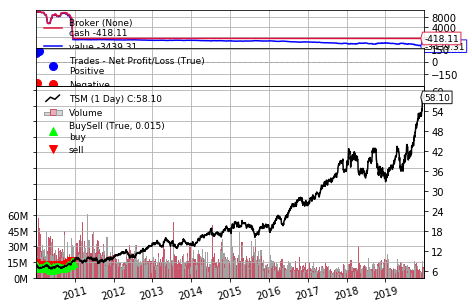

<Figure size 1728x1080 with 0 Axes>

============================================2010-01-04 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.19             0.0        8.26       8.11        8.12   

   Position  Total Reward     Volumns  
0   10000.0           0.0  11452747.0  
============================================2010-01-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.15             0.0        8.24        8.1         8.2   

   Position  Total Reward     Volumns  
0   10000.0           0.0  20335395.0  
============================================2010-01-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.12             0.0        8.21       8.04        8.17   

   Posi

============================================2010-02-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         6.76           -0.16        6.86       6.65        6.79   

    Position  Total Reward     Volumns  
0  8012.1765    -1987.8235  47714116.0  
============================================2010-02-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         6.79      -561.05825        6.89       6.67        6.86   

     Position  Total Reward     Volumns  
0  7451.11825   -2548.88175  35608415.0  
============================================2010-02-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         6.79      -561.11825        6.94       6.75        6.86   



============================================2010-03-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.42           -0.77        7.42       7.28        7.32   

   Position  Total Reward     Volumns  
0  6454.962     -3545.038  26509329.0  
============================================2010-03-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2          7.3            0.84        7.42       7.25        7.39   

   Position  Total Reward     Volumns  
0  6455.802     -3544.198  17864324.0  
============================================2010-03-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.17            0.91        7.25       7.12        7.24   

   Pos

============================================2010-04-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.95           -3.57        7.95       7.65        7.66   

      Position  Total Reward     Volumns  
0  3924.840667  -6075.159333  43351356.0  
============================================2010-04-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.87            0.76        7.95       7.83        7.91   

      Position  Total Reward     Volumns  
0  3925.600667  -6074.399333  12976352.0  
============================================2010-04-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.67             2.1        7.78       7.56        7.7

============================================2010-05-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.05           -0.94        7.08       6.83        7.02   

      Position  Total Reward     Volumns  
0  5570.251314  -4429.748686  18263933.0  
============================================2010-05-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         6.88            2.57        7.12       6.82        7.07   

      Position  Total Reward     Volumns  
0  5572.821314  -4427.178686  22479429.0  
============================================2010-05-19 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.94           -0.95        7.01       6.83        6.8

============================================2010-06-18 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.21      -20.743684        7.32        7.2        7.24   

      Position  Total Reward     Volumns  
0  7865.555267  -2134.444733  12565711.0  
============================================2010-06-21 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.32      -93.243684        7.41       7.27        7.31   

      Position  Total Reward     Volumns  
0  7772.311582  -2227.688418  21336474.0  
============================================2010-06-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.13      -89.123684        7.37       7.12        7.31 

============================================2010-07-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.63           -2.94        7.64       7.48        7.48   

      Position  Total Reward     Volumns  
0  7291.296911  -2708.703089  18061674.0  
============================================2010-07-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.68           -0.75        7.71       7.57        7.63   

      Position  Total Reward     Volumns  
0  7290.546911  -2709.453089  12678809.0  
============================================2010-07-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.77           -1.43        7.77        7.6        7.6

============================================2010-08-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.01            2.53         7.1       6.95        7.06   

      Position  Total Reward     Volumns  
0  7525.995629  -2474.004371  24294498.0  
============================================2010-08-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         6.96            1.15        7.01       6.85        6.96   

      Position  Total Reward     Volumns  
0  7527.145629  -2472.854371  16366668.0  
============================================2010-08-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         6.93            0.74        6.98       6.91        6.9

============================================2010-09-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.27      -56.774474        7.33       7.26        7.32   

      Position  Total Reward     Volumns  
0  8729.983961  -1270.016039  17453887.0  
============================================2010-09-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.41      -10.894474        7.42       7.24        7.27   

      Position  Total Reward     Volumns  
0  8719.089487  -1280.910513  16752714.0  
============================================2010-09-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.55            -2.8        7.61       7.41        7.42

============================================2010-10-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1          7.9           -1.51        7.99       7.87        7.99   

      Position  Total Reward     Volumns  
0  6721.393919  -3278.606081  19208381.0  
============================================2010-10-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.01           -2.43        8.04       7.86        7.89   

      Position  Total Reward     Volumns  
0  6718.963919  -3281.036081  17902955.0  
============================================2010-11-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2          8.0            0.22        8.08       7.97        8.0

============================================2010-12-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.16     -422.488287        8.18       8.01        8.05   

      Position  Total Reward     Volumns  
0  2392.134035  -7607.865965  30860540.0  
============================================2010-12-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.48           -6.96        8.51       8.24        8.24   

      Position  Total Reward     Volumns  
0  2385.174035  -7614.825965  37959112.0  
============================================2010-12-03 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.79           -7.09        8.82       8.48        8.52

============================================2011-01-04 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.28           -0.93        9.28       9.14        9.26   

     Position  Total Reward     Volumns  
0 -706.662039 -10706.662039  13217317.0  
============================================2011-01-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.08             6.2        9.22       8.99        9.18   

     Position  Total Reward     Volumns  
0 -700.462039 -10700.462039  13309198.0  
============================================2011-01-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.45          -11.47        9.49       9.15        9.18   


   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.04           -0.93       10.09       9.98       10.01   

     Position  Total Reward     Volumns  
0 -730.222039 -10730.222039  21726123.0  
============================================2011-02-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.86            5.58        9.99       9.81        9.93   

     Position  Total Reward     Volumns  
0 -724.642039 -10724.642039  16100136.0  
============================================2011-02-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.62            7.44        9.86       9.62        9.74   

     Position  Total Reward     Volumns  
0 -717.202039 -10717.202039  18644012.0  
=====================================

============================================2011-03-11 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.97           -2.17        9.01       8.84        8.85   

     Position  Total Reward     Volumns  
0 -697.052039 -10697.052039  18441599.0  
============================================2011-03-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.93            1.24        8.96       8.83        8.84   

     Position  Total Reward     Volumns  
0 -695.812039 -10695.812039  11710157.0  
============================================2011-03-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.75            5.58        8.76       8.53        8.63   


============================================2011-04-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.01           -0.93        9.09       8.98        9.07   

     Position  Total Reward     Volumns  
0 -698.292039 -10698.292039  15808968.0  
============================================2011-04-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.04           -0.93        9.07       8.94        8.95   

     Position  Total Reward     Volumns  
0 -699.222039 -10699.222039  16098503.0  
============================================2011-04-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.97            2.17        9.04       8.91        9.01   


============================================2011-05-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.84            1.86        9.99       9.76        9.89   

     Position  Total Reward     Volumns  
0 -724.022039 -10724.022039  28710478.0  
============================================2011-05-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.94            -3.1        10.0        9.9        9.91   

     Position  Total Reward     Volumns  
0 -727.122039 -10727.122039  15014010.0  
============================================2011-05-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.88            1.86        9.95       9.81        9.94   

============================================2011-06-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.48           -4.34        9.51       9.36        9.42   

     Position  Total Reward     Volumns  
0 -712.862039 -10712.862039  14616393.0  
============================================2011-06-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.75           -8.37        9.76       9.56        9.58   

     Position  Total Reward     Volumns  
0 -721.232039 -10721.232039  18227473.0  
============================================2011-06-22 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.49            8.06        9.66       9.48        9.66   


============================================2011-07-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.94           -9.92        9.94       9.65        9.65   

     Position  Total Reward     Volumns  
0 -727.122039 -10727.122039  21472037.0  
============================================2011-07-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.76            5.58        9.81       9.65        9.74   

     Position  Total Reward     Volumns  
0 -721.542039 -10721.542039  31896980.0  
============================================2011-07-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.88           -3.72        9.99        9.8        9.81   

============================================2011-08-24 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.99            2.17        9.03       8.83        9.03   

     Position  Total Reward     Volumns  
0 -697.672039 -10697.672039  18879743.0  
============================================2011-08-25 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.69             9.3        9.03       8.66        8.95   

     Position  Total Reward     Volumns  
0 -688.372039 -10688.372039  23504619.0  
============================================2011-08-26 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.04          -10.85        9.08       8.73        8.73   

 

============================================2011-09-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1          9.2          -10.85        9.31       8.99         9.0   

     Position  Total Reward     Volumns  
0 -704.182039 -10704.182039  23777356.0  
============================================2011-09-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.01            5.89        9.19       9.01        9.14   

     Position  Total Reward     Volumns  
0 -698.292039 -10698.292039  15135379.0  
============================================2011-09-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.04           -0.93        9.18        8.9        9.15   

============================================2011-10-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.75            4.96        9.85       9.73        9.83   

     Position  Total Reward     Volumns  
0 -721.232039 -10721.232039  17085149.0  
============================================2011-10-31 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.66            2.79        9.76       9.61        9.67   

     Position  Total Reward     Volumns  
0 -718.442039 -10718.442039  11655390.0  
============================================2011-11-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.53            4.03        9.61       9.36        9.45   



   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.11           -6.82       10.16       9.91        9.91   

     Position  Total Reward     Volumns  
0 -732.392039 -10732.392039  14681078.0  
============================================2011-12-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.04            2.17       10.23      10.02       10.14   

     Position  Total Reward     Volumns  
0 -730.222039 -10730.222039  11352871.0  
============================================2011-12-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.12           -2.48       10.18      10.04       10.16   

     Position  Total Reward     Volumns  
0 -732.702039 -10732.702039  20709862.0  
======================================

============================================2012-01-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.07            2.48       10.16      10.02       10.16   

     Position  Total Reward     Volumns  
0 -731.152039 -10731.152039  10156781.0  
============================================2012-01-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.24           -5.27       10.25      10.05       10.07   

     Position  Total Reward    Volumns  
0 -736.422039 -10736.422039  9852827.0  
============================================2012-01-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.54            -9.3       10.58       10.3       10.36   



============================================2012-02-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.93           -2.17       10.96      10.77       10.87   

     Position  Total Reward     Volumns  
0 -757.812039 -10757.812039  11887894.0  
============================================2012-02-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         10.6           10.23       10.79      10.56       10.78   

     Position  Total Reward     Volumns  
0 -747.582039 -10747.582039  11711033.0  
============================================2012-02-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         10.8            -6.2       10.84      10.71       10.79   


============================================2012-03-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.34            1.24       11.57      11.33       11.43   

     Position  Total Reward    Volumns  
0 -770.522039 -10770.522039  8676982.0  
============================================2012-03-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.44            -3.1        11.5      11.33       11.43   

     Position  Total Reward    Volumns  
0 -773.622039 -10773.622039  9207694.0  
============================================2012-03-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        11.32            3.72       11.43       11.3        11.4   

  

============================================2012-04-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.64           -2.48       11.68      11.49        11.6   

     Position  Total Reward     Volumns  
0 -779.822039 -10779.822039  14477443.0  
============================================2012-04-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         11.7           -1.86       11.76      11.47       11.61   

     Position  Total Reward    Volumns  
0 -781.682039 -10781.682039  7874190.0  
============================================2012-04-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.68            0.62       11.83      11.59       11.75   



============================================2012-05-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.93            9.92       11.35      10.93       11.21   

     Position  Total Reward     Volumns  
0 -757.812039 -10757.812039  16553655.0  
============================================2012-05-21 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.04           -3.41       11.09      10.98       11.01   

     Position  Total Reward     Volumns  
0 -761.222039 -10761.222039  23845408.0  
============================================2012-05-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        11.02            0.62       11.12      10.96       11.02   


============================================2012-06-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         10.4           13.02       10.75      10.36       10.71   

     Position  Total Reward     Volumns  
0 -741.382039 -10741.382039  16767087.0  
============================================2012-06-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.59           -5.89       10.63      10.47        10.5   

     Position  Total Reward     Volumns  
0 -747.272039 -10747.272039  10599584.0  
============================================2012-06-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.24           10.85       10.48      10.22       10.43   

============================================2012-07-25 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.32           -2.48       10.43      10.19        10.2   

     Position  Total Reward     Volumns  
0 -738.902039 -10738.902039  25117960.0  
============================================2012-07-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.59           -8.37       10.65       10.4        10.4   

     Position  Total Reward     Volumns  
0 -747.272039 -10747.272039  24796482.0  
============================================2012-07-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.85           -8.06       10.91      10.68        10.7   


============================================2012-08-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         11.4           -0.31       11.48      11.33       11.46   

     Position  Total Reward    Volumns  
0 -772.382039 -10772.382039  8683334.0  
============================================2012-08-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.35            1.55       11.42      11.31       11.36   

     Position  Total Reward    Volumns  
0 -770.832039 -10770.832039  7233062.0  
============================================2012-08-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.38           -0.93       11.43      11.29       11.33   

     

============================================2012-09-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        12.54           -5.27       12.55      12.35       12.37   

     Position  Total Reward     Volumns  
0 -807.722039 -10807.722039  23072653.0  
============================================2012-10-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.61           -2.17       12.64      12.45       12.47   

     Position  Total Reward     Volumns  
0 -809.892039 -10809.892039  24481807.0  
============================================2012-10-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.69           -2.48       12.73      12.58       12.67   

============================================2012-11-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         12.5            8.37       12.82      12.49       12.82   

     Position  Total Reward    Volumns  
0 -806.482039 -10806.482039  8799994.0  
============================================2012-11-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.59           -2.79        12.6       12.5       12.56   

     Position  Total Reward     Volumns  
0 -809.272039 -10809.272039  16504751.0  
============================================2012-11-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.84           -7.75       12.91      12.59        12.6   



============================================2012-12-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.52           -2.17       13.52      13.43       13.46   

     Position  Total Reward    Volumns  
0 -838.102039 -10838.102039  9163224.0  
============================================2012-12-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         13.5            0.62       13.75      13.48       13.69   

     Position  Total Reward     Volumns  
0 -837.482039 -10837.482039  16198655.0  
============================================2012-12-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.38            3.72       13.54      13.35       13.45   



============================================2013-01-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.41           -15.5       14.45      14.03       14.12   

     Position  Total Reward     Volumns  
0 -865.692039 -10865.692039  19892119.0  
============================================2013-01-11 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.39            0.62       14.43      14.21       14.34   

     Position  Total Reward     Volumns  
0 -865.072039 -10865.072039  15836559.0  
============================================2013-01-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.28            3.41       14.43      14.19        14.4   



============================================2013-02-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         14.6            2.17       14.71      14.55       14.68   

     Position  Total Reward    Volumns  
0 -871.582039 -10871.582039  8181874.0  
============================================2013-02-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.72           -3.72       14.73      14.57       14.61   

     Position  Total Reward    Volumns  
0 -875.302039 -10875.302039  6416932.0  
============================================2013-02-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.69            0.93       14.75      14.66       14.71   

   

============================================2013-03-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.54            4.03       13.67      13.48       13.65   

     Position  Total Reward     Volumns  
0 -838.722039 -10838.722039  15476234.0  
============================================2013-03-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.68           -4.34       13.74      13.56       13.59   

     Position  Total Reward     Volumns  
0 -843.062039 -10843.062039  13772457.0  
============================================2013-03-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.39            8.99       13.57      13.38       13.57   

============================================2013-04-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.67            7.44       14.88      14.55       14.77   

     Position  Total Reward     Volumns  
0 -873.752039 -10873.752039  25698752.0  
============================================2013-04-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.49            5.58       14.68      14.38       14.54   

     Position  Total Reward     Volumns  
0 -868.172039 -10868.172039  27321680.0  
============================================2013-04-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.62           -4.03       14.69      14.44       14.46   

============================================2013-05-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.87            3.41       14.94      14.59       14.71   

     Position  Total Reward     Volumns  
0 -879.952039 -10879.952039  13909802.0  
============================================2013-05-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.95           -2.48       14.96      14.79       14.87   

     Position  Total Reward    Volumns  
0 -882.432039 -10882.432039  6688975.0  
============================================2013-05-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         15.1           -4.65       15.24      15.06       15.15   



============================================2013-06-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.99           -2.79       14.04      13.87       13.92   

     Position  Total Reward     Volumns  
0 -852.672039 -10852.672039  11587531.0  
============================================2013-06-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.22           -7.13       14.37      14.13       14.18   

     Position  Total Reward     Volumns  
0 -859.802039 -10859.802039  15397279.0  
============================================2013-06-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.53           -9.61        14.6      14.43       14.51   


============================================2013-07-30 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.83           -6.82       13.96      13.77       13.87   

     Position  Total Reward     Volumns  
0 -847.712039 -10847.712039  10552660.0  
============================================2013-07-31 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.84           -0.31       13.94      13.83        13.9   

     Position  Total Reward     Volumns  
0 -848.022039 -10848.022039  12941009.0  
============================================2013-08-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.06           -6.82       14.08      13.82       13.89   


============================================2013-08-30 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         13.5            2.79       13.94      13.46       13.68   

     Position  Total Reward     Volumns  
0 -837.482039 -10837.482039  14098312.0  
============================================2013-09-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.77           -8.37       14.04      13.71        13.9   

     Position  Total Reward     Volumns  
0 -845.852039 -10845.852039  13720398.0  
============================================2013-09-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.74            0.93       13.85      13.65       13.85   

============================================2013-10-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.43           -5.89       14.55      14.28       14.48   

     Position  Total Reward     Volumns  
0 -866.312039 -10866.312039  13062358.0  
============================================2013-10-04 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.41            0.62       14.47       14.3       14.34   

     Position  Total Reward    Volumns  
0 -865.692039 -10865.692039  5453017.0  
============================================2013-10-07 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.36            1.55       14.47      14.25       14.34   

  

============================================2013-11-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.74            6.51       14.81       14.7       14.78   

     Position  Total Reward     Volumns  
0 -875.922039 -10875.922039  11491436.0  
============================================2013-11-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.89           -4.65       14.92      14.69       14.74   

     Position  Total Reward     Volumns  
0 -880.572039 -10880.572039  12189105.0  
============================================2013-11-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.78            3.41       14.96      14.75       14.95   


============================================2013-12-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.32            1.24       14.44      14.24       14.43   

     Position  Total Reward     Volumns  
0 -862.902039 -10862.902039  11165790.0  
============================================2013-12-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.16            4.96       14.25      14.12       14.21   

     Position  Total Reward     Volumns  
0 -857.942039 -10857.942039  12113032.0  
============================================2013-12-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.25           -2.79       14.38      14.21       14.34   


============================================2014-01-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.78           -0.31       13.97      13.77       13.86   

     Position  Total Reward     Volumns  
0 -846.162039 -10846.162039  12621007.0  
============================================2014-01-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.16          -11.78       14.17      13.89        13.9   

     Position  Total Reward     Volumns  
0 -857.942039 -10857.942039  16361385.0  
============================================2014-01-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.31           -4.65       14.43      14.21       14.25   

============================================2014-02-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.58          -11.16       14.64      14.34       14.35   

     Position  Total Reward     Volumns  
0 -870.962039 -10870.962039  13828128.0  
============================================2014-02-18 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         14.5            2.48       14.62      14.41        14.6   

     Position  Total Reward    Volumns  
0 -868.482039 -10868.482039  7868360.0  
============================================2014-02-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.47            0.93       14.57      14.35       14.45   

   

============================================2014-03-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        15.36            0.93       15.36      15.05       15.12   

     Position  Total Reward     Volumns  
0 -895.142039 -10895.142039  16103344.0  
============================================2014-03-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         15.1            8.06       15.36      15.01       15.31   

     Position  Total Reward     Volumns  
0 -887.082039 -10887.082039  15809848.0  
============================================2014-03-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        15.19           -2.79       15.22       15.0       15.17   

============================================2014-04-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        16.63            4.03       16.67      16.54        16.6   

     Position  Total Reward     Volumns  
0 -934.512039 -10934.512039  11081862.0  
============================================2014-04-24 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        16.76           -4.03       16.79      16.51       16.66   

     Position  Total Reward     Volumns  
0 -938.542039 -10938.542039  14972791.0  
============================================2014-04-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.23           16.43       16.42      16.18       16.36   



============================================2014-05-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.03           -5.89       17.08      16.87       16.98   

     Position  Total Reward    Volumns  
0 -946.912039 -10946.912039  9227381.0  
============================================2014-05-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         17.0            0.93       17.13      16.96       17.07   

     Position  Total Reward    Volumns  
0 -945.982039 -10945.982039  9522843.0  
============================================2014-05-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.87            4.03       16.99      16.82       16.99   

  

============================================2014-06-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.34           -6.51       17.36      17.21       17.26   

     Position  Total Reward    Volumns  
0 -956.522039 -10956.522039  7136211.0  
============================================2014-06-30 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.43           -2.79       17.48      17.34        17.4   

     Position  Total Reward    Volumns  
0 -959.312039 -10959.312039  7964679.0  
============================================2014-07-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.91          -14.88       17.91      17.66       17.66   

     

============================================2014-07-31 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.66            18.6        16.9       16.6       16.81   

     Position  Total Reward     Volumns  
0 -935.442039 -10935.442039  19600602.0  
============================================2014-08-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.83           -5.27       16.91      16.69       16.69   

     Position  Total Reward     Volumns  
0 -940.712039 -10940.712039  11801452.0  
============================================2014-08-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.09           -8.06       17.18      16.96       17.13   

0 -970.472039 -10970.472039  11821494.0  
============================================2014-09-04 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.66            4.03       17.81      17.65       17.76   

     Position  Total Reward    Volumns  
0 -966.442039 -10966.442039  9670505.0  
============================================2014-09-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.65            0.31       17.66      17.48       17.61   

     Position  Total Reward    Volumns  
0 -966.132039 -10966.132039  7163560.0  
============================================2014-09-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.56            2.79

============================================2014-10-07 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        16.98           11.47       17.28      16.96       17.24   

     Position  Total Reward     Volumns  
0 -945.362039 -10945.362039  11369407.0  
============================================2014-10-08 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.16           -5.58       17.21      16.76       16.81   

     Position  Total Reward     Volumns  
0 -950.942039 -10950.942039  14719081.0  
============================================2014-10-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.06             3.1       17.31      17.01       17.31   



============================================2014-11-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.18           -0.62       18.22      18.01       18.18   

     Position  Total Reward    Volumns  
0 -982.562039 -10982.562039  9403717.0  
============================================2014-11-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.55          -11.47       18.61      18.41       18.41   

     Position  Total Reward    Volumns  
0 -994.032039 -10994.032039  9401558.0  
============================================2014-11-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         18.5            1.55       18.66      18.41       18.63   

  

============================================2014-12-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.45            1.24       18.64      18.26       18.33   

     Position  Total Reward     Volumns  
0 -990.932039 -10990.932039  13316731.0  
============================================2014-12-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.31            4.34       18.51      18.31       18.44   

     Position  Total Reward     Volumns  
0 -986.592039 -10986.592039  13603563.0  
============================================2014-12-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.28            0.93       18.66      18.24       18.49   

============================================2015-01-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.07          -47.12       19.27      18.26       18.82   

      Position  Total Reward     Volumns  
0 -1010.152039 -11010.152039  43624865.0  
============================================2015-01-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.83            7.44       18.91      18.57       18.64   

      Position  Total Reward     Volumns  
0 -1002.712039 -11002.712039  26885250.0  
============================================2015-01-20 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.24          -12.71       19.32      18.72       18.83

============================================2015-02-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.43            4.96       20.59      20.38       20.56   

      Position  Total Reward     Volumns  
0 -1052.312039 -11052.312039  11916543.0  
============================================2015-02-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.36            2.17       20.59      20.25       20.58   

      Position  Total Reward    Volumns  
0 -1050.142039 -11050.142039  8722526.0  
============================================2015-02-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.18            5.58       20.36      20.11       20.34 

============================================2015-03-24 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.41            7.75       20.58      20.37       20.51   

      Position  Total Reward     Volumns  
0 -1051.692039 -11051.692039  10886955.0  
============================================2015-03-25 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.31            34.1       20.37      19.23       20.36   

      Position  Total Reward     Volumns  
0 -1017.592039 -11017.592039  38811398.0  
============================================2015-03-26 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.33           -0.62       19.59      19.13       19.21  

============================================2015-04-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        21.17          -12.71       21.47      20.64       20.74   

      Position  Total Reward     Volumns  
0 -1075.252039 -11075.252039  30897160.0  
============================================2015-04-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.84           10.23       21.07      20.66       21.02   

      Position  Total Reward     Volumns  
0 -1065.022039 -11065.022039  17326359.0  
============================================2015-04-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.66            5.58       20.75      20.49       20.71

============================================2015-05-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.23            4.34       20.36      19.95       20.04   

      Position  Total Reward     Volumns  
0 -1046.112039 -11046.112039  15805675.0  
============================================2015-06-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.11            3.72        20.2      19.94       20.15   

      Position  Total Reward     Volumns  
0 -1042.392039 -11042.392039  12470883.0  
============================================2015-06-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.72           12.09        20.0       19.7       19.98 

============================================2015-07-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.71           -5.89       19.97      19.64       19.88   

      Position  Total Reward     Volumns  
0 -1029.992039 -11029.992039  14430070.0  
============================================2015-07-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         19.9           -5.89       20.05      19.73       19.77   

      Position  Total Reward    Volumns  
0 -1035.882039 -11035.882039  9173412.0  
============================================2015-07-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.72            5.58       19.99      19.66       19.77   

============================================2015-08-04 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.44            7.13       18.84      18.34       18.76   

     Position  Total Reward     Volumns  
0 -990.622039 -10990.622039  16092824.0  
============================================2015-08-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        18.57           -4.03        18.8       18.5       18.52   

     Position  Total Reward    Volumns  
0 -994.652039 -10994.652039  8733176.0  
============================================2015-08-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        18.29            8.68       18.52      18.06       18.41   

  

============================================2015-09-04 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        16.91           10.54       17.04      16.85       16.93   

     Position  Total Reward     Volumns  
0 -943.192039 -10943.192039  10405584.0  
============================================2015-09-08 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.23           -9.92       17.24      17.04       17.16   

     Position  Total Reward     Volumns  
0 -953.112039 -10953.112039  12088928.0  
============================================2015-09-09 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.09            4.34       17.76      17.04       17.57   



============================================2015-10-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.12           -8.37       19.14      18.63       18.72   

      Position  Total Reward     Volumns  
0 -1011.702039 -11011.702039  12033782.0  
============================================2015-10-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.87            7.75       19.28      18.83       19.18   

      Position  Total Reward     Volumns  
0 -1003.952039 -11003.952039  13552390.0  
============================================2015-10-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.99           -3.72       19.08      18.92       18.9

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.35           12.09       19.49      19.19       19.35   

      Position  Total Reward    Volumns  
0 -1018.832039 -11018.832039  8596125.0  
============================================2015-11-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.41           -1.86       19.51      19.15       19.27   

      Position  Total Reward    Volumns  
0 -1020.692039 -11020.692039  6113863.0  
============================================2015-11-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.12            8.99       19.49      19.12       19.29   

      Position  Total Reward    Volumns  
0 -1011.702039 -11011.702039  6614131.0  
=====================================

============================================2015-12-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         19.1           -1.24       19.26      18.97       19.19   

      Position  Total Reward    Volumns  
0 -1011.082039 -11011.082039  9189349.0  
============================================2015-12-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.61          -15.81       19.68      19.27       19.27   

      Position  Total Reward     Volumns  
0 -1026.892039 -11026.892039  10987524.0  
============================================2015-12-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.91            -9.3       19.97      19.67       19.86   

============================================2016-01-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.62          -14.88       18.74      18.25       18.59   

     Position  Total Reward     Volumns  
0 -996.202039 -10996.202039  17226687.0  
============================================2016-01-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.13           15.19       18.23      17.83       17.91   

     Position  Total Reward     Volumns  
0 -981.012039 -10981.012039  12582683.0  
============================================2016-01-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.33            -6.2       18.45      17.92       18.18   

============================================2016-02-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.59           -4.65       20.74       20.5       20.65   

      Position  Total Reward    Volumns  
0 -1057.272039 -11057.272039  8435108.0  
============================================2016-02-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.11           14.88       20.41      19.99       20.41   

      Position  Total Reward    Volumns  
0 -1042.392039 -11042.392039  6750716.0  
============================================2016-02-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.13           -0.62        20.2      19.62       19.84   


============================================2016-03-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        22.12           -1.55       22.13      21.87       21.94   

      Position  Total Reward    Volumns  
0 -1104.702039 -11104.702039  6455790.0  
============================================2016-03-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        22.03            2.79       22.14      21.95       22.11   

      Position  Total Reward    Volumns  
0 -1101.912039 -11101.912039  2556256.0  
============================================2016-03-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        22.32           -8.99       22.37      21.87       21.97   

============================================2016-04-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         21.7            -6.2       21.78      21.33        21.4   

      Position  Total Reward    Volumns  
0 -1091.682039 -11091.682039  8495490.0  
============================================2016-04-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.77           28.83       21.39      20.69       21.19   

      Position  Total Reward     Volumns  
0 -1062.852039 -11062.852039  14158994.0  
============================================2016-04-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.28           15.19       20.64      20.13       20.63  

============================================2016-05-31 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        21.25            2.17       21.36      21.08       21.34   

      Position  Total Reward    Volumns  
0 -1077.732039 -11077.732039  9307205.0  
============================================2016-06-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         21.7          -13.95       21.71      21.25       21.25   

      Position  Total Reward    Volumns  
0 -1091.682039 -11091.682039  7128012.0  
============================================2016-06-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        21.64            1.86        21.7      21.55       21.67   


============================================2016-07-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        23.67           -8.37       23.78      23.63       23.76   

      Position  Total Reward    Volumns  
0 -1152.752039 -11152.752039  6657090.0  
============================================2016-07-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        23.43            7.44       23.46       23.3       23.34   

      Position  Total Reward    Volumns  
0 -1145.312039 -11145.312039  6364660.0  
============================================2016-07-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        23.33             3.1       23.38      22.97       23.02   


============================================2016-08-04 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        25.34           -6.82       25.36      25.09       25.18   

      Position  Total Reward    Volumns  
0 -1204.522039 -11204.522039  3547505.0  
============================================2016-08-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        25.69          -10.85       25.74      25.54       25.56   

      Position  Total Reward    Volumns  
0 -1215.372039 -11215.372039  6246522.0  
============================================2016-08-08 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        25.95           -8.06        26.0      25.61       25.66   

============================================2016-09-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         26.6           -8.99       27.26      26.57       27.08   

      Position  Total Reward     Volumns  
0 -1243.582039 -11243.582039  16173708.0  
============================================2016-09-08 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        26.58            0.62       26.69      26.44       26.68   

      Position  Total Reward    Volumns  
0 -1242.962039 -11242.962039  7130427.0  
============================================2016-09-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        25.51           33.17       26.17      25.47       26.14 

============================================2016-10-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        27.91           -2.79       28.09       27.8       27.83   

      Position  Total Reward    Volumns  
0 -1284.192039 -11284.192039  8754434.0  
============================================2016-10-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        27.42           15.19       27.65      27.22       27.65   

      Position  Total Reward     Volumns  
0 -1269.002039 -11269.002039  11385192.0  
============================================2016-10-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        27.97          -17.05       28.02      27.39       27.57 

============================================2016-11-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        26.27           31.62       27.26       26.2       27.26   

      Position  Total Reward     Volumns  
0 -1233.352039 -11233.352039  11325450.0  
============================================2016-11-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         26.7          -13.33       26.84      25.66       25.93   

      Position  Total Reward    Volumns  
0 -1246.682039 -11246.682039  8414030.0  
============================================2016-11-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        25.74           29.76       26.41       25.7       26.12 

============================================2016-12-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.65           13.64       27.11      26.63        27.0   

      Position  Total Reward    Volumns  
0 -1245.132039 -11245.132039  6846628.0  
============================================2016-12-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.91           -8.06       27.02      26.79       26.91   

      Position  Total Reward    Volumns  
0 -1253.192039 -11253.192039  5686431.0  
============================================2016-12-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         26.3           18.91       26.84      26.22       26.81   

============================================2017-01-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.44           -4.03       26.49      26.22       26.31   

      Position  Total Reward    Volumns  
0 -1238.622039 -11238.622039  9519641.0  
============================================2017-01-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.83          -12.09        27.0      26.38       26.43   

      Position  Total Reward    Volumns  
0 -1250.712039 -11250.712039  8293651.0  
============================================2017-01-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        27.06           -7.13        27.2      26.95       27.04   


============================================2017-02-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        28.61            7.13       28.73      28.47       28.73   

      Position  Total Reward    Volumns  
0 -1305.892039 -11305.892039  5936270.0  
============================================2017-02-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        28.33            8.68       28.68      28.31       28.68   

      Position  Total Reward    Volumns  
0 -1297.212039 -11297.212039  5930665.0  
============================================2017-02-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        28.48           -4.65       28.48      28.08        28.2   

============================================2017-03-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        29.59           -9.92       29.67      29.25       29.31   

      Position  Total Reward    Volumns  
0 -1336.272039 -11336.272039  6345718.0  
============================================2017-03-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        29.75           -4.96       29.83      29.56       29.76   

      Position  Total Reward    Volumns  
0 -1341.232039 -11341.232039  5074108.0  
============================================2017-03-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        29.38           11.47       29.42      29.24        29.4   

 

============================================2017-04-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         29.5           -1.24       29.66      29.48       29.58   

      Position  Total Reward    Volumns  
0 -1333.482039 -11333.482039  5885047.0  
============================================2017-05-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         29.8            -9.3       29.81      29.57       29.58   

      Position  Total Reward    Volumns  
0 -1342.782039 -11342.782039  4500343.0  
============================================2017-05-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        30.27          -14.57       30.33      29.95       29.95   

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        32.02          -14.57       32.05       31.7       31.85   

      Position  Total Reward    Volumns  
0 -1411.602039 -11411.602039  6743172.0  
============================================2017-06-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        32.28           -8.06       32.32      31.98       32.04   

      Position  Total Reward    Volumns  
0 -1419.662039 -11419.662039  6477643.0  
============================================2017-06-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        32.47           -5.89       32.72      32.39       32.62   

      Position  Total Reward    Volumns  
0 -1425.552039 -11425.552039  5402070.0  
=======================================

============================================2017-07-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        32.08            1.55       32.32       31.9       32.32   

      Position  Total Reward     Volumns  
0 -1413.462039 -11413.462039  10010483.0  
============================================2017-07-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        31.78             9.3       31.91      31.61       31.78   

      Position  Total Reward    Volumns  
0 -1404.162039 -11404.162039  7048759.0  
============================================2017-07-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         31.9           -3.72       31.94      31.76       31.83 

============================================2017-08-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        33.89           -21.7       33.92       33.4        33.4   

      Position  Total Reward    Volumns  
0 -1469.572039 -11469.572039  5275634.0  
============================================2017-08-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        33.81            2.48       34.05      33.75       33.82   

      Position  Total Reward    Volumns  
0 -1467.092039 -11467.092039  3583375.0  
============================================2017-08-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        33.59            6.82        33.6      33.19       33.35   

============================================2017-09-08 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        34.55            0.93       34.71      34.41       34.61   

      Position  Total Reward    Volumns  
0 -1490.032039 -11490.032039  6058913.0  
============================================2017-09-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        34.86           -9.61        34.9      34.41       34.45   

      Position  Total Reward    Volumns  
0 -1499.642039 -11499.642039  7511606.0  
============================================2017-09-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        34.88           -0.62       34.95      34.69       34.87   


============================================2017-10-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        37.17          -39.37       37.21      36.56       36.67   

      Position  Total Reward    Volumns  
0 -1571.252039 -11571.252039  9786005.0  
============================================2017-10-12 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        37.26           -2.79       37.46      37.14        37.3   

      Position  Total Reward    Volumns  
0 -1574.042039 -11574.042039  5996281.0  
============================================2017-10-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.61          -10.85       37.64      37.43        37.5   


============================================2017-11-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         38.7           -8.37        38.7      38.24       38.43   

      Position  Total Reward    Volumns  
0 -1618.682039 -11618.682039  2411929.0  
============================================2017-11-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        38.56            4.34       38.59      38.24       38.49   

      Position  Total Reward    Volumns  
0 -1614.342039 -11614.342039  3038683.0  
============================================2017-11-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        38.27            8.99       38.37      38.03       38.13   


============================================2017-12-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.39           -2.79        36.5      36.16        36.3   

      Position  Total Reward    Volumns  
0 -1547.072039 -11547.072039  7768105.0  
============================================2017-12-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         36.3            2.79       36.36      36.11       36.28   

      Position  Total Reward    Volumns  
0 -1544.282039 -11544.282039  6238126.0  
============================================2017-12-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.24            1.86       36.31      36.04       36.12   

============================================2018-01-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        42.73          -48.98       42.75      42.32       42.38   

      Position  Total Reward    Volumns  
0 -1743.612039 -11743.612039  9048317.0  
============================================2018-01-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        42.64            2.79        42.9      42.43       42.82   

      Position  Total Reward    Volumns  
0 -1740.822039 -11740.822039  6143364.0  
============================================2018-01-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        41.76           27.28       42.07      41.69       42.05   

============================================2018-02-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        40.44          -43.09       40.44      39.72       39.97   

      Position  Total Reward    Volumns  
0 -1672.622039 -11672.622039  7820750.0  
============================================2018-02-26 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        40.91          -14.57       40.91      40.35       40.64   

      Position  Total Reward    Volumns  
0 -1687.192039 -11687.192039  4230754.0  
============================================2018-02-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        40.19           22.32       40.81      40.18       40.58   



============================================2018-03-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.33           17.05       39.77       39.1        39.6   

      Position  Total Reward    Volumns  
0 -1638.212039 -11638.212039  9295046.0  
============================================2018-03-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        40.31          -30.38       40.46      39.58       39.61   

      Position  Total Reward    Volumns  
0 -1668.592039 -11668.592039  8422104.0  
============================================2018-04-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        39.15           35.96       40.16      39.08       39.93   

============================================2018-05-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        35.86          -13.64       35.87      35.25       35.32   

      Position  Total Reward    Volumns  
0 -1530.642039 -11530.642039  5977719.0  
============================================2018-05-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        34.78           33.48       35.56      34.69       35.56   

      Position  Total Reward     Volumns  
0 -1497.162039 -11497.162039  12507078.0  
============================================2018-05-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         35.1           -9.92       35.18      34.36       34.59 

============================================2018-06-04 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        36.82          -22.01       36.85      36.55       36.71   

      Position  Total Reward    Volumns  
0 -1560.402039 -11560.402039  9690267.0  
============================================2018-06-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        36.43           12.09       36.72       36.3       36.57   

      Position  Total Reward    Volumns  
0 -1548.312039 -11548.312039  6888326.0  
============================================2018-06-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        36.44           -0.31       36.79      36.44       36.71   

============================================2018-07-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        35.59          -20.15       35.67       35.1       35.16   

      Position  Total Reward    Volumns  
0 -1522.272039 -11522.272039  7593640.0  
============================================2018-07-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.13          -16.74       36.32      35.88       36.16   

      Position  Total Reward    Volumns  
0 -1539.012039 -11539.012039  7460125.0  
============================================2018-07-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.22           -2.79       36.24      35.78       35.78   

============================================2018-08-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        40.08           -21.7       40.21      39.58       39.69   

      Position  Total Reward    Volumns  
0 -1661.462039 -11661.462039  5329663.0  
============================================2018-08-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.96            3.72       40.06       39.8       40.05   

      Position  Total Reward    Volumns  
0 -1657.742039 -11657.742039  4726181.0  
============================================2018-08-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.18           24.18       39.44      38.95       39.44   

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        42.54            2.17       42.56      41.62       41.67   

      Position  Total Reward     Volumns  
0 -1737.722039 -11737.722039  13099750.0  
============================================2018-09-12 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        41.96           17.98        42.3      41.85       41.94   

      Position  Total Reward     Volumns  
0 -1719.742039 -11719.742039  10789699.0  
============================================2018-09-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        41.47           15.19       42.01      41.32       42.01   

      Position  Total Reward     Volumns  
0 -1704.552039 -11704.552039  10078464.0  
=================================

============================================2018-10-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.87          -21.08       38.75      37.42       38.33   

      Position  Total Reward    Volumns  
0 -1592.952039 -11592.952039  7936063.0  
============================================2018-10-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         37.0           26.97       37.81      36.98       37.69   

      Position  Total Reward    Volumns  
0 -1565.982039 -11565.982039  8596198.0  
============================================2018-10-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        38.21          -37.51       38.26      37.63       38.05   


============================================2018-11-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.14          -13.02       36.61      35.69       36.48   

      Position  Total Reward     Volumns  
0 -1539.322039 -11539.322039  10895672.0  
============================================2018-11-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.78          -19.84       36.83      36.18       36.36   

      Position  Total Reward     Volumns  
0 -1559.162039 -11559.162039  11351713.0  
============================================2018-11-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        35.21           48.67       35.52      35.01        35.

============================================2018-12-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         34.6            15.5        35.6      34.47       34.97   

      Position  Total Reward     Volumns  
0 -1491.582039 -11491.582039  12342335.0  
============================================2018-12-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        34.26           10.54       35.09      33.94       34.77   

      Position  Total Reward     Volumns  
0 -1481.042039 -11481.042039  13131898.0  
============================================2018-12-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         34.1            4.96       35.27      34.04       34.9

============================================2019-01-24 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        35.94          -33.79       35.94      35.12       35.22   

      Position  Total Reward     Volumns  
0 -1533.122039 -11533.122039  14758883.0  
============================================2019-01-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.42          -14.88       36.54      36.17       36.29   

      Position  Total Reward     Volumns  
0 -1548.002039 -11548.002039  17554400.0  
============================================2019-01-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        35.75           20.77       35.96      35.24       35.26 

============================================2019-02-27 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        37.67            4.65       37.81       37.3       37.73   

      Position  Total Reward    Volumns  
0 -1586.752039 -11586.752039  8581433.0  
============================================2019-02-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        37.29           11.78       37.52      37.24       37.36   

      Position  Total Reward    Volumns  
0 -1574.972039 -11574.972039  5974195.0  
============================================2019-03-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        37.62          -10.23       37.74      37.43       37.59   



============================================2019-04-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        39.51          -12.09       39.51       38.9       39.23   

      Position  Total Reward    Volumns  
0 -1643.792039 -11643.792039  7156551.0  
============================================2019-04-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.41             3.1        39.5      39.15       39.33   

      Position  Total Reward    Volumns  
0 -1640.692039 -11640.692039  5843403.0  
============================================2019-04-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        39.91           -15.5       40.07      39.64       39.73   

============================================2019-05-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         42.7            -9.3       43.11      42.55       42.91   

      Position  Total Reward    Volumns  
0 -1742.682039 -11742.682039  5738373.0  
============================================2019-05-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        41.79           28.21       41.85      41.26       41.37   

      Position  Total Reward     Volumns  
0 -1714.472039 -11714.472039  11263752.0  
============================================2019-05-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        41.79             0.0       42.07      41.34       41.86  

============================================2019-06-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.71            -6.2       36.85      36.21       36.46   

      Position  Total Reward    Volumns  
0 -1556.992039 -11556.992039  6528042.0  
============================================2019-06-07 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        37.07          -11.16       37.24      36.82        37.0   

      Position  Total Reward    Volumns  
0 -1568.152039 -11568.152039  4667121.0  
============================================2019-06-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        37.84          -23.87       38.32      37.67       37.71   

 

============================================2019-07-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        40.14          -31.93       40.56      39.98       40.26   

      Position  Total Reward    Volumns  
0 -1663.322039 -11663.322039  8057752.0  
============================================2019-07-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        40.33           -5.89       40.61      40.26       40.56   

      Position  Total Reward    Volumns  
0 -1669.212039 -11669.212039  6213545.0  
============================================2019-07-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        40.65           -9.92       40.69      40.25       40.53   

============================================2019-08-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        40.39           13.64       40.69      40.28       40.48   

      Position  Total Reward    Volumns  
0 -1671.072039 -11671.072039  3512652.0  
============================================2019-08-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        41.25          -26.66        41.4      39.98       40.06   

      Position  Total Reward    Volumns  
0 -1697.732039 -11697.732039  7807043.0  
============================================2019-08-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        39.86           43.09       40.52      39.69       40.28   

0 -1765.932039 -11765.932039  6671250.0  
============================================2019-09-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        44.11          -20.46        44.2      43.57       43.81   

      Position  Total Reward    Volumns  
0 -1786.392039 -11786.392039  6319528.0  
============================================2019-09-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        43.98            4.03       44.11      43.87       43.91   

      Position  Total Reward    Volumns  
0 -1782.362039 -11782.362039  3769040.0  
============================================2019-09-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         44.5          -1

============================================2019-10-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        49.78            8.06       50.78      49.72       49.99   

      Position  Total Reward     Volumns  
0 -1962.162039 -11962.162039  13710817.0  
============================================2019-10-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         49.4           11.78       50.85      48.92       50.79   

      Position  Total Reward     Volumns  
0 -1950.382039 -11950.382039  12496896.0  
============================================2019-10-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        48.94           14.26       49.74      48.79       49.3

============================================2019-11-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        53.05           -4.03       53.59      53.02       53.02   

      Position  Total Reward    Volumns  
0 -2063.532039 -12063.532039  4807753.0  
============================================2019-11-19 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        53.39          -10.54       53.76      53.31       53.68   

      Position  Total Reward    Volumns  
0 -2074.072039 -12074.072039  4764151.0  
============================================2019-11-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        53.13            8.06       53.41      52.84       53.18   

============================================2019-12-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        57.93            0.93        58.3      57.32       57.78   

      Position  Total Reward    Volumns  
0 -2214.812039 -12214.812039  8043800.0  
============================================2019-12-23 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        58.22           -8.99       58.34      57.95       58.03   

      Position  Total Reward    Volumns  
0 -2223.802039 -12223.802039  4022000.0  
============================================2019-12-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        57.76           14.26       58.09      57.55       57.99   

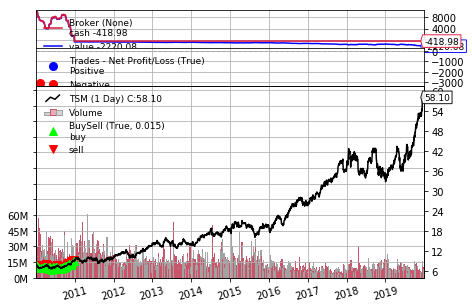

<Figure size 1728x1080 with 0 Axes>

============================================2010-01-04 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.19             0.0        8.26       8.11        8.12   

   Position  Total Reward     Volumns  
0   10000.0           0.0  11452747.0  
============================================2010-01-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.15           -0.05        8.24        8.1         8.2   

   Position  Total Reward     Volumns  
0   9999.95         -0.05  20335395.0  
============================================2010-01-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.12          -29.95        8.21       8.04        8.17   

   Posit

============================================2010-02-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         6.76           623.4        6.86       6.65        6.79   

   Position  Total Reward     Volumns  
0  10408.56        408.56  47714116.0  
============================================2010-02-08 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.79          552.47        6.89       6.67        6.86   

   Position  Total Reward     Volumns  
0  10961.03        961.03  35608415.0  
============================================2010-02-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.79             0.0        6.94       6.75        6.86   

   Posi

============================================2010-03-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.42           -1.75        7.42       7.28        7.32   

       Position  Total Reward     Volumns  
0  11395.121324   1395.121324  26509329.0  
============================================2010-03-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1          7.3            2.01        7.42       7.25        7.39   

       Position  Total Reward     Volumns  
0  11397.131324   1397.131324  17864324.0  
============================================2010-03-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.17            2.28        7.25       7.12       

============================================2010-04-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.95            -8.9        7.95       7.65        7.66   

       Position  Total Reward     Volumns  
0  10787.339223    787.339223  43351356.0  
============================================2010-04-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.87            1.76        7.95       7.83        7.91   

       Position  Total Reward     Volumns  
0  10789.099223    789.099223  12976352.0  
============================================2010-04-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.67             4.4        7.78       7.56       

============================================2010-05-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.05            -1.5        7.08       6.83        7.02   

       Position  Total Reward     Volumns  
0  10991.244804    991.244804  18263933.0  
============================================2010-05-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         6.88            3.93        7.12       6.82        7.07   

       Position  Total Reward     Volumns  
0  10995.174804    995.174804  22479429.0  
============================================2010-05-19 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.94           -1.43        7.01       6.83       

============================================2010-06-18 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.21       73.490602        7.32        7.2        7.24   

       Position  Total Reward     Volumns  
0  16439.523383   6439.523383  12565711.0  
============================================2010-06-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.32        1.670602        7.41       7.27        7.31   

       Position  Total Reward     Volumns  
0  16441.193985   6441.193985  21336474.0  
============================================2010-06-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.13            2.08        7.37       7.12        

============================================2010-07-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.63     -177.957291        7.64       7.48        7.48   

       Position  Total Reward     Volumns  
0  17250.196649   7250.196649  18061674.0  
============================================2010-07-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.68           -0.85        7.71       7.57        7.63   

       Position  Total Reward     Volumns  
0  17249.346649   7249.346649  12678809.0  
============================================2010-07-26 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.77     -366.695685        7.77        7.6        7

============================================2010-08-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.01            2.31         7.1       6.95        7.06   

       Position  Total Reward     Volumns  
0  16044.936608   6044.936608  24294498.0  
============================================2010-08-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.96            1.05        7.01       6.85        6.96   

       Position  Total Reward     Volumns  
0  16045.986608   6045.986608  16366668.0  
============================================2010-08-26 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.93            0.63        6.98       6.91       

============================================2010-09-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.27      -43.289931        7.33       7.26        7.32   

       Position  Total Reward     Volumns  
0  16339.738753   6339.738753  17453887.0  
============================================2010-09-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.41        3.190069        7.42       7.24        7.27   

       Position  Total Reward     Volumns  
0  16342.928822   6342.928822  16752714.0  
============================================2010-09-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.55           -2.51        7.61       7.41        

============================================2010-10-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.01     -487.844968        8.04       7.86        7.89   

       Position  Total Reward     Volumns  
0  11720.704708   1720.704708  17902955.0  
============================================2010-11-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0          8.0     -606.664968        8.08       7.97        8.01   

       Position  Total Reward    Volumns  
0  11114.039741   1114.039741  8528269.0  
============================================2010-11-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.96     -636.474968        8.04       7.92        8.04

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.48           -4.72        8.51       8.24        8.24   

      Position  Total Reward     Volumns  
0  8919.018405  -1080.981595  37959112.0  
============================================2010-12-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.79           -4.92        8.82       8.48        8.52   

      Position  Total Reward     Volumns  
0  8914.098405  -1085.901595  31009056.0  
============================================2010-12-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.73            1.02        8.81       8.69        8.79   

      Position  Total Reward     Volumns  
0  8915.118405  -1084.881595  10208852.0  
===============================

============================================2011-01-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.08             4.9        9.22       8.99        9.18   

      Position  Total Reward     Volumns  
0  8907.798405  -1092.201595  13309198.0  
============================================2011-01-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.45           -9.52        9.49       9.15        9.18   

      Position  Total Reward     Volumns  
0  8898.278405  -1101.721595  32583326.0  
============================================2011-01-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1          9.6           -4.02        9.62       9.46        9.4

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.86            6.91        9.99       9.81        9.93   

     Position  Total Reward     Volumns  
0  7829.77757   -2170.22243  16100136.0  
============================================2011-02-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.62            9.48        9.86       9.62        9.74   

     Position  Total Reward     Volumns  
0  7839.25757   -2160.74243  18644012.0  
============================================2011-02-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.43            7.66        9.52       9.36        9.49   

     Position  Total Reward     Volumns  
0  7846.91757   -2153.08243  35870432.0  
=====================================

============================================2011-03-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.93            1.99        8.96       8.83        8.84   

     Position  Total Reward     Volumns  
0  7001.53233   -2998.46767  11710157.0  
============================================2011-03-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.75            9.42        8.76       8.53        8.63   

     Position  Total Reward     Volumns  
0  7010.95233   -2989.04767  19319046.0  
============================================2011-03-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1          8.4            18.9        8.75       8.32        8.68   

============================================2011-04-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.04           -1.98        9.07       8.94        8.95   

      Position  Total Reward     Volumns  
0  6916.335021  -3083.664979  16098503.0  
============================================2011-04-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.97            4.52        9.04       8.91        9.01   

      Position  Total Reward    Volumns  
0  6920.855021  -3079.144979  8611851.0  
============================================2011-04-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.78       84.146846        8.91       8.72         8.9  

============================================2011-05-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.94           -7.13        10.0        9.9        9.91   

      Position  Total Reward     Volumns  
0  1014.361652  -8985.638348  15014010.0  
============================================2011-05-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.88            4.38        9.95       9.81        9.94   

      Position  Total Reward     Volumns  
0  1018.741652  -8981.258348  11291577.0  
============================================2011-05-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.85            2.21        9.91       9.79        9.8

============================================2011-06-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.75          -21.06        9.76       9.56        9.58   

      Position  Total Reward     Volumns  
0 -1646.308534 -11646.308534  18227473.0  
============================================2011-06-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.49           20.28        9.66       9.48        9.66   

      Position  Total Reward     Volumns  
0 -1626.028534 -11626.028534  22898413.0  
============================================2011-06-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.43            4.68        9.47       9.18        9.3

============================================2011-07-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.76           14.04        9.81       9.65        9.74   

      Position  Total Reward     Volumns  
0 -1647.088534 -11647.088534  31896980.0  
============================================2011-07-26 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.88           -9.36        9.99        9.8        9.81   

      Position  Total Reward     Volumns  
0 -1656.448534 -11656.448534  21049349.0  
============================================2011-07-27 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.62           20.28        9.85       9.59        9.8

============================================2011-08-26 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.04           -27.3        9.08       8.73        8.73   

      Position  Total Reward     Volumns  
0 -1590.928534 -11590.928534  12306138.0  
============================================2011-08-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.29           -19.5        9.29       9.11        9.13   

      Position  Total Reward     Volumns  
0 -1610.428534 -11610.428534  10832742.0  
============================================2011-08-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.16           10.14        9.23        9.1         9.2

============================================2011-09-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.04           -2.34        9.18        8.9        9.15   

      Position  Total Reward     Volumns  
0 -1590.928534 -11590.928534  13456250.0  
============================================2011-09-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.75           22.62        9.03       8.71        8.96   

      Position  Total Reward     Volumns  
0 -1568.308534 -11568.308534  20460644.0  
============================================2011-10-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.66            7.02        8.93       8.66        8.6

============================================2011-11-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.53           10.14        9.61       9.36        9.45   

      Position  Total Reward     Volumns  
0 -1629.148534 -11629.148534  19289239.0  
============================================2011-11-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.74          -16.38        9.75       9.58        9.64   

      Position  Total Reward     Volumns  
0 -1645.528534 -11645.528534  14848795.0  
============================================2011-11-03 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.88          -10.92         9.9       9.67        9.86 

============================================2011-12-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.12           -6.24       10.18      10.04       10.16   

      Position  Total Reward     Volumns  
0 -1675.168534 -11675.168534  20709862.0  
============================================2011-12-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.91           16.38       10.05       9.89        9.99   

      Position  Total Reward     Volumns  
0 -1658.788534 -11658.788534  17730152.0  
============================================2011-12-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.12          -16.38       10.17       9.85        9.8

============================================2012-01-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.24          -13.26       10.25      10.05       10.07   

      Position  Total Reward    Volumns  
0 -1684.528534 -11684.528534  9852827.0  
============================================2012-01-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.54           -23.4       10.58       10.3       10.36   

      Position  Total Reward     Volumns  
0 -1707.928534 -11707.928534  20247856.0  
============================================2012-01-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.46            6.24       10.49       10.4       10.42 

============================================2012-02-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         10.6           25.74       10.79      10.56       10.78   

      Position  Total Reward     Volumns  
0 -1712.608534 -11712.608534  11711033.0  
============================================2012-02-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         10.8           -15.6       10.84      10.71       10.79   

      Position  Total Reward     Volumns  
0 -1728.208534 -11728.208534  17373428.0  
============================================2012-02-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.86           -4.68       10.87      10.75       10.76

============================================2012-03-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.44            -7.8        11.5      11.33       11.43   

      Position  Total Reward    Volumns  
0 -1778.128534 -11778.128534  9207694.0  
============================================2012-03-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.32            9.36       11.43       11.3        11.4   

      Position  Total Reward    Volumns  
0 -1768.768534 -11768.768534  6845424.0  
============================================2012-03-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.61          -22.62       11.69      11.38       11.48   



   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         11.7           -4.68       11.76      11.47       11.61   

      Position  Total Reward    Volumns  
0 -1798.408534 -11798.408534  7874190.0  
============================================2012-04-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.68            1.56       11.83      11.59       11.75   

      Position  Total Reward    Volumns  
0 -1796.848534 -11796.848534  9528496.0  
============================================2012-04-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.57            8.58       11.77      11.52       11.75   

      Position  Total Reward    Volumns  
0 -1788.268534 -11788.268534  8792582.0  
=====================================

============================================2012-05-21 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.04           -8.58       11.09      10.98       11.01   

      Position  Total Reward     Volumns  
0 -1746.928534 -11746.928534  23845408.0  
============================================2012-05-22 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.02            1.56       11.12      10.96       11.02   

      Position  Total Reward     Volumns  
0 -1745.368534 -11745.368534  17905968.0  
============================================2012-05-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.78           18.72       10.81      10.61       10.73 

============================================2012-06-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.59          -14.82       10.63      10.47        10.5   

      Position  Total Reward     Volumns  
0 -1711.828534 -11711.828534  10599584.0  
============================================2012-06-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.24            27.3       10.48      10.22       10.43   

      Position  Total Reward     Volumns  
0 -1684.528534 -11684.528534  19147514.0  
============================================2012-06-26 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.19             3.9       10.31      10.09       10.2

============================================2012-07-26 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.59          -21.06       10.65       10.4        10.4   

      Position  Total Reward     Volumns  
0 -1711.828534 -11711.828534  24796482.0  
============================================2012-07-27 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.85          -20.28       10.91      10.68        10.7   

      Position  Total Reward     Volumns  
0 -1732.108534 -11732.108534  17420645.0  
============================================2012-07-30 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         10.7            11.7       10.83      10.57       10.7

============================================2012-08-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.35             3.9       11.42      11.31       11.36   

      Position  Total Reward    Volumns  
0 -1771.108534 -11771.108534  7233062.0  
============================================2012-08-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.38           -2.34       11.43      11.29       11.33   

      Position  Total Reward    Volumns  
0 -1773.448534 -11773.448534  7383146.0  
============================================2012-08-30 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         11.3            6.24       11.37      11.27       11.33   



============================================2012-10-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.61           -5.46       12.64      12.45       12.47   

      Position  Total Reward     Volumns  
0 -1869.388534 -11869.388534  24481807.0  
============================================2012-10-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.69           -6.24       12.73      12.58       12.67   

      Position  Total Reward     Volumns  
0 -1875.628534 -11875.628534  22325757.0  
============================================2012-10-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        12.73           -3.12       12.73      12.54       12.7

============================================2012-11-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        12.59           -7.02        12.6       12.5       12.56   

      Position  Total Reward     Volumns  
0 -1867.828534 -11867.828534  16504751.0  
============================================2012-11-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.84           -19.5       12.91      12.59        12.6   

      Position  Total Reward     Volumns  
0 -1887.328534 -11887.328534  11060468.0  
============================================2012-11-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.82            1.56       12.87      12.66       12.7

============================================2012-12-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         13.5            1.56       13.75      13.48       13.69   

      Position  Total Reward     Volumns  
0 -1938.808534 -11938.808534  16198655.0  
============================================2012-12-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.38            9.36       13.54      13.35       13.45   

      Position  Total Reward     Volumns  
0 -1929.448534 -11929.448534  10106739.0  
============================================2012-12-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.63           -19.5       13.69      13.57       13.5

============================================2013-01-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.39            1.56       14.43      14.21       14.34   

      Position  Total Reward     Volumns  
0 -2008.228534 -12008.228534  15836559.0  
============================================2013-01-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.28            8.58       14.43      14.19        14.4   

      Position  Total Reward     Volumns  
0 -1999.648534 -11999.648534  10584739.0  
============================================2013-01-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.18             7.8       14.22      14.09       14.1

============================================2013-02-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.72           -9.36       14.73      14.57       14.61   

      Position  Total Reward    Volumns  
0 -2033.968534 -12033.968534  6416932.0  
============================================2013-02-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.69            2.34       14.75      14.66       14.71   

      Position  Total Reward    Volumns  
0 -2031.628534 -12031.628534  6642057.0  
============================================2013-02-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        15.18          -38.22       15.19      14.76        14.8   



============================================2013-03-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.68          -10.92       13.74      13.56       13.59   

      Position  Total Reward     Volumns  
0 -1952.848534 -11952.848534  13772457.0  
============================================2013-03-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.39           22.62       13.57      13.38       13.57   

      Position  Total Reward     Volumns  
0 -1930.228534 -11930.228534  11158970.0  
============================================2013-03-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.53          -10.92       13.55      13.38       13.4

============================================2013-04-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.49           14.04       14.68      14.38       14.54   

      Position  Total Reward     Volumns  
0 -2016.028534 -12016.028534  27321680.0  
============================================2013-04-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.62          -10.14       14.69      14.44       14.46   

      Position  Total Reward     Volumns  
0 -2026.168534 -12026.168534  12866780.0  
============================================2013-04-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.82           -15.6       14.82      14.64       14.6

============================================2013-05-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.95           -6.24       14.96      14.79       14.87   

      Position  Total Reward    Volumns  
0 -2051.908534 -12051.908534  6688975.0  
============================================2013-05-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         15.1           -11.7       15.24      15.06       15.15   

      Position  Total Reward     Volumns  
0 -2063.608534 -12063.608534  11484866.0  
============================================2013-05-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        15.26          -12.48        15.3      15.08       15.08 

============================================2013-06-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.22          -17.94       14.37      14.13       14.18   

      Position  Total Reward     Volumns  
0 -1994.968534 -11994.968534  15397279.0  
============================================2013-06-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.53          -24.18        14.6      14.43       14.51   

      Position  Total Reward     Volumns  
0 -2019.148534 -12019.148534  15720405.0  
============================================2013-07-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.63            -7.8        14.8       14.6       14.75 

============================================2013-07-31 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.84           -0.78       13.94      13.83        13.9   

      Position  Total Reward     Volumns  
0 -1965.328534 -11965.328534  12941009.0  
============================================2013-08-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.06          -17.16       14.08      13.82       13.89   

      Position  Total Reward     Volumns  
0 -1982.488534 -11982.488534  18516110.0  
============================================2013-08-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.69           28.86        13.9      13.66        13.

============================================2013-09-03 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.77          -21.06       14.04      13.71        13.9   

      Position  Total Reward     Volumns  
0 -1959.868534 -11959.868534  13720398.0  
============================================2013-09-04 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.74            2.34       13.85      13.65       13.85   

      Position  Total Reward     Volumns  
0 -1957.528534 -11957.528534  16842368.0  
============================================2013-09-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         14.0          -20.28       14.07      13.81       13.82 

============================================2013-10-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.41            1.56       14.47       14.3       14.34   

      Position  Total Reward    Volumns  
0 -2009.788534 -12009.788534  5453017.0  
============================================2013-10-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.36             3.9       14.47      14.25       14.34   

      Position  Total Reward    Volumns  
0 -2005.888534 -12005.888534  7915722.0  
============================================2013-10-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.23           10.14       14.65      14.22       14.52   

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.78            8.58       14.96      14.75       14.95   

      Position  Total Reward     Volumns  
0 -2038.648534 -12038.648534  12708736.0  
============================================2013-11-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.68             7.8        14.7      14.56       14.67   

      Position  Total Reward     Volumns  
0 -2030.848534 -12030.848534  11030944.0  
============================================2013-11-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.45           17.94       14.55      14.43       14.54   

      Position  Total Reward    Volumns  
0 -2012.908534 -12012.908534  8116581.0  
=================================

============================================2013-12-11 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.25           -7.02       14.38      14.21       14.34   

      Position  Total Reward    Volumns  
0 -1997.308534 -11997.308534  9692781.0  
============================================2013-12-12 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.95            23.4       14.25      13.93       14.21   

      Position  Total Reward     Volumns  
0 -1973.908534 -11973.908534  13333648.0  
============================================2013-12-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.92            2.34       14.08      13.87       14.05   


============================================2014-01-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.31           -11.7       14.43      14.21       14.25   

      Position  Total Reward     Volumns  
0 -2001.988534 -12001.988534  19031819.0  
============================================2014-01-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.79          -37.44       14.82      14.58        14.6   

      Position  Total Reward     Volumns  
0 -2039.428534 -12039.428534  26709504.0  
============================================2014-01-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.48           24.18       14.65      14.43       14.65

0 -2016.808534 -12016.808534  7868360.0  
============================================2014-02-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.47            2.34       14.57      14.35       14.45   

      Position  Total Reward     Volumns  
0 -2014.468534 -12014.468534  10677936.0  
============================================2014-02-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.42             3.9       14.48      14.23       14.34   

      Position  Total Reward     Volumns  
0 -2010.568534 -12010.568534  14523346.0  
============================================2014-02-21 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.46         

============================================2014-03-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        15.19           -7.02       15.22       15.0       15.17   

      Position  Total Reward    Volumns  
0 -2070.628534 -12070.628534  9691063.0  
============================================2014-03-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        15.58          -30.42       15.63      15.31       15.31   

      Position  Total Reward     Volumns  
0 -2101.048534 -12101.048534  21017836.0  
============================================2014-03-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        15.56            1.56       15.76      15.55        15.7 

============================================2014-04-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.23           41.34       16.42      16.18       16.36   

      Position  Total Reward     Volumns  
0 -2151.748534 -12151.748534  18987402.0  
============================================2014-04-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.54          -24.18       16.55      16.35       16.41   

      Position  Total Reward     Volumns  
0 -2175.928534 -12175.928534  17647520.0  
============================================2014-04-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        16.38           12.48       16.63      16.37       16.54

============================================2014-05-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.87           10.14       16.99      16.82       16.99   

      Position  Total Reward    Volumns  
0 -2201.668534 -12201.668534  7502960.0  
============================================2014-05-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.76            8.58       16.81      16.63       16.63   

      Position  Total Reward    Volumns  
0 -2193.088534 -12193.088534  8185906.0  
============================================2014-06-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.84           -6.24       16.86      16.76       16.85   

============================================2014-07-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.91          -37.44       17.91      17.66       17.66   

      Position  Total Reward     Volumns  
0 -2282.788534 -12282.788534  10620513.0  
============================================2014-07-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.24          -25.74       18.44      18.14       18.22   

      Position  Total Reward     Volumns  
0 -2308.528534 -12308.528534  12974384.0  
============================================2014-07-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.51          -21.06       18.51      18.35        18.

============================================2014-08-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.09          -20.28       17.18      16.96       17.13   

      Position  Total Reward     Volumns  
0 -2218.828534 -12218.828534  11804813.0  
============================================2014-08-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         16.5           46.02       16.71       16.4       16.67   

      Position  Total Reward     Volumns  
0 -2172.808534 -12172.808534  16095989.0  
============================================2014-08-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         16.7           -15.6       16.76      16.57       16.63

============================================2014-09-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.65            0.78       17.66      17.48       17.61   

      Position  Total Reward    Volumns  
0 -2262.508534 -12262.508534  7163560.0  
============================================2014-09-08 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.56            7.02       17.65      17.51       17.64   

      Position  Total Reward    Volumns  
0 -2255.488534 -12255.488534  8069895.0  
============================================2014-09-09 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.54            1.56       17.66      17.48       17.56   



============================================2014-10-08 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.16          -14.04       17.21      16.76       16.81   

      Position  Total Reward     Volumns  
0 -2224.288534 -12224.288534  14719081.0  
============================================2014-10-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.06             7.8       17.31      17.01       17.31   

      Position  Total Reward     Volumns  
0 -2216.488534 -12216.488534  13017540.0  
============================================2014-10-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         16.2           67.08       16.85      16.16       16.8

============================================2014-11-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.55          -28.86       18.61      18.41       18.41   

      Position  Total Reward    Volumns  
0 -2332.708534 -12332.708534  9401558.0  
============================================2014-11-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         18.5             3.9       18.66      18.41       18.63   

      Position  Total Reward    Volumns  
0 -2328.808534 -12328.808534  7897318.0  
============================================2014-11-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.37           10.14       18.39      18.12       18.15   

============================================2014-12-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.31           10.92       18.51      18.31       18.44   

      Position  Total Reward     Volumns  
0 -2313.988534 -12313.988534  13603563.0  
============================================2014-12-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.28            2.34       18.66      18.24       18.49   

      Position  Total Reward     Volumns  
0 -2311.648534 -12311.648534  16946637.0  
============================================2014-12-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.86           32.76       18.21      17.86       18.1

============================================2015-01-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.83           18.72       18.91      18.57       18.64   

      Position  Total Reward     Volumns  
0 -2354.548534 -12354.548534  26885250.0  
============================================2015-01-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.24          -31.98       19.32      18.72       18.83   

      Position  Total Reward     Volumns  
0 -2386.528534 -12386.528534  28802698.0  
============================================2015-01-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.34            -7.8       19.41      19.13       19.1

============================================2015-02-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.36            5.46       20.59      20.25       20.58   

      Position  Total Reward    Volumns  
0 -2473.888534 -12473.888534  8722526.0  
============================================2015-02-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.18           14.04       20.36      20.11       20.34   

      Position  Total Reward    Volumns  
0 -2459.848534 -12459.848534  9393876.0  
============================================2015-02-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.86          -53.04        20.9      20.29       20.31   

============================================2015-03-25 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.31            85.8       20.37      19.23       20.36   

      Position  Total Reward     Volumns  
0 -2391.988534 -12391.988534  38811398.0  
============================================2015-03-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.33           -1.56       19.59      19.13       19.21   

      Position  Total Reward     Volumns  
0 -2393.548534 -12393.548534  43723641.0  
============================================2015-03-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.11           17.16       19.26      18.88       19.09

============================================2015-04-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.84           25.74       21.07      20.66       21.02   

      Position  Total Reward     Volumns  
0 -2511.328534 -12511.328534  17326359.0  
============================================2015-04-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.66           14.04       20.75      20.49       20.71   

      Position  Total Reward     Volumns  
0 -2497.288534 -12497.288534  15172611.0  
============================================2015-04-30 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.36            23.4       20.51       20.3       20.4

============================================2015-06-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.11            9.36        20.2      19.94       20.15   

      Position  Total Reward     Volumns  
0 -2454.388534 -12454.388534  12470883.0  
============================================2015-06-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.72           30.42        20.0       19.7       19.98   

      Position  Total Reward     Volumns  
0 -2423.968534 -12423.968534  14722320.0  
============================================2015-06-03 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.71            0.78       19.83      19.56       19.81 

============================================2015-07-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         19.9          -14.82       20.05      19.73       19.77   

      Position  Total Reward    Volumns  
0 -2438.008534 -12438.008534  9173412.0  
============================================2015-07-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.72           14.04       19.99      19.66       19.77   

      Position  Total Reward    Volumns  
0 -2423.968534 -12423.968534  8697807.0  
============================================2015-07-07 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.74           -1.56       19.77      19.29       19.61   



============================================2015-08-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        18.57          -10.14        18.8       18.5       18.52   

      Position  Total Reward    Volumns  
0 -2334.268534 -12334.268534  8733176.0  
============================================2015-08-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        18.29           21.84       18.52      18.06       18.41   

      Position  Total Reward     Volumns  
0 -2312.428534 -12312.428534  15060525.0  
============================================2015-08-07 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        18.08           16.38        18.4      18.04       18.27   


============================================2015-09-08 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.23          -24.96       17.24      17.04       17.16   

      Position  Total Reward     Volumns  
0 -2229.748534 -12229.748534  12088928.0  
============================================2015-09-09 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.09           10.92       17.76      17.04       17.57   

      Position  Total Reward     Volumns  
0 -2218.828534 -12218.828534  12004930.0  
============================================2015-09-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        16.93           12.48       17.11      16.56       17.02  

============================================2015-10-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.87            19.5       19.28      18.83       19.18   

      Position  Total Reward     Volumns  
0 -2357.668534 -12357.668534  13552390.0  
============================================2015-10-12 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        18.99           -9.36       19.08      18.92       18.97   

      Position  Total Reward    Volumns  
0 -2367.028534 -12367.028534  7887372.0  
============================================2015-10-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        18.86           10.14       18.94      18.63       18.76   

============================================2015-11-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.41           -4.68       19.51      19.15       19.27   

      Position  Total Reward    Volumns  
0 -2399.788534 -12399.788534  6113863.0  
============================================2015-11-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.12           22.62       19.49      19.12       19.29   

      Position  Total Reward    Volumns  
0 -2377.168534 -12377.168534  6614131.0  
============================================2015-11-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        18.82            23.4       19.04      18.54       18.97   


============================================2015-12-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.61          -39.78       19.68      19.27       19.27   

      Position  Total Reward     Volumns  
0 -2415.388534 -12415.388534  10987524.0  
============================================2015-12-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.91           -23.4       19.97      19.67       19.86   

      Position  Total Reward    Volumns  
0 -2438.788534 -12438.788534  8591588.0  
============================================2015-12-17 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.74           13.26       20.02      19.73       19.85  

============================================2016-01-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.13           38.22       18.23      17.83       17.91   

      Position  Total Reward     Volumns  
0 -2299.948534 -12299.948534  12582683.0  
============================================2016-01-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.33           -15.6       18.45      17.92       18.18   

      Position  Total Reward     Volumns  
0 -2315.548534 -12315.548534  10592894.0  
============================================2016-01-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.85          -40.56       18.87      18.58        18.

============================================2016-02-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.11           37.44       20.41      19.99       20.41   

      Position  Total Reward    Volumns  
0 -2454.388534 -12454.388534  6750716.0  
============================================2016-02-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.13           -1.56        20.2      19.62       19.84   

      Position  Total Reward    Volumns  
0 -2455.948534 -12455.948534  6128289.0  
============================================2016-02-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.36          -17.94       20.37       20.1       20.35   

============================================2016-03-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        22.03            7.02       22.14      21.95       22.11   

      Position  Total Reward    Volumns  
0 -2604.148534 -12604.148534  2556256.0  
============================================2016-03-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        22.32          -22.62       22.37      21.87       21.97   

      Position  Total Reward    Volumns  
0 -2626.768534 -12626.768534  5294469.0  
============================================2016-03-30 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        22.74          -32.76       22.88      22.62       22.62   

============================================2016-04-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.77           72.54       21.39      20.69       21.19   

      Position  Total Reward     Volumns  
0 -2505.868534 -12505.868534  14158994.0  
============================================2016-04-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.28           38.22       20.64      20.13       20.63   

      Position  Total Reward     Volumns  
0 -2467.648534 -12467.648534  17399918.0  
============================================2016-05-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.36           -6.24       20.41      20.16       20.27

============================================2016-06-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         21.7           -35.1       21.71      21.25       21.25   

      Position  Total Reward    Volumns  
0 -2578.408534 -12578.408534  7128012.0  
============================================2016-06-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        21.64            4.68        21.7      21.55       21.67   

      Position  Total Reward    Volumns  
0 -2573.728534 -12573.728534  4872616.0  
============================================2016-06-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        21.94           -23.4        22.0      21.75       21.78   

============================================2016-07-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        23.43           18.72       23.46       23.3       23.34   

      Position  Total Reward    Volumns  
0 -2713.348534 -12713.348534  6364660.0  
============================================2016-07-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        23.33             7.8       23.38      22.97       23.02   

      Position  Total Reward    Volumns  
0 -2705.548534 -12705.548534  6795629.0  
============================================2016-07-07 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        23.47          -10.92       23.67      23.41       23.42   



============================================2016-08-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        25.69           -27.3       25.74      25.54       25.56   

      Position  Total Reward    Volumns  
0 -2889.628534 -12889.628534  6246522.0  
============================================2016-08-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        25.95          -20.28        26.0      25.61       25.66   

      Position  Total Reward    Volumns  
0 -2909.908534 -12909.908534  9786965.0  
============================================2016-08-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.23          -21.84       26.26       26.0       26.03   

============================================2016-09-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.58            1.56       26.69      26.44       26.68   

      Position  Total Reward    Volumns  
0 -2959.048534 -12959.048534  7130427.0  
============================================2016-09-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        25.51           83.46       26.17      25.47       26.14   

      Position  Total Reward    Volumns  
0 -2875.588534 -12875.588534  9331786.0  
============================================2016-09-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        25.86           -27.3       25.91      25.16       25.47   

============================================2016-10-11 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        27.42           38.22       27.65      27.22       27.65   

      Position  Total Reward     Volumns  
0 -3024.568534 -13024.568534  11385192.0  
============================================2016-10-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.97           -42.9       28.02      27.39       27.57   

      Position  Total Reward     Volumns  
0 -3067.468534 -13067.468534  10745632.0  
============================================2016-10-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.24           56.94        27.6      26.34        27.6

============================================2016-11-11 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         26.7          -33.54       26.84      25.66       25.93   

      Position  Total Reward    Volumns  
0 -2968.408534 -12968.408534  8414030.0  
============================================2016-11-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        25.74           74.88       26.41       25.7       26.12   

      Position  Total Reward    Volumns  
0 -2893.528534 -12893.528534  9584875.0  
============================================2016-11-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        26.05          -24.18       26.27      25.67       26.15   



============================================2016-12-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        26.91          -20.28       27.02      26.79       26.91   

      Position  Total Reward    Volumns  
0 -2984.788534 -12984.788534  5686431.0  
============================================2016-12-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         26.3           47.58       26.84      26.22       26.81   

      Position  Total Reward    Volumns  
0 -2937.208534 -12937.208534  7467245.0  
============================================2016-12-19 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        26.11           14.82       26.35      26.02       26.31   

============================================2017-01-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        26.83          -30.42        27.0      26.38       26.43   

      Position  Total Reward    Volumns  
0 -2978.548534 -12978.548534  8293651.0  
============================================2017-01-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.06          -17.94        27.2      26.95       27.04   

      Position  Total Reward    Volumns  
0 -2996.488534 -12996.488534  7800923.0  
============================================2017-01-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         27.5          -34.32       27.57      27.22       27.24   

============================================2017-02-23 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        28.33           21.84       28.68      28.31       28.68   

      Position  Total Reward    Volumns  
0 -3095.548534 -13095.548534  5930665.0  
============================================2017-02-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        28.48           -11.7       28.48      28.08        28.2   

      Position  Total Reward    Volumns  
0 -3107.248534 -13107.248534  4132703.0  
============================================2017-02-27 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        28.13            27.3       28.39      28.09       28.39   

============================================2017-03-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        29.75          -12.48       29.83      29.56       29.76   

      Position  Total Reward    Volumns  
0 -3206.308534 -13206.308534  5074108.0  
============================================2017-03-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        29.38           28.86       29.42      29.24        29.4   

      Position  Total Reward    Volumns  
0 -3177.448534 -13177.448534  4577458.0  
============================================2017-03-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         29.5           -9.36       29.58      29.25        29.3   

============================================2017-05-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         29.8           -23.4       29.81      29.57       29.58   

      Position  Total Reward    Volumns  
0 -3210.208534 -13210.208534  4500343.0  
============================================2017-05-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        30.27          -36.66       30.33      29.95       29.95   

      Position  Total Reward    Volumns  
0 -3246.868534 -13246.868534  6713134.0  
============================================2017-05-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        30.59          -24.96       30.59      30.19       30.23   

============================================2017-06-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        32.28          -20.28       32.32      31.98       32.04   

      Position  Total Reward    Volumns  
0 -3403.648534 -13403.648534  6477643.0  
============================================2017-06-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        32.47          -14.82       32.72      32.39       32.62   

      Position  Total Reward    Volumns  
0 -3418.468534 -13418.468534  5402070.0  
============================================2017-06-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         32.5           -2.34       32.64      32.33       32.46   


============================================2017-07-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        31.78            23.4       31.91      31.61       31.78   

      Position  Total Reward    Volumns  
0 -3364.648534 -13364.648534  7048759.0  
============================================2017-07-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         31.9           -9.36       31.94      31.76       31.83   

      Position  Total Reward    Volumns  
0 -3374.008534 -13374.008534  8616296.0  
============================================2017-07-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        32.24          -26.52       32.39      31.83       31.88   


============================================2017-08-08 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        33.81            6.24       34.05      33.75       33.82   

      Position  Total Reward    Volumns  
0 -3522.988534 -13522.988534  3583375.0  
============================================2017-08-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        33.59           17.16        33.6      33.19       33.35   

      Position  Total Reward    Volumns  
0 -3505.828534 -13505.828534  3423268.0  
============================================2017-08-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        32.56           80.34       33.19      32.56       33.17   


============================================2017-09-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        34.86          -24.18        34.9      34.41       34.45   

      Position  Total Reward    Volumns  
0 -3604.888534 -13604.888534  7511606.0  
============================================2017-09-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        34.88           -1.56       34.95      34.69       34.87   

      Position  Total Reward    Volumns  
0 -3606.448534 -13606.448534  3825762.0  
============================================2017-09-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        34.57           24.18       34.81      34.54        34.7   

============================================2017-10-12 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        37.26           -7.02       37.46      37.14        37.3   

      Position  Total Reward    Volumns  
0 -3792.088534 -13792.088534  5996281.0  
============================================2017-10-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.61           -27.3       37.64      37.43        37.5   

      Position  Total Reward    Volumns  
0 -3819.388534 -13819.388534  4247579.0  
============================================2017-10-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        37.67           -4.68        37.7      37.45       37.66   


============================================2017-11-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        38.56           10.92       38.59      38.24       38.49   

      Position  Total Reward    Volumns  
0 -3893.488534 -13893.488534  3038683.0  
============================================2017-11-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        38.27           22.62       38.37      38.03       38.13   

      Position  Total Reward    Volumns  
0 -3870.868534 -13870.868534  3709399.0  
============================================2017-11-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        38.78          -39.78       38.91      38.46       38.46   

 

============================================2017-12-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         36.3            7.02       36.36      36.11       36.28   

      Position  Total Reward    Volumns  
0 -3717.208534 -13717.208534  6238126.0  
============================================2017-12-19 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        36.24            4.68       36.31      36.04       36.12   

      Position  Total Reward    Volumns  
0 -3712.528534 -13712.528534  4835690.0  
============================================2017-12-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.33           -7.02       36.49      36.09       36.28   

============================================2018-01-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        42.64            7.02        42.9      42.43       42.82   

      Position  Total Reward    Volumns  
0 -4211.728534 -14211.728534  6143364.0  
============================================2018-01-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        41.76           68.64       42.07      41.69       42.05   

      Position  Total Reward    Volumns  
0 -4143.088534 -14143.088534  8033178.0  
============================================2018-01-25 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        41.55           16.38       42.18      41.49       42.11   


============================================2018-02-26 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        40.91          -36.66       40.91      40.35       40.64   

      Position  Total Reward    Volumns  
0 -4076.788534 -14076.788534  4230754.0  
============================================2018-02-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        40.19           56.16       40.81      40.18       40.58   

      Position  Total Reward    Volumns  
0 -4020.628534 -14020.628534  6511883.0  
============================================2018-02-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        39.94            19.5       40.45      39.88       40.23   

============================================2018-03-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        40.31          -76.44       40.46      39.58       39.61   

      Position  Total Reward    Volumns  
0 -4029.988534 -14029.988534  8422104.0  
============================================2018-04-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        39.15           90.48       40.16      39.08       39.93   

      Position  Total Reward    Volumns  
0 -3939.508534 -13939.508534  6904934.0  
============================================2018-04-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        40.06          -70.98       40.79      39.64       40.78   


============================================2018-05-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        34.78           84.24       35.56      34.69       35.56   

      Position  Total Reward     Volumns  
0 -3598.648534 -13598.648534  12507078.0  
============================================2018-05-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         35.1          -24.96       35.18      34.36       34.59   

      Position  Total Reward    Volumns  
0 -3623.608534 -13623.608534  7621565.0  
============================================2018-05-04 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        35.55           -35.1       35.62      34.95       35.01  

============================================2018-06-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        36.43           30.42       36.72       36.3       36.57   

      Position  Total Reward    Volumns  
0 -3727.348534 -13727.348534  6888326.0  
============================================2018-06-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.44           -0.78       36.79      36.44       36.71   

      Position  Total Reward     Volumns  
0 -3728.128534 -13728.128534  10669910.0  
============================================2018-06-07 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.41            2.34       36.79      36.35       36.44   

============================================2018-07-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.13          -42.12       36.32      35.88       36.16   

      Position  Total Reward    Volumns  
0 -3703.948534 -13703.948534  7460125.0  
============================================2018-07-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.22           -7.02       36.24      35.78       35.78   

      Position  Total Reward    Volumns  
0 -3710.968534 -13710.968534  7551648.0  
============================================2018-07-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         35.3           71.76       35.67      35.24       35.65   

============================================2018-08-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.18           60.84       39.44      38.95       39.44   

      Position  Total Reward    Volumns  
0 -3941.848534 -13941.848534  7385881.0  
============================================2018-08-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        38.88            23.4       39.14      38.65       38.86   

      Position  Total Reward    Volumns  
0 -3918.448534 -13918.448534  7025028.0  
============================================2018-08-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.07          -14.82       39.33      39.03       39.15   

============================================2018-09-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        41.47           38.22       42.01      41.32       42.01   

      Position  Total Reward     Volumns  
0 -4120.468534 -14120.468534  10078464.0  
============================================2018-09-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        42.41          -73.32       42.55      41.97       42.04   

      Position  Total Reward    Volumns  
0 -4193.788534 -14193.788534  5545171.0  
============================================2018-09-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        41.79           48.36       42.15      41.51       41.66   

============================================2018-10-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        38.21          -94.38       38.26      37.63       38.05   

      Position  Total Reward     Volumns  
0 -3866.188534 -13866.188534  11255060.0  
============================================2018-10-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.79           32.76       38.28      37.42        38.2   

      Position  Total Reward    Volumns  
0 -3833.428534 -13833.428534  8559128.0  
============================================2018-10-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         36.8           77.22       38.15      36.73       38.01 

============================================2018-11-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        35.21          122.46       35.52      35.01        35.4   

      Position  Total Reward     Volumns  
0 -3632.188534 -13632.188534  17155116.0  
============================================2018-11-19 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        34.43           60.84       35.03      34.34       34.99   

      Position  Total Reward     Volumns  
0 -3571.348534 -13571.348534  15908253.0  
============================================2018-11-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        34.03            31.2       34.37      33.63       33.8

============================================2018-12-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         34.1           12.48       35.27      34.04       34.99   

      Position  Total Reward     Volumns  
0 -3545.608534 -13545.608534  17781951.0  
============================================2018-12-24 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         33.7            31.2       34.27      33.68       33.96   

      Position  Total Reward    Volumns  
0 -3514.408534 -13514.408534  6585112.0  
============================================2018-12-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         35.1          -109.2       35.11      33.74       33.74  

============================================2019-01-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        35.75           52.26       35.96      35.24       35.26   

      Position  Total Reward     Volumns  
0 -3674.308534 -13674.308534  14750924.0  
============================================2019-01-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        34.69           82.68       35.61      34.66       35.61   

      Position  Total Reward     Volumns  
0 -3591.628534 -13591.628534  10577229.0  
============================================2019-01-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         35.7          -78.78       35.76      34.66       35.15

============================================2019-03-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        37.62          -25.74       37.74      37.43       37.59   

      Position  Total Reward    Volumns  
0 -3820.168534 -13820.168534  5549150.0  
============================================2019-03-04 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        37.39           17.94       37.56      36.97       37.56   

      Position  Total Reward    Volumns  
0 -3802.228534 -13802.228534  7415097.0  
============================================2019-03-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        37.26           10.14       37.46      36.92        37.2   

 

============================================2019-04-03 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        39.91           -39.0       40.07      39.64       39.73   

      Position  Total Reward    Volumns  
0 -3998.788534 -13998.788534  7142833.0  
============================================2019-04-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        40.15          -18.72       40.28      39.77       39.85   

      Position  Total Reward    Volumns  
0 -4017.508534 -14017.508534  7969259.0  
============================================2019-04-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        40.33          -14.04       40.43      40.17       40.43   


============================================2019-05-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        41.79             0.0       42.07      41.34       41.86   

      Position  Total Reward     Volumns  
0 -4145.428534 -14145.428534  10707497.0  
============================================2019-05-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        41.73            4.68       42.02       41.5       41.56   

      Position  Total Reward    Volumns  
0 -4140.748534 -14140.748534  8495251.0  
============================================2019-05-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         41.3           33.54       41.35      40.38       40.99 

============================================2019-06-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        37.84          -60.06       38.32      37.67       37.71   

      Position  Total Reward    Volumns  
0 -3837.328534 -13837.328534  8745734.0  
============================================2019-06-11 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        38.16          -24.96       38.77      38.14       38.65   

      Position  Total Reward    Volumns  
0 -3862.288534 -13862.288534  6388350.0  
============================================2019-06-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.68           37.44       38.38      37.67        38.2   


============================================2019-07-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        40.65          -24.96       40.69      40.25       40.53   

      Position  Total Reward    Volumns  
0 -4056.508534 -14056.508534  4762441.0  
============================================2019-07-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        41.23          -45.24       41.34      41.08       41.17   

      Position  Total Reward    Volumns  
0 -4101.748534 -14101.748534  5864664.0  
============================================2019-07-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        41.19            3.12       41.36      40.99       41.22   

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        39.86          108.42       40.52      39.69       40.28   

      Position  Total Reward    Volumns  
0 -3994.888534 -13994.888534  9758348.0  
============================================2019-08-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        40.29          -33.54       40.42      39.78       39.81   

      Position  Total Reward    Volumns  
0 -4028.428534 -14028.428534  7799234.0  
============================================2019-08-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        40.96          -52.26       41.15      40.57        40.6   

      Position  Total Reward    Volumns  
0 -4080.688534 -14080.688534  4914468.0  
=======================================

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         44.5          -40.56       44.52      43.59       43.66   

      Position  Total Reward    Volumns  
0 -4356.808534 -14356.808534  6197623.0  
============================================2019-09-18 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        44.41            7.02       44.57      43.99       44.54   

      Position  Total Reward    Volumns  
0 -4349.788534 -14349.788534  4102201.0  
============================================2019-09-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        44.59          -14.04       44.91      44.45       44.49   

      Position  Total Reward    Volumns  
0 -4363.828534 -14363.828534  6467568.0  
=======================================

============================================2019-10-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        48.94           35.88       49.74      48.79       49.31   

      Position  Total Reward    Volumns  
0 -4703.128534 -14703.128534  9233254.0  
============================================2019-10-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        49.65          -55.38       49.76      48.99       49.19   

      Position  Total Reward    Volumns  
0 -4758.508534 -14758.508534  6584580.0  
============================================2019-10-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        50.29          -49.92       50.48      49.83       49.95   

============================================2019-11-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        53.13           20.28       53.41      52.84       53.18   

      Position  Total Reward    Volumns  
0 -5029.948534 -15029.948534  5301579.0  
============================================2019-11-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        52.61           40.56       53.14      52.57       53.13   

      Position  Total Reward    Volumns  
0 -4989.388534 -14989.388534  6078872.0  
============================================2019-11-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        52.42           14.82       52.79      52.37       52.55   

============================================2019-12-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        57.76           35.88       58.09      57.55       57.99   

      Position  Total Reward    Volumns  
0 -5391.088534 -15391.088534  2692200.0  
============================================2019-12-26 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        58.25          -38.22       58.35      57.76        57.8   

      Position  Total Reward    Volumns  
0 -5429.308534 -15429.308534  2490400.0  
============================================2019-12-27 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        58.46          -16.38       58.71      58.33       58.53   


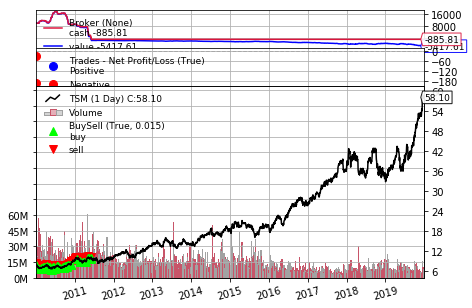

<Figure size 1728x1080 with 0 Axes>

============================================2010-01-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.19             0.0        8.26       8.11        8.12   

   Position  Total Reward     Volumns  
0   10000.0           0.0  11452747.0  
============================================2010-01-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.15            0.05        8.24        8.1         8.2   

   Position  Total Reward     Volumns  
0  10000.05          0.05  20335395.0  
============================================2010-01-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.12            0.08        8.21       8.04        8.17   

   Pos

============================================2010-02-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         6.76           -0.59        6.86       6.65        6.79   

   Position  Total Reward     Volumns  
0  11907.11       1907.11  47714116.0  
============================================2010-02-08 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         6.79            0.17        6.89       6.67        6.86   

   Position  Total Reward     Volumns  
0  11907.28       1907.28  35608415.0  
============================================2010-02-09 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         6.79           -0.07        6.94       6.75        6.86   

   Positi

============================================2010-03-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.42            0.33        7.42       7.28        7.32   

       Position  Total Reward     Volumns  
0  11513.459375   1513.459375  26509329.0  
============================================2010-03-12 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0          7.3           -0.36        7.42       7.25        7.39   

       Position  Total Reward     Volumns  
0  11513.099375   1513.099375  17864324.0  
============================================2010-03-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.17           -0.46        7.25       7.12        

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.95            0.82        7.95       7.65        7.66   

       Position  Total Reward     Volumns  
0  12433.216562   2433.216562  43351356.0  
============================================2010-04-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.87           -0.16        7.95       7.83        7.91   

       Position  Total Reward     Volumns  
0  12433.056562   2433.056562  12976352.0  
============================================2010-04-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.67            -0.4        7.78       7.56        7.77   

       Position  Total Reward     Volumns  
0  12432.656562   2432.656562  25703889.0  
==========================

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.05             0.1        7.08       6.83        7.02   

   Position  Total Reward     Volumns  
0  14219.92       4219.92  18263933.0  
============================================2010-05-18 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         6.88           -0.34        7.12       6.82        7.07   

   Position  Total Reward     Volumns  
0  14219.58       4219.58  22479429.0  
============================================2010-05-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         6.94            0.17        7.01       6.83        6.89   

   Position  Total Reward     Volumns  
0  14219.75       4219.75  24073198.0  
============================================2010-05

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.32        365.3685        7.41       7.27        7.31   

    Position  Total Reward     Volumns  
0  14677.941      4677.941  21336474.0  
============================================2010-06-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.13        361.2485        7.37       7.12        7.31   

     Position  Total Reward     Volumns  
0  15039.1895     5039.1895  16078879.0  
============================================2010-06-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.18        224.5085        7.23       7.08        7.17   

    Position  Total Reward     Volumns  
0  15263.698      5263.698  13019779.0  
=========================================

============================================2010-07-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.68             0.4        7.71       7.57        7.63   

     Position  Total Reward     Volumns  
0  18684.4975     8684.4975  12678809.0  
============================================2010-07-26 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.77             0.8        7.77        7.6        7.69   

     Position  Total Reward    Volumns  
0  18685.2975     8685.2975  9845536.0  
============================================2010-07-27 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.67            -1.0        7.79       7.66        7.77   

  

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.96     -234.336383        7.01       6.85        6.96   

   Position  Total Reward     Volumns  
0   18380.0        8380.0  16366668.0  
============================================2010-08-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         6.93             0.0        6.98       6.91        6.95   

   Position  Total Reward     Volumns  
0   18380.0        8380.0  16497618.0  
============================================2010-08-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.09           -0.09         7.1        6.9         7.0   

   Position  Total Reward     Volumns  
0  18379.91       8379.91  13519373.0  
============================================2010-

============================================2010-09-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.41     -183.574082        7.42       7.24        7.27   

       Position  Total Reward     Volumns  
0  17551.496327   7551.496327  16752714.0  
============================================2010-09-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.55           -0.56        7.61       7.41        7.42   

       Position  Total Reward     Volumns  
0  17550.936327   7550.936327  28321435.0  
============================================2010-09-30 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.45     -432.434082        7.63       7.43        7

============================================2010-10-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.01           -0.77        8.04       7.86        7.89   

     Position  Total Reward     Volumns  
0  15485.0325     5485.0325  17902955.0  
============================================2010-11-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2          8.0            0.07        8.08       7.97        8.01   

     Position  Total Reward    Volumns  
0  15485.1025     5485.1025  8528269.0  
============================================2010-11-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.96            0.28        8.04       7.92        8.04   



============================================2010-12-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.48           -2.56        8.51       8.24        8.24   

       Position  Total Reward     Volumns  
0  14153.581016   4153.581016  37959112.0  
============================================2010-12-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.79           -2.48        8.82       8.48        8.52   

       Position  Total Reward     Volumns  
0  14151.101016   4151.101016  31009056.0  
============================================2010-12-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.73            0.48        8.81       8.69        

0   5759.72      -4240.28  13309198.0  
============================================2011-01-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.45          -39.49        9.49       9.15        9.18   

   Position  Total Reward     Volumns  
0   5720.23      -4279.77  32583326.0  
============================================2011-01-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1          9.6            0.27        9.62       9.46        9.48   

   Position  Total Reward     Volumns  
0    5720.5       -4279.5  28032312.0  
============================================2011-01-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.71          279.86       

0  7085.295     -2914.705  16100136.0  
============================================2011-02-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.62            2.04        9.86       9.62        9.74   

   Position  Total Reward     Volumns  
0  7087.335     -2912.665  18644012.0  
============================================2011-02-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.43            1.77        9.52       9.36        9.49   

   Position  Total Reward     Volumns  
0  7089.105     -2910.895  35870432.0  
============================================2011-02-11 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.51        469.3695        

============================================2011-03-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.75      934.762448        8.76       8.53        8.63   

       Position  Total Reward     Volumns  
0  11453.337972   1453.337972  19319046.0  
============================================2011-03-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0          8.4            3.15        8.75       8.32        8.68   

       Position  Total Reward     Volumns  
0  11456.487972   1456.487972  53345696.0  
============================================2011-03-17 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.53     1081.572448        8.62       8.48        8

============================================2011-04-18 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.78            1.71        8.91       8.72         8.9   

      Position  Total Reward     Volumns  
0  15156.10271    5156.10271  15623299.0  
============================================2011-04-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.79      381.464143        8.82       8.71        8.81   

       Position  Total Reward     Volumns  
0  15537.566853   5537.566853  23285956.0  
============================================2011-04-20 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.15       99.034143        9.15       9.01        9.09

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.85            0.08        9.91       9.79        9.87   

   Position  Total Reward     Volumns  
0  10820.17        820.17  11208950.0  
============================================2011-05-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.64             0.7        9.74       9.62        9.71   

   Position  Total Reward     Volumns  
0  10820.87        820.87  19927386.0  
============================================2011-05-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.66           -0.06        9.81       9.65        9.68   

   Position  Total Reward     Volumns  
0  10820.81        820.81  21451422.0  
============================================2011-

0  10830.94        830.94  35463155.0  
============================================2011-06-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1          9.2           -0.37        9.26       9.06         9.1   

   Position  Total Reward     Volumns  
0  10830.57        830.57  37921815.0  
============================================2011-06-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.42           -1.04        9.42       9.23        9.26   

   Position  Total Reward     Volumns  
0  10829.53        829.53  43566445.0  
============================================2011-06-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.45           -0.06      

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.46           -0.32        9.52       9.36        9.42   

      Position  Total Reward     Volumns  
0  9287.987188   -712.012812  26883897.0  
============================================2011-08-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.59           -1.04        9.72       9.44        9.65   

      Position  Total Reward     Volumns  
0  9286.947188   -713.052812  26287487.0  
============================================2011-08-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.33            2.28        9.54       9.33        9.53   

      Position  Total Reward     Volumns  
0  9289.227188   -710.772812  16734043.0  
===============================

============================================2011-09-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2          9.1            0.36        9.23       9.08        9.13   

       Position  Total Reward     Volumns  
0  14324.691445   4324.691445  11881101.0  
============================================2011-09-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.93            1.02        9.03       8.86        8.97   

       Position  Total Reward     Volumns  
0  14325.711445   4325.711445  14001856.0  
============================================2011-09-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.82            0.66        8.84       8.66       

============================================2011-10-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.05           -0.66        9.05       8.83        8.93   

       Position  Total Reward     Volumns  
0  14834.568709   4834.568709  14950681.0  
============================================2011-10-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.06           -0.11        9.06       8.84        8.99   

       Position  Total Reward     Volumns  
0  14834.458709   4834.458709  21075341.0  
============================================2011-10-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.03            0.33         9.1       8.89       

============================================2011-11-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.95           -0.18        9.96        9.8         9.9   

       Position  Total Reward    Volumns  
0  13091.518503   3091.518503  9978223.0  
============================================2011-11-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1          9.9            0.71        9.94       9.75        9.91   

       Position  Total Reward    Volumns  
0  13092.228503   3092.228503  9855571.0  
============================================2011-11-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.55            5.31        9.69       9.51        9.6

============================================2011-12-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.74             1.6        9.98       9.65        9.91   

     Position  Total Reward     Volumns  
0  9771.00326    -228.99674  16398606.0  
============================================2011-12-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.61             1.3         9.8        9.6        9.68   

     Position  Total Reward     Volumns  
0  9772.30326    -227.69674  12798840.0  
============================================2011-12-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.57     -112.870326        9.72       9.52        9.72   


   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.59      -636.99279       10.67      10.43       10.43   

      Position  Total Reward     Volumns  
0  6856.999057  -3143.000943  18292341.0  
============================================2012-01-19 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.92           -4.62       10.92      10.62       10.63   

      Position  Total Reward     Volumns  
0  6852.379057  -3147.620943  18567822.0  
============================================2012-01-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         10.7            3.08       10.92      10.68       10.87   

      Position  Total Reward     Volumns  
0  6855.459057  -3144.540943  18808943.0  
===============================

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.01     -876.095469       11.23      10.97       11.16   

      Position  Total Reward     Volumns  
0  2794.213912  -7205.786088  12493844.0  
============================================2012-02-22 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.09     -751.135469        11.1      10.95       11.03   

      Position  Total Reward    Volumns  
0  2043.078443  -7956.921557  9554230.0  
============================================2012-02-23 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.83     -685.195469       10.97      10.79       10.97   

      Position  Total Reward     Volumns  
0  1357.882974  -8642.117026  12156058.0  
==================================

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.77           -4.35       11.79      11.47       11.48   

     Position  Total Reward     Volumns  
0 -375.967964 -10375.967964  12655811.0  
============================================2012-03-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.77             0.0       11.87      11.75       11.81   

     Position  Total Reward    Volumns  
0 -375.967964 -10375.967964  7687795.0  
============================================2012-03-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.62            2.25       11.78      11.58        11.7   

     Position  Total Reward     Volumns  
0 -373.717964 -10373.717964  14157814.0  
=========================================

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.36           -3.75       12.36      11.98       12.07   

     Position  Total Reward     Volumns  
0 -384.817964 -10384.817964  20726845.0  
============================================2012-04-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.93            6.45        12.3      11.93        12.3   

     Position  Total Reward     Volumns  
0 -378.367964 -10378.367964  19412807.0  
============================================2012-05-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.89             0.6       12.06      11.88       11.95   

     Position  Total Reward     Volumns  
0 -377.767964 -10377.767964  12168597.0  
=====================================

============================================2012-05-31 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.51            2.25       10.75      10.46       10.71   

     Position  Total Reward     Volumns  
0 -357.067964 -10357.067964  31077731.0  
============================================2012-06-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         10.0            7.65       10.28       9.98       10.26   

     Position  Total Reward     Volumns  
0 -349.417964 -10349.417964  26186645.0  
============================================2012-06-04 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.97            0.45       10.09       9.85       10.01   

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.05           -1.95       11.05      10.93       10.99   

     Position  Total Reward    Volumns  
0 -365.167964 -10365.167964  7493692.0  
============================================2012-07-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.82            3.45       10.99      10.74       10.86   

     Position  Total Reward     Volumns  
0 -361.717964 -10361.717964  16125883.0  
============================================2012-07-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         10.7             1.8       10.78      10.61       10.74   

     Position  Total Reward     Volumns  
0 -359.917964 -10359.917964  18192130.0  
=======================================

============================================2012-08-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.29           -0.75       11.39       11.2       11.24   

     Position  Total Reward     Volumns  
0 -368.767964 -10368.767964  16697844.0  
============================================2012-08-07 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.24            0.75       11.38      11.22       11.27   

     Position  Total Reward     Volumns  
0 -368.017964 -10368.017964  14227250.0  
============================================2012-08-08 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.17            1.05       11.22      11.13       11.18   



============================================2012-09-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         11.5           -1.05       11.61      11.43       11.47   

     Position  Total Reward     Volumns  
0 -371.917964 -10371.917964  10014671.0  
============================================2012-09-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.66            -2.4       11.73      11.53       11.55   

     Position  Total Reward     Volumns  
0 -374.317964 -10374.317964  14866435.0  
============================================2012-09-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.83           -2.55       11.89      11.67       11.68   

============================================2012-10-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        11.99            2.85        12.2      11.98       12.15   

     Position  Total Reward     Volumns  
0 -379.267964 -10379.267964  12825539.0  
============================================2012-10-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.92            1.05       12.08      11.89       12.04   

     Position  Total Reward     Volumns  
0 -378.217964 -10378.217964  10454077.0  
============================================2012-10-12 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.99           -1.05       12.02      11.93        12.0   


============================================2012-11-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        12.62            3.15       12.92      12.58       12.88   

     Position  Total Reward     Volumns  
0 -388.717964 -10388.717964  16060299.0  
============================================2012-11-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        12.73           -1.65       12.76      12.61       12.73   

     Position  Total Reward    Volumns  
0 -390.367964 -10390.367964  8643856.0  
============================================2012-11-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        12.84           -1.65        12.9      12.61       12.76   

 

============================================2012-12-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.46           -0.45        13.5      13.29       13.37   

     Position  Total Reward     Volumns  
0 -401.317964 -10401.317964  11519551.0  
============================================2012-12-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.55           -1.35       13.64      13.47       13.49   

     Position  Total Reward    Volumns  
0 -402.667964 -10402.667964  8349995.0  
============================================2012-12-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.56           -0.15       13.58      13.44       13.49   



============================================2013-01-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.49           -1.35       14.52      14.37       14.39   

     Position  Total Reward     Volumns  
0 -416.767964 -10416.767964  11616412.0  
============================================2013-01-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.12            5.55       14.33      14.11        14.3   

     Position  Total Reward     Volumns  
0 -411.217964 -10411.217964  11056306.0  
============================================2013-01-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.07            0.75       14.11      13.93       14.07   


============================================2013-02-26 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.12            5.25       14.33      14.03       14.32   

     Position  Total Reward     Volumns  
0 -411.217964 -10411.217964  23872133.0  
============================================2013-02-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.41           -4.35       14.57      14.26       14.27   

     Position  Total Reward     Volumns  
0 -415.567964 -10415.567964  19558024.0  
============================================2013-02-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.47            -0.9       14.67      14.37       14.52   


============================================2013-04-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.54            1.35       13.69       13.5       13.65   

     Position  Total Reward     Volumns  
0 -402.517964 -10402.517964  13683165.0  
============================================2013-04-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.57           -0.45       13.66      13.53       13.58   

     Position  Total Reward     Volumns  
0 -402.967964 -10402.967964  12868924.0  
============================================2013-04-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.27             4.5       13.57       13.2       13.55   

============================================2013-05-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        15.49            -5.1       15.49      15.17       15.17   

     Position  Total Reward     Volumns  
0 -431.767964 -10431.767964  14211611.0  
============================================2013-05-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        15.39             1.5       15.52      15.38       15.38   

     Position  Total Reward     Volumns  
0 -430.267964 -10430.267964  11672032.0  
============================================2013-05-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         15.5           -1.65       15.56      15.45       15.45   

============================================2013-06-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         14.8             3.3       15.04      14.76       15.03   

     Position  Total Reward    Volumns  
0 -421.417964 -10421.417964  8173676.0  
============================================2013-06-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.75            0.75       14.86      14.67       14.79   

     Position  Total Reward    Volumns  
0 -420.667964 -10420.667964  8199277.0  
============================================2013-06-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.82           -1.05       14.95      14.79       14.92   

  

============================================2013-07-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.54            -3.0       14.69      14.52       14.56   

     Position  Total Reward     Volumns  
0 -417.517964 -10417.517964  11489838.0  
============================================2013-07-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.54             0.0       14.76      14.52       14.65   

     Position  Total Reward    Volumns  
0 -417.517964 -10417.517964  9942473.0  
============================================2013-07-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        15.11           -8.55       15.21      15.05       15.08   



============================================2013-08-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.21            0.15       13.26      13.15       13.16   

     Position  Total Reward     Volumns  
0 -397.567964 -10397.567964  12991191.0  
============================================2013-08-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.08            1.95       13.23      13.02       13.18   

     Position  Total Reward     Volumns  
0 -395.617964 -10395.617964  18370221.0  
============================================2013-08-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.26            -2.7       13.33      13.13       13.26   

============================================2013-09-12 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.08            1.95       14.25      14.03       14.17   

     Position  Total Reward    Volumns  
0 -410.617964 -10410.617964  6692038.0  
============================================2013-09-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.12            -0.6       14.13      14.03       14.07   

     Position  Total Reward    Volumns  
0 -411.217964 -10411.217964  5025410.0  
============================================2013-09-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.36            -3.6       14.47      14.34       14.38   

     

============================================2013-10-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.79           -1.65       14.86      14.65       14.67   

     Position  Total Reward     Volumns  
0 -421.267964 -10421.267964  13758188.0  
============================================2013-10-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         14.9           -1.65       14.91      14.78       14.81   

     Position  Total Reward     Volumns  
0 -422.917964 -10422.917964  19138813.0  
============================================2013-10-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         15.2            -4.5       15.25      14.82       14.87   

============================================2013-11-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.39           -1.95       14.48       14.3       14.37   

     Position  Total Reward     Volumns  
0 -415.267964 -10415.267964  15545678.0  
============================================2013-11-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.43            -0.6       14.57       14.4       14.44   

     Position  Total Reward     Volumns  
0 -415.867964 -10415.867964  12527879.0  
============================================2013-11-19 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.32            1.65       14.55       14.3       14.54   

============================================2013-12-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         13.9           -0.75       13.93      13.77       13.83   

     Position  Total Reward     Volumns  
0 -407.917964 -10407.917964  10329224.0  
============================================2013-12-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.85            0.75       13.97      13.75        13.8   

     Position  Total Reward    Volumns  
0 -407.167964 -10407.167964  9317811.0  
============================================2013-12-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.97            -1.8       14.06       13.9       13.96   

  

============================================2014-01-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.32            1.65       14.48      14.27       14.44   

     Position  Total Reward     Volumns  
0 -414.217964 -10414.217964  15218682.0  
============================================2014-01-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.98             5.1       14.12      13.87       14.11   

     Position  Total Reward     Volumns  
0 -409.117964 -10409.117964  13505059.0  
============================================2014-01-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.99           -0.15       14.07       13.9       14.01   


============================================2014-02-27 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.68           -2.25       14.68       14.5       14.52   

     Position  Total Reward     Volumns  
0 -419.617964 -10419.617964  10625544.0  
============================================2014-02-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.73           -0.75       14.79      14.65       14.69   

     Position  Total Reward     Volumns  
0 -420.367964 -10420.367964  13840028.0  
============================================2014-03-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.69             0.6       14.74      14.48       14.56   

============================================2014-04-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.56            -3.6       16.59      16.35       16.36   

     Position  Total Reward     Volumns  
0 -447.817964 -10447.817964  19795871.0  
============================================2014-04-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.33            3.45       16.59      16.29       16.54   

     Position  Total Reward     Volumns  
0 -444.367964 -10444.367964  18251819.0  
============================================2014-04-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.25             1.2       16.37      16.14       16.27   

============================================2014-05-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.02           -0.45       16.08      15.89       15.92   

     Position  Total Reward    Volumns  
0 -439.717964 -10439.717964  8664068.0  
============================================2014-05-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         16.3            -4.2       16.37      16.08       16.12   

     Position  Total Reward     Volumns  
0 -443.917964 -10443.917964  12944690.0  
============================================2014-05-07 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        16.57           -4.05       16.58      16.28       16.33   

 

============================================2014-06-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.19            1.35        17.3      17.17       17.29   

     Position  Total Reward    Volumns  
0 -457.267964 -10457.267964  9383946.0  
============================================2014-06-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.29            -1.5       17.38      17.25       17.35   

     Position  Total Reward    Volumns  
0 -458.767964 -10458.767964  9977690.0  
============================================2014-06-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.36           -1.05       17.44      17.22       17.27   

  

============================================2014-07-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         18.7           -6.45        18.7      18.09        18.1   

     Position  Total Reward     Volumns  
0 -479.917964 -10479.917964  17707771.0  
============================================2014-07-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.59            1.65        18.8      18.53       18.74   

     Position  Total Reward     Volumns  
0 -478.267964 -10478.267964  15982853.0  
============================================2014-07-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        18.88           -4.35        18.9      18.68       18.78   


============================================2014-08-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.66            0.75       16.76      16.58       16.75   

     Position  Total Reward     Volumns  
0 -449.317964 -10449.317964  11141741.0  
============================================2014-08-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        16.94            -4.2       17.04      16.89       16.94   

     Position  Total Reward     Volumns  
0 -453.517964 -10453.517964  14320518.0  
============================================2014-08-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.11           -2.55       17.16      17.05       17.12   



============================================2014-09-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.86            1.35       17.06      16.86       17.06   

     Position  Total Reward    Volumns  
0 -452.317964 -10452.317964  9688509.0  
============================================2014-09-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.06            -3.0       17.16      16.78       16.86   

     Position  Total Reward    Volumns  
0 -455.317964 -10455.317964  9851845.0  
============================================2014-09-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.18            -1.8       17.27      17.11       17.13   

  

============================================2014-10-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.26            -8.1       17.57      16.82       16.86   

     Position  Total Reward     Volumns  
0 -458.317964 -10458.317964  36798422.0  
============================================2014-10-17 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.26             0.0       17.35      17.12       17.12   

     Position  Total Reward     Volumns  
0 -458.317964 -10458.317964  17772805.0  
============================================2014-10-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.39           -1.95       17.49      17.19       17.32   


============================================2014-11-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.37           -1.65       18.42      18.08       18.13   

     Position  Total Reward     Volumns  
0 -474.967964 -10474.967964  16018100.0  
============================================2014-11-19 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.77            -6.0       18.86      18.53       18.61   

     Position  Total Reward     Volumns  
0 -480.967964 -10480.967964  17972028.0  
============================================2014-11-20 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        18.96           -2.85       19.01      18.76       18.83   


============================================2014-12-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.64            -2.1       18.81      18.51       18.56   

     Position  Total Reward    Volumns  
0 -479.017964 -10479.017964  5658240.0  
============================================2014-12-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.51            1.95       18.64       18.5       18.51   

     Position  Total Reward    Volumns  
0 -477.067964 -10477.067964  7266891.0  
============================================2014-12-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.62           -1.65       18.76      18.51       18.53   

  

============================================2015-01-27 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.16           -0.45       20.21      19.96       20.11   

     Position  Total Reward     Volumns  
0 -501.817964 -10501.817964  17684235.0  
============================================2015-01-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.94             3.3       20.41      19.87       20.36   

     Position  Total Reward     Volumns  
0 -498.517964 -10498.517964  20117611.0  
============================================2015-01-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.41            7.95       19.83      19.23       19.74   

============================================2015-03-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.52            -1.2       20.52      20.33       20.33   

     Position  Total Reward    Volumns  
0 -507.217964 -10507.217964  8498342.0  
============================================2015-03-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.41            1.65       20.61      20.33       20.59   

     Position  Total Reward    Volumns  
0 -505.567964 -10505.567964  8983313.0  
============================================2015-03-04 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.27             2.1        20.5      20.11       20.47   

  

============================================2015-04-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.74            -5.7       19.86      19.65       19.68   

     Position  Total Reward     Volumns  
0 -495.517964 -10495.517964  14933784.0  
============================================2015-04-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.61            1.95       19.78      19.32       19.33   

     Position  Total Reward     Volumns  
0 -493.567964 -10493.567964  13728497.0  
============================================2015-04-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.49             1.8       19.69      19.46       19.61   

============================================2015-05-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.37           -1.95       20.42      20.21       20.31   

     Position  Total Reward    Volumns  
0 -504.967964 -10504.967964  9963697.0  
============================================2015-05-07 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.31             0.9       20.34      20.19       20.29   

     Position  Total Reward    Volumns  
0 -504.067964 -10504.067964  8760450.0  
============================================2015-05-08 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.46           -2.25       20.61      20.32       20.38   

    

============================================2015-06-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.02           -2.25       19.25      18.92       19.06   

     Position  Total Reward     Volumns  
0 -484.717964 -10484.717964  16856866.0  
============================================2015-06-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.44            -6.3       19.45      19.16       19.21   

     Position  Total Reward     Volumns  
0 -491.017964 -10491.017964  17536140.0  
============================================2015-06-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.59           -2.25       19.76      19.55       19.71   

============================================2015-07-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.65           -3.75       19.67      19.39        19.5   

     Position  Total Reward     Volumns  
0 -494.167964 -10494.167964  13380671.0  
============================================2015-07-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         19.6            0.75       19.68       19.5       19.57   

     Position  Total Reward     Volumns  
0 -493.417964 -10493.417964  10212922.0  
============================================2015-07-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.39            3.15       19.69      19.26       19.52   


============================================2015-08-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.65            2.85       17.78      17.54       17.66   

     Position  Total Reward    Volumns  
0 -464.167964 -10464.167964  9160032.0  
============================================2015-08-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.52            1.95       17.53      17.38       17.51   

     Position  Total Reward     Volumns  
0 -462.217964 -10462.217964  13211045.0  
============================================2015-08-17 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.43            1.35       17.46      16.92        17.1   

  

============================================2015-09-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.77            -3.6       17.84      17.59        17.8   

     Position  Total Reward     Volumns  
0 -465.967964 -10465.967964  13345650.0  
============================================2015-09-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.76            0.15       18.07      17.68       17.69   

     Position  Total Reward     Volumns  
0 -465.817964 -10465.817964  13256184.0  
============================================2015-09-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.72             0.6       17.84      17.49       17.65   


============================================2015-10-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.11            -0.9       19.17      18.88       18.98   

     Position  Total Reward     Volumns  
0 -486.067964 -10486.067964  10401978.0  
============================================2015-10-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.18           -1.05       19.27      19.06       19.08   

     Position  Total Reward    Volumns  
0 -487.117964 -10487.117964  7816288.0  
============================================2015-10-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         19.1             1.2        19.3      19.03       19.19   



0 -489.817964 -10489.817964  9319419.0  
============================================2015-11-19 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.49           -1.95       19.72      19.42       19.72   

     Position  Total Reward    Volumns  
0 -491.767964 -10491.767964  8277815.0  
============================================2015-11-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.62           -1.95       19.67      19.52       19.61   

     Position  Total Reward    Volumns  
0 -493.717964 -10493.717964  7026910.0  
============================================2015-11-23 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         19.4             3.3 

============================================2015-12-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.84            -0.3       19.95      19.74       19.94   

     Position  Total Reward    Volumns  
0 -497.017964 -10497.017964  7181645.0  
============================================2015-12-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         19.9            -0.9       20.01      19.84        19.9   

     Position  Total Reward    Volumns  
0 -497.917964 -10497.917964  2337883.0  
============================================2015-12-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.78             1.8       19.93      19.64        19.9   

   

============================================2016-01-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.59             0.6        18.8      18.46       18.72   

     Position  Total Reward    Volumns  
0 -478.267964 -10478.267964  8340523.0  
============================================2016-01-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.21            -9.3       19.25       18.8        18.8   

     Position  Total Reward     Volumns  
0 -487.567964 -10487.567964  10482603.0  
============================================2016-02-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.31            -1.5       19.38      19.04       19.06   



============================================2016-03-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        21.16           -0.45       21.23      20.96       21.02   

     Position  Total Reward    Volumns  
0 -516.817964 -10516.817964  6795856.0  
============================================2016-03-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        21.11            0.75       21.38      21.02       21.17   

     Position  Total Reward    Volumns  
0 -516.067964 -10516.067964  9257874.0  
============================================2016-03-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        21.19            -1.2       21.45      21.01       21.11   

  

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        21.93            4.35       22.03      21.69       21.93   

     Position  Total Reward     Volumns  
0 -528.367964 -10528.367964  10020029.0  
============================================2016-04-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        22.02           -1.35       22.12      21.51       21.62   

     Position  Total Reward    Volumns  
0 -529.717964 -10529.717964  9694853.0  
============================================2016-04-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        21.81            3.15       21.94       21.7       21.91   

     Position  Total Reward    Volumns  
0 -526.567964 -10526.567964  9044855.0  
=========================================

============================================2016-05-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.09            0.45       20.19      19.94       20.11   

     Position  Total Reward    Volumns  
0 -500.767964 -10500.767964  6037892.0  
============================================2016-05-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         20.1           -0.15       20.15      19.98       20.03   

     Position  Total Reward    Volumns  
0 -500.917964 -10500.917964  6252773.0  
============================================2016-05-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.96             2.1       20.16      19.88       20.08   

  

============================================2016-06-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        22.23             4.8       22.32      21.95       22.26   

     Position  Total Reward    Volumns  
0 -532.867964 -10532.867964  7794182.0  
============================================2016-06-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        22.03             3.0       22.19      21.92       21.96   

     Position  Total Reward    Volumns  
0 -529.867964 -10529.867964  8626257.0  
============================================2016-06-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        21.98            0.75        22.1      21.82       21.95   

   

0 -559.267964 -10559.267964  11828713.0  
============================================2016-07-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        24.19            -3.0       24.29      23.77       24.09   

     Position  Total Reward     Volumns  
0 -562.267964 -10562.267964  13612890.0  
============================================2016-07-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         24.1            1.35       24.32      24.06       24.26   

     Position  Total Reward    Volumns  
0 -560.917964 -10560.917964  6721204.0  
============================================2016-07-18 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        24.66            -8.4

============================================2016-08-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        25.94             4.2       26.05      25.86       26.02   

     Position  Total Reward    Volumns  
0 -588.517964 -10588.517964  6629182.0  
============================================2016-08-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        25.86             1.2       25.87      25.64       25.87   

     Position  Total Reward    Volumns  
0 -587.317964 -10587.317964  7842395.0  
============================================2016-08-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        26.02            -2.4       26.05      25.73       25.79   

  

============================================2016-09-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         26.7          -13.65       26.87      26.65       26.68   

     Position  Total Reward    Volumns  
0 -599.917964 -10599.917964  8626544.0  
============================================2016-09-20 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        26.68             0.3       26.98      26.67       26.91   

     Position  Total Reward    Volumns  
0 -599.617964 -10599.617964  6459821.0  
============================================2016-09-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.21           -7.95       27.26      26.81       26.85   

    

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.71           -1.05       27.79      27.48        27.6   

     Position  Total Reward    Volumns  
0 -615.067964 -10615.067964  8215639.0  
============================================2016-10-21 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        27.73            -0.3       27.78      27.44       27.59   

     Position  Total Reward    Volumns  
0 -615.367964 -10615.367964  4278413.0  
============================================2016-10-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        28.02           -4.35       28.02      27.73       27.78   

     Position  Total Reward    Volumns  
0 -619.717964 -10619.717964  4224389.0  
============================================

============================================2016-11-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        26.67            0.15       26.88      26.53       26.68   

     Position  Total Reward    Volumns  
0 -599.467964 -10599.467964  4503033.0  
============================================2016-11-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.46            3.15        26.6      26.42       26.54   

     Position  Total Reward    Volumns  
0 -596.317964 -10596.317964  2355812.0  
============================================2016-11-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        26.46             0.0       26.71      26.35       26.51   

    

============================================2016-12-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        25.98            -0.3       26.16      25.91       26.11   

     Position  Total Reward    Volumns  
0 -589.117964 -10589.117964  4106026.0  
============================================2016-12-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        25.99           -0.15       26.02       25.7       25.86   

     Position  Total Reward    Volumns  
0 -589.267964 -10589.267964  5967317.0  
============================================2016-12-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        25.65             5.1       26.08      25.53       26.05   

   

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        27.73           -2.25       27.93      27.51       27.87   

     Position  Total Reward    Volumns  
0 -615.367964 -10615.367964  5645632.0  
============================================2017-02-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.46            4.05       27.56      27.32        27.4   

     Position  Total Reward    Volumns  
0 -611.317964 -10611.317964  6495128.0  
============================================2017-02-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        27.63           -2.55       27.73      27.48       27.62   

     Position  Total Reward    Volumns  
0 -613.867964 -10613.867964  5883477.0  
===========================================

============================================2017-03-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.85             1.2       28.12      27.84       28.08   

     Position  Total Reward    Volumns  
0 -617.167964 -10617.167964  5075789.0  
============================================2017-03-09 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        27.64            3.15       27.71      27.41       27.56   

     Position  Total Reward    Volumns  
0 -614.017964 -10614.017964  6860414.0  
============================================2017-03-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        27.71           -1.05       27.73       27.5       27.54   

    

============================================2017-04-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        29.01             4.8       29.33      28.92       29.33   

     Position  Total Reward    Volumns  
0 -634.567964 -10634.567964  5533771.0  
============================================2017-04-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        28.91             1.5       29.17      28.53       29.17   

     Position  Total Reward    Volumns  
0 -633.067964 -10633.067964  7054434.0  
============================================2017-04-12 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         28.8            1.65       29.12      28.57       28.97   

   

============================================2017-05-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        31.28             4.2       31.57      31.12       31.55   

     Position  Total Reward     Volumns  
0 -668.617964 -10668.617964  10967225.0  
============================================2017-05-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        31.25            0.45       31.25      31.05       31.24   

     Position  Total Reward    Volumns  
0 -668.167964 -10668.167964  6776911.0  
============================================2017-05-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        30.71             8.1       31.06      30.68       31.05   



============================================2017-06-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         32.0            -5.7       32.07      31.87        32.0   

     Position  Total Reward    Volumns  
0 -679.417964 -10679.417964  8330639.0  
============================================2017-06-19 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        32.31           -4.65       32.44      32.18       32.23   

     Position  Total Reward    Volumns  
0 -684.067964 -10684.067964  5070409.0  
============================================2017-06-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        32.23             1.2       32.78      32.23       32.58   

  

============================================2017-07-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        33.26             4.2       33.54      33.24       33.54   

     Position  Total Reward    Volumns  
0 -698.317964 -10698.317964  7594646.0  
============================================2017-07-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        33.03            3.45       33.22      32.89       33.22   

     Position  Total Reward    Volumns  
0 -694.867964 -10694.867964  5452892.0  
============================================2017-07-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        33.37            -5.1       33.37      33.17       33.27   

  

============================================2017-08-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        33.64           -7.35       33.78      33.48        33.6   

     Position  Total Reward    Volumns  
0 -704.017964 -10704.017964  3476022.0  
============================================2017-08-23 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         33.7            -0.9       33.72      33.51        33.6   

     Position  Total Reward    Volumns  
0 -704.917964 -10704.917964  3209103.0  
============================================2017-08-24 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        33.93           -3.45       34.02       33.7       33.88   

   

============================================2017-09-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        34.15            9.75       34.55      33.96       34.55   

     Position  Total Reward    Volumns  
0 -711.667964 -10711.667964  6398885.0  
============================================2017-09-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        34.22           -1.05       34.38      34.02       34.17   

     Position  Total Reward    Volumns  
0 -712.717964 -10712.717964  6507866.0  
============================================2017-09-27 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        34.32            -1.5       34.42       34.1       34.35   

  

============================================2017-10-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.96            -0.6       38.08      37.84       37.94   

     Position  Total Reward    Volumns  
0 -768.817964 -10768.817964  3963618.0  
============================================2017-10-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        38.83          -13.05       38.86      38.16       38.21   

     Position  Total Reward    Volumns  
0 -781.867964 -10781.867964  5235036.0  
============================================2017-10-30 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        38.81             0.3        39.3      38.77       39.02   

  

============================================2017-11-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.31            21.0       37.69      36.15       37.66   

     Position  Total Reward     Volumns  
0 -744.067964 -10744.067964  12804390.0  
============================================2017-11-30 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.48           -2.55       36.61      36.09       36.48   

     Position  Total Reward     Volumns  
0 -746.617964 -10746.617964  10156914.0  
============================================2017-12-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.57           -1.35       36.84      35.93        36.8   

 

============================================2018-01-03 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        38.43            -9.6       38.52      38.18       38.31   

     Position  Total Reward    Volumns  
0 -775.867964 -10775.867964  7558390.0  
============================================2018-01-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        38.22            3.15       38.69      38.19       38.62   

     Position  Total Reward    Volumns  
0 -772.717964 -10772.717964  5293436.0  
============================================2018-01-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.12           -13.5       39.22       38.5       38.59   

   

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        40.16           -8.85       40.26      38.78       38.94   

     Position  Total Reward     Volumns  
0 -801.817964 -10801.817964  14560692.0  
============================================2018-02-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        38.58            23.7        39.6      38.58        39.6   

     Position  Total Reward     Volumns  
0 -778.117964 -10778.117964  16542121.0  
============================================2018-02-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.18            21.0        38.8      37.18       38.79   

     Position  Total Reward     Volumns  
0 -757.117964 -10757.117964  12326673.0  
=====================================

============================================2018-03-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        41.45            3.15       42.15      41.37       41.92   

     Position  Total Reward    Volumns  
0 -821.167964 -10821.167964  6341680.0  
============================================2018-03-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        41.59            -2.1       41.87       41.3       41.85   

     Position  Total Reward    Volumns  
0 -823.267964 -10823.267964  4668092.0  
============================================2018-03-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        41.74           -2.25       42.06      41.36       41.55   

     

============================================2018-04-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        39.49            -3.0       39.62      39.32       39.44   

     Position  Total Reward    Volumns  
0 -791.767964 -10791.767964  5651968.0  
============================================2018-04-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        38.98            7.65       39.02      38.48       38.78   

     Position  Total Reward     Volumns  
0 -784.117964 -10784.117964  10671429.0  
============================================2018-04-18 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        38.62             5.4       38.93      37.96       38.78   

 

============================================2018-05-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        35.89           11.55       36.15      35.62       35.99   

     Position  Total Reward    Volumns  
0 -737.767964 -10737.767964  8644954.0  
============================================2018-05-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        35.39             7.5       35.51      35.27       35.44   

     Position  Total Reward    Volumns  
0 -730.267964 -10730.267964  8449241.0  
============================================2018-05-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.36          -14.55       36.57      36.04       36.24   

  

============================================2018-06-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        35.33          -10.95       35.55      35.02       35.32   

     Position  Total Reward    Volumns  
0 -729.367964 -10729.367964  9409562.0  
============================================2018-06-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        34.66           10.05       35.02      34.59       34.89   

     Position  Total Reward     Volumns  
0 -719.317964 -10719.317964  10037077.0  
============================================2018-06-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        35.12            -6.9       35.29      34.98       35.26   



============================================2018-07-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        38.57            4.95       39.35      38.56       39.25   

     Position  Total Reward    Volumns  
0 -777.967964 -10777.967964  7349335.0  
============================================2018-07-25 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        39.05            -7.2       39.06      38.49        38.7   

     Position  Total Reward    Volumns  
0 -785.167964 -10785.167964  8090102.0  
============================================2018-07-26 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        38.98            1.05        39.1      38.62       38.87   

    

============================================2018-08-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        39.66            -4.2       39.83      39.51       39.56   

     Position  Total Reward    Volumns  
0 -794.317964 -10794.317964  6003411.0  
============================================2018-08-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        40.44           -11.7       40.83      40.35       40.48   

     Position  Total Reward     Volumns  
0 -806.017964 -10806.017964  11187413.0  
============================================2018-08-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        42.14           -25.5       42.38      41.15       41.24   

  

============================================2018-09-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        42.17            8.55       42.61      41.99        42.5   

     Position  Total Reward    Volumns  
0 -831.967964 -10831.967964  8092196.0  
============================================2018-10-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        42.65            -7.2       42.93      42.42       42.54   

     Position  Total Reward    Volumns  
0 -839.167964 -10839.167964  5267043.0  
============================================2018-10-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        41.66           14.85       42.01      41.49       41.78   

    

============================================2018-10-31 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.38            -4.5       37.23      36.32       36.95   

     Position  Total Reward     Volumns  
0 -745.117964 -10745.117964  13205722.0  
============================================2018-11-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.29          -13.65       37.32      36.66       37.03   

     Position  Total Reward     Volumns  
0 -758.767964 -10758.767964  15025386.0  
============================================2018-11-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.03             3.9       37.71       36.7       37.42   


============================================2018-12-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         35.2            8.25        35.2      34.01       34.09   

     Position  Total Reward     Volumns  
0 -727.417964 -10727.417964  12645279.0  
============================================2018-12-07 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        34.88             4.8       35.28      34.51        35.0   

     Position  Total Reward     Volumns  
0 -722.617964 -10722.617964  11312236.0  
============================================2018-12-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        34.79            1.35       35.17      34.45       34.67   

 

============================================2019-01-11 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        34.96            -2.7       35.11      34.61       34.81   

     Position  Total Reward    Volumns  
0 -723.817964 -10723.817964  7573848.0  
============================================2019-01-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        34.15           12.15       34.56      34.11        34.5   

     Position  Total Reward    Volumns  
0 -711.667964 -10711.667964  6436100.0  
============================================2019-01-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        34.42           -4.05        34.6      34.19       34.42   

     

============================================2019-02-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        36.35             0.9       36.49      36.06       36.21   

     Position  Total Reward    Volumns  
0 -744.667964 -10744.667964  8149895.0  
============================================2019-02-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.37            -0.3       36.56      36.16        36.2   

     Position  Total Reward    Volumns  
0 -744.967964 -10744.967964  6552755.0  
============================================2019-02-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.73            -5.4       36.92      36.38        36.5   

  

Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.19          -16.95       39.38      38.41       38.44   

     Position  Total Reward    Volumns  
0 -787.267964 -10787.267964  6816641.0  
============================================2019-03-22 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        38.61             8.7       39.17      38.52        39.0   

     Position  Total Reward    Volumns  
0 -778.567964 -10778.567964  7077910.0  
============================================2019-03-25 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        38.12            7.35       38.64      37.98        38.2   

     Position  Total Reward    Volumns  
0 -771.217964 -10771.217964  5133005.0  
=====================================

============================================2019-04-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        42.48            13.2       43.01      42.43       42.91   

     Position  Total Reward     Volumns  
0 -836.617964 -10836.617964  10628541.0  
============================================2019-04-26 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        41.96             7.8       42.02      41.37       41.68   

     Position  Total Reward     Volumns  
0 -828.817964 -10828.817964  13346149.0  
============================================2019-04-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        41.86             1.5       41.94      41.62       41.87   

============================================2019-05-30 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.33            -5.1       36.64      36.14       36.24   

     Position  Total Reward    Volumns  
0 -744.367964 -10744.367964  7698356.0  
============================================2019-05-31 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        36.62           -4.35       37.21      36.53       36.55   

     Position  Total Reward    Volumns  
0 -748.717964 -10748.717964  9741484.0  
============================================2019-06-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        37.07           -6.75       37.33      36.92       37.21   

   

============================================2019-07-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        40.23            8.55       40.73      40.17       40.61   

     Position  Total Reward    Volumns  
0 -802.867964 -10802.867964  4508690.0  
============================================2019-07-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.77             6.9       39.81      39.45       39.79   

     Position  Total Reward    Volumns  
0 -795.967964 -10795.967964  3169348.0  
============================================2019-07-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        39.37             6.0       39.54      39.09       39.31   

  

============================================2019-08-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        39.31            26.4       39.95      39.22       39.84   

     Position  Total Reward    Volumns  
0 -789.067964 -10789.067964  6763034.0  
============================================2019-08-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        40.68          -20.55       40.93      40.32        40.6   

     Position  Total Reward    Volumns  
0 -809.617964 -10809.617964  8790707.0  
============================================2019-08-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        40.68             0.0       40.87      40.23       40.48   

   

============================================2019-09-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         43.1             7.8       43.42      43.08       43.38   

     Position  Total Reward    Volumns  
0 -845.917964 -10845.917964  4386682.0  
============================================2019-09-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        43.24            -2.1       43.46      42.93        43.3   

     Position  Total Reward    Volumns  
0 -848.017964 -10848.017964  4743373.0  
============================================2019-09-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        43.48            -3.6       43.48      42.75       42.99   

  

============================================2019-10-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        48.34          -12.15       48.72      47.84       47.87   

     Position  Total Reward     Volumns  
0 -924.517964 -10924.517964  11110175.0  
============================================2019-10-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        48.59           -3.75       49.05      48.15       48.57   

     Position  Total Reward    Volumns  
0 -928.267964 -10928.267964  9633330.0  
============================================2019-10-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        49.08           -7.35       49.44      48.99       49.11   



============================================2019-11-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        51.79            6.75       52.32      51.67       52.32   

     Position  Total Reward    Volumns  
0 -976.267964 -10976.267964  8685354.0  
============================================2019-11-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        52.51           -10.8       52.57      51.79       52.22   

     Position  Total Reward    Volumns  
0 -987.067964 -10987.067964  5373478.0  
============================================2019-11-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        52.12            5.85       52.36      51.77       52.14   

  

============================================2019-12-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        58.13            -4.2       58.29      57.89       57.89   

      Position  Total Reward    Volumns  
0 -1071.367964 -11071.367964  5819774.0  
============================================2019-12-17 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        58.82          -10.35        59.3      58.37        59.3   

      Position  Total Reward    Volumns  
0 -1081.717964 -11081.717964  8466233.0  
============================================2019-12-18 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        58.69            1.95       59.23      58.31       59.19   

 

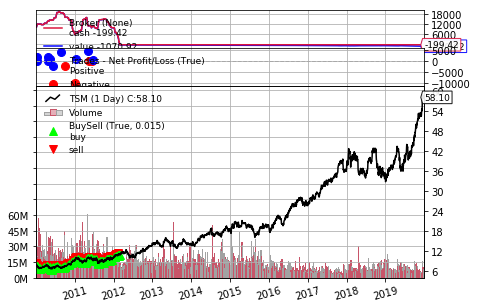

<Figure size 1728x1080 with 0 Axes>

============================================2010-01-04 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.19             0.0        8.26       8.11        8.12   

   Position  Total Reward     Volumns  
0   10000.0           0.0  11452747.0  
============================================2010-01-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.15             0.0        8.24        8.1         8.2   

   Position  Total Reward     Volumns  
0   10000.0           0.0  20335395.0  
============================================2010-01-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.12           -0.05        8.21       8.04        8.17   

   Posi

============================================2010-02-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         6.76         -360.01        6.86       6.65        6.79   

   Position  Total Reward     Volumns  
0   9898.44       -101.56  47714116.0  
============================================2010-02-08 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.79            0.05        6.89       6.67        6.86   

   Position  Total Reward     Volumns  
0   9898.49       -101.51  35608415.0  
============================================2010-02-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.79             0.0        6.94       6.75        6.86   

   Posi

============================================2010-03-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.42           -0.32        7.42       7.28        7.32   

   Position  Total Reward     Volumns  
0    9569.5        -430.5  26509329.0  
============================================2010-03-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1          7.3            0.45        7.42       7.25        7.39   

   Position  Total Reward     Volumns  
0   9569.95       -430.05  17864324.0  
============================================2010-03-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.17            0.59        7.25       7.12        7.24   

   Pos

============================================2010-04-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.95           -6.03        7.95       7.65        7.66   

      Position  Total Reward     Volumns  
0  9329.809286   -670.190714  43351356.0  
============================================2010-04-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.87             1.2        7.95       7.83        7.91   

      Position  Total Reward     Volumns  
0  9331.009286   -668.990714  12976352.0  
============================================2010-04-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.67             3.1        7.78       7.56        7.7

============================================2010-05-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.05           -1.01        7.08       6.83        7.02   

       Position  Total Reward     Volumns  
0  11161.390474   1161.390474  18263933.0  
============================================2010-05-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         6.88            2.55        7.12       6.82        7.07   

       Position  Total Reward     Volumns  
0  11163.940474   1163.940474  22479429.0  
============================================2010-05-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         6.94           -0.95        7.01       6.83       

============================================2010-06-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.21            0.99        7.32        7.2        7.24   

       Position  Total Reward     Volumns  
0  13125.646924   3125.646924  12565711.0  
============================================2010-06-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.32           -1.88        7.41       7.27        7.31   

       Position  Total Reward     Volumns  
0  13123.766924   3123.766924  21336474.0  
============================================2010-06-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.13             3.6        7.37       7.12       

============================================2010-07-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.63            -4.2        7.64       7.48        7.48   

       Position  Total Reward     Volumns  
0  14686.684946   4686.684946  18061674.0  
============================================2010-07-23 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.68            -1.0        7.71       7.57        7.63   

       Position  Total Reward     Volumns  
0  14685.684946   4685.684946  12678809.0  
============================================2010-07-26 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.77            -1.8        7.77        7.6       

============================================2010-08-24 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.01             1.7         7.1       6.95        7.06   

       Position  Total Reward     Volumns  
0  14665.998246   4665.998246  24294498.0  
============================================2010-08-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         6.96       315.37511        7.01       6.85        6.96   

       Position  Total Reward     Volumns  
0  14981.373355   4981.373355  16366668.0  
============================================2010-08-26 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.93            0.47        6.98       6.91        

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.27            0.23        7.33       7.26        7.32   

       Position  Total Reward     Volumns  
0  15825.126621   5825.126621  17453887.0  
============================================2010-09-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.41            -0.7        7.42       7.24        7.27   

       Position  Total Reward     Volumns  
0  15824.426621   5824.426621  16752714.0  
============================================2010-09-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.55           -0.83        7.61       7.41        7.42   

       Position  Total Reward     Volumns  
0  15823.596621   5823.596621  28321435.0  
=========================

============================================2010-10-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.01           -0.99        8.04       7.86        7.89   

       Position  Total Reward     Volumns  
0  14215.610664   4215.610664  17902955.0  
============================================2010-11-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2          8.0            0.09        8.08       7.97        8.01   

       Position  Total Reward    Volumns  
0  14215.700664   4215.700664  8528269.0  
============================================2010-11-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.96            0.36        8.04       7.92        8

============================================2010-12-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.48      -409.56073        8.51       8.24        8.24   

     Position  Total Reward     Volumns  
0  9348.92073    -651.07927  37959112.0  
============================================2010-12-03 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.79      -688.92073        8.82       8.48        8.52   

   Position  Total Reward     Volumns  
0    8660.0       -1340.0  31009056.0  
============================================2010-12-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.73           -0.06        8.81       8.69        8.79   

   Po

============================================2011-01-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.08             1.0        9.22       8.99        9.18   

   Position  Total Reward     Volumns  
0   8738.95      -1261.05  13309198.0  
============================================2011-01-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.45           -1.85        9.49       9.15        9.18   

   Position  Total Reward     Volumns  
0    8737.1       -1262.9  32583326.0  
============================================2011-01-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1          9.6           -0.87        9.62       9.46        9.48   

   Pos

============================================2011-02-08 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.86        -291.505        9.99       9.81        9.93   

   Position  Total Reward     Volumns  
0  7090.315     -2909.685  16100136.0  
============================================2011-02-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.62        -101.265        9.86       9.62        9.74   

   Position  Total Reward     Volumns  
0   6989.05      -3010.95  18644012.0  
============================================2011-02-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.43             1.9        9.52       9.36        9.49   

   Posi

============================================2011-03-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.93            0.43        8.96       8.83        8.84   

      Position  Total Reward     Volumns  
0  9446.736562   -553.263438  11710157.0  
============================================2011-03-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.75            2.52        8.76       8.53        8.63   

      Position  Total Reward     Volumns  
0  9449.256562   -550.743438  19319046.0  
============================================2011-03-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2          8.4      668.174531        8.75       8.32        8.68

============================================2011-04-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.04            -0.6        9.07       8.94        8.95   

       Position  Total Reward     Volumns  
0  10079.054964     79.054964  16098503.0  
============================================2011-04-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.97             1.4        9.04       8.91        9.01   

       Position  Total Reward    Volumns  
0  10080.454964     80.454964  8611851.0  
============================================2011-04-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.78             3.8        8.91       8.72         

============================================2011-05-18 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.94     -677.715126        10.0        9.9        9.91   

     Position  Total Reward     Volumns  
0  980.436132  -9019.563868  15014010.0  
============================================2011-05-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.88     -706.235126        9.95       9.81        9.94   

     Position  Total Reward     Volumns  
0  274.201007  -9725.798993  11291577.0  
============================================2011-05-20 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.85     -636.565126        9.91       9.79        9.87   

 

============================================2011-06-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.75           -1.89        9.76       9.56        9.58   

     Position  Total Reward     Volumns  
0 -361.664119 -10361.664119  18227473.0  
============================================2011-06-22 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.49            1.82        9.66       9.48        9.66   

     Position  Total Reward     Volumns  
0 -359.844119 -10359.844119  22898413.0  
============================================2011-06-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.43            0.42        9.47       9.18        9.32   



============================================2011-07-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.76            1.26        9.81       9.65        9.74   

     Position  Total Reward     Volumns  
0 -361.734119 -10361.734119  31896980.0  
============================================2011-07-26 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.88           -0.84        9.99        9.8        9.81   

     Position  Total Reward     Volumns  
0 -362.574119 -10362.574119  21049349.0  
============================================2011-07-27 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.62            1.82        9.85       9.59        9.82   

============================================2011-08-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.69             2.1        9.03       8.66        8.95   

     Position  Total Reward     Volumns  
0 -354.244119 -10354.244119  23504619.0  
============================================2011-08-26 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.04           -2.45        9.08       8.73        8.73   

     Position  Total Reward     Volumns  
0 -356.694119 -10356.694119  12306138.0  
============================================2011-08-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.29           -1.75        9.29       9.11        9.13   


============================================2011-09-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.01            1.33        9.19       9.01        9.14   

     Position  Total Reward     Volumns  
0 -356.484119 -10356.484119  15135379.0  
============================================2011-09-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.04           -0.21        9.18        8.9        9.15   

     Position  Total Reward     Volumns  
0 -356.694119 -10356.694119  13456250.0  
============================================2011-09-30 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.75            2.03        9.03       8.71        8.96   



============================================2011-10-31 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.66            0.63        9.76       9.61        9.67   

     Position  Total Reward     Volumns  
0 -361.034119 -10361.034119  11655390.0  
============================================2011-11-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.53            0.91        9.61       9.36        9.45   

     Position  Total Reward     Volumns  
0 -360.124119 -10360.124119  19289239.0  
============================================2011-11-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.74           -1.47        9.75       9.58        9.64   

============================================2011-12-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.04            0.49       10.23      10.02       10.14   

     Position  Total Reward     Volumns  
0 -363.694119 -10363.694119  11352871.0  
============================================2011-12-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.12           -0.56       10.18      10.04       10.16   

     Position  Total Reward     Volumns  
0 -364.254119 -10364.254119  20709862.0  
============================================2011-12-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.91            1.47       10.05       9.89        9.99   



============================================2012-01-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.07            0.56       10.16      10.02       10.16   

     Position  Total Reward     Volumns  
0 -363.904119 -10363.904119  10156781.0  
============================================2012-01-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.24           -1.19       10.25      10.05       10.07   

     Position  Total Reward    Volumns  
0 -365.094119 -10365.094119  9852827.0  
============================================2012-01-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.54            -2.1       10.58       10.3       10.36   

 

============================================2012-02-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.93           -0.49       10.96      10.77       10.87   

     Position  Total Reward     Volumns  
0 -369.924119 -10369.924119  11887894.0  
============================================2012-02-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         10.6            2.31       10.79      10.56       10.78   

     Position  Total Reward     Volumns  
0 -367.614119 -10367.614119  11711033.0  
============================================2012-02-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         10.8            -1.4       10.84      10.71       10.79   

============================================2012-03-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        11.34            0.28       11.57      11.33       11.43   

     Position  Total Reward    Volumns  
0 -372.794119 -10372.794119  8676982.0  
============================================2012-03-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        11.44            -0.7        11.5      11.33       11.43   

     Position  Total Reward    Volumns  
0 -373.494119 -10373.494119  9207694.0  
============================================2012-03-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.32            0.84       11.43       11.3        11.4   

   

============================================2012-04-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        11.64           -0.56       11.68      11.49        11.6   

     Position  Total Reward     Volumns  
0 -374.894119 -10374.894119  14477443.0  
============================================2012-04-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         11.7           -0.42       11.76      11.47       11.61   

     Position  Total Reward    Volumns  
0 -375.314119 -10375.314119  7874190.0  
============================================2012-04-19 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        11.68            0.14       11.83      11.59       11.75   



============================================2012-05-18 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.93            2.24       11.35      10.93       11.21   

     Position  Total Reward     Volumns  
0 -369.924119 -10369.924119  16553655.0  
============================================2012-05-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        11.04           -0.77       11.09      10.98       11.01   

     Position  Total Reward     Volumns  
0 -370.694119 -10370.694119  23845408.0  
============================================2012-05-22 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.02            0.14       11.12      10.96       11.02   



============================================2012-06-21 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         10.4            2.94       10.75      10.36       10.71   

     Position  Total Reward     Volumns  
0 -366.214119 -10366.214119  16767087.0  
============================================2012-06-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.59           -1.33       10.63      10.47        10.5   

     Position  Total Reward     Volumns  
0 -367.544119 -10367.544119  10599584.0  
============================================2012-06-25 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.24            2.45       10.48      10.22       10.43   



============================================2012-07-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.32           -0.56       10.43      10.19        10.2   

     Position  Total Reward     Volumns  
0 -365.654119 -10365.654119  25117960.0  
============================================2012-07-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.59           -1.89       10.65       10.4        10.4   

     Position  Total Reward     Volumns  
0 -367.544119 -10367.544119  24796482.0  
============================================2012-07-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.85           -1.82       10.91      10.68        10.7   

============================================2012-08-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         11.4           -0.07       11.48      11.33       11.46   

     Position  Total Reward    Volumns  
0 -373.214119 -10373.214119  8683334.0  
============================================2012-08-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.35            0.35       11.42      11.31       11.36   

     Position  Total Reward    Volumns  
0 -372.864119 -10372.864119  7233062.0  
============================================2012-08-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.38           -0.21       11.43      11.29       11.33   

  

============================================2012-09-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.54           -1.19       12.55      12.35       12.37   

     Position  Total Reward     Volumns  
0 -381.194119 -10381.194119  23072653.0  
============================================2012-10-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        12.61           -0.49       12.64      12.45       12.47   

     Position  Total Reward     Volumns  
0 -381.684119 -10381.684119  24481807.0  
============================================2012-10-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        12.69           -0.56       12.73      12.58       12.67   


============================================2012-11-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         12.5            1.89       12.82      12.49       12.82   

     Position  Total Reward    Volumns  
0 -380.914119 -10380.914119  8799994.0  
============================================2012-11-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.59           -0.63        12.6       12.5       12.56   

     Position  Total Reward     Volumns  
0 -381.544119 -10381.544119  16504751.0  
============================================2012-11-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.84           -1.75       12.91      12.59        12.6   



============================================2012-12-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.52           -0.49       13.52      13.43       13.46   

     Position  Total Reward    Volumns  
0 -388.054119 -10388.054119  9163224.0  
============================================2012-12-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         13.5            0.14       13.75      13.48       13.69   

     Position  Total Reward     Volumns  
0 -387.914119 -10387.914119  16198655.0  
============================================2012-12-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.38            0.84       13.54      13.35       13.45   



============================================2013-01-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.41            -3.5       14.45      14.03       14.12   

     Position  Total Reward     Volumns  
0 -394.284119 -10394.284119  19892119.0  
============================================2013-01-11 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.39            0.14       14.43      14.21       14.34   

     Position  Total Reward     Volumns  
0 -394.144119 -10394.144119  15836559.0  
============================================2013-01-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.28            0.77       14.43      14.19        14.4   

 

============================================2013-02-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         14.6            0.49       14.71      14.55       14.68   

     Position  Total Reward    Volumns  
0 -395.614119 -10395.614119  8181874.0  
============================================2013-02-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.72           -0.84       14.73      14.57       14.61   

     Position  Total Reward    Volumns  
0 -396.454119 -10396.454119  6416932.0  
============================================2013-02-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.69            0.21       14.75      14.66       14.71   

  

============================================2013-03-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.54            0.91       13.67      13.48       13.65   

     Position  Total Reward     Volumns  
0 -388.194119 -10388.194119  15476234.0  
============================================2013-03-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.68           -0.98       13.74      13.56       13.59   

     Position  Total Reward     Volumns  
0 -389.174119 -10389.174119  13772457.0  
============================================2013-03-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.39            2.03       13.57      13.38       13.57   


0 -397.784119 -10397.784119  26635833.0  
============================================2013-04-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.67            1.68       14.88      14.55       14.77   

     Position  Total Reward     Volumns  
0 -396.104119 -10396.104119  25698752.0  
============================================2013-04-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.49            1.26       14.68      14.38       14.54   

     Position  Total Reward     Volumns  
0 -394.844119 -10394.844119  27321680.0  
============================================2013-04-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.62           -

============================================2013-05-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.87            0.77       14.94      14.59       14.71   

     Position  Total Reward     Volumns  
0 -397.504119 -10397.504119  13909802.0  
============================================2013-05-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.95           -0.56       14.96      14.79       14.87   

     Position  Total Reward    Volumns  
0 -398.064119 -10398.064119  6688975.0  
============================================2013-05-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         15.1           -1.05       15.24      15.06       15.15   



============================================2013-06-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.99           -0.63       14.04      13.87       13.92   

     Position  Total Reward     Volumns  
0 -391.344119 -10391.344119  11587531.0  
============================================2013-06-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.22           -1.61       14.37      14.13       14.18   

     Position  Total Reward     Volumns  
0 -392.954119 -10392.954119  15397279.0  
============================================2013-06-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.53           -2.17        14.6      14.43       14.51   

============================================2013-07-30 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.83           -1.54       13.96      13.77       13.87   

     Position  Total Reward     Volumns  
0 -390.224119 -10390.224119  10552660.0  
============================================2013-07-31 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.84           -0.07       13.94      13.83        13.9   

     Position  Total Reward     Volumns  
0 -390.294119 -10390.294119  12941009.0  
============================================2013-08-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.06           -1.54       14.08      13.82       13.89   


============================================2013-08-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         13.5            0.63       13.94      13.46       13.68   

     Position  Total Reward     Volumns  
0 -387.914119 -10387.914119  14098312.0  
============================================2013-09-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.77           -1.89       14.04      13.71        13.9   

     Position  Total Reward     Volumns  
0 -389.804119 -10389.804119  13720398.0  
============================================2013-09-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.74            0.21       13.85      13.65       13.85   

0 -394.424119 -10394.424119  13062358.0  
============================================2013-10-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.41            0.14       14.47       14.3       14.34   

     Position  Total Reward    Volumns  
0 -394.284119 -10394.284119  5453017.0  
============================================2013-10-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.36            0.35       14.47      14.25       14.34   

     Position  Total Reward    Volumns  
0 -393.934119 -10393.934119  7915722.0  
============================================2013-10-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.23            0.91

============================================2013-11-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.89           -1.05       14.92      14.69       14.74   

     Position  Total Reward     Volumns  
0 -397.644119 -10397.644119  12189105.0  
============================================2013-11-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.78            0.77       14.96      14.75       14.95   

     Position  Total Reward     Volumns  
0 -396.874119 -10396.874119  12708736.0  
============================================2013-11-08 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.68             0.7        14.7      14.56       14.67   


============================================2013-12-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.16            1.12       14.25      14.12       14.21   

     Position  Total Reward     Volumns  
0 -392.534119 -10392.534119  12113032.0  
============================================2013-12-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.25           -0.63       14.38      14.21       14.34   

     Position  Total Reward    Volumns  
0 -393.164119 -10393.164119  9692781.0  
============================================2013-12-12 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.95             2.1       14.25      13.93       14.21   

 

============================================2014-01-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.16           -2.66       14.17      13.89        13.9   

     Position  Total Reward     Volumns  
0 -392.534119 -10392.534119  16361385.0  
============================================2014-01-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.31           -1.05       14.43      14.21       14.25   

     Position  Total Reward     Volumns  
0 -393.584119 -10393.584119  19031819.0  
============================================2014-01-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.79           -3.36       14.82      14.58        14.6   


============================================2014-02-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         14.5            0.56       14.62      14.41        14.6   

     Position  Total Reward    Volumns  
0 -394.914119 -10394.914119  7868360.0  
============================================2014-02-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.47            0.21       14.57      14.35       14.45   

     Position  Total Reward     Volumns  
0 -394.704119 -10394.704119  10677936.0  
============================================2014-02-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.42            0.35       14.48      14.23       14.34   

 

============================================2014-03-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         15.1            1.82       15.36      15.01       15.31   

     Position  Total Reward     Volumns  
0 -399.114119 -10399.114119  15809848.0  
============================================2014-03-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        15.19           -0.63       15.22       15.0       15.17   

     Position  Total Reward    Volumns  
0 -399.744119 -10399.744119  9691063.0  
============================================2014-03-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        15.58           -2.73       15.63      15.31       15.31   



============================================2014-04-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.23            3.71       16.42      16.18       16.36   

     Position  Total Reward     Volumns  
0 -407.024119 -10407.024119  18987402.0  
============================================2014-04-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        16.54           -2.17       16.55      16.35       16.41   

     Position  Total Reward     Volumns  
0 -409.194119 -10409.194119  17647520.0  
============================================2014-04-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.38            1.12       16.63      16.37       16.54   


============================================2014-05-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.87            0.91       16.99      16.82       16.99   

     Position  Total Reward    Volumns  
0 -411.504119 -10411.504119  7502960.0  
============================================2014-05-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.76            0.77       16.81      16.63       16.63   

     Position  Total Reward    Volumns  
0 -410.734119 -10410.734119  8185906.0  
============================================2014-06-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.84           -0.56       16.86      16.76       16.85   

  

============================================2014-07-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.91           -3.36       17.91      17.66       17.66   

     Position  Total Reward     Volumns  
0 -418.784119 -10418.784119  10620513.0  
============================================2014-07-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.24           -2.31       18.44      18.14       18.22   

     Position  Total Reward     Volumns  
0 -421.094119 -10421.094119  12974384.0  
============================================2014-07-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.51           -1.89       18.51      18.35        18.4   

============================================2014-08-04 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.09           -1.82       17.18      16.96       17.13   

     Position  Total Reward     Volumns  
0 -413.044119 -10413.044119  11804813.0  
============================================2014-08-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         16.5            4.13       16.71       16.4       16.67   

     Position  Total Reward     Volumns  
0 -408.914119 -10408.914119  16095989.0  
============================================2014-08-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         16.7            -1.4       16.76      16.57       16.63   



============================================2014-09-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.56            0.63       17.65      17.51       17.64   

     Position  Total Reward    Volumns  
0 -416.334119 -10416.334119  8069895.0  
============================================2014-09-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.54            0.14       17.66      17.48       17.56   

     Position  Total Reward    Volumns  
0 -416.194119 -10416.194119  8775810.0  
============================================2014-09-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.52            0.14       17.56      17.29       17.33   

   

============================================2014-10-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.06             0.7       17.31      17.01       17.31   

     Position  Total Reward     Volumns  
0 -412.834119 -10412.834119  13017540.0  
============================================2014-10-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         16.2            6.02       16.85      16.16       16.81   

     Position  Total Reward     Volumns  
0 -406.814119 -10406.814119  34405975.0  
============================================2014-10-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        16.39           -1.33       16.76      16.35       16.51   


============================================2014-11-11 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         18.5            0.35       18.66      18.41       18.63   

     Position  Total Reward    Volumns  
0 -422.914119 -10422.914119  7897318.0  
============================================2014-11-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.37            0.91       18.39      18.12       18.15   

     Position  Total Reward     Volumns  
0 -422.004119 -10422.004119  14148062.0  
============================================2014-11-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.61           -1.68       18.68      18.46       18.55   

 

============================================2014-12-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.28            0.21       18.66      18.24       18.49   

     Position  Total Reward     Volumns  
0 -421.374119 -10421.374119  16946637.0  
============================================2014-12-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.86            2.94       18.21      17.86       18.17   

     Position  Total Reward     Volumns  
0 -418.434119 -10418.434119  13416464.0  
============================================2014-12-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.03           -1.19       18.04      17.63       17.71   

============================================2015-01-21 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.34            -0.7       19.41      19.13       19.16   

     Position  Total Reward     Volumns  
0 -428.794119 -10428.794119  21562211.0  
============================================2015-01-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.76           -2.94       19.76      19.07       19.33   

     Position  Total Reward     Volumns  
0 -431.734119 -10431.734119  30404505.0  
============================================2015-01-23 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.99           -1.61       20.25       19.9       19.94   


   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.86           -4.76        20.9      20.29       20.31   

     Position  Total Reward     Volumns  
0 -439.434119 -10439.434119  19121268.0  
============================================2015-02-25 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.86             0.0        21.1      20.82       20.87   

     Position  Total Reward     Volumns  
0 -439.434119 -10439.434119  12467403.0  
============================================2015-02-26 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.56             2.1       20.82      20.54       20.66   

     Position  Total Reward    Volumns  
0 -437.334119 -10437.334119  9107166.0  
========================================

============================================2015-03-31 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.56           -1.33       19.63      19.43       19.51   

     Position  Total Reward     Volumns  
0 -430.334119 -10430.334119  16347535.0  
============================================2015-04-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.36             1.4       19.56      19.28       19.52   

     Position  Total Reward     Volumns  
0 -428.934119 -10428.934119  15979456.0  
============================================2015-04-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.74           -2.66       19.86      19.65       19.68   


============================================2015-05-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.26            2.45       20.51      20.23       20.46   

     Position  Total Reward     Volumns  
0 -435.234119 -10435.234119  11325484.0  
============================================2015-05-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.24            0.14       20.37      20.14       20.16   

     Position  Total Reward     Volumns  
0 -435.094119 -10435.094119  15881286.0  
============================================2015-05-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.37           -0.91       20.42      20.21       20.31   

0 -427.464119 -10427.464119  20380325.0  
============================================2015-06-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.05             0.7        19.2      18.96       19.01   

     Position  Total Reward     Volumns  
0 -426.764119 -10426.764119  11133703.0  
============================================2015-06-08 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        18.87            1.26        19.1      18.83       19.06   

     Position  Total Reward     Volumns  
0 -425.504119 -10425.504119  10988246.0  
============================================2015-06-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.02           -1

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         19.1            0.07       19.47       19.0       19.41   

     Position  Total Reward     Volumns  
0 -427.114119 -10427.114119  14132234.0  
============================================2015-07-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         19.4            -2.1       19.49       19.2        19.2   

     Position  Total Reward     Volumns  
0 -429.214119 -10429.214119  10520298.0  
============================================2015-07-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.65           -1.75       19.67      19.39        19.5   

     Position  Total Reward     Volumns  
0 -430.964119 -10430.964119  13380671.0  
=====================================

============================================2015-08-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.84            0.42       17.86      17.35       17.65   

     Position  Total Reward     Volumns  
0 -418.294119 -10418.294119  24381806.0  
============================================2015-08-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.65            1.33       17.78      17.54       17.66   

     Position  Total Reward    Volumns  
0 -416.964119 -10416.964119  9160032.0  
============================================2015-08-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.52            0.91       17.53      17.38       17.51   



============================================2015-09-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.53            -2.1       17.67      17.23       17.33   

     Position  Total Reward     Volumns  
0 -416.124119 -10416.124119  13344137.0  
============================================2015-09-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.77           -1.68       17.84      17.59        17.8   

     Position  Total Reward     Volumns  
0 -417.804119 -10417.804119  13345650.0  
============================================2015-09-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.76            0.07       18.07      17.68       17.69   


============================================2015-10-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.05           -1.26        19.1       18.9       18.92   

     Position  Total Reward     Volumns  
0 -426.764119 -10426.764119  11167272.0  
============================================2015-10-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.11           -0.42       19.17      18.88       18.98   

     Position  Total Reward     Volumns  
0 -427.184119 -10427.184119  10401978.0  
============================================2015-10-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.18           -0.49       19.27      19.06       19.08   

0 -428.934119 -10428.934119  9319419.0  
============================================2015-11-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.49           -0.91       19.72      19.42       19.72   

     Position  Total Reward    Volumns  
0 -429.844119 -10429.844119  8277815.0  
============================================2015-11-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.62           -0.91       19.67      19.52       19.61   

     Position  Total Reward    Volumns  
0 -430.754119 -10430.754119  7026910.0  
============================================2015-11-23 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         19.4            1.54  

============================================2015-12-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.84           -0.14       19.95      19.74       19.94   

     Position  Total Reward    Volumns  
0 -432.294119 -10432.294119  7181645.0  
============================================2015-12-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         19.9           -0.42       20.01      19.84        19.9   

     Position  Total Reward    Volumns  
0 -432.714119 -10432.714119  2337883.0  
============================================2015-12-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.78            0.84       19.93      19.64        19.9   

  

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.59            0.28        18.8      18.46       18.72   

     Position  Total Reward    Volumns  
0 -423.544119 -10423.544119  8340523.0  
============================================2016-01-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.21           -4.34       19.25       18.8        18.8   

     Position  Total Reward     Volumns  
0 -427.884119 -10427.884119  10482603.0  
============================================2016-02-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.31            -0.7       19.38      19.04       19.06   

     Position  Total Reward    Volumns  
0 -428.584119 -10428.584119  6269876.0  
=========================================

============================================2016-03-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        21.11            0.35       21.38      21.02       21.17   

     Position  Total Reward    Volumns  
0 -441.184119 -10441.184119  9257874.0  
============================================2016-03-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        21.19           -0.56       21.45      21.01       21.11   

     Position  Total Reward    Volumns  
0 -441.744119 -10441.744119  8451745.0  
============================================2016-03-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        21.23           -0.28       21.25      20.68       20.97   

  

============================================2016-04-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        22.02           -0.63       22.12      21.51       21.62   

     Position  Total Reward    Volumns  
0 -447.554119 -10447.554119  9694853.0  
============================================2016-04-07 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        21.81            1.47       21.94       21.7       21.91   

     Position  Total Reward    Volumns  
0 -446.084119 -10446.084119  9044855.0  
============================================2016-04-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        21.73            0.56       22.18      21.67       22.13   

    

============================================2016-05-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.09            0.21       20.19      19.94       20.11   

     Position  Total Reward    Volumns  
0 -434.044119 -10434.044119  6037892.0  
============================================2016-05-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         20.1           -0.07       20.15      19.98       20.03   

     Position  Total Reward    Volumns  
0 -434.114119 -10434.114119  6252773.0  
============================================2016-05-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.96            0.98       20.16      19.88       20.08   

  

============================================2016-06-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        22.23            2.24       22.32      21.95       22.26   

     Position  Total Reward    Volumns  
0 -449.024119 -10449.024119  7794182.0  
============================================2016-06-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        22.03             1.4       22.19      21.92       21.96   

     Position  Total Reward    Volumns  
0 -447.624119 -10447.624119  8626257.0  
============================================2016-06-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        21.98            0.35        22.1      21.82       21.95   

     

============================================2016-07-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        24.19            -1.4       24.29      23.77       24.09   

     Position  Total Reward     Volumns  
0 -462.744119 -10462.744119  13612890.0  
============================================2016-07-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         24.1            0.63       24.32      24.06       24.26   

     Position  Total Reward    Volumns  
0 -462.114119 -10462.114119  6721204.0  
============================================2016-07-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        24.66           -3.92       24.67      24.22       24.37   



   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        25.94            1.96       26.05      25.86       26.02   

     Position  Total Reward    Volumns  
0 -474.994119 -10474.994119  6629182.0  
============================================2016-08-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        25.86            0.56       25.87      25.64       25.87   

     Position  Total Reward    Volumns  
0 -474.434119 -10474.434119  7842395.0  
============================================2016-08-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        26.02           -1.12       26.05      25.73       25.79   

     Position  Total Reward    Volumns  
0 -475.554119 -10475.554119  4768339.0  
===========================================

============================================2016-09-20 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        26.68            0.14       26.98      26.67       26.91   

     Position  Total Reward    Volumns  
0 -480.174119 -10480.174119  6459821.0  
============================================2016-09-21 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        27.21           -3.71       27.26      26.81       26.85   

     Position  Total Reward    Volumns  
0 -483.884119 -10483.884119  9075783.0  
============================================2016-09-22 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        27.35           -0.98       27.61      27.22       27.44   

     

============================================2016-10-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.73           -0.14       27.78      27.44       27.59   

     Position  Total Reward    Volumns  
0 -487.524119 -10487.524119  4278413.0  
============================================2016-10-24 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        28.02           -2.03       28.02      27.73       27.78   

     Position  Total Reward    Volumns  
0 -489.554119 -10489.554119  4224389.0  
============================================2016-10-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        28.15           -0.91       28.21       28.0       28.01   

   

============================================2016-11-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.46            1.47        26.6      26.42       26.54   

     Position  Total Reward    Volumns  
0 -478.634119 -10478.634119  2355812.0  
============================================2016-11-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.46             0.0       26.71      26.35       26.51   

     Position  Total Reward    Volumns  
0 -478.634119 -10478.634119  6091844.0  
============================================2016-11-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.36             0.7       26.54       26.0       26.39   

  

============================================2016-12-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        25.99           -0.07       26.02       25.7       25.86   

     Position  Total Reward    Volumns  
0 -475.344119 -10475.344119  5967317.0  
============================================2016-12-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        25.65            2.38       26.08      25.53       26.05   

     Position  Total Reward    Volumns  
0 -472.964119 -10472.964119  5450492.0  
============================================2017-01-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        26.15            -3.5       26.33      25.93        26.1   

  

============================================2017-02-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        27.46            1.89       27.56      27.32        27.4   

     Position  Total Reward    Volumns  
0 -485.634119 -10485.634119  6495128.0  
============================================2017-02-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.63           -1.19       27.73      27.48       27.62   

     Position  Total Reward    Volumns  
0 -486.824119 -10486.824119  5883477.0  
============================================2017-02-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.54            0.63       27.61      27.39       27.61   

  

============================================2017-03-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.85            0.56       28.12      27.84       28.08   

     Position  Total Reward    Volumns  
0 -488.364119 -10488.364119  5075789.0  
============================================2017-03-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.64            1.47       27.71      27.41       27.56   

     Position  Total Reward    Volumns  
0 -486.894119 -10486.894119  6860414.0  
============================================2017-03-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.71           -0.49       27.73       27.5       27.54   

  

0 -498.724119 -10498.724119  3773132.0  
============================================2017-04-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        29.01            2.24       29.33      28.92       29.33   

     Position  Total Reward    Volumns  
0 -496.484119 -10496.484119  5533771.0  
============================================2017-04-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        28.91             0.7       29.17      28.53       29.17   

     Position  Total Reward    Volumns  
0 -495.784119 -10495.784119  7054434.0  
============================================2017-04-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         28.8            0.77 

============================================2017-05-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        31.56            1.19       31.69      31.45       31.67   

     Position  Total Reward    Volumns  
0 -514.334119 -10514.334119  5497791.0  
============================================2017-05-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        31.28            1.96       31.57      31.12       31.55   

     Position  Total Reward     Volumns  
0 -512.374119 -10512.374119  10967225.0  
============================================2017-05-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        31.25            0.21       31.25      31.05       31.24   



============================================2017-06-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        31.62            1.33       31.65      31.24       31.32   

     Position  Total Reward    Volumns  
0 -514.754119 -10514.754119  5182047.0  
============================================2017-06-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         32.0           -2.66       32.07      31.87        32.0   

     Position  Total Reward    Volumns  
0 -517.414119 -10517.414119  8330639.0  
============================================2017-06-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        32.31           -2.17       32.44      32.18       32.23   

   

============================================2017-07-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        33.54           -3.43       33.55      33.22       33.22   

     Position  Total Reward    Volumns  
0 -528.194119 -10528.194119  7635025.0  
============================================2017-07-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        33.26            1.96       33.54      33.24       33.54   

     Position  Total Reward    Volumns  
0 -526.234119 -10526.234119  7594646.0  
============================================2017-07-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        33.03            1.61       33.22      32.89       33.22   

  

0 -524.694119 -10524.694119  4008448.0  
============================================2017-08-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        33.15           -0.77       33.17      32.82       33.08   

     Position  Total Reward    Volumns  
0 -525.464119 -10525.464119  3894799.0  
============================================2017-08-22 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        33.64           -3.43       33.78      33.48        33.6   

     Position  Total Reward    Volumns  
0 -528.894119 -10528.894119  3476022.0  
============================================2017-08-23 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         33.7           -0.42  

============================================2017-09-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        34.15            4.55       34.55      33.96       34.55   

     Position  Total Reward    Volumns  
0 -532.464119 -10532.464119  6398885.0  
============================================2017-09-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        34.22           -0.49       34.38      34.02       34.17   

     Position  Total Reward    Volumns  
0 -532.954119 -10532.954119  6507866.0  
============================================2017-09-27 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        34.32            -0.7       34.42       34.1       34.35   

  

============================================2017-10-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.96           -0.28       38.08      37.84       37.94   

     Position  Total Reward    Volumns  
0 -559.134119 -10559.134119  3963618.0  
============================================2017-10-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        38.83           -6.09       38.86      38.16       38.21   

     Position  Total Reward    Volumns  
0 -565.224119 -10565.224119  5235036.0  
============================================2017-10-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        38.81            0.14        39.3      38.77       39.02   

  

============================================2017-11-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.31             9.8       37.69      36.15       37.66   

     Position  Total Reward     Volumns  
0 -547.584119 -10547.584119  12804390.0  
============================================2017-11-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.48           -1.19       36.61      36.09       36.48   

     Position  Total Reward     Volumns  
0 -548.774119 -10548.774119  10156914.0  
============================================2017-12-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.57           -0.63       36.84      35.93        36.8   

============================================2018-01-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        38.43           -4.48       38.52      38.18       38.31   

     Position  Total Reward    Volumns  
0 -562.424119 -10562.424119  7558390.0  
============================================2018-01-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        38.22            1.47       38.69      38.19       38.62   

     Position  Total Reward    Volumns  
0 -560.954119 -10560.954119  5293436.0  
============================================2018-01-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.12            -6.3       39.22       38.5       38.59   

  

============================================2018-02-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        40.16           -4.13       40.26      38.78       38.94   

     Position  Total Reward     Volumns  
0 -574.534119 -10574.534119  14560692.0  
============================================2018-02-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        38.58           11.06        39.6      38.58        39.6   

     Position  Total Reward     Volumns  
0 -563.474119 -10563.474119  16542121.0  
============================================2018-02-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.18             9.8        38.8      37.18       38.79   


============================================2018-03-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        41.66           -4.06       41.78      41.23       41.26   

     Position  Total Reward    Volumns  
0 -585.034119 -10585.034119  5618536.0  
============================================2018-03-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        41.45            1.47       42.15      41.37       41.92   

     Position  Total Reward    Volumns  
0 -583.564119 -10583.564119  6341680.0  
============================================2018-03-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        41.59           -0.98       41.87       41.3       41.85   

  

============================================2018-04-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        39.29            7.77        40.3      39.21       40.25   

     Position  Total Reward    Volumns  
0 -568.444119 -10568.444119  6241383.0  
============================================2018-04-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.49            -1.4       39.62      39.32       39.44   

     Position  Total Reward    Volumns  
0 -569.844119 -10569.844119  5651968.0  
============================================2018-04-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        38.98            3.57       39.02      38.48       38.78   

  

============================================2018-05-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.66           -3.15       36.69      36.19        36.3   

     Position  Total Reward    Volumns  
0 -550.034119 -10550.034119  8327234.0  
============================================2018-05-17 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        35.89            5.39       36.15      35.62       35.99   

     Position  Total Reward    Volumns  
0 -544.644119 -10544.644119  8644954.0  
============================================2018-05-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        35.39             3.5       35.51      35.27       35.44   

    

============================================2018-06-19 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         34.6            4.48       34.98      34.41       34.73   

     Position  Total Reward     Volumns  
0 -535.614119 -10535.614119  10690751.0  
============================================2018-06-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        35.33           -5.11       35.55      35.02       35.32   

     Position  Total Reward    Volumns  
0 -540.724119 -10540.724119  9409562.0  
============================================2018-06-21 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        34.66            4.69       35.02      34.59       34.89   

 

============================================2018-07-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         38.9             0.0       39.13       38.8       38.98   

     Position  Total Reward    Volumns  
0 -565.714119 -10565.714119  7155086.0  
============================================2018-07-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        38.57            2.31       39.35      38.56       39.25   

     Position  Total Reward    Volumns  
0 -563.404119 -10563.404119  7349335.0  
============================================2018-07-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.05           -3.36       39.06      38.49        38.7   

  

============================================2018-08-23 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        38.85            1.47       39.49      38.85       39.44   

     Position  Total Reward    Volumns  
0 -565.364119 -10565.364119  4320718.0  
============================================2018-08-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.38           -3.71       39.54      38.99       39.09   

     Position  Total Reward    Volumns  
0 -569.074119 -10569.074119  4431613.0  
============================================2018-08-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.66           -1.96       39.83      39.51       39.56   

  

============================================2018-09-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        42.28            -0.7       42.72      42.26       42.26   

     Position  Total Reward    Volumns  
0 -589.374119 -10589.374119  4779586.0  
============================================2018-09-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        42.74           -3.22       43.19      42.57       42.59   

     Position  Total Reward    Volumns  
0 -592.594119 -10592.594119  7028273.0  
============================================2018-09-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        42.17            3.99       42.61      41.99        42.5   

  

============================================2018-10-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        34.69            2.31       35.72      34.35        35.5   

     Position  Total Reward    Volumns  
0 -536.244119 -10536.244119  8659342.0  
============================================2018-10-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.08           -9.73        36.1      35.02       35.18   

     Position  Total Reward     Volumns  
0 -545.974119 -10545.974119  12677428.0  
============================================2018-10-31 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.38            -2.1       37.23      36.32       36.95   



============================================2018-11-30 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         35.9            2.24       35.91      35.41       35.56   

     Position  Total Reward    Volumns  
0 -544.714119 -10544.714119  9146379.0  
============================================2018-12-03 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.99           -7.63       37.24      36.65       37.07   

     Position  Total Reward    Volumns  
0 -552.344119 -10552.344119  7809356.0  
============================================2018-12-04 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        35.75            8.68       37.03      35.74       36.79   

    

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        33.64           -1.75       33.87      33.39       33.43   

     Position  Total Reward    Volumns  
0 -528.894119 -10528.894119  7173935.0  
============================================2019-01-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        33.37            1.89        33.6      33.08       33.53   

     Position  Total Reward     Volumns  
0 -527.004119 -10527.004119  12003262.0  
============================================2019-01-09 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        34.01           -4.48       34.34      33.74       33.74   

     Position  Total Reward     Volumns  
0 -531.484119 -10531.484119  12325475.0  
========================================

============================================2019-02-11 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.57           -3.36       36.57      36.13       36.21   

     Position  Total Reward    Volumns  
0 -549.404119 -10549.404119  9278637.0  
============================================2019-02-12 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         36.9           -2.31       37.02      36.71        36.9   

     Position  Total Reward    Volumns  
0 -551.714119 -10551.714119  9247745.0  
============================================2019-02-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.41            3.43       36.75      36.34       36.64   

     

============================================2019-03-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.86           -5.53       38.27      37.63       37.63   

     Position  Total Reward    Volumns  
0 -558.434119 -10558.434119  9289736.0  
============================================2019-03-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        38.06            -1.4       38.18      37.85       38.06   

     Position  Total Reward    Volumns  
0 -559.834119 -10559.834119  6587626.0  
============================================2019-03-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.97            0.63       38.27      37.82       38.18   

  

============================================2019-04-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        42.39           -9.24       42.46      41.88       41.92   

     Position  Total Reward     Volumns  
0 -590.144119 -10590.144119  16540741.0  
============================================2019-04-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        43.36           -6.79       43.58      42.02       42.08   

     Position  Total Reward     Volumns  
0 -596.934119 -10596.934119  17351354.0  
============================================2019-04-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        43.12            1.68       43.13      42.58       42.77   

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        37.53           -4.27       37.57      36.92       37.39   

     Position  Total Reward     Volumns  
0 -556.124119 -10556.124119  12363278.0  
============================================2019-05-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        37.15            2.66       37.62      37.14       37.43   

     Position  Total Reward     Volumns  
0 -553.464119 -10553.464119  12793872.0  
============================================2019-05-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.36            5.53       36.46      35.72       36.27   

     Position  Total Reward     Volumns  
0 -547.934119 -10547.934119  15402577.0  
=====================================

============================================2019-06-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        38.38            7.28       38.97      38.37       38.97   

     Position  Total Reward    Volumns  
0 -562.074119 -10562.074119  6886867.0  
============================================2019-06-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        38.53           -1.05       38.83      38.43       38.83   

     Position  Total Reward    Volumns  
0 -563.124119 -10563.124119  9262916.0  
============================================2019-06-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.04           -3.57        39.2      38.74       39.03   

  

============================================2019-07-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        43.33           -3.36       43.34      42.79       42.91   

     Position  Total Reward    Volumns  
0 -596.724119 -10596.724119  4197333.0  
============================================2019-07-30 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        42.51            5.74       42.79      42.17       42.79   

     Position  Total Reward    Volumns  
0 -590.984119 -10590.984119  5008585.0  
============================================2019-07-31 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        42.03            3.36       42.57      41.46       42.43   

  

============================================2019-08-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        41.69           -4.34       41.97      41.64       41.75   

     Position  Total Reward    Volumns  
0 -585.244119 -10585.244119  5244993.0  
============================================2019-08-30 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        42.03           -2.38       42.29      41.77       42.11   

     Position  Total Reward    Volumns  
0 -587.624119 -10587.624119  5458582.0  
============================================2019-09-03 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        41.14            6.23       41.57       41.0       41.56   

     

============================================2019-10-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        46.11            5.25       46.61      46.01       46.39   

     Position  Total Reward    Volumns  
0 -616.184119 -10616.184119  5825614.0  
============================================2019-10-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         46.8           -4.83       46.81      45.92       46.13   

     Position  Total Reward    Volumns  
0 -621.014119 -10621.014119  6134155.0  
============================================2019-10-04 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        47.09           -2.03       47.12      46.46        46.7   

  

============================================2019-11-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        53.12           -9.66       53.42      52.75       53.18   

     Position  Total Reward    Volumns  
0 -665.254119 -10665.254119  7283932.0  
============================================2019-11-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        53.18           -0.42        53.6      53.12       53.26   

     Position  Total Reward    Volumns  
0 -665.674119 -10665.674119  5324035.0  
============================================2019-11-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        53.27           -0.63       53.38      52.73       53.33   

  

============================================2019-12-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        54.56           -3.78       54.65      54.12       54.12   

     Position  Total Reward    Volumns  
0 -675.334119 -10675.334119  5467027.0  
============================================2019-12-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        54.08            3.36       54.81      53.94       54.67   

     Position  Total Reward    Volumns  
0 -671.974119 -10671.974119  6587601.0  
============================================2019-12-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        54.14           -0.42       54.68      53.95        54.3   

  

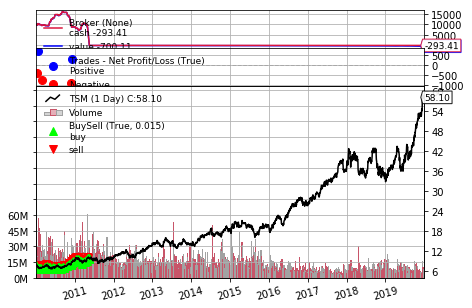

<Figure size 1728x1080 with 0 Axes>

============================================2010-01-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.19             0.0        8.26       8.11        8.12   

   Position  Total Reward     Volumns  
0   10000.0           0.0  11452747.0  
============================================2010-01-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.15            0.05        8.24        8.1         8.2   

   Position  Total Reward     Volumns  
0  10000.05          0.05  20335395.0  
============================================2010-01-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.12           29.95        8.21       8.04        8.17   

   Posit

============================================2010-02-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.76           -0.59        6.86       6.65        6.79   

   Position  Total Reward     Volumns  
0   9547.05       -452.95  47714116.0  
============================================2010-02-08 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         6.79            0.24        6.89       6.67        6.86   

   Position  Total Reward     Volumns  
0   9547.29       -452.71  35608415.0  
============================================2010-02-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.79           -0.07        6.94       6.75        6.86   

   Posi

0  6003.035     -3996.965  26509329.0  
============================================2010-03-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1          7.3            0.93        7.42       7.25        7.39   

   Position  Total Reward     Volumns  
0  6003.965     -3996.035  17864324.0  
============================================2010-03-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.17            1.11        7.25       7.12        7.24   

   Position  Total Reward     Volumns  
0  6005.075     -3994.925  15935872.0  
============================================2010-03-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.27            -0.9      

============================================2010-04-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.87     -584.971337        7.95       7.83        7.91   

      Position  Total Reward     Volumns  
0  5079.849413  -4920.150587  12976352.0  
============================================2010-04-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.67             4.4        7.78       7.56        7.77   

      Position  Total Reward     Volumns  
0  5084.249413  -4915.750587  25703889.0  
============================================2010-04-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.66            0.15        7.71       7.54        7.5

============================================2010-05-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.88            4.76        7.12       6.82        7.07   

      Position  Total Reward     Volumns  
0  6634.255736  -3365.744264  22479429.0  
============================================2010-05-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         6.94           -1.68        7.01       6.83        6.89   

      Position  Total Reward     Volumns  
0  6632.575736  -3367.424264  24073198.0  
============================================2010-05-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         6.81            3.67         6.9       6.75        6.8

============================================2010-06-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.32           -3.63        7.41       7.27        7.31   

      Position  Total Reward     Volumns  
0  9473.904169   -526.095831  21336474.0  
============================================2010-06-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.13            6.27        7.37       7.12        7.31   

      Position  Total Reward     Volumns  
0  9480.174169   -519.825831  16078879.0  
============================================2010-06-23 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.18           -1.65        7.23       7.08        7.1

============================================2010-07-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.68           -1.15        7.71       7.57        7.63   

       Position  Total Reward     Volumns  
0  10042.827981     42.827981  12678809.0  
============================================2010-07-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.77           -2.15        7.77        7.6        7.69   

       Position  Total Reward    Volumns  
0  10040.677981     40.677981  9845536.0  
============================================2010-07-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.67             2.5        7.79       7.66        7

============================================2010-08-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         6.96             1.6        7.01       6.85        6.96   

       Position  Total Reward     Volumns  
0  10389.157072    389.157072  16366668.0  
============================================2010-08-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         6.93            1.01        6.98       6.91        6.95   

       Position  Total Reward     Volumns  
0  10390.167072    390.167072  16497618.0  
============================================2010-08-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.09           -5.53         7.1        6.9       

============================================2010-09-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.41           -3.92        7.42       7.24        7.27   

       Position  Total Reward     Volumns  
0  11782.474386   1782.474386  16752714.0  
============================================2010-09-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.55           -4.05        7.61       7.41        7.42   

       Position  Total Reward     Volumns  
0  11778.424386   1778.424386  28321435.0  
============================================2010-09-30 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.45     -231.628427        7.63       7.43        7

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.01     -531.613105        8.04       7.86        7.89   

      Position  Total Reward     Volumns  
0  7694.720742  -2305.279258  17902955.0  
============================================2010-11-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0          8.0     -648.393105        8.08       7.97        8.01   

      Position  Total Reward    Volumns  
0  7046.327636  -2953.672364  8528269.0  
============================================2010-11-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.96     -677.693105        8.04       7.92        8.04   

      Position  Total Reward     Volumns  
0  6368.634531  -3631.365469  13177023.0  
===================================

============================================2010-12-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.48           -9.84        8.51       8.24        8.24   

      Position  Total Reward     Volumns  
0  3520.985543  -6479.014457  37959112.0  
============================================2010-12-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.79           -9.88        8.82       8.48        8.52   

      Position  Total Reward     Volumns  
0  3511.105543  -6488.894457  31009056.0  
============================================2010-12-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.73            1.98        8.81       8.69        8.7

============================================2011-01-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.08             6.2        9.22       8.99        9.18   

      Position  Total Reward     Volumns  
0 -1064.626519 -11064.626519  13309198.0  
============================================2011-01-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.45          -11.47        9.49       9.15        9.18   

      Position  Total Reward     Volumns  
0 -1076.096519 -11076.096519  32583326.0  
============================================2011-01-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1          9.6           -4.65        9.62       9.46        9.4

============================================2011-02-08 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.86            5.58        9.99       9.81        9.93   

      Position  Total Reward     Volumns  
0 -1088.806519 -11088.806519  16100136.0  
============================================2011-02-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.62            7.44        9.86       9.62        9.74   

      Position  Total Reward     Volumns  
0 -1081.366519 -11081.366519  18644012.0  
============================================2011-02-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.43            5.89        9.52       9.36        9.4

============================================2011-03-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.93            1.24        8.96       8.83        8.84   

      Position  Total Reward     Volumns  
0 -1059.976519 -11059.976519  11710157.0  
============================================2011-03-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.75            5.58        8.76       8.53        8.63   

      Position  Total Reward     Volumns  
0 -1054.396519 -11054.396519  19319046.0  
============================================2011-03-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2          8.4           10.85        8.75       8.32        8.6

============================================2011-04-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.04           -0.93        9.07       8.94        8.95   

      Position  Total Reward     Volumns  
0 -1063.386519 -11063.386519  16098503.0  
============================================2011-04-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.97            2.17        9.04       8.91        9.01   

      Position  Total Reward    Volumns  
0 -1061.216519 -11061.216519  8611851.0  
============================================2011-04-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.78            5.89        8.91       8.72         8.9 

============================================2011-05-18 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.94            -3.1        10.0        9.9        9.91   

      Position  Total Reward     Volumns  
0 -1091.286519 -11091.286519  15014010.0  
============================================2011-05-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.88            1.86        9.95       9.81        9.94   

      Position  Total Reward     Volumns  
0 -1089.426519 -11089.426519  11291577.0  
============================================2011-05-20 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.85            0.93        9.91       9.79        9.87  

============================================2011-06-21 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.75           -8.37        9.76       9.56        9.58   

      Position  Total Reward     Volumns  
0 -1085.396519 -11085.396519  18227473.0  
============================================2011-06-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.49            8.06        9.66       9.48        9.66   

      Position  Total Reward     Volumns  
0 -1077.336519 -11077.336519  22898413.0  
============================================2011-06-23 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.43            1.86        9.47       9.18        9.32

============================================2011-07-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.76            5.58        9.81       9.65        9.74   

      Position  Total Reward     Volumns  
0 -1085.706519 -11085.706519  31896980.0  
============================================2011-07-26 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.88           -3.72        9.99        9.8        9.81   

      Position  Total Reward     Volumns  
0 -1089.426519 -11089.426519  21049349.0  
============================================2011-07-27 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.62            8.06        9.85       9.59        9.82

============================================2011-08-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.69             9.3        9.03       8.66        8.95   

      Position  Total Reward     Volumns  
0 -1052.536519 -11052.536519  23504619.0  
============================================2011-08-26 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.04          -10.85        9.08       8.73        8.73   

      Position  Total Reward     Volumns  
0 -1063.386519 -11063.386519  12306138.0  
============================================2011-08-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.29           -7.75        9.29       9.11        9.1

============================================2011-09-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.01            5.89        9.19       9.01        9.14   

      Position  Total Reward     Volumns  
0 -1062.456519 -11062.456519  15135379.0  
============================================2011-09-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.04           -0.93        9.18        8.9        9.15   

      Position  Total Reward     Volumns  
0 -1063.386519 -11063.386519  13456250.0  
============================================2011-09-30 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.75            8.99        9.03       8.71        8.96 

============================================2011-10-31 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.66            2.79        9.76       9.61        9.67   

      Position  Total Reward     Volumns  
0 -1082.606519 -11082.606519  11655390.0  
============================================2011-11-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.53            4.03        9.61       9.36        9.45   

      Position  Total Reward     Volumns  
0 -1078.576519 -11078.576519  19289239.0  
============================================2011-11-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.74           -6.51        9.75       9.58        9.6

============================================2011-12-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.04            2.17       10.23      10.02       10.14   

      Position  Total Reward     Volumns  
0 -1094.386519 -11094.386519  11352871.0  
============================================2011-12-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.12           -2.48       10.18      10.04       10.16   

      Position  Total Reward     Volumns  
0 -1096.866519 -11096.866519  20709862.0  
============================================2011-12-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.91            6.51       10.05       9.89        9.9

============================================2012-01-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.07            2.48       10.16      10.02       10.16   

      Position  Total Reward     Volumns  
0 -1095.316519 -11095.316519  10156781.0  
============================================2012-01-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.24           -5.27       10.25      10.05       10.07   

      Position  Total Reward    Volumns  
0 -1100.586519 -11100.586519  9852827.0  
============================================2012-01-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.54            -9.3       10.58       10.3       10.36  

============================================2012-02-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.93           -2.17       10.96      10.77       10.87   

      Position  Total Reward     Volumns  
0 -1121.976519 -11121.976519  11887894.0  
============================================2012-02-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         10.6           10.23       10.79      10.56       10.78   

      Position  Total Reward     Volumns  
0 -1111.746519 -11111.746519  11711033.0  
============================================2012-02-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         10.8            -6.2       10.84      10.71       10.79 

============================================2012-03-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.34            1.24       11.57      11.33       11.43   

      Position  Total Reward    Volumns  
0 -1134.686519 -11134.686519  8676982.0  
============================================2012-03-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        11.44            -3.1        11.5      11.33       11.43   

      Position  Total Reward    Volumns  
0 -1137.786519 -11137.786519  9207694.0  
============================================2012-03-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.32            3.72       11.43       11.3        11.4   

============================================2012-04-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        11.64           -2.48       11.68      11.49        11.6   

      Position  Total Reward     Volumns  
0 -1143.986519 -11143.986519  14477443.0  
============================================2012-04-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         11.7           -1.86       11.76      11.47       11.61   

      Position  Total Reward    Volumns  
0 -1145.846519 -11145.846519  7874190.0  
============================================2012-04-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.68            0.62       11.83      11.59       11.75 

============================================2012-05-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.93            9.92       11.35      10.93       11.21   

      Position  Total Reward     Volumns  
0 -1121.976519 -11121.976519  16553655.0  
============================================2012-05-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.04           -3.41       11.09      10.98       11.01   

      Position  Total Reward     Volumns  
0 -1125.386519 -11125.386519  23845408.0  
============================================2012-05-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.02            0.62       11.12      10.96       11.0

============================================2012-06-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         10.4           13.02       10.75      10.36       10.71   

      Position  Total Reward     Volumns  
0 -1105.546519 -11105.546519  16767087.0  
============================================2012-06-22 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.59           -5.89       10.63      10.47        10.5   

      Position  Total Reward     Volumns  
0 -1111.436519 -11111.436519  10599584.0  
============================================2012-06-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.24           10.85       10.48      10.22       10.43

============================================2012-07-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.32           -2.48       10.43      10.19        10.2   

      Position  Total Reward     Volumns  
0 -1103.066519 -11103.066519  25117960.0  
============================================2012-07-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.59           -8.37       10.65       10.4        10.4   

      Position  Total Reward     Volumns  
0 -1111.436519 -11111.436519  24796482.0  
============================================2012-07-27 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.85           -8.06       10.91      10.68        10.

============================================2012-08-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         11.4           -0.31       11.48      11.33       11.46   

      Position  Total Reward    Volumns  
0 -1136.546519 -11136.546519  8683334.0  
============================================2012-08-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.35            1.55       11.42      11.31       11.36   

      Position  Total Reward    Volumns  
0 -1134.996519 -11134.996519  7233062.0  
============================================2012-08-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.38           -0.93       11.43      11.29       11.33   

============================================2012-09-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        12.54           -5.27       12.55      12.35       12.37   

      Position  Total Reward     Volumns  
0 -1171.886519 -11171.886519  23072653.0  
============================================2012-10-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.61           -2.17       12.64      12.45       12.47   

      Position  Total Reward     Volumns  
0 -1174.056519 -11174.056519  24481807.0  
============================================2012-10-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        12.69           -2.48       12.73      12.58       12.67

============================================2012-11-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         12.5            8.37       12.82      12.49       12.82   

      Position  Total Reward    Volumns  
0 -1170.646519 -11170.646519  8799994.0  
============================================2012-11-05 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.59           -2.79        12.6       12.5       12.56   

      Position  Total Reward     Volumns  
0 -1173.436519 -11173.436519  16504751.0  
============================================2012-11-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.84           -7.75       12.91      12.59        12.6 

============================================2012-12-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         13.5            0.62       13.75      13.48       13.69   

      Position  Total Reward     Volumns  
0 -1201.646519 -11201.646519  16198655.0  
============================================2012-12-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.38            3.72       13.54      13.35       13.45   

      Position  Total Reward     Volumns  
0 -1197.926519 -11197.926519  10106739.0  
============================================2012-12-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.63           -7.75       13.69      13.57       13.5

============================================2013-01-11 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.39            0.62       14.43      14.21       14.34   

      Position  Total Reward     Volumns  
0 -1229.236519 -11229.236519  15836559.0  
============================================2013-01-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.28            3.41       14.43      14.19        14.4   

      Position  Total Reward     Volumns  
0 -1225.826519 -11225.826519  10584739.0  
============================================2013-01-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.18             3.1       14.22      14.09       14.18 

============================================2013-02-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.72           -3.72       14.73      14.57       14.61   

      Position  Total Reward    Volumns  
0 -1239.466519 -11239.466519  6416932.0  
============================================2013-02-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.69            0.93       14.75      14.66       14.71   

      Position  Total Reward    Volumns  
0 -1238.536519 -11238.536519  6642057.0  
============================================2013-02-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        15.18          -15.19       15.19      14.76        14.8   

============================================2013-03-20 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.68           -4.34       13.74      13.56       13.59   

      Position  Total Reward     Volumns  
0 -1207.226519 -11207.226519  13772457.0  
============================================2013-03-21 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.39            8.99       13.57      13.38       13.57   

      Position  Total Reward     Volumns  
0 -1198.236519 -11198.236519  11158970.0  
============================================2013-03-22 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.53           -4.34       13.55      13.38       13.41  

============================================2013-04-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.49            5.58       14.68      14.38       14.54   

      Position  Total Reward     Volumns  
0 -1232.336519 -11232.336519  27321680.0  
============================================2013-04-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.62           -4.03       14.69      14.44       14.46   

      Position  Total Reward     Volumns  
0 -1236.366519 -11236.366519  12866780.0  
============================================2013-04-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.82            -6.2       14.82      14.64       14.67

============================================2013-05-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         15.1           -4.65       15.24      15.06       15.15   

      Position  Total Reward     Volumns  
0 -1251.246519 -11251.246519  11484866.0  
============================================2013-05-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        15.26           -4.96        15.3      15.08       15.08   

      Position  Total Reward     Volumns  
0 -1256.206519 -11256.206519  16512949.0  
============================================2013-05-30 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        15.04            6.82       15.22      15.03       15.21 

============================================2013-06-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.53           -9.61        14.6      14.43       14.51   

      Position  Total Reward     Volumns  
0 -1233.576519 -11233.576519  15720405.0  
============================================2013-07-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.63            -3.1        14.8       14.6       14.75   

      Position  Total Reward     Volumns  
0 -1236.676519 -11236.676519  14836292.0  
============================================2013-07-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.67           -1.24       14.95      14.65       14.79

0 -1219.006519 -11219.006519  18516110.0  
============================================2013-08-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.69           11.47        13.9      13.66        13.9   

      Position  Total Reward     Volumns  
0 -1207.536519 -11207.536519  13989846.0  
============================================2013-08-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.71           -0.62       13.74      13.54       13.64   

      Position  Total Reward    Volumns  
0 -1208.156519 -11208.156519  8959037.0  
============================================2013-08-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.52         

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         14.0           -8.06       14.07      13.81       13.82   

      Position  Total Reward    Volumns  
0 -1217.146519 -11217.146519  9494866.0  
============================================2013-09-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.86            4.34       14.09      13.85       14.04   

      Position  Total Reward    Volumns  
0 -1212.806519 -11212.806519  7776703.0  
============================================2013-09-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         14.1           -7.44       14.13      13.93       13.94   

      Position  Total Reward     Volumns  
0 -1220.246519 -11220.246519  11822478.0  
===================================

============================================2013-10-08 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.23            4.03       14.65      14.22       14.52   

      Position  Total Reward     Volumns  
0 -1224.276519 -11224.276519  13474139.0  
============================================2013-10-09 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.07            4.96        14.4      13.98       14.38   

      Position  Total Reward     Volumns  
0 -1219.316519 -11219.316519  20224089.0  
============================================2013-10-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         14.4          -10.23        14.4       14.2       14.21  

============================================2013-11-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.68             3.1        14.7      14.56       14.67   

      Position  Total Reward     Volumns  
0 -1238.226519 -11238.226519  11030944.0  
============================================2013-11-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.45            7.13       14.55      14.43       14.54   

      Position  Total Reward    Volumns  
0 -1231.096519 -11231.096519  8116581.0  
============================================2013-11-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.52           -2.17       14.52      14.35       14.39 

============================================2013-12-12 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.95             9.3       14.25      13.93       14.21   

      Position  Total Reward     Volumns  
0 -1215.596519 -11215.596519  13333648.0  
============================================2013-12-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.92            0.93       14.08      13.87       14.05   

      Position  Total Reward     Volumns  
0 -1214.666519 -11214.666519  12772297.0  
============================================2013-12-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.94           -0.62       14.05      13.94       13.94 

Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.79          -14.88       14.82      14.58        14.6   

      Position  Total Reward     Volumns  
0 -1241.636519 -11241.636519  26709504.0  
============================================2014-01-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.48            9.61       14.65      14.43       14.65   

      Position  Total Reward     Volumns  
0 -1232.026519 -11232.026519  17883230.0  
============================================2014-01-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.42            1.86       14.53      14.36       14.48   

      Position  Total Reward     Volumns  
0 -1230.166519 -11230.166519  10271803.0  
=======================

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.42            1.55       14.48      14.23       14.34   

      Position  Total Reward     Volumns  
0 -1230.166519 -11230.166519  14523346.0  
============================================2014-02-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.46           -1.24       14.56      14.42       14.52   

      Position  Total Reward    Volumns  
0 -1231.406519 -11231.406519  7378175.0  
============================================2014-02-24 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.42            1.24        14.5      14.38       14.43   

      Position  Total Reward    Volumns  
0 -1230.166519 -11230.166519  6747500.0  
====================================

============================================2014-03-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        15.58          -12.09       15.63      15.31       15.31   

      Position  Total Reward     Volumns  
0 -1266.126519 -11266.126519  21017836.0  
============================================2014-03-26 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        15.56            0.62       15.76      15.55        15.7   

      Position  Total Reward     Volumns  
0 -1265.506519 -11265.506519  13003463.0  
============================================2014-03-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        15.83           -8.37       15.89      15.48       15.48

============================================2014-04-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.54           -9.61       16.55      16.35       16.41   

      Position  Total Reward     Volumns  
0 -1295.886519 -11295.886519  17647520.0  
============================================2014-04-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        16.38            4.96       16.63      16.37       16.54   

      Position  Total Reward     Volumns  
0 -1290.926519 -11290.926519  16897211.0  
============================================2014-04-30 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.38             0.0       16.38      16.14       16.27

============================================2014-05-30 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.76            3.41       16.81      16.63       16.63   

      Position  Total Reward    Volumns  
0 -1302.706519 -11302.706519  8185906.0  
============================================2014-06-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.84           -2.48       16.86      16.76       16.85   

      Position  Total Reward    Volumns  
0 -1305.186519 -11305.186519  7944801.0  
============================================2014-06-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.31          -14.57       17.36      16.81       16.87   

============================================2014-07-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.24          -10.23       18.44      18.14       18.22   

      Position  Total Reward     Volumns  
0 -1348.586519 -11348.586519  12974384.0  
============================================2014-07-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.51           -8.37       18.51      18.35        18.4   

      Position  Total Reward    Volumns  
0 -1356.956519 -11356.956519  5297925.0  
============================================2014-07-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.48            0.93       18.65      18.44        18.6 

============================================2014-08-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         16.5           18.29       16.71       16.4       16.67   

      Position  Total Reward     Volumns  
0 -1294.646519 -11294.646519  16095989.0  
============================================2014-08-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         16.7            -6.2       16.76      16.57       16.63   

      Position  Total Reward     Volumns  
0 -1300.846519 -11300.846519  11274358.0  
============================================2014-08-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.59            3.41       16.86      16.56       16.7

============================================2014-09-08 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.56            2.79       17.65      17.51       17.64   

      Position  Total Reward    Volumns  
0 -1327.506519 -11327.506519  8069895.0  
============================================2014-09-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.54            0.62       17.66      17.48       17.56   

      Position  Total Reward    Volumns  
0 -1326.886519 -11326.886519  8775810.0  
============================================2014-09-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.52            0.62       17.56      17.29       17.33   


============================================2014-10-09 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.06             3.1       17.31      17.01       17.31   

      Position  Total Reward     Volumns  
0 -1312.006519 -11312.006519  13017540.0  
============================================2014-10-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         16.2           26.66       16.85      16.16       16.81   

      Position  Total Reward     Volumns  
0 -1285.346519 -11285.346519  34405975.0  
============================================2014-10-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.39           -5.89       16.76      16.35       16.51

============================================2014-11-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         18.5            1.55       18.66      18.41       18.63   

      Position  Total Reward    Volumns  
0 -1356.646519 -11356.646519  7897318.0  
============================================2014-11-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.37            4.03       18.39      18.12       18.15   

      Position  Total Reward     Volumns  
0 -1352.616519 -11352.616519  14148062.0  
============================================2014-11-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        18.61           -7.44       18.68      18.46       18.55  

============================================2014-12-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.28            0.93       18.66      18.24       18.49   

      Position  Total Reward     Volumns  
0 -1349.826519 -11349.826519  16946637.0  
============================================2014-12-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.86           13.02       18.21      17.86       18.17   

      Position  Total Reward     Volumns  
0 -1336.806519 -11336.806519  13416464.0  
============================================2014-12-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.03           -5.27       18.04      17.63       17.7

============================================2015-01-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.24          -12.71       19.32      18.72       18.83   

      Position  Total Reward     Volumns  
0 -1379.586519 -11379.586519  28802698.0  
============================================2015-01-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.34            -3.1       19.41      19.13       19.16   

      Position  Total Reward     Volumns  
0 -1382.686519 -11382.686519  21562211.0  
============================================2015-01-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.76          -13.02       19.76      19.07       19.3

============================================2015-02-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.18            5.58       20.36      20.11       20.34   

      Position  Total Reward    Volumns  
0 -1408.726519 -11408.726519  9393876.0  
============================================2015-02-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.86          -21.08        20.9      20.29       20.31   

      Position  Total Reward     Volumns  
0 -1429.806519 -11429.806519  19121268.0  
============================================2015-02-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.86             0.0        21.1      20.82       20.87  

============================================2015-03-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.33           -0.62       19.59      19.13       19.21   

      Position  Total Reward     Volumns  
0 -1382.376519 -11382.376519  43723641.0  
============================================2015-03-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.11            6.82       19.26      18.88       19.09   

      Position  Total Reward     Volumns  
0 -1375.556519 -11375.556519  24319381.0  
============================================2015-03-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.37           -8.06       19.41      18.98       18.9

============================================2015-04-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.66            5.58       20.75      20.49       20.71   

      Position  Total Reward     Volumns  
0 -1423.606519 -11423.606519  15172611.0  
============================================2015-04-30 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.36             9.3       20.51       20.3       20.41   

      Position  Total Reward     Volumns  
0 -1414.306519 -11414.306519  19242002.0  
============================================2015-05-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.61           -7.75        20.7      20.47       20.58  

============================================2015-06-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.72           12.09        20.0       19.7       19.98   

      Position  Total Reward     Volumns  
0 -1394.466519 -11394.466519  14722320.0  
============================================2015-06-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.71            0.31       19.83      19.56       19.81   

      Position  Total Reward     Volumns  
0 -1394.156519 -11394.156519  13017181.0  
============================================2015-06-04 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.15           17.36       19.52      18.98       19.3

============================================2015-07-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.72            5.58       19.99      19.66       19.77   

      Position  Total Reward    Volumns  
0 -1394.466519 -11394.466519  8697807.0  
============================================2015-07-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.74           -0.62       19.77      19.29       19.61   

      Position  Total Reward     Volumns  
0 -1395.086519 -11395.086519  11787139.0  
============================================2015-07-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.11           19.53       19.48      19.06       19.42  

============================================2015-08-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.29            8.68       18.52      18.06       18.41   

      Position  Total Reward     Volumns  
0 -1350.136519 -11350.136519  15060525.0  
============================================2015-08-07 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        18.08            6.51        18.4      18.04       18.27   

      Position  Total Reward     Volumns  
0 -1343.626519 -11343.626519  19364463.0  
============================================2015-08-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        18.57          -15.19       18.82      17.98       18.15 

============================================2015-09-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.93            4.96       17.11      16.56       17.02   

      Position  Total Reward     Volumns  
0 -1307.976519 -11307.976519  20716234.0  
============================================2015-09-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         17.1           -5.27       17.15      16.86       16.97   

      Position  Total Reward     Volumns  
0 -1313.246519 -11313.246519  11110497.0  
============================================2015-09-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.23           -4.03       17.34       17.1       17.1

============================================2015-10-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.86            4.03       18.94      18.63       18.76   

      Position  Total Reward     Volumns  
0 -1367.806519 -11367.806519  14822839.0  
============================================2015-10-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         19.2          -10.54       19.37      18.62       18.72   

      Position  Total Reward     Volumns  
0 -1378.346519 -11378.346519  26527146.0  
============================================2015-10-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.87           10.23       19.59      18.73       19.3

============================================2015-11-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.82             9.3       19.04      18.54       18.97   

      Position  Total Reward    Volumns  
0 -1366.566519 -11366.566519  9171783.0  
============================================2015-11-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.21          -12.09       19.24      18.74       18.76   

      Position  Total Reward    Volumns  
0 -1378.656519 -11378.656519  8285261.0  
============================================2015-11-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        19.36           -4.65       19.61      19.24       19.28   

============================================2015-12-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.74            5.27       20.02      19.73       19.85   

      Position  Total Reward     Volumns  
0 -1395.086519 -11395.086519  10384293.0  
============================================2015-12-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.71            0.93       19.84      19.53       19.57   

      Position  Total Reward     Volumns  
0 -1394.156519 -11394.156519  10061213.0  
============================================2015-12-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.73           -0.62       19.81      19.55       19.7

============================================2016-01-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.85          -16.12       18.87      18.58        18.7   

      Position  Total Reward    Volumns  
0 -1367.496519 -11367.496519  9736853.0  
============================================2016-01-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.73            3.72       18.97      18.65       18.66   

      Position  Total Reward    Volumns  
0 -1363.776519 -11363.776519  9846797.0  
============================================2016-01-26 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        18.56            5.27       18.79      18.48       18.72   

============================================2016-02-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.36           -7.13       20.37       20.1       20.35   

      Position  Total Reward    Volumns  
0 -1414.306519 -11414.306519  5906426.0  
============================================2016-02-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.43           -2.17       20.71      20.13       20.36   

      Position  Total Reward     Volumns  
0 -1416.476519 -11416.476519  11542126.0  
============================================2016-02-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.24            5.89       20.41      20.16       20.26 

============================================2016-03-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        22.74          -13.02       22.88      22.62       22.62   

      Position  Total Reward    Volumns  
0 -1488.086519 -11488.086519  6980025.0  
============================================2016-03-31 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        22.52            6.82       22.73       22.5       22.59   

      Position  Total Reward    Volumns  
0 -1481.266519 -11481.266519  6246492.0  
============================================2016-04-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        22.45            2.17       22.53      22.15       22.24   

============================================2016-05-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.36           -2.48       20.41      20.16       20.27   

      Position  Total Reward    Volumns  
0 -1414.306519 -11414.306519  7110909.0  
============================================2016-05-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.04            9.92       20.16      19.91       20.07   

      Position  Total Reward     Volumns  
0 -1404.386519 -11404.386519  10847566.0  
============================================2016-05-04 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        20.13           -2.79       20.24      19.97       20.04 

============================================2016-06-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        21.94            -9.3        22.0      21.75       21.78   

      Position  Total Reward    Volumns  
0 -1463.286519 -11463.286519  5865706.0  
============================================2016-06-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        21.89            1.55       22.06      21.86        22.0   

      Position  Total Reward    Volumns  
0 -1461.736519 -11461.736519  8818105.0  
============================================2016-06-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         22.4          -15.81       22.45      22.09       22.11   

============================================2016-07-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        23.47           -4.34       23.67      23.41       23.42   

      Position  Total Reward    Volumns  
0 -1510.716519 -11510.716519  5971800.0  
============================================2016-07-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        23.85          -11.78       23.91      23.56       23.64   

      Position  Total Reward    Volumns  
0 -1522.496519 -11522.496519  6479212.0  
============================================2016-07-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        24.27          -13.02       24.42       24.2       24.23   

============================================2016-08-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        26.23           -8.68       26.26       26.0       26.03   

      Position  Total Reward    Volumns  
0 -1596.276519 -11596.276519  7465563.0  
============================================2016-08-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.07            4.96       26.27      26.03       26.25   

      Position  Total Reward    Volumns  
0 -1591.316519 -11591.316519  9223623.0  
============================================2016-08-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         26.0            2.17        26.2      25.69        26.0   

============================================2016-09-12 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        25.86          -10.85       25.91      25.16       25.47   

      Position  Total Reward    Volumns  
0 -1584.806519 -11584.806519  6550834.0  
============================================2016-09-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        25.42           13.64       25.68      25.26       25.61   

      Position  Total Reward    Volumns  
0 -1571.166519 -11571.166519  7686596.0  
============================================2016-09-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        25.53           -3.41       25.66       25.3       25.44   


============================================2016-10-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        27.24           22.63        27.6      26.34        27.6   

      Position  Total Reward     Volumns  
0 -1627.586519 -11627.586519  19416563.0  
============================================2016-10-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.35           -3.41        27.9      27.27       27.71   

      Position  Total Reward     Volumns  
0 -1630.996519 -11630.996519  11010041.0  
============================================2016-10-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.27            2.48       27.44       27.1       27.2

============================================2016-11-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.05           -9.61       26.27      25.67       26.15   

      Position  Total Reward     Volumns  
0 -1590.696519 -11590.696519  12481386.0  
============================================2016-11-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        26.64          -18.29       26.68      25.95       25.95   

      Position  Total Reward    Volumns  
0 -1608.986519 -11608.986519  9866434.0  
============================================2016-11-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        26.29           10.85       26.78      26.19       26.77  

============================================2016-12-19 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        26.11            5.89       26.35      26.02       26.31   

      Position  Total Reward    Volumns  
0 -1592.556519 -11592.556519  6901101.0  
============================================2016-12-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        26.15           -1.24       26.37       26.0       26.19   

      Position  Total Reward    Volumns  
0 -1593.796519 -11593.796519  6244056.0  
============================================2016-12-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         26.0            4.65       26.12      25.79       26.08   

============================================2017-01-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         27.5          -13.64       27.57      27.22       27.24   

      Position  Total Reward    Volumns  
0 -1635.646519 -11635.646519  8085397.0  
============================================2017-01-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.93          -13.33       27.95       27.6       27.75   

      Position  Total Reward    Volumns  
0 -1648.976519 -11648.976519  8995754.0  
============================================2017-01-26 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        27.76            5.27       28.06      27.67       27.89   

============================================2017-02-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        28.13           10.85       28.39      28.09       28.39   

      Position  Total Reward    Volumns  
0 -1655.176519 -11655.176519  6547920.0  
============================================2017-02-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        28.08            1.55       28.26      28.01       28.18   

      Position  Total Reward    Volumns  
0 -1653.626519 -11653.626519  6770857.0  
============================================2017-03-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        28.17           -2.79       28.19      27.89       28.03   

============================================2017-03-30 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         29.5           -3.72       29.58      29.25        29.3   

      Position  Total Reward    Volumns  
0 -1697.646519 -11697.646519  4360797.0  
============================================2017-03-31 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         29.3             6.2       29.39      29.06       29.17   

      Position  Total Reward    Volumns  
0 -1691.446519 -11691.446519  5440067.0  
============================================2017-04-03 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        29.34           -1.24       29.44      29.18       29.39   

============================================2017-05-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        30.59           -9.92       30.59      30.19       30.23   

      Position  Total Reward    Volumns  
0 -1731.436519 -11731.436519  7465675.0  
============================================2017-05-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        30.46            4.03        30.5      30.31        30.5   

      Position  Total Reward    Volumns  
0 -1727.406519 -11727.406519  6385845.0  
============================================2017-05-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        30.71           -7.75       30.73      30.36       30.48   

============================================2017-06-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         32.5           -0.93       32.64      32.33       32.46   

      Position  Total Reward    Volumns  
0 -1790.646519 -11790.646519  5635656.0  
============================================2017-06-07 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        32.53           -0.93       32.75      32.46       32.64   

      Position  Total Reward    Volumns  
0 -1791.576519 -11791.576519  7327810.0  
============================================2017-06-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        32.86          -10.23       32.92       32.6       32.79   



============================================2017-07-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        32.24          -10.54       32.39      31.83       31.88   

      Position  Total Reward    Volumns  
0 -1782.586519 -11782.586519  8444683.0  
============================================2017-07-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        32.59          -10.85       32.64      32.29       32.64   

      Position  Total Reward     Volumns  
0 -1793.436519 -11793.436519  10095801.0  
============================================2017-07-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        32.88           -8.99       32.98       32.7       32.84  

============================================2017-08-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        32.56           31.93       33.19      32.56       33.17   

      Position  Total Reward    Volumns  
0 -1792.506519 -11792.506519  6084531.0  
============================================2017-08-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        33.29          -22.63       33.35      32.64       32.72   

      Position  Total Reward    Volumns  
0 -1815.136519 -11815.136519  4657888.0  
============================================2017-08-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        33.21            2.48       33.26      33.03       33.19   

============================================2017-09-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        34.44            4.03       34.76      34.43       34.55   

      Position  Total Reward    Volumns  
0 -1850.786519 -11850.786519  6294679.0  
============================================2017-09-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        34.69           -7.75        34.7      34.45       34.57   

      Position  Total Reward    Volumns  
0 -1858.536519 -11858.536519  7864929.0  
============================================2017-09-18 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        35.07          -11.78       35.12      34.85       34.89   

 

============================================2017-10-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         38.0          -10.23        38.0      37.35       37.61   

      Position  Total Reward    Volumns  
0 -1961.146519 -11961.146519  8230300.0  
============================================2017-10-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        38.23           -7.13       38.43      37.71       38.14   

      Position  Total Reward    Volumns  
0 -1968.276519 -11968.276519  7221893.0  
============================================2017-10-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.84           12.09       38.04      37.31       37.79   

============================================2017-11-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        38.89           -4.03       38.95      38.66       38.76   

      Position  Total Reward    Volumns  
0 -1988.736519 -11988.736519  4836124.0  
============================================2017-11-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        39.23          -10.54       39.49       39.2       39.26   

      Position  Total Reward    Volumns  
0 -1999.276519 -11999.276519  3982071.0  
============================================2017-11-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        39.07            4.96       39.37      38.96       39.24   

============================================2017-12-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.51          -11.47       36.51      36.21       36.48   

      Position  Total Reward    Volumns  
0 -1914.956519 -11914.956519  2739309.0  
============================================2017-12-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        35.88           19.53       36.21      35.75       36.21   

      Position  Total Reward    Volumns  
0 -1895.426519 -11895.426519  3106091.0  
============================================2017-12-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         36.0           -3.72       36.03      35.82       35.93   

============================================2018-01-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        41.82             9.3       42.09      41.64       41.89   

      Position  Total Reward     Volumns  
0 -2079.566519 -12079.566519  12596305.0  
============================================2018-01-30 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        41.35           14.57       41.48       40.9       41.06   

      Position  Total Reward     Volumns  
0 -2064.996519 -12064.996519  11098564.0  
============================================2018-01-31 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        41.74          -12.09       42.19      41.57       41.85 

============================================2018-03-02 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        39.62           -8.06       39.66      38.83       39.05   

      Position  Total Reward    Volumns  
0 -2011.366519 -12011.366519  5231563.0  
============================================2018-03-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        40.07          -13.95       40.31      39.49       39.66   

      Position  Total Reward    Volumns  
0 -2025.316519 -12025.316519  6488111.0  
============================================2018-03-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        40.11           -1.24        40.9      40.01       40.85   


============================================2018-04-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.91           17.67       40.75      39.74       40.56   

      Position  Total Reward    Volumns  
0 -2020.356519 -12020.356519  6637798.0  
============================================2018-04-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        39.08           25.73       39.77      38.93        39.5   

      Position  Total Reward    Volumns  
0 -1994.626519 -11994.626519  5571860.0  
============================================2018-04-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.68           -18.6       40.57      39.53        39.7   


============================================2018-05-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.09          -20.77       36.28      35.87       35.91   

      Position  Total Reward    Volumns  
0 -1901.936519 -11901.936519  8810379.0  
============================================2018-05-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.25           -4.96       36.35      36.08       36.27   

      Position  Total Reward    Volumns  
0 -1906.896519 -11906.896519  6362413.0  
============================================2018-05-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.64          -12.09       36.73      36.33       36.45   

============================================2018-06-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        35.71            4.65       36.07      35.71       35.93   

      Position  Total Reward    Volumns  
0 -1890.156519 -11890.156519  4897237.0  
============================================2018-06-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.11           -12.4       36.26      35.91       36.05   

      Position  Total Reward    Volumns  
0 -1902.556519 -11902.556519  7145258.0  
============================================2018-06-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        35.97            4.34       36.75      35.97        36.6   

============================================2018-07-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        36.07          -13.64        36.1      35.79       35.85   

      Position  Total Reward    Volumns  
0 -1901.316519 -11901.316519  5180861.0  
============================================2018-07-16 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        36.09           -0.62       36.18      35.95       36.17   

      Position  Total Reward    Volumns  
0 -1901.936519 -11901.936519  5653867.0  
============================================2018-07-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        36.33           -7.44        36.4      35.67       35.81   

============================================2018-08-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        38.63           13.64       38.72      38.31       38.63   

      Position  Total Reward    Volumns  
0 -1980.676519 -11980.676519  6338295.0  
============================================2018-08-16 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        38.59            1.24        38.9      38.55       38.63   

      Position  Total Reward    Volumns  
0 -1979.436519 -11979.436519  5805496.0  
============================================2018-08-17 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        38.32            8.37       38.41       38.0       38.38   

 

============================================2018-09-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         41.6            5.89        42.1       41.4       41.54   

      Position  Total Reward    Volumns  
0 -2072.746519 -12072.746519  9229943.0  
============================================2018-09-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        42.04          -13.64       42.39      41.77       42.21   

      Position  Total Reward    Volumns  
0 -2086.386519 -12086.386519  6694751.0  
============================================2018-09-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        42.18           -4.34       42.43      41.92       42.26   

============================================2018-10-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.72            2.48       37.55      36.61        37.4   

      Position  Total Reward     Volumns  
0 -1921.466519 -11921.466519  11797598.0  
============================================2018-10-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        36.98           -8.06       37.46       36.8       37.42   

      Position  Total Reward    Volumns  
0 -1929.526519 -11929.526519  8550855.0  
============================================2018-10-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.29           21.39       36.46      35.58       35.73   

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        34.54          -15.81       35.07      34.51       34.78   

      Position  Total Reward    Volumns  
0 -1853.886519 -11853.886519  7343891.0  
============================================2018-11-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        34.34             6.2       34.57      34.14       34.22   

      Position  Total Reward    Volumns  
0 -1847.686519 -11847.686519  2429952.0  
============================================2018-11-26 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        35.18          -26.04       35.23      34.83       35.06   

      Position  Total Reward    Volumns  
0 -1873.726519 -11873.726519  7411119.0  
=======================================

============================================2018-12-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        35.47          -10.85       35.98      35.35       35.46   

      Position  Total Reward    Volumns  
0 -1882.716519 -11882.716519  7716577.0  
============================================2018-12-31 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        35.25            6.82        35.9      35.11       35.74   

      Position  Total Reward    Volumns  
0 -1875.896519 -11875.896519  4817598.0  
============================================2019-01-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        34.88           11.47       35.09      34.38       34.57   

============================================2019-02-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        35.88            1.55       36.16      35.75       36.05   

      Position  Total Reward    Volumns  
0 -1895.426519 -11895.426519  6741978.0  
============================================2019-02-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.23          -10.85        36.3       35.7       35.81   

      Position  Total Reward    Volumns  
0 -1906.276519 -11906.276519  7627358.0  
============================================2019-02-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.53            -9.3       36.55      36.17       36.21   


============================================2019-03-07 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        36.89            4.65       37.13      36.64       37.02   

      Position  Total Reward    Volumns  
0 -1926.736519 -11926.736519  4430879.0  
============================================2019-03-08 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        36.48           12.71       36.65      36.23       36.24   

      Position  Total Reward    Volumns  
0 -1914.026519 -11914.026519  5305159.0  
============================================2019-03-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         36.9          -13.02       36.95      36.48       36.51   


============================================2019-04-09 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        40.31            5.27       40.39      40.14       40.34   

      Position  Total Reward    Volumns  
0 -2032.756519 -12032.756519  5288091.0  
============================================2019-04-10 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        40.46           -4.65       40.59      40.28       40.36   

      Position  Total Reward    Volumns  
0 -2037.406519 -12037.406519  4230766.0  
============================================2019-04-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         40.2            8.06        40.3      40.06       40.19   


============================================2019-05-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        39.14           54.56       39.64       38.9       39.51   

      Position  Total Reward     Volumns  
0 -1996.486519 -11996.486519  11567012.0  
============================================2019-05-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        40.08          -29.14       40.18      39.54       39.72   

      Position  Total Reward    Volumns  
0 -2025.626519 -12025.626519  7443057.0  
============================================2019-05-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        40.08             0.0       40.42      39.59       39.68 

============================================2019-06-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        36.14           47.43       36.96      36.13       36.89   

      Position  Total Reward     Volumns  
0 -1903.486519 -11903.486519  11813619.0  
============================================2019-06-17 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        35.96            5.58       36.34      35.96       36.21   

      Position  Total Reward    Volumns  
0 -1897.906519 -11897.906519  6807322.0  
============================================2019-06-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        37.44          -45.88       37.64       36.5       36.55 

============================================2019-07-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        42.59          -47.74       42.63      41.72       41.93   

      Position  Total Reward     Volumns  
0 -2103.436519 -12103.436519  11421825.0  
============================================2019-07-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        43.22          -19.53        43.4      42.47       42.48   

      Position  Total Reward     Volumns  
0 -2122.966519 -12122.966519  11601133.0  
============================================2019-07-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        43.98          -23.56       44.25      43.51       43.5

============================================2019-08-20 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        41.35           -4.65       41.63      41.14       41.41   

      Position  Total Reward    Volumns  
0 -2064.996519 -12064.996519  7647309.0  
============================================2019-08-21 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        41.98          -19.53       42.04       41.7       41.82   

      Position  Total Reward    Volumns  
0 -2084.526519 -12084.526519  3970154.0  
============================================2019-08-22 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        41.54           13.64        41.9      41.15        41.8   

 

============================================2019-09-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        43.81           -1.55       44.24      43.75       44.09   

      Position  Total Reward    Volumns  
0 -2141.256519 -12141.256519  7645238.0  
============================================2019-09-25 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         44.7          -27.59       44.79      43.69       43.89   

      Position  Total Reward    Volumns  
0 -2168.846519 -12168.846519  6766441.0  
============================================2019-09-26 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        46.14          -44.64       46.19      44.79       44.79   

============================================2019-10-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        50.78           -5.58       50.87      50.34       50.45   

      Position  Total Reward    Volumns  
0 -2357.326519 -12357.326519  6347535.0  
============================================2019-10-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        50.95           -5.27       51.12       50.7       51.04   

      Position  Total Reward    Volumns  
0 -2362.596519 -12362.596519  7779368.0  
============================================2019-10-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        51.11           -4.96       51.48      51.08       51.14   

============================================2019-11-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        53.52           -8.06       53.68      53.17       53.66   

      Position  Total Reward    Volumns  
0 -2442.266519 -12442.266519  2805563.0  
============================================2019-11-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        52.72            24.8       52.79      52.43       52.69   

      Position  Total Reward    Volumns  
0 -2417.466519 -12417.466519  3415394.0  
============================================2019-12-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        52.61            3.41       53.22      52.41       53.18   

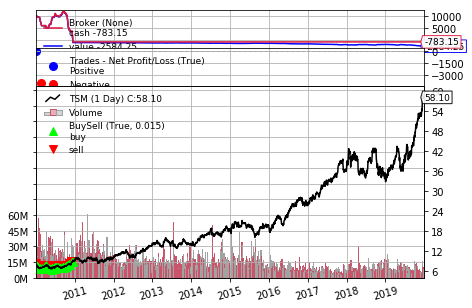

<Figure size 1728x1080 with 0 Axes>

============================================2010-01-04 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.19             0.0        8.26       8.11        8.12   

   Position  Total Reward     Volumns  
0   10000.0           0.0  11452747.0  
============================================2010-01-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.15             0.0        8.24        8.1         8.2   

   Position  Total Reward     Volumns  
0   10000.0           0.0  20335395.0  
============================================2010-01-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.12            0.05        8.21       8.04        8.17   

   Pos

============================================2010-02-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         6.76            0.59        6.86       6.65        6.79   

    Position  Total Reward     Volumns  
0  11981.583      1981.583  47714116.0  
============================================2010-02-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         6.79           -0.17        6.89       6.67        6.86   

    Position  Total Reward     Volumns  
0  11981.413      1981.413  35608415.0  
============================================2010-02-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         6.79            0.07        6.94       6.75        6.86   

  

============================================2010-03-11 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         7.42            -2.2        7.42       7.28        7.32   

    Position  Total Reward     Volumns  
0  11971.033      1971.033  26509329.0  
============================================2010-03-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2          7.3             2.4        7.42       7.25        7.39   

    Position  Total Reward     Volumns  
0  11973.433      1973.433  17864324.0  
============================================2010-03-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.17             2.6        7.25       7.12        7.24   

  

============================================2010-04-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.95     -412.414931        7.95       7.65        7.66   

      Position  Total Reward     Volumns  
0  9969.223414    -30.776586  43351356.0  
============================================2010-04-15 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.87     -650.814931        7.95       7.83        7.91   

      Position  Total Reward     Volumns  
0  9318.408483   -681.591517  12976352.0  
============================================2010-04-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.67     -508.454931        7.78       7.56        7.77 

============================================2010-05-17 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.05           -2.13        7.08       6.83        7.02   

     Position  Total Reward     Volumns  
0  8952.31434   -1047.68566  18263933.0  
============================================2010-05-18 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         6.88      265.993086        7.12       6.82        7.07   

      Position  Total Reward     Volumns  
0  9218.307426   -781.692574  22479429.0  
============================================2010-05-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         6.94      438.983086        7.01       6.83        6.89   


============================================2010-06-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.21             1.8        7.32        7.2        7.24   

       Position  Total Reward     Volumns  
0  11363.792635   1363.792635  12565711.0  
============================================2010-06-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.32           -3.31        7.41       7.27        7.31   

       Position  Total Reward     Volumns  
0  11360.482635   1360.482635  21336474.0  
============================================2010-06-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.13            6.07        7.37       7.12       

============================================2010-07-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.63          -10.86        7.64       7.48        7.48   

       Position  Total Reward     Volumns  
0  11342.992635   1342.992635  18061674.0  
============================================2010-07-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.68           -2.65        7.71       7.57        7.63   

       Position  Total Reward     Volumns  
0  11340.342635   1340.342635  12678809.0  
============================================2010-07-26 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.77     -409.214767        7.77        7.6        7

============================================2010-08-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.01            5.28         7.1       6.95        7.06   

       Position  Total Reward     Volumns  
0  10055.499829     55.499829  24294498.0  
============================================2010-08-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         6.96             2.4        7.01       6.85        6.96   

       Position  Total Reward     Volumns  
0  10057.899829     57.899829  16366668.0  
============================================2010-08-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         6.93            1.49        6.98       6.91       

============================================2010-09-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.27            3.11        7.33       7.26        7.32   

      Position  Total Reward     Volumns  
0  11890.09685    1890.09685  17453887.0  
============================================2010-09-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         7.41           -7.42        7.42       7.24        7.27   

      Position  Total Reward     Volumns  
0  11882.67685    1882.67685  16752714.0  
============================================2010-09-29 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         7.55           -7.55        7.61       7.41        7.42

============================================2010-10-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1          7.9           -4.07        7.99       7.87        7.99   

      Position  Total Reward     Volumns  
0  9596.582574   -403.417426  19208381.0  
============================================2010-10-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.01           -5.95        8.04       7.86        7.89   

      Position  Total Reward     Volumns  
0  9590.632574   -409.367426  17902955.0  
============================================2010-11-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1          8.0            0.55        8.08       7.97        8.0

============================================2010-12-01 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.16     -631.253535        8.18       8.01        8.05   

     Position  Total Reward     Volumns  
0  3882.31734   -6117.68266  30860540.0  
============================================2010-12-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.48     -823.853535        8.51       8.24        8.24   

      Position  Total Reward     Volumns  
0  3058.463806  -6941.536194  37959112.0  
============================================2010-12-03 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         8.79    -1102.703535        8.82       8.48        8.52   


============================================2011-01-04 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.28           -1.47        9.28       9.14        9.26   

     Position  Total Reward     Volumns  
0 -791.416798 -10791.416798  13217317.0  
============================================2011-01-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.08             9.8        9.22       8.99        9.18   

     Position  Total Reward     Volumns  
0 -781.616798 -10781.616798  13309198.0  
============================================2011-01-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.45          -18.13        9.49       9.15        9.18   

 

============================================2011-02-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.04           -1.47       10.09       9.98       10.01   

     Position  Total Reward     Volumns  
0 -828.656798 -10828.656798  21726123.0  
============================================2011-02-08 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.86            8.82        9.99       9.81        9.93   

     Position  Total Reward     Volumns  
0 -819.836798 -10819.836798  16100136.0  
============================================2011-02-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.62           11.76        9.86       9.62        9.74   

============================================2011-03-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.97           -3.43        9.01       8.84        8.85   

     Position  Total Reward     Volumns  
0 -776.226798 -10776.226798  18441599.0  
============================================2011-03-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.93            1.96        8.96       8.83        8.84   

     Position  Total Reward     Volumns  
0 -774.266798 -10774.266798  11710157.0  
============================================2011-03-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.75            8.82        8.76       8.53        8.63   

============================================2011-04-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.01           -1.47        9.09       8.98        9.07   

     Position  Total Reward     Volumns  
0 -778.186798 -10778.186798  15808968.0  
============================================2011-04-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.04           -1.47        9.07       8.94        8.95   

     Position  Total Reward     Volumns  
0 -779.656798 -10779.656798  16098503.0  
============================================2011-04-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.97            3.43        9.04       8.91        9.01   

============================================2011-05-17 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.84            2.94        9.99       9.76        9.89   

     Position  Total Reward     Volumns  
0 -818.856798 -10818.856798  28710478.0  
============================================2011-05-18 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.94            -4.9        10.0        9.9        9.91   

     Position  Total Reward     Volumns  
0 -823.756798 -10823.756798  15014010.0  
============================================2011-05-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.88            2.94        9.95       9.81        9.94   

 

============================================2011-06-20 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.48           -6.86        9.51       9.36        9.42   

     Position  Total Reward     Volumns  
0 -801.216798 -10801.216798  14616393.0  
============================================2011-06-21 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         9.75          -13.23        9.76       9.56        9.58   

     Position  Total Reward     Volumns  
0 -814.446798 -10814.446798  18227473.0  
============================================2011-06-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.49           12.74        9.66       9.48        9.66   


============================================2011-07-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.94          -15.68        9.94       9.65        9.65   

     Position  Total Reward     Volumns  
0 -823.756798 -10823.756798  21472037.0  
============================================2011-07-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.76            8.82        9.81       9.65        9.74   

     Position  Total Reward     Volumns  
0 -814.936798 -10814.936798  31896980.0  
============================================2011-07-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.88           -5.88        9.99        9.8        9.81   

============================================2011-08-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         8.99            3.43        9.03       8.83        9.03   

     Position  Total Reward     Volumns  
0 -777.206798 -10777.206798  18879743.0  
============================================2011-08-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         8.69            14.7        9.03       8.66        8.95   

     Position  Total Reward     Volumns  
0 -762.506798 -10762.506798  23504619.0  
============================================2011-08-26 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.04          -17.15        9.08       8.73        8.73   

============================================2011-09-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1          9.2          -17.15        9.31       8.99         9.0   

     Position  Total Reward     Volumns  
0 -787.496798 -10787.496798  23777356.0  
============================================2011-09-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.01            9.31        9.19       9.01        9.14   

     Position  Total Reward     Volumns  
0 -778.186798 -10778.186798  15135379.0  
============================================2011-09-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.04           -1.47        9.18        8.9        9.15   

============================================2011-10-28 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.75            7.84        9.85       9.73        9.83   

     Position  Total Reward     Volumns  
0 -814.446798 -10814.446798  17085149.0  
============================================2011-10-31 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         9.66            4.41        9.76       9.61        9.67   

     Position  Total Reward     Volumns  
0 -810.036798 -10810.036798  11655390.0  
============================================2011-11-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         9.53            6.37        9.61       9.36        9.45   

============================================2011-12-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.11          -10.78       10.16       9.91        9.91   

     Position  Total Reward     Volumns  
0 -832.086798 -10832.086798  14681078.0  
============================================2011-12-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.04            3.43       10.23      10.02       10.14   

     Position  Total Reward     Volumns  
0 -828.656798 -10828.656798  11352871.0  
============================================2011-12-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.12           -3.92       10.18      10.04       10.16   

============================================2012-01-05 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.15           -4.41       10.17      10.06        10.1   

     Position  Total Reward     Volumns  
0 -834.046798 -10834.046798  13461870.0  
============================================2012-01-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.07            3.92       10.16      10.02       10.16   

     Position  Total Reward     Volumns  
0 -830.126798 -10830.126798  10156781.0  
============================================2012-01-09 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.24           -8.33       10.25      10.05       10.07   



============================================2012-02-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.86            -4.9       10.92      10.73       10.75   

     Position  Total Reward    Volumns  
0 -868.836798 -10868.836798  9094576.0  
============================================2012-02-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.93           -3.43       10.96      10.77       10.87   

     Position  Total Reward     Volumns  
0 -872.266798 -10872.266798  11887894.0  
============================================2012-02-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         10.6           16.17       10.79      10.56       10.78   



============================================2012-03-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        11.38          -17.64       11.38      11.14       11.18   

     Position  Total Reward    Volumns  
0 -894.316798 -10894.316798  8952591.0  
============================================2012-03-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        11.34            1.96       11.57      11.33       11.43   

     Position  Total Reward    Volumns  
0 -892.356798 -10892.356798  8676982.0  
============================================2012-03-15 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        11.44            -4.9        11.5      11.33       11.43   

  

============================================2012-04-16 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.56             0.0       11.74      11.51       11.68   

     Position  Total Reward    Volumns  
0 -903.136798 -10903.136798  8287341.0  
============================================2012-04-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.64           -3.92       11.68      11.49        11.6   

     Position  Total Reward     Volumns  
0 -907.056798 -10907.056798  14477443.0  
============================================2012-04-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         11.7           -2.94       11.76      11.47       11.61   



============================================2012-05-17 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        11.25            8.33       11.43      11.23       11.35   

     Position  Total Reward     Volumns  
0 -887.946798 -10887.946798  14729149.0  
============================================2012-05-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.93           15.68       11.35      10.93       11.21   

     Position  Total Reward     Volumns  
0 -872.266798 -10872.266798  16553655.0  
============================================2012-05-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.04           -5.39       11.09      10.98       11.01   


============================================2012-06-20 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        10.82           -0.98       10.87      10.72       10.77   

     Position  Total Reward    Volumns  
0 -866.876798 -10866.876798  7307820.0  
============================================2012-06-21 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         10.4           20.58       10.75      10.36       10.71   

     Position  Total Reward     Volumns  
0 -846.296798 -10846.296798  16767087.0  
============================================2012-06-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        10.59           -9.31       10.63      10.47        10.5   

 

============================================2012-07-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.24           -5.39       10.24       10.0       10.04   

     Position  Total Reward     Volumns  
0 -838.456798 -10838.456798  23033806.0  
============================================2012-07-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.32           -3.92       10.43      10.19        10.2   

     Position  Total Reward     Volumns  
0 -842.376798 -10842.376798  25117960.0  
============================================2012-07-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        10.59          -13.23       10.65       10.4        10.4   

============================================2012-08-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.39           -1.47       11.45      11.24       11.37   

     Position  Total Reward    Volumns  
0 -894.806798 -10894.806798  9720302.0  
============================================2012-08-27 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         11.4           -0.49       11.48      11.33       11.46   

     Position  Total Reward    Volumns  
0 -895.296798 -10895.296798  8683334.0  
============================================2012-08-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        11.35            2.45       11.42      11.31       11.36   

  

============================================2012-09-27 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        12.37          -23.52       12.38      12.02       12.02   

     Position  Total Reward     Volumns  
0 -942.826798 -10942.826798  27847227.0  
============================================2012-09-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        12.54           -8.33       12.55      12.35       12.37   

     Position  Total Reward     Volumns  
0 -951.156798 -10951.156798  23072653.0  
============================================2012-10-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        12.61           -3.43       12.64      12.45       12.47   

============================================2012-11-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        12.77           -7.84       12.85      12.57       12.68   

     Position  Total Reward    Volumns  
0 -962.426798 -10962.426798  9961700.0  
============================================2012-11-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         12.5           13.23       12.82      12.49       12.82   

     Position  Total Reward    Volumns  
0 -949.196798 -10949.196798  8799994.0  
============================================2012-11-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        12.59           -4.41        12.6       12.5       12.56   

  

============================================2012-12-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.45           -8.33       13.57      13.38       13.44   

     Position  Total Reward     Volumns  
0 -995.746798 -10995.746798  14938702.0  
============================================2012-12-06 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.52           -3.43       13.52      13.43       13.46   

     Position  Total Reward    Volumns  
0 -999.176798 -10999.176798  9163224.0  
============================================2012-12-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         13.5            0.98       13.75      13.48       13.69   



============================================2013-01-09 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.91             0.0       14.22       13.8       14.08   

      Position  Total Reward     Volumns  
0 -1018.286798 -11018.286798  16367279.0  
============================================2013-01-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.41           -24.5       14.45      14.03       14.12   

      Position  Total Reward     Volumns  
0 -1042.786798 -11042.786798  19892119.0  
============================================2013-01-11 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.39            0.98       14.43      14.21       14.34  

============================================2013-02-12 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.67           -0.98       14.69      14.54       14.59   

      Position  Total Reward    Volumns  
0 -1055.526798 -11055.526798  6140095.0  
============================================2013-02-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         14.6            3.43       14.71      14.55       14.68   

      Position  Total Reward    Volumns  
0 -1052.096798 -11052.096798  8181874.0  
============================================2013-02-14 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.72           -5.88       14.73      14.57       14.61   


============================================2013-03-18 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.67           15.68       13.84      13.64       13.84   

      Position  Total Reward     Volumns  
0 -1006.526798 -11006.526798  17370827.0  
============================================2013-03-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.54            6.37       13.67      13.48       13.65   

      Position  Total Reward     Volumns  
0 -1000.156798 -11000.156798  15476234.0  
============================================2013-03-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.68           -6.86       13.74      13.56       13.5

============================================2013-04-19 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.91          -33.81       15.05      14.71       14.76   

      Position  Total Reward     Volumns  
0 -1067.286798 -11067.286798  26635833.0  
============================================2013-04-22 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.67           11.76       14.88      14.55       14.77   

      Position  Total Reward     Volumns  
0 -1055.526798 -11055.526798  25698752.0  
============================================2013-04-23 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.49            8.82       14.68      14.38       14.54

============================================2013-05-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.98           13.23       15.28      14.93       15.22   

      Position  Total Reward     Volumns  
0 -1070.716798 -11070.716798  15804021.0  
============================================2013-05-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.87            5.39       14.94      14.59       14.71   

      Position  Total Reward     Volumns  
0 -1065.326798 -11065.326798  13909802.0  
============================================2013-05-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.95           -3.92       14.96      14.79       14.8

============================================2013-06-25 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         13.9          -23.52       13.93      13.59       13.63   

      Position  Total Reward     Volumns  
0 -1017.796798 -11017.796798  14628318.0  
============================================2013-06-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.99           -4.41       14.04      13.87       13.92   

      Position  Total Reward     Volumns  
0 -1022.206798 -11022.206798  11587531.0  
============================================2013-06-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.22          -11.27       14.37      14.13       14.1

============================================2013-07-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.61            7.84       13.74      13.59       13.73   

      Position  Total Reward    Volumns  
0 -1003.586798 -11003.586798  7341855.0  
============================================2013-07-30 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.83          -10.78       13.96      13.77       13.87   

      Position  Total Reward     Volumns  
0 -1014.366798 -11014.366798  10552660.0  
============================================2013-07-31 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.84           -0.49       13.94      13.83        13.9 

============================================2013-08-29 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.59          -16.66       13.65      13.41       13.41   

      Position  Total Reward     Volumns  
0 -1002.606798 -11002.606798  12224810.0  
============================================2013-08-30 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         13.5            4.41       13.94      13.46       13.68   

     Position  Total Reward     Volumns  
0 -998.196798 -10998.196798  14098312.0  
============================================2013-09-03 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        13.77          -13.23       14.04      13.71        13.9   

============================================2013-10-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.24           -1.96       14.25      14.02       14.18   

      Position  Total Reward    Volumns  
0 -1034.456798 -11034.456798  9279528.0  
============================================2013-10-03 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.43           -9.31       14.55      14.28       14.48   

      Position  Total Reward     Volumns  
0 -1043.766798 -11043.766798  13062358.0  
============================================2013-10-04 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.41            0.98       14.47       14.3       14.34   

============================================2013-11-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.95             4.9       15.12      14.88       15.08   

      Position  Total Reward    Volumns  
0 -1069.246798 -11069.246798  9949713.0  
============================================2013-11-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.74           10.29       14.81       14.7       14.78   

      Position  Total Reward     Volumns  
0 -1058.956798 -11058.956798  11491436.0  
============================================2013-11-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.89           -7.35       14.92      14.69       14.74 

============================================2013-12-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.36           -8.82       14.38      14.26       14.28   

      Position  Total Reward    Volumns  
0 -1040.336798 -11040.336798  8435723.0  
============================================2013-12-09 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.32            1.96       14.44      14.24       14.43   

      Position  Total Reward     Volumns  
0 -1038.376798 -11038.376798  11165790.0  
============================================2013-12-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        14.16            7.84       14.25      14.12       14.21   


============================================2014-01-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        13.77           -5.39       13.86      13.71       13.72   

      Position  Total Reward     Volumns  
0 -1011.426798 -11011.426798  13678557.0  
============================================2014-01-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        13.78           -0.49       13.97      13.77       13.86   

      Position  Total Reward     Volumns  
0 -1011.916798 -11011.916798  12621007.0  
============================================2014-01-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.16          -18.62       14.17      13.89        13.

0 -1030.536798 -11030.536798  8543331.0  
============================================2014-02-13 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        14.22           -2.94       14.28      14.06       14.06   

      Position  Total Reward    Volumns  
0 -1033.476798 -11033.476798  8054740.0  
============================================2014-02-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        14.58          -17.64       14.64      14.34       14.35   

      Position  Total Reward     Volumns  
0 -1051.116798 -11051.116798  13828128.0  
============================================2014-02-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         14.5          

============================================2014-03-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        15.39           11.76       15.57       15.3       15.55   

      Position  Total Reward     Volumns  
0 -1090.806798 -11090.806798  13002236.0  
============================================2014-03-20 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        15.36            1.47       15.36      15.05       15.12   

      Position  Total Reward     Volumns  
0 -1089.336798 -11089.336798  16103344.0  
============================================2014-03-21 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         15.1           12.74       15.36      15.01       15.31  

============================================2014-04-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.76             0.0       16.77      16.59       16.61   

      Position  Total Reward     Volumns  
0 -1157.936798 -11157.936798  13731562.0  
============================================2014-04-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.63            6.37       16.67      16.54        16.6   

      Position  Total Reward     Volumns  
0 -1151.566798 -11151.566798  11081862.0  
============================================2014-04-24 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.76           -6.37       16.79      16.51       16.6

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        16.84           -0.98       16.89      16.75       16.89   

      Position  Total Reward    Volumns  
0 -1161.856798 -11161.856798  8809466.0  
============================================2014-05-27 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        17.03           -9.31       17.08      16.87       16.98   

      Position  Total Reward    Volumns  
0 -1171.166798 -11171.166798  9227381.0  
============================================2014-05-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         17.0            1.47       17.13      16.96       17.07   

      Position  Total Reward    Volumns  
0 -1169.696798 -11169.696798  9522843.0  
=====================================

============================================2014-06-26 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.13            0.49       17.24      17.04       17.16   

      Position  Total Reward    Volumns  
0 -1176.066798 -11176.066798  6352282.0  
============================================2014-06-27 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.34          -10.29       17.36      17.21       17.26   

      Position  Total Reward    Volumns  
0 -1186.356798 -11186.356798  7136211.0  
============================================2014-06-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.43           -4.41       17.48      17.34        17.4   



============================================2014-07-30 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.26           -7.35       17.31      17.17       17.28   

      Position  Total Reward     Volumns  
0 -1182.436798 -11182.436798  11950027.0  
============================================2014-07-31 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.66            29.4        16.9       16.6       16.81   

      Position  Total Reward     Volumns  
0 -1153.036798 -11153.036798  19600602.0  
============================================2014-08-01 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        16.83           -8.33       16.91      16.69       16.69

============================================2014-09-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.56           -5.39       17.71      17.49       17.51   

      Position  Total Reward    Volumns  
0 -1197.136798 -11197.136798  9741313.0  
============================================2014-09-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.79          -11.27       17.81      17.64       17.73   

      Position  Total Reward     Volumns  
0 -1208.406798 -11208.406798  11821494.0  
============================================2014-09-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.66            6.37       17.81      17.65       17.76 

============================================2014-10-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.36          -22.05       17.41      17.11       17.17   

      Position  Total Reward     Volumns  
0 -1187.336798 -11187.336798  23461053.0  
============================================2014-10-06 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.35            0.49       17.42      17.25       17.41   

      Position  Total Reward     Volumns  
0 -1186.846798 -11186.846798  23768286.0  
============================================2014-10-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.98           18.13       17.28      16.96       17.24

============================================2014-11-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.36           -3.43       18.48       18.2       18.38   

      Position  Total Reward     Volumns  
0 -1236.336798 -11236.336798  10794546.0  
============================================2014-11-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.16             9.8       18.38       18.1       18.36   

      Position  Total Reward    Volumns  
0 -1226.536798 -11226.536798  8139863.0  
============================================2014-11-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.18           -0.98       18.22      18.01       18.18 

============================================2014-12-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.81           -2.94       18.83      18.39       18.56   

      Position  Total Reward     Volumns  
0 -1258.386798 -11258.386798  11529144.0  
============================================2014-12-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.49           15.68       18.71      18.47       18.71   

      Position  Total Reward     Volumns  
0 -1242.706798 -11242.706798  12079763.0  
============================================2014-12-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.45            1.96       18.64      18.26       18.3

============================================2015-01-13 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.54          -10.78       17.75      17.49       17.51   

      Position  Total Reward     Volumns  
0 -1196.156798 -11196.156798  13253245.0  
============================================2015-01-14 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        17.55           -0.49       17.58      17.16       17.21   

      Position  Total Reward     Volumns  
0 -1196.646798 -11196.646798  26115009.0  
============================================2015-01-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.07          -74.48       19.27      18.26       18.82 

============================================2015-02-17 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.64            2.94       20.74      20.56       20.57   

      Position  Total Reward     Volumns  
0 -1348.056798 -11348.056798  12631940.0  
============================================2015-02-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.59            2.45       20.71      20.51       20.57   

      Position  Total Reward    Volumns  
0 -1345.606798 -11345.606798  8920667.0  
============================================2015-02-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.43            7.84       20.59      20.38       20.56  

============================================2015-03-20 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.64           -4.41       20.75      20.56       20.66   

      Position  Total Reward    Volumns  
0 -1348.056798 -11348.056798  8637196.0  
============================================2015-03-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.66           -0.98       20.79      20.62       20.73   

      Position  Total Reward     Volumns  
0 -1349.036798 -11349.036798  10934240.0  
============================================2015-03-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.41           12.25       20.58      20.37       20.51 

============================================2015-04-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.25          -19.11       20.35      19.75       19.86   

      Position  Total Reward     Volumns  
0 -1328.946798 -11328.946798  27570886.0  
============================================2015-04-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.76          -24.99       21.09      20.57       20.99   

      Position  Total Reward     Volumns  
0 -1353.936798 -11353.936798  34181788.0  
============================================2015-04-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        21.17          -20.09       21.47      20.64       20.7

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         20.5          -14.21       20.58      20.08       20.14   

      Position  Total Reward     Volumns  
0 -1341.196798 -11341.196798  17235148.0  
============================================2015-05-28 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.37            6.37       20.54       20.3       20.41   

      Position  Total Reward     Volumns  
0 -1334.826798 -11334.826798  12501246.0  
============================================2015-05-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.23            6.86       20.36      19.95       20.04   

      Position  Total Reward     Volumns  
0 -1327.966798 -11327.966798  15805675.0  
===============================

============================================2015-06-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.24           22.05       19.72      19.22       19.49   

      Position  Total Reward     Volumns  
0 -1279.456798 -11279.456798  16863121.0  
============================================2015-06-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.52          -13.72       19.88      19.49       19.65   

      Position  Total Reward     Volumns  
0 -1293.176798 -11293.176798  18424772.0  
============================================2015-07-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.71           -9.31       19.97      19.64       19.8

============================================2015-07-31 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         19.0           24.99       19.43      18.94       19.38   

      Position  Total Reward     Volumns  
0 -1267.696798 -11267.696798  18979721.0  
============================================2015-08-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.67           16.17       18.82       18.5       18.82   

      Position  Total Reward     Volumns  
0 -1251.526798 -11251.526798  13897926.0  
============================================2015-08-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.44           11.27       18.84      18.34       18.7

============================================2015-09-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.14          -22.54       17.25      16.89       16.93   

      Position  Total Reward     Volumns  
0 -1176.556798 -11176.556798  17068346.0  
============================================2015-09-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        17.25           -5.39        17.4      17.21       17.32   

      Position  Total Reward    Volumns  
0 -1181.946798 -11181.946798  9510801.0  
============================================2015-09-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        16.91           16.66       17.04      16.85       16.93 

============================================2015-10-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.25            6.86       18.36      18.02        18.1   

      Position  Total Reward     Volumns  
0 -1230.946798 -11230.946798  12306255.0  
============================================2015-10-07 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        18.85           -29.4        19.0      18.59       18.63   

      Position  Total Reward     Volumns  
0 -1260.346798 -11260.346798  15877241.0  
============================================2015-10-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.12          -13.23       19.14      18.63       18.72

============================================2015-11-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.61            6.86       19.62      19.28       19.42   

      Position  Total Reward     Volumns  
0 -1297.586798 -11297.586798  10244917.0  
============================================2015-11-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.74           -6.37       19.75      19.49       19.55   

      Position  Total Reward     Volumns  
0 -1303.956798 -11303.956798  10039341.0  
============================================2015-11-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.35           19.11       19.49      19.19       19.3

============================================2015-12-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        19.47            3.43       19.64      19.43       19.53   

      Position  Total Reward    Volumns  
0 -1290.726798 -11290.726798  8343897.0  
============================================2015-12-11 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        19.06           20.09       19.39      19.05       19.27   

      Position  Total Reward     Volumns  
0 -1270.636798 -11270.636798  13177187.0  
============================================2015-12-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         19.1           -1.96       19.26      18.97       19.19  

============================================2016-01-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.76          -56.84        18.8      17.79       17.82   

      Position  Total Reward     Volumns  
0 -1255.936798 -11255.936798  21741433.0  
============================================2016-01-15 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.14           30.38       18.29      17.67       17.67   

      Position  Total Reward     Volumns  
0 -1225.556798 -11225.556798  14037998.0  
============================================2016-01-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        18.62          -23.52       18.74      18.25       18.5

============================================2016-02-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.46           -6.86       20.79      20.42       20.61   

      Position  Total Reward     Volumns  
0 -1339.236798 -11339.236798  14868678.0  
============================================2016-02-19 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        20.44            0.98       20.65      20.21       20.46   

      Position  Total Reward     Volumns  
0 -1338.256798 -11338.256798  10412914.0  
============================================2016-02-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        20.59           -7.35       20.74       20.5       20.65

============================================2016-03-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        22.18            5.39        22.4      22.06       22.14   

      Position  Total Reward    Volumns  
0 -1423.516798 -11423.516798  7268320.0  
============================================2016-03-23 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        22.07            5.39       22.19      21.95       22.19   

      Position  Total Reward    Volumns  
0 -1418.126798 -11418.126798  6359111.0  
============================================2016-03-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        22.12           -2.45       22.13      21.87       21.94   

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         21.5            2.45       21.77      21.45       21.62   

      Position  Total Reward    Volumns  
0 -1390.196798 -11390.196798  9042644.0  
============================================2016-04-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         21.5             0.0       21.79      21.47       21.66   

      Position  Total Reward     Volumns  
0 -1390.196798 -11390.196798  11541079.0  
============================================2016-04-27 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2         21.7            -9.8       21.78      21.33        21.4   

      Position  Total Reward    Volumns  
0 -1399.996798 -11399.996798  8495490.0  
===================================

============================================2016-05-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        21.31           -7.35       21.42      21.14       21.32   

      Position  Total Reward    Volumns  
0 -1380.886798 -11380.886798  9545472.0  
============================================2016-05-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        21.32           -0.49        21.5       21.3       21.43   

      Position  Total Reward    Volumns  
0 -1381.376798 -11381.376798  6260686.0  
============================================2016-05-31 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        21.25            3.43       21.36      21.08       21.34   

============================================2016-06-29 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        23.02          -23.52       23.17       22.9       22.91   

      Position  Total Reward    Volumns  
0 -1464.676798 -11464.676798  9817117.0  
============================================2016-06-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         23.4          -18.62       23.57      23.04       23.26   

      Position  Total Reward     Volumns  
0 -1483.296798 -11483.296798  10946153.0  
============================================2016-07-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        23.67          -13.23       23.78      23.63       23.76 

============================================2016-08-02 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        25.12           20.09       25.42      25.03       25.42   

      Position  Total Reward    Volumns  
0 -1567.576798 -11567.576798  6824322.0  
============================================2016-08-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        25.12             0.0        25.2       24.9       25.05   

      Position  Total Reward    Volumns  
0 -1567.576798 -11567.576798  4339948.0  
============================================2016-08-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        25.34          -10.78       25.36      25.09       25.18   


============================================2016-09-02 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         26.0           -7.84       26.06       25.9       25.96   

      Position  Total Reward    Volumns  
0 -1610.696798 -11610.696798  6781394.0  
============================================2016-09-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.31          -15.19       26.52      26.14       26.33   

      Position  Total Reward    Volumns  
0 -1625.886798 -11625.886798  7210456.0  
============================================2016-09-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         26.6          -14.21       27.26      26.57       27.08   

============================================2016-10-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.45          -10.29       27.49       27.1       27.39   

      Position  Total Reward    Volumns  
0 -1681.746798 -11681.746798  4595391.0  
============================================2016-10-07 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        27.82          -18.13       27.84      27.35       27.55   

      Position  Total Reward    Volumns  
0 -1699.876798 -11699.876798  6448724.0  
============================================2016-10-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.91           -4.41       28.09       27.8       27.83   

============================================2016-11-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.96            0.49        28.1      27.67       27.84   

      Position  Total Reward    Volumns  
0 -1706.736798 -11706.736798  4569836.0  
============================================2016-11-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.29           32.83       27.65      27.04       27.34   

      Position  Total Reward     Volumns  
0 -1673.906798 -11673.906798  10083992.0  
============================================2016-11-10 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        26.27           49.98       27.26       26.2       27.26  

============================================2016-12-12 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.68            9.31       26.74      26.44       26.74   

      Position  Total Reward    Volumns  
0 -1644.016798 -11644.016798  3842289.0  
============================================2016-12-13 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        27.09          -20.09       27.34      26.79       26.82   

      Position  Total Reward    Volumns  
0 -1664.106798 -11664.106798  6565630.0  
============================================2016-12-14 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.65           21.56       27.11      26.63        27.0   

============================================2017-01-17 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.43           -7.84       26.45      26.28       26.42   

      Position  Total Reward    Volumns  
0 -1631.766798 -11631.766798  8607938.0  
============================================2017-01-18 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.31            5.88       26.48      26.27       26.36   

      Position  Total Reward    Volumns  
0 -1625.886798 -11625.886798  8622509.0  
============================================2017-01-19 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        26.44           -6.37       26.49      26.22       26.31   

   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        28.85           -0.49       28.89      28.57       28.64   

      Position  Total Reward    Volumns  
0 -1750.346798 -11750.346798  8426808.0  
============================================2017-02-21 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        28.84            0.49       28.97       28.7        28.9   

      Position  Total Reward    Volumns  
0 -1749.856798 -11749.856798  6137126.0  
============================================2017-02-22 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        28.61           11.27       28.73      28.47       28.73   

      Position  Total Reward    Volumns  
0 -1738.586798 -11738.586798  5936270.0  
=====================================

============================================2017-03-23 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        29.05            5.88       29.14      28.88       28.97   

      Position  Total Reward    Volumns  
0 -1760.146798 -11760.146798  6624138.0  
============================================2017-03-24 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        29.27          -10.78       29.53      29.09        29.2   

      Position  Total Reward    Volumns  
0 -1770.926798 -11770.926798  6612929.0  
============================================2017-03-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        29.59          -15.68       29.67      29.25       29.31   

============================================2017-04-26 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        29.44            2.94       29.54      29.28        29.5   

      Position  Total Reward    Volumns  
0 -1779.256798 -11779.256798  6756174.0  
============================================2017-04-27 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        29.46           -0.98       29.71      29.45       29.54   

      Position  Total Reward    Volumns  
0 -1780.236798 -11780.236798  6305479.0  
============================================2017-04-28 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0         29.5           -1.96       29.66      29.48       29.58   


============================================2017-05-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        31.92          -11.76       31.95      31.65       31.83   

      Position  Total Reward    Volumns  
0 -1900.776798 -11900.776798  4729222.0  
============================================2017-05-31 23:59:59.999989============================================
Buying
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       0        31.55           18.13       31.55      31.32       31.51   

      Position  Total Reward    Volumns  
0 -1882.646798 -11882.646798  8589220.0  
============================================2017-06-01 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        32.02          -23.03       32.05       31.7       31.85   


============================================2017-06-30 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        32.21           -6.86       32.33      31.97        32.1   

      Position  Total Reward    Volumns  
0 -1914.986798 -11914.986798  5620055.0  
============================================2017-07-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        32.13            3.92        32.4      32.09       32.28   

      Position  Total Reward    Volumns  
0 -1911.066798 -11911.066798  4852732.0  
============================================2017-07-05 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        32.08            2.45       32.32       31.9       32.32   

============================================2017-08-03 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        32.97           12.74       33.27      32.84       33.27   

      Position  Total Reward    Volumns  
0 -1952.226798 -11952.226798  4254851.0  
============================================2017-08-04 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        33.19          -10.78       33.24      32.94        33.1   

      Position  Total Reward    Volumns  
0 -1963.006798 -11963.006798  4419409.0  
============================================2017-08-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        33.89           -34.3       33.92       33.4        33.4   

============================================2017-09-06 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        34.34          -19.11       34.43      34.09       34.14   

      Position  Total Reward    Volumns  
0 -2019.356798 -12019.356798  4545650.0  
============================================2017-09-07 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        34.58          -11.76       34.58      34.25       34.31   

      Position  Total Reward    Volumns  
0 -2031.116798 -12031.116798  3905002.0  
============================================2017-09-08 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        34.55            1.47       34.71      34.41       34.61   

============================================2017-10-09 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        35.72          -14.21       35.75      35.47       35.56   

      Position  Total Reward    Volumns  
0 -2086.976798 -12086.976798  2131334.0  
============================================2017-10-10 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1         35.9           -8.82       36.08      35.76       36.03   

      Position  Total Reward    Volumns  
0 -2095.796798 -12095.796798  4463480.0  
============================================2017-10-11 23:59:59.999989============================================
Selling
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       1        37.17          -62.23       37.21      36.56       36.67   

============================================2017-11-09 23:59:59.999989============================================
Holding
   Action  Close Price  Current Reward  High Price  Low Price  Open Price  \
0       2        38.36           35.77        38.9      38.04       38.82   

      Position  Total Reward    Volumns  
0 -2216.336798 -12216.336798  5080140.0  


In [ ]:
## Taiwan Market ##
#Batch
I_Am_Trading_Instance.Function_Batch_MovingAverage(
    Trading_Object_Name_List = ["TSM"], 
    Trading_Level_Multiplier_List = [1000],
    Customization_Parameter1_Interval = [0,10], 
    Customization_Parameter2_Interval = [0,10])